In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib import gridspec
from matplotlib import patches

import os
import math
import random

from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle
from sklearn import preprocessing
from sklearn.metrics import roc_curve, roc_auc_score, auc

import scipy.stats as st
from scipy.stats import poisson
from scipy.interpolate import interp1d
from scipy.stats import norm
from scipy.stats import multivariate_normal

In [2]:
from sklearn.neighbors import KernelDensity # paquete necesario
from sklearn.model_selection import GridSearchCV

import scipy.integrate as integrate

In [3]:
!pip install xgboost

import xgboost
from xgboost import XGBRegressor, XGBClassifier

### FUNCTIONS

In [4]:
def XG(X_train, X_test, X_val, Y_train, Y_test, Y_val, n_estimators=500,
        learning_rate=0.1,
        reg_lambda=0.0,reg_alpha=0.0,
        gamma=0.0,objective='binary:logistic',
        max_depth=5,
        early_stopping_rounds=50):
    
    # CLASSIFIER
    classifier = XGBClassifier(
        n_estimators=n_estimators,
        learning_rate=learning_rate,
        reg_lambda=reg_lambda,reg_alpha=reg_alpha,
        gamma=gamma,objective='binary:logistic',
        max_depth=max_depth)

    # FIT
    classifier.fit(X_train,Y_train,eval_set=[(X_train, Y_train), (X_val, Y_val)],
            eval_metric='logloss',early_stopping_rounds=early_stopping_rounds,#early stopping
            verbose=True)

    # PREDICTIONS
    y_pred_xg = classifier.predict_proba(X_test).T[1]


    # ROC
    fpr_xg, tpr_xg, _ = roc_curve(Y_test, y_pred_xg)
    roc_auc_xg = auc(fpr_xg, tpr_xg)


    # PLOT THE ROC WITH AUC
    fig = plt.figure(figsize=(6, 6))
    gs = gridspec.GridSpec(1, 1) 
    ax0 = plt.subplot(gs[0])
    ax0.yaxis.set_ticks_position('both')
    ax0.xaxis.set_ticks_position('both')
    ax0.tick_params(direction="in",which="both")
    plt.xticks(fontsize=16)
    plt.yticks(fontsize=16)
    ax0.minorticks_on()


    plt.plot(tpr_xg,1-fpr_xg,label="$f_{1}$, AUC = %0.2f" % roc_auc_xg,color="orange",ls=":",lw=4)
    plt.plot([1,0],[0,1],ls=":",color="grey")
    plt.xlabel("True Positive Rate",fontsize=16)
    plt.ylabel("1 $-$ False Positive Rate",fontsize=16)
    plt.legend()
    plt.title(r"XGBoost",fontsize=16)
    plt.xlim([0,1])
    plt.ylim([0,1])
    plt.yticks([0.2,0.4,0.6,0.8,1.])
    plt.legend(frameon=False,fontsize=16)
    plt.show()
    
    return roc_auc_xg, y_pred_xg

In [5]:
def ensembler(B_expected, S_expected, n_ensembles):
    
    # to construct ensembles B and S events are taken from Poisson distributions
    mu = S_expected + B_expected


    # Letś find the number of events per ensemble such that we get at least one ensemble populated if events are taken from a Poisson distribution

    # around the mean its populated so let's try (proposed range to be checked)
    list_events_per_ensembles = [i for i in range(int(mu*0.8),int(mu*1.2))]
    to_check = len(list_events_per_ensembles)

    # I want at least one ensemble populated
    list_nums_ensembles = [ round( poisson.pmf(list_events_per_ensembles[i],mu)*n_ensembles ) for i in range(len(list_events_per_ensembles)) ]



    # Remove from the list the elements without at least 1 ensemble possible
    for i in range(len(list_events_per_ensembles)):
        if list_nums_ensembles[i] > 1:
            list_events_per_ensembles = list_events_per_ensembles[i:]
            list_nums_ensembles = list_nums_ensembles[i:]
            break


    for i in range(len(list_events_per_ensembles)):
        if list_nums_ensembles[i] < 1:
            list_events_per_ensembles = list_events_per_ensembles[:i]
            list_nums_ensembles = list_nums_ensembles[:i]
            break

    print('\n If ', to_check, ' = ', len(list_events_per_ensembles), '   then the proposed range has to be extended')

    print('n_ensembles (actual): ', sum(list_nums_ensembles))



    # lists of S and B events per ensemble, w.r.t the total of number of events per ensemble found above:

    p_berno = S_expected/(S_expected+B_expected)

    list_S_per_ensembles = []
    list_B_per_ensembles = []

    for jj in range(len(list_events_per_ensembles)):
        list_S_per_ensembles.append( round(p_berno * list_events_per_ensembles[jj]) )
        list_B_per_ensembles.append( list_events_per_ensembles[jj] - round(p_berno * list_events_per_ensembles[jj]) )

    ######
    # NOW I HAVE 4 LISTS:
    # list_events_per_ensembles     list with the number of events per ensemble (its a range)
    # list_nums_ensembles           list with the number of ensembles, w.r.t the 1st list
    # list_S_per_ensembles          list with the number of signal events in each ensembles, w.r.t the 1st list
    # list_B_per_ensembles          list with the number of background events in each ensembles, w.r.t the 1st list
    ######
    
    return list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles

In [6]:
def jitter(a_series, noise_reduction=1000000):
    return (np.random.random(len(a_series))*a_series.std()/noise_reduction)-(a_series.std()/(2*noise_reduction))

In [7]:
def Z_BL_full(B_data, S_data, B_expected, S_expected, bins, ranges, linear_bins=True):
    
    # Les't use an integer number of possible ensembles
    N_ensembles_back = int(len(B_data) / B_expected)
    N_events_back = N_ensembles_back * B_expected

    N_ensembles_sig = int(len(S_data) / S_expected)
    N_events_sig = N_ensembles_sig * S_expected
    
    
    #Let's find out the expected number of B and S events in each bin:
    
    if linear_bins==False:
        # same number of B events per bin
        bin_edges_same = pd.qcut(pd.DataFrame(B_data[:N_events_back])[0] + jitter(pd.DataFrame(B_data[:N_events_back])[0]), q = bins, precision=0, retbins = True)[1]
        bins = [bin_edges_same]

    # bin the parameter space of all background events
    hist_back, binedges_back = np.histogramdd(B_data[:N_events_back], bins=bins, range = ranges)
    # now divide by the number of possible ensembles
    back_prom = hist_back.T.ravel()/N_ensembles_back

    # same for signal
    hist_sig, binedges_sig = np.histogramdd(S_data[:N_events_sig], bins=bins, range = ranges)
    sig_prom = hist_sig.T.ravel()/N_ensembles_sig
    
    
    # If a bins has no expected background events replace that zero for the minimum B_bin=/=0

    # find the minimum
    back_prom_noceros = []
    for i in range(len(back_prom)):
        if back_prom[i]!=0:
            back_prom_noceros.append(back_prom[i])

    min_back = min(back_prom_noceros)

    # replace the zeros
    for i in range(len(back_prom)):
        if back_prom[i]==0:
            back_prom[i] = min_back

    # then the signif Z^binned-Asimov:
    Z_bins = ( 2* sum( ( back_prom * np.log( back_prom/(sig_prom + back_prom) ) ) + sig_prom ) )**0.5
    
    return Z_bins

In [8]:
def KDE_finder(B_data, S_data, events_to_fit=20000, bandwidth_space=np.logspace(-3.0, 0.05, 20), set_kernel='epanechnikov'):

    kde = KernelDensity(kernel=set_kernel)
    grid = GridSearchCV(kde, {'bandwidth': bandwidth_space})
    grid.fit(np.c_[B_data[:events_to_fit]])

    B_bandwidth = grid.best_estimator_.bandwidth



    kde = KernelDensity(kernel=set_kernel)
    grid = GridSearchCV(kde, {'bandwidth': bandwidth_space})
    grid.fit(np.c_[S_data[:events_to_fit]])

    S_bandwidth = grid.best_estimator_.bandwidth



    # with each calculated bandwidth estimate the pdf with KDE to the classifier output (for background and signal)
    # notice: epanechnikov kernel
    kde_bkg = KernelDensity(kernel=set_kernel, bandwidth=B_bandwidth).fit(np.c_[B_data, np.zeros(len(B_data)) ])
    kde_sig = KernelDensity(kernel=set_kernel, bandwidth=S_bandwidth).fit(np.c_[S_data, np.ones(len(S_data)) ])

    print('KDE Kernel: ', set_kernel)
    print('Background bandwidth: ', B_bandwidth)
    print('Signal bandwidth: ', S_bandwidth)
    
    return kde_bkg, kde_sig, B_bandwidth, S_bandwidth

In [9]:
def Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles):
    
    muhat_selected_list = []
    q_muhat = []
    q_muhat_mu0 = []
    
    for bb in range(len(list_nums_ensembles)):

        for kk in range(list_nums_ensembles[bb]):

            ran_ind = np.random.choice(indices, list_B_per_ensembles[bb])
            
            prob_B_given_B_shuf = []
            prob_B_given_S_shuf = []

            for i in ran_ind:
                prob_B_given_B_shuf.append(prob_B_given_B[i])
                prob_B_given_S_shuf.append(prob_B_given_S[i])

            prob_B_given_B_shuf  = prob_B_given_B_shuf
            prob_B_given_S_shuf  = prob_B_given_S_shuf

                

            # p_b(x_ensemble) =    concatenate: p_b(B_ensemble) and p_b(S_ensemble)
            prob_x_given_B = prob_B_given_B_shuf #+ prob_NP_given_B_shuf

            # p_s(x_ensemble) =    concatenate: p_s(B_ensemble) and p_s(S_ensemble)
            prob_x_given_S = prob_B_given_S_shuf #+ prob_NP_given_S_shuf
            



            
            # NOW WE HAVE p_{s,b}(x_ensemble) for this particular ensemble
            # WE NEED TO ESTIMATE mu_hat for this particular ensemble
            # we are going to obtain a mu_hat with a grid of values for this particular ensemble

            B_prob_x_given_B = [x * B_expected for x in prob_x_given_B]
            
            sum_muhat_zero = sum ( [(x*1.) / ( (x * 0. * S_expected) + y ) for x, y in zip(prob_x_given_S, B_prob_x_given_B)] )
            sum_muhat_one = sum ( [(x*1.) / ( (x * 1. * S_expected) + y ) for x, y in zip(prob_x_given_S, B_prob_x_given_B)] )

            # grid, mu_hat is around 1
            muhat_test = np.arange(0., 1., 0.05).tolist()

            muhat_selected = 0.0

            if sum_muhat_zero < sum_muhat_one and sum_muhat_zero < 1:

                for vv in range(len(muhat_test)):

                    mu_hat_condition_equal_1 = sum ( [(x*1.) / ( (x * muhat_test[vv] * S_expected) + y ) for x, y in zip(prob_x_given_S, B_prob_x_given_B)] )

                    if mu_hat_condition_equal_1 > 1:
                        muhat_selected = muhat_test[vv]
                        break

            elif sum_muhat_zero > sum_muhat_one and sum_muhat_zero > 1:

                for vv in range(len(muhat_test)):

                    mu_hat_condition_equal_1 = sum ( [(x*1.) / ( (x * muhat_test[vv] * S_expected) + y ) for x, y in zip(prob_x_given_S, B_prob_x_given_B)] )

                    if mu_hat_condition_equal_1 < 1:
                        muhat_selected = muhat_test[vv]
                        break


            muhat_selected_list.append(muhat_selected)



            # NOW THAT WE HAVE mu_hat FOR THIS ENSEMBLE, CALCULATE THE TEST STATISTIC FOR THIS ENSEMBLE
            # and append it (we need the median over lots of ensembles)
            # DISCOVERY:
            #q_muhat.append( 2 * ( (-1.*muhat_selected * S_expected) + sum( [np.log( 1 + ( (muhat_selected*S_expected/B_expected) * (x / y) ) ) for x, y in zip(prob_x_given_S, prob_x_given_B)] ) ) )
            # EXCLUSION:
            q_muhat.append( 2 * ( ( (1.-muhat_selected) * S_expected ) - sum( [np.log( ( (B_expected*y) + (S_expected*x) ) / ( (B_expected*y) + (muhat_selected*S_expected*x) ) ) for x, y in zip(prob_x_given_S, prob_x_given_B)] ) ) )
            q_muhat_mu0.append( 2 * ( ( (1.-0.) * S_expected ) - sum( [np.log( ( (B_expected*y) + (S_expected*x) ) / ( (B_expected*y) + (0.*S_expected*x) ) ) for x, y in zip(prob_x_given_S, prob_x_given_B)] ) ) )
            
            
    # Finally calculate muhat_mean and Z
    muhat_mean = np.mean(muhat_selected_list)

    # Remove nan if any
    q_muhat = [x for x in q_muhat if x == x]
    for jk in range(len(q_muhat)):
        if q_muhat[jk] < 0:
            q_muhat[jk] = 0

    q_muhat_median = np.median(q_muhat)

    Z_nobin = abs(q_muhat_median)**0.5
    
    
    
    # Remove nan if any
    q_muhat_mu0 = [x for x in q_muhat_mu0 if x == x]
    for jk in range(len(q_muhat_mu0)):
        if q_muhat_mu0[jk] < 0:
            q_muhat_mu0[jk] = 0

    q_muhat_mu0_median = np.median(q_muhat_mu0)

    Z_nobin_mu0 = abs(q_muhat_mu0_median)**0.5
    
    
    return Z_nobin, muhat_mean, Z_nobin_mu0, muhat_selected_list, q_muhat, q_muhat_mu0

### GAUSSIAN

In [10]:
##############
# PARAMETERS #
##############

# gaussian, mean
epsilon = 0.7

# number of events
N = 1500000

# requested number of ensembles
n_ensembles = 10000

# number of expected background events per ensemble
B_expected = 50000

# ratio S_expected/B_expected (signal ratio)
SB_ratio = 0.01

# number of ML classifiers to do bagging
iterations_ML = 10



# SOME USEFUL DERIVATED PARAMETERS:

# S_expected:
S_expected = 500

# S/\sqrt{B}
SsqrtB = 500/(50000)**0.5

### COMPUTE

In [11]:
store_AUC = []

store_Z_bins_XG_10bins_1ML = []
store_Z_bins_XG_25bins_1ML = []
store_Z_bins_XG_50bins_1ML = []
store_Z_bins_XG_100bins_1ML = []

store_Z_bins_XG_10bins_eq_1ML = []
store_Z_bins_XG_25bins_eq_1ML = []
store_Z_bins_XG_50bins_eq_1ML = []
store_Z_bins_XG_100bins_eq_1ML = []

store_Z_bins_XG_10bins = []
store_Z_bins_XG_25bins = []
store_Z_bins_XG_50bins = []
store_Z_bins_XG_100bins = []

store_Z_bins_XG_10bins_eq = []
store_Z_bins_XG_25bins_eq = []
store_Z_bins_XG_50bins_eq = []
store_Z_bins_XG_100bins_eq = []

store_muhat_mean_gaussian = []
store_Z_gaussian = []
store_Z_gaussian_mu0 = []

store_muhat_mean_MLL_KDE = []
store_Z_MLL_KDE = []
store_Z_MLL_KDE_mu0 = []

store_muhat_mean_MLL_KDE_1ML = []
store_Z_MLL_KDE_1ML = []
store_Z_MLL_KDE_mu0_1ML = []


X_gauss_train :  (1000000, 1)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 1)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 1)
y_gauss_test :  (1000000, 1)



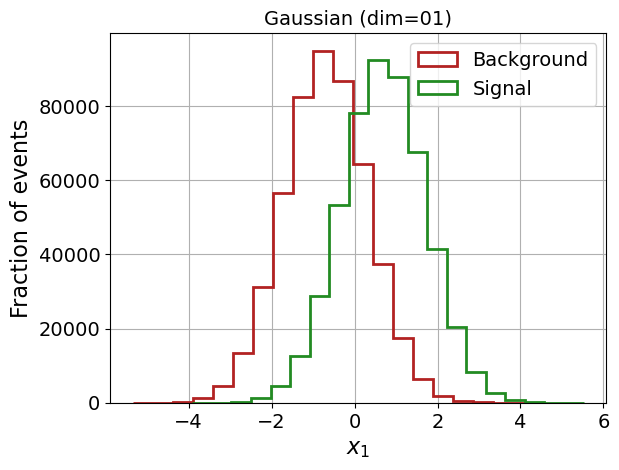

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.66030	validation_1-logloss:0.66039
[1]	validation_0-logloss:0.63352	validation_1-logloss:0.63368
[2]	validation_0-logloss:0.61145	validation_1-logloss:0.61169
[3]	validation_0-logloss:0.59313	validation_1-logloss:0.59342
[4]	validation_0-logloss:0.57782	validation_1-logloss:0.57817
[5]	validation_0-logloss:0.56497	validation_1-logloss:0.56536
[6]	validation_0-logloss:0.55414	validation_1-logloss:0.55459
[7]	validation_0-logloss:0.54501	validation_1-logloss:0.54549
[8]	validation_0-logloss:0.53728	validation_1-logloss:0.53780
[9]	validation_0-logloss:0.53073	validation_1-logloss:0.53128
[10]	validation_0-logloss:0.52517	validation_1-logloss:0.52576
[11]	validation_0-logloss:0.52046	validation_1-logloss:0.52108
[12]	validation_0-logloss:0.51646	validation_1-logloss:0.51710
[13]	validation_0-logloss:0.51306	validation_1-logloss:0.51373
[14]	validation_0-logloss:0.51017	validation_1-logloss:0.51087
[15]	validation_0-logloss:0.50772	validation_1-logloss:0.50844
[1

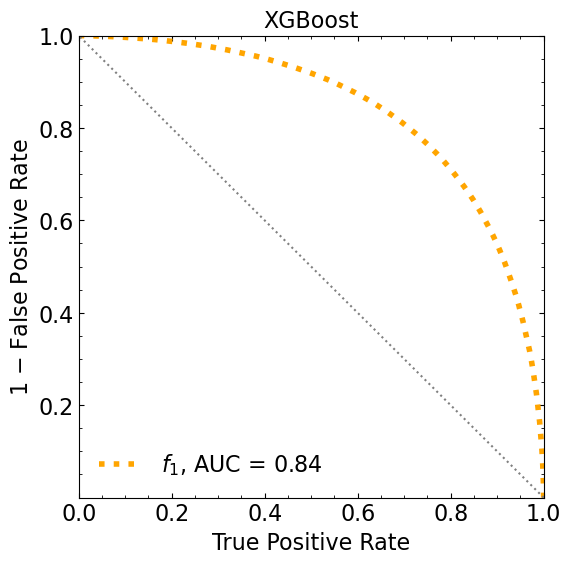

ML iteration 0
[0]	validation_0-logloss:0.66065	validation_1-logloss:0.66059
[1]	validation_0-logloss:0.63416	validation_1-logloss:0.63406
[2]	validation_0-logloss:0.61233	validation_1-logloss:0.61217
[3]	validation_0-logloss:0.59419	validation_1-logloss:0.59401
[4]	validation_0-logloss:0.57902	validation_1-logloss:0.57884


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[5]	validation_0-logloss:0.56629	validation_1-logloss:0.56611
[6]	validation_0-logloss:0.55555	validation_1-logloss:0.55540
[7]	validation_0-logloss:0.54647	validation_1-logloss:0.54633
[8]	validation_0-logloss:0.53879	validation_1-logloss:0.53866
[9]	validation_0-logloss:0.53226	validation_1-logloss:0.53215
[10]	validation_0-logloss:0.52671	validation_1-logloss:0.52662
[11]	validation_0-logloss:0.52200	validation_1-logloss:0.52193
[12]	validation_0-logloss:0.51798	validation_1-logloss:0.51795
[13]	validation_0-logloss:0.51457	validation_1-logloss:0.51457
[14]	validation_0-logloss:0.51164	validation_1-logloss:0.51170
[15]	validation_0-logloss:0.50916	validation_1-logloss:0.50927
[16]	validation_0-logloss:0.50704	validation_1-logloss:0.50721
[17]	validation_0-logloss:0.50523	validation_1-logloss:0.50547
[18]	validation_0-logloss:0.50369	validation_1-logloss:0.50398
[19]	validation_0-logloss:0.50238	validation_1-logloss:0.50272
[20]	validation_0-logloss:0.50127	validation_1-logloss:0.501

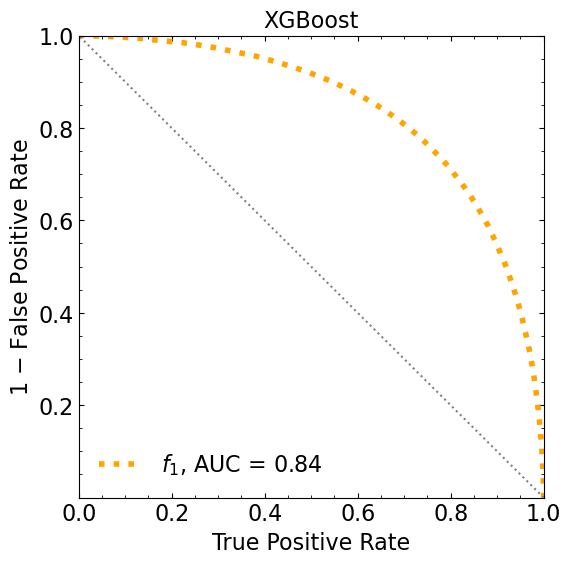

ML iteration  1
[0]	validation_0-logloss:0.65984	validation_1-logloss:0.66025
[1]	validation_0-logloss:0.63267	validation_1-logloss:0.63346
[2]	validation_0-logloss:0.61029	validation_1-logloss:0.61142


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59167	validation_1-logloss:0.59313
[4]	validation_0-logloss:0.57613	validation_1-logloss:0.57787
[5]	validation_0-logloss:0.56307	validation_1-logloss:0.56508
[6]	validation_0-logloss:0.55206	validation_1-logloss:0.55432
[7]	validation_0-logloss:0.54274	validation_1-logloss:0.54525
[8]	validation_0-logloss:0.53485	validation_1-logloss:0.53758
[9]	validation_0-logloss:0.52813	validation_1-logloss:0.53110
[10]	validation_0-logloss:0.52243	validation_1-logloss:0.52561
[11]	validation_0-logloss:0.51759	validation_1-logloss:0.52096
[12]	validation_0-logloss:0.51347	validation_1-logloss:0.51701
[13]	validation_0-logloss:0.50997	validation_1-logloss:0.51367
[14]	validation_0-logloss:0.50697	validation_1-logloss:0.51084
[15]	validation_0-logloss:0.50442	validation_1-logloss:0.50845
[16]	validation_0-logloss:0.50225	validation_1-logloss:0.50643
[17]	validation_0-logloss:0.50040	validation_1-logloss:0.50471
[18]	validation_0-logloss:0.49882	validation_1-logloss:0.50326

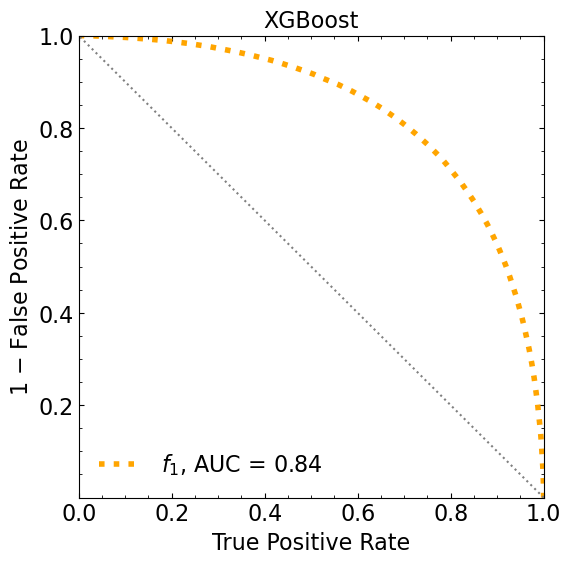

ML iteration  2
[0]	validation_0-logloss:0.66001	validation_1-logloss:0.66029
[1]	validation_0-logloss:0.63297	validation_1-logloss:0.63352
[2]	validation_0-logloss:0.61069	validation_1-logloss:0.61149


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59217	validation_1-logloss:0.59320
[4]	validation_0-logloss:0.57669	validation_1-logloss:0.57793
[5]	validation_0-logloss:0.56369	validation_1-logloss:0.56512
[6]	validation_0-logloss:0.55272	validation_1-logloss:0.55435
[7]	validation_0-logloss:0.54343	validation_1-logloss:0.54526
[8]	validation_0-logloss:0.53556	validation_1-logloss:0.53757
[9]	validation_0-logloss:0.52888	validation_1-logloss:0.53108
[10]	validation_0-logloss:0.52320	validation_1-logloss:0.52558
[11]	validation_0-logloss:0.51837	validation_1-logloss:0.52092
[12]	validation_0-logloss:0.51425	validation_1-logloss:0.51697
[13]	validation_0-logloss:0.51074	validation_1-logloss:0.51363
[14]	validation_0-logloss:0.50775	validation_1-logloss:0.51080
[15]	validation_0-logloss:0.50521	validation_1-logloss:0.50839
[16]	validation_0-logloss:0.50302	validation_1-logloss:0.50635
[17]	validation_0-logloss:0.50117	validation_1-logloss:0.50464
[18]	validation_0-logloss:0.49959	validation_1-logloss:0.50318

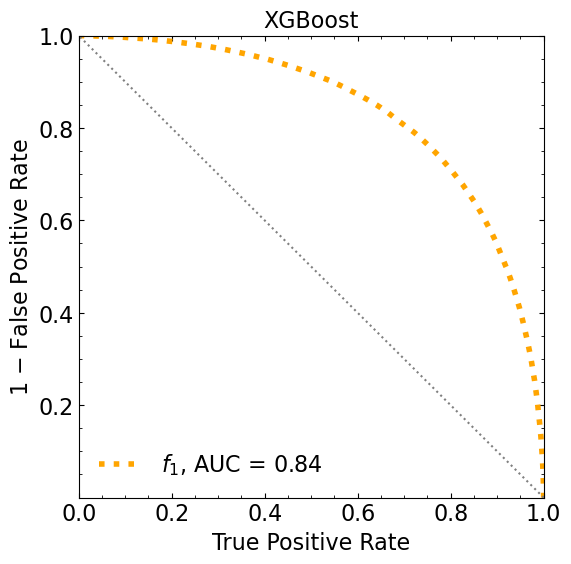

ML iteration  3
[0]	validation_0-logloss:0.66027	validation_1-logloss:0.66041
[1]	validation_0-logloss:0.63346	validation_1-logloss:0.63373
[2]	validation_0-logloss:0.61136	validation_1-logloss:0.61176


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59298	validation_1-logloss:0.59353
[4]	validation_0-logloss:0.57763	validation_1-logloss:0.57831
[5]	validation_0-logloss:0.56473	validation_1-logloss:0.56553
[6]	validation_0-logloss:0.55387	validation_1-logloss:0.55477
[7]	validation_0-logloss:0.54468	validation_1-logloss:0.54570
[8]	validation_0-logloss:0.53688	validation_1-logloss:0.53804
[9]	validation_0-logloss:0.53026	validation_1-logloss:0.53154
[10]	validation_0-logloss:0.52464	validation_1-logloss:0.52603
[11]	validation_0-logloss:0.51986	validation_1-logloss:0.52135
[12]	validation_0-logloss:0.51578	validation_1-logloss:0.51739
[13]	validation_0-logloss:0.51233	validation_1-logloss:0.51402
[14]	validation_0-logloss:0.50938	validation_1-logloss:0.51116
[15]	validation_0-logloss:0.50686	validation_1-logloss:0.50873
[16]	validation_0-logloss:0.50470	validation_1-logloss:0.50668
[17]	validation_0-logloss:0.50288	validation_1-logloss:0.50494
[18]	validation_0-logloss:0.50131	validation_1-logloss:0.50346

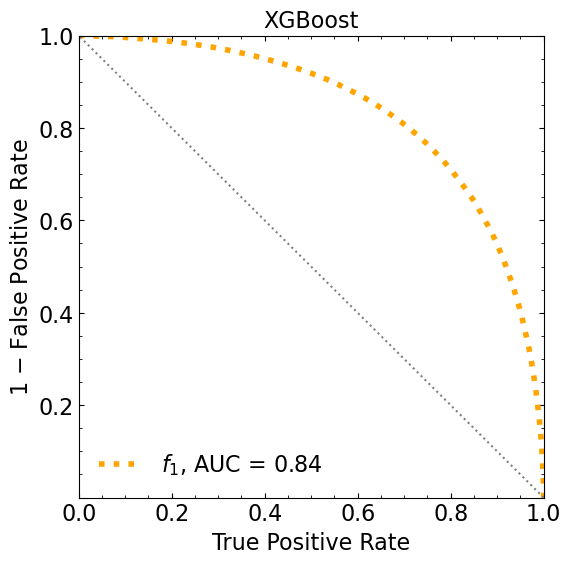

ML iteration  4
[0]	validation_0-logloss:0.66066	validation_1-logloss:0.66058
[1]	validation_0-logloss:0.63417	validation_1-logloss:0.63403
[2]	validation_0-logloss:0.61234	validation_1-logloss:0.61215


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59418	validation_1-logloss:0.59398
[4]	validation_0-logloss:0.57901	validation_1-logloss:0.57880
[5]	validation_0-logloss:0.56626	validation_1-logloss:0.56604
[6]	validation_0-logloss:0.55550	validation_1-logloss:0.55531
[7]	validation_0-logloss:0.54641	validation_1-logloss:0.54623
[8]	validation_0-logloss:0.53871	validation_1-logloss:0.53855
[9]	validation_0-logloss:0.53217	validation_1-logloss:0.53204
[10]	validation_0-logloss:0.52662	validation_1-logloss:0.52651
[11]	validation_0-logloss:0.52188	validation_1-logloss:0.52183
[12]	validation_0-logloss:0.51786	validation_1-logloss:0.51785
[13]	validation_0-logloss:0.51443	validation_1-logloss:0.51447
[14]	validation_0-logloss:0.51149	validation_1-logloss:0.51159
[15]	validation_0-logloss:0.50899	validation_1-logloss:0.50914
[16]	validation_0-logloss:0.50687	validation_1-logloss:0.50708
[17]	validation_0-logloss:0.50504	validation_1-logloss:0.50532
[18]	validation_0-logloss:0.50349	validation_1-logloss:0.50384

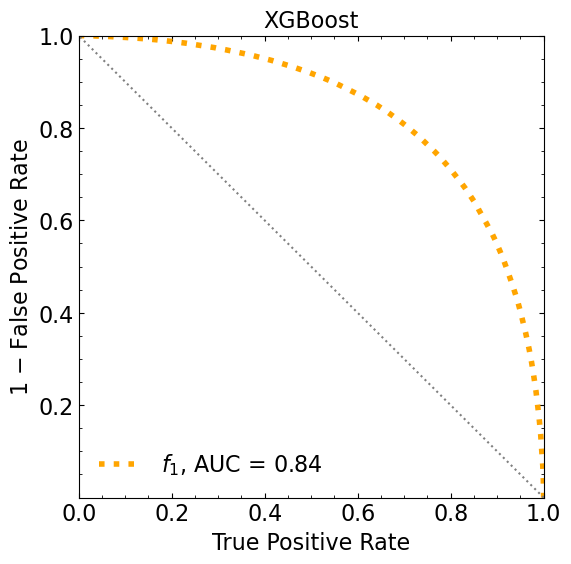

ML iteration  5
[0]	validation_0-logloss:0.66039	validation_1-logloss:0.66044
[1]	validation_0-logloss:0.63369	validation_1-logloss:0.63378
[2]	validation_0-logloss:0.61168	validation_1-logloss:0.61185


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59338	validation_1-logloss:0.59362
[4]	validation_0-logloss:0.57809	validation_1-logloss:0.57841
[5]	validation_0-logloss:0.56525	validation_1-logloss:0.56565
[6]	validation_0-logloss:0.55444	validation_1-logloss:0.55492
[7]	validation_0-logloss:0.54529	validation_1-logloss:0.54586
[8]	validation_0-logloss:0.53753	validation_1-logloss:0.53821
[9]	validation_0-logloss:0.53096	validation_1-logloss:0.53173
[10]	validation_0-logloss:0.52537	validation_1-logloss:0.52623
[11]	validation_0-logloss:0.52062	validation_1-logloss:0.52157
[12]	validation_0-logloss:0.51658	validation_1-logloss:0.51762
[13]	validation_0-logloss:0.51314	validation_1-logloss:0.51425
[14]	validation_0-logloss:0.51022	validation_1-logloss:0.51139
[15]	validation_0-logloss:0.50773	validation_1-logloss:0.50897
[16]	validation_0-logloss:0.50559	validation_1-logloss:0.50692
[17]	validation_0-logloss:0.50378	validation_1-logloss:0.50518
[18]	validation_0-logloss:0.50223	validation_1-logloss:0.50372

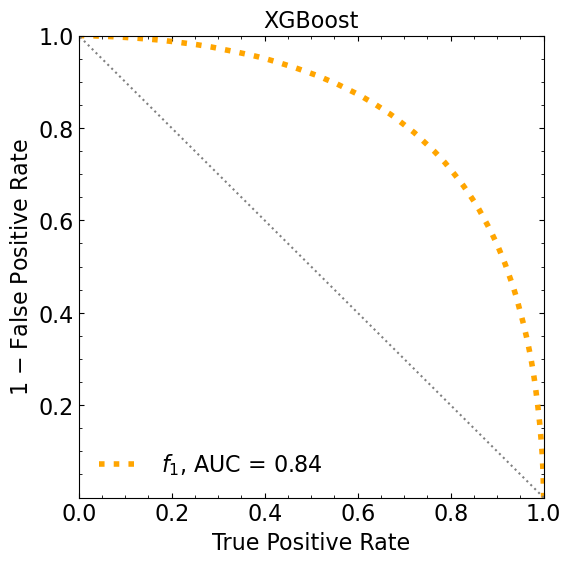

ML iteration  6
[0]	validation_0-logloss:0.65965	validation_1-logloss:0.66017
[1]	validation_0-logloss:0.63233	validation_1-logloss:0.63333
[2]	validation_0-logloss:0.60982	validation_1-logloss:0.61121


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59111	validation_1-logloss:0.59289
[4]	validation_0-logloss:0.57547	validation_1-logloss:0.57760
[5]	validation_0-logloss:0.56231	validation_1-logloss:0.56479
[6]	validation_0-logloss:0.55123	validation_1-logloss:0.55401
[7]	validation_0-logloss:0.54185	validation_1-logloss:0.54493
[8]	validation_0-logloss:0.53389	validation_1-logloss:0.53724
[9]	validation_0-logloss:0.52714	validation_1-logloss:0.53075
[10]	validation_0-logloss:0.52141	validation_1-logloss:0.52526
[11]	validation_0-logloss:0.51652	validation_1-logloss:0.52061
[12]	validation_0-logloss:0.51236	validation_1-logloss:0.51667
[13]	validation_0-logloss:0.50881	validation_1-logloss:0.51333
[14]	validation_0-logloss:0.50579	validation_1-logloss:0.51050
[15]	validation_0-logloss:0.50320	validation_1-logloss:0.50812
[16]	validation_0-logloss:0.50100	validation_1-logloss:0.50611
[17]	validation_0-logloss:0.49912	validation_1-logloss:0.50442
[18]	validation_0-logloss:0.49752	validation_1-logloss:0.50298

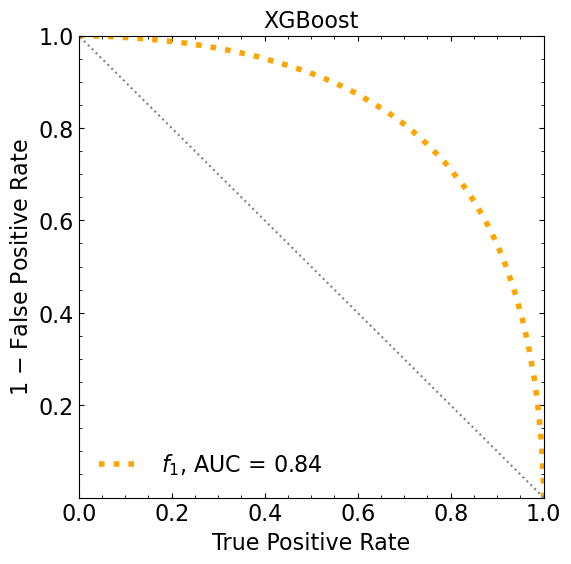

ML iteration  7
[0]	validation_0-logloss:0.66022	validation_1-logloss:0.66037
[1]	validation_0-logloss:0.63337	validation_1-logloss:0.63365
[2]	validation_0-logloss:0.61124	validation_1-logloss:0.61166


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59284	validation_1-logloss:0.59340
[4]	validation_0-logloss:0.57746	validation_1-logloss:0.57815
[5]	validation_0-logloss:0.56453	validation_1-logloss:0.56539
[6]	validation_0-logloss:0.55361	validation_1-logloss:0.55461
[7]	validation_0-logloss:0.54439	validation_1-logloss:0.54553
[8]	validation_0-logloss:0.53657	validation_1-logloss:0.53784
[9]	validation_0-logloss:0.52992	validation_1-logloss:0.53134
[10]	validation_0-logloss:0.52427	validation_1-logloss:0.52583
[11]	validation_0-logloss:0.51945	validation_1-logloss:0.52115
[12]	validation_0-logloss:0.51533	validation_1-logloss:0.51717
[13]	validation_0-logloss:0.51184	validation_1-logloss:0.51381
[14]	validation_0-logloss:0.50886	validation_1-logloss:0.51095
[15]	validation_0-logloss:0.50632	validation_1-logloss:0.50853
[16]	validation_0-logloss:0.50416	validation_1-logloss:0.50648
[17]	validation_0-logloss:0.50231	validation_1-logloss:0.50475
[18]	validation_0-logloss:0.50071	validation_1-logloss:0.50329

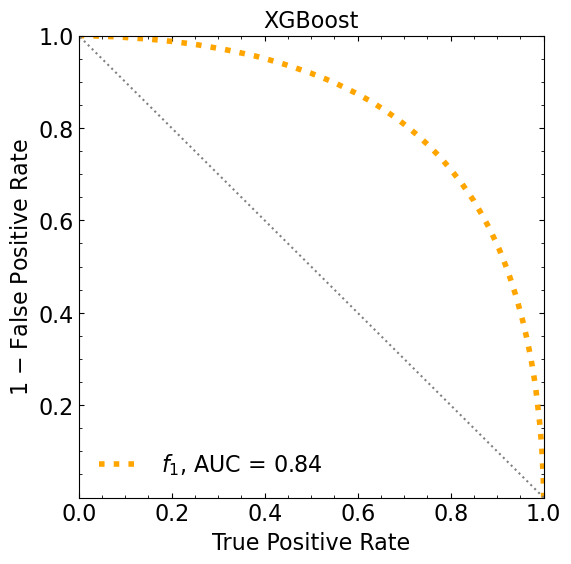

ML iteration  8
[0]	validation_0-logloss:0.66011	validation_1-logloss:0.66036
[1]	validation_0-logloss:0.63317	validation_1-logloss:0.63364
[2]	validation_0-logloss:0.61096	validation_1-logloss:0.61166


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59251	validation_1-logloss:0.59339
[4]	validation_0-logloss:0.57709	validation_1-logloss:0.57815
[5]	validation_0-logloss:0.56414	validation_1-logloss:0.56537
[6]	validation_0-logloss:0.55323	validation_1-logloss:0.55461
[7]	validation_0-logloss:0.54399	validation_1-logloss:0.54553
[8]	validation_0-logloss:0.53617	validation_1-logloss:0.53786
[9]	validation_0-logloss:0.52954	validation_1-logloss:0.53136
[10]	validation_0-logloss:0.52389	validation_1-logloss:0.52587
[11]	validation_0-logloss:0.51909	validation_1-logloss:0.52121
[12]	validation_0-logloss:0.51501	validation_1-logloss:0.51727
[13]	validation_0-logloss:0.51153	validation_1-logloss:0.51392
[14]	validation_0-logloss:0.50857	validation_1-logloss:0.51108
[15]	validation_0-logloss:0.50605	validation_1-logloss:0.50867
[16]	validation_0-logloss:0.50390	validation_1-logloss:0.50664
[17]	validation_0-logloss:0.50207	validation_1-logloss:0.50491
[18]	validation_0-logloss:0.50050	validation_1-logloss:0.50346

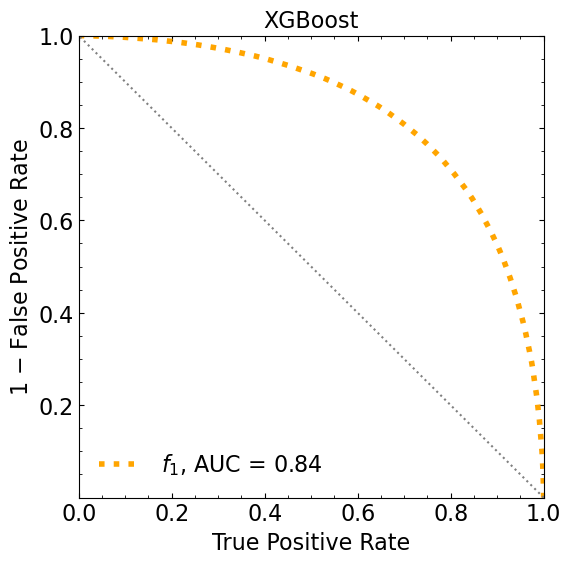

ML iteration  9
[0]	validation_0-logloss:0.66009	validation_1-logloss:0.66036
[1]	validation_0-logloss:0.63313	validation_1-logloss:0.63365
[2]	validation_0-logloss:0.61091	validation_1-logloss:0.61165


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.59244	validation_1-logloss:0.59340
[4]	validation_0-logloss:0.57700	validation_1-logloss:0.57817
[5]	validation_0-logloss:0.56404	validation_1-logloss:0.56538
[6]	validation_0-logloss:0.55310	validation_1-logloss:0.55462
[7]	validation_0-logloss:0.54387	validation_1-logloss:0.54554
[8]	validation_0-logloss:0.53603	validation_1-logloss:0.53788
[9]	validation_0-logloss:0.52938	validation_1-logloss:0.53139
[10]	validation_0-logloss:0.52373	validation_1-logloss:0.52589
[11]	validation_0-logloss:0.51893	validation_1-logloss:0.52123
[12]	validation_0-logloss:0.51483	validation_1-logloss:0.51727
[13]	validation_0-logloss:0.51134	validation_1-logloss:0.51391
[14]	validation_0-logloss:0.50837	validation_1-logloss:0.51106
[15]	validation_0-logloss:0.50583	validation_1-logloss:0.50864
[16]	validation_0-logloss:0.50368	validation_1-logloss:0.50659
[17]	validation_0-logloss:0.50182	validation_1-logloss:0.50485
[18]	validation_0-logloss:0.50025	validation_1-logloss:0.50338

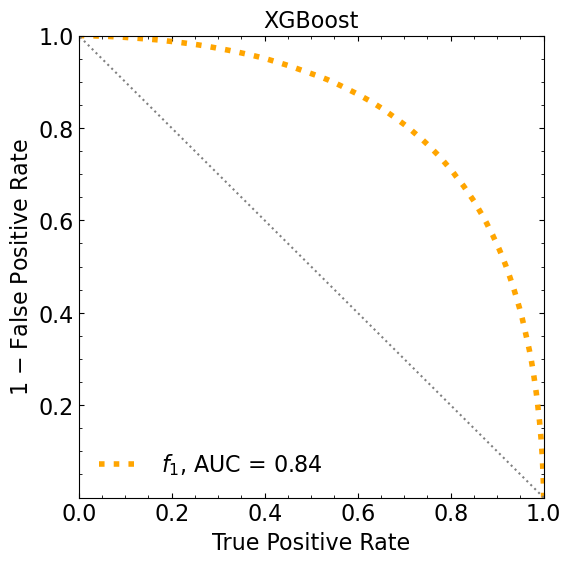

Classification score (1 ML):


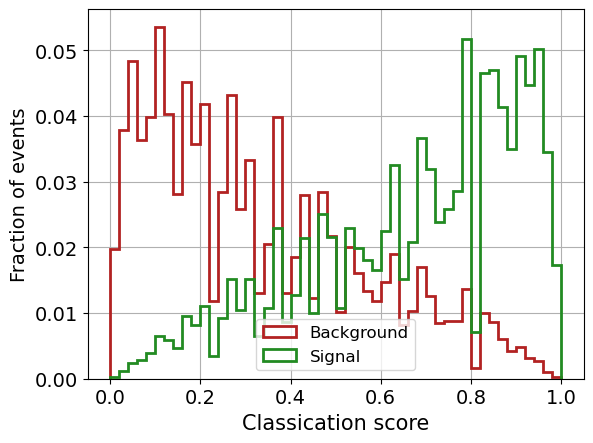

Classification score (10 ML):


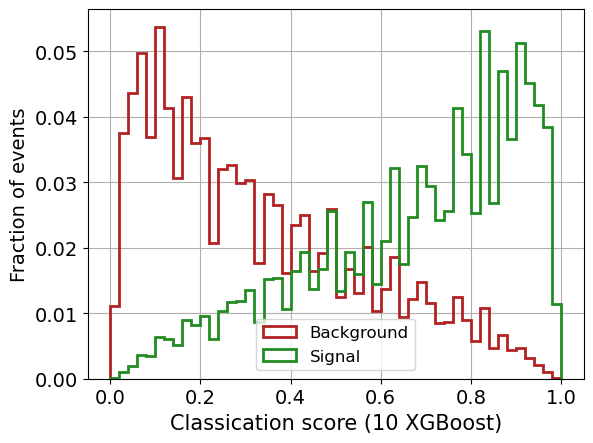

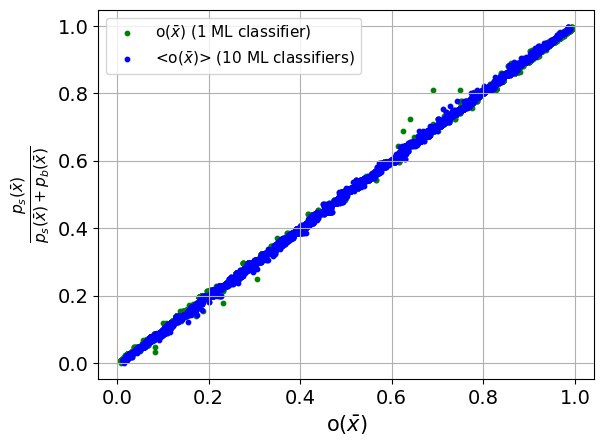


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  4.914428305158582
Z_XG 25 bins_1ML:  5.24823738098374
Z_XG 50 bins_1ML:  5.357597913962326
Z_XG 100 bins_1ML:  5.371293762885221

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  4.066040684545487
Z_XG 25 bins_eq_1ML:  4.513734739467205
Z_XG 50 bins_eq_1ML:  4.776421272629951
Z_XG 100 bins_eq_1ML:  4.99649228165184

 BL lineal bins, 10 ML
Z_XG 10 bins:  4.935622794786928
Z_XG 25 bins:  5.2532101527845585
Z_XG 50 bins:  5.364948645701784
Z_XG 100 bins:  5.3911780918688885

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  4.074841059679209
Z_XG 25 bins_eq:  4.525236586734685
Z_XG 50 bins_eq:  4.788796262305323
Z_XG 100 bins_eq:  4.9974480502371375

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSSIA

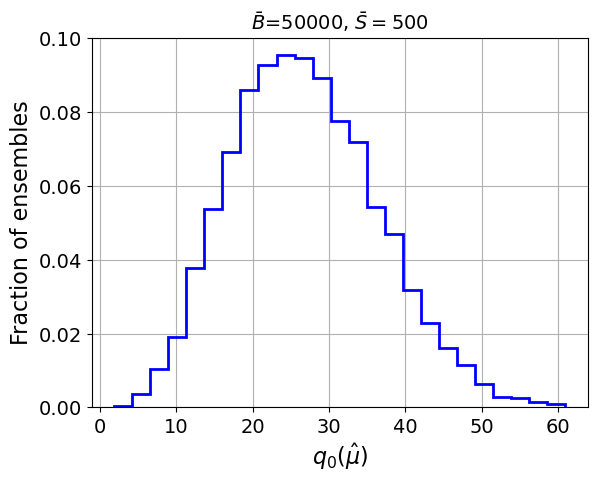

muhat mean:  0.11623745310757376
Z_gaussian:  5.124191589128489
Z_gaussian_mu0:  5.116951421067932

 ------------------------------------ 

 MLL + KDE (1ML) 
KDE Kernel:  epanechnikov
Background bandwidth:  0.015848931924611134
Signal bandwidth:  0.015848931924611134


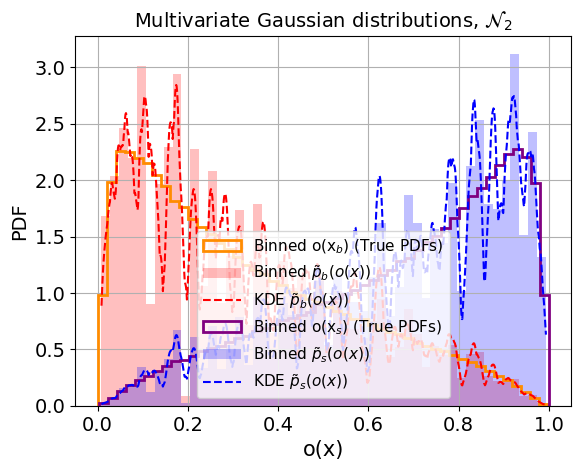

 MLL + KDE (10ML) 
KDE Kernel:  epanechnikov
Background bandwidth:  0.015848931924611134
Signal bandwidth:  0.015848931924611134


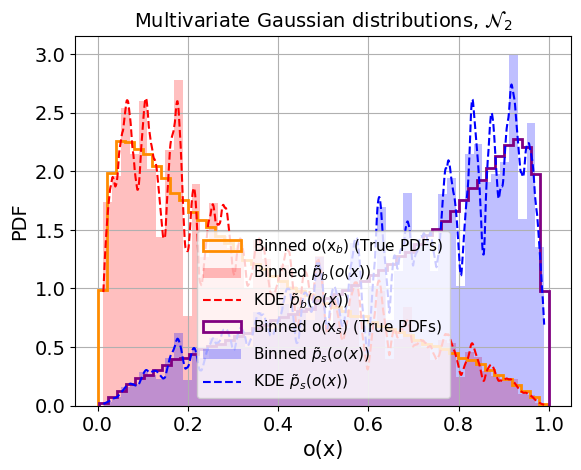

 Z MLL+KDE (1ML) 


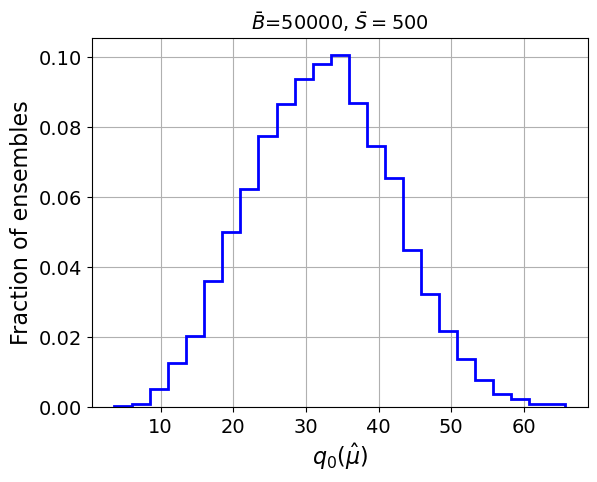

muhat mean_1ML:  0.04484943729088513
Z_KDE_1ML:  5.683449033569733
Z_KDE mu=0_1ML:  5.683449033569733

 Z MLL+KDE (10ML) 


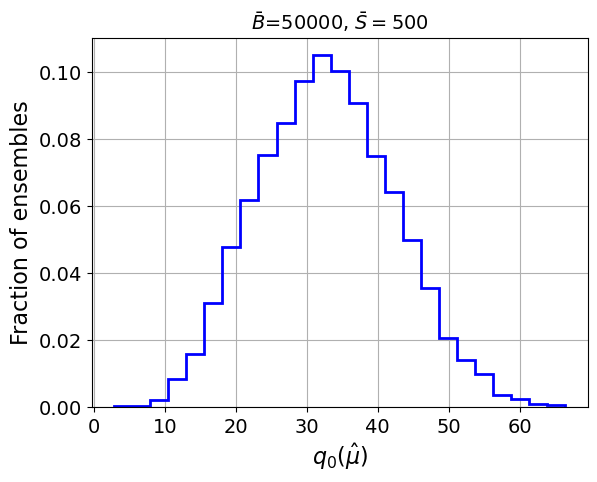

muhat mean:  0.04158471053432018
Z_KDE:  5.707548461815864
Z_KDE mu=0:  5.707548461815864

 ------------------------------------ 



In [25]:
dim=1

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T

dim1 = np.concatenate((background_X_1,signal_X_1))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML, events_to_fit=20000, bandwidth_space=np.logspace(-1.8, 0.05, 5))


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP, events_to_fit=20000, bandwidth_space=np.logspace(-1.8, 0.05, 5))


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 2)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 2)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 2)
y_gauss_test :  (1000000, 1)



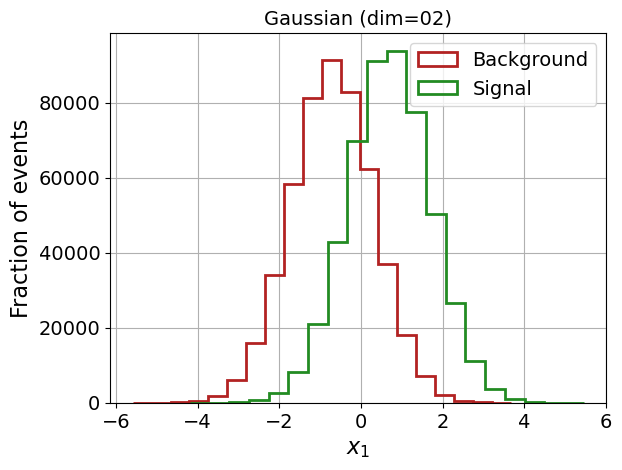

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.65370	validation_1-logloss:0.65388
[1]	validation_0-logloss:0.62144	validation_1-logloss:0.62174
[2]	validation_0-logloss:0.59473	validation_1-logloss:0.59514
[3]	validation_0-logloss:0.57238	validation_1-logloss:0.57289
[4]	validation_0-logloss:0.55363	validation_1-logloss:0.55423
[5]	validation_0-logloss:0.53774	validation_1-logloss:0.53842
[6]	validation_0-logloss:0.52427	validation_1-logloss:0.52503
[7]	validation_0-logloss:0.51279	validation_1-logloss:0.51362
[8]	validation_0-logloss:0.50301	validation_1-logloss:0.50390
[9]	validation_0-logloss:0.49462	validation_1-logloss:0.49556
[10]	validation_0-logloss:0.48745	validation_1-logloss:0.48844
[11]	validation_0-logloss:0.48129	validation_1-logloss:0.48234
[12]	validation_0-logloss:0.47602	validation_1-logloss:0.47710
[13]	validation_0-logloss:0.47149	validation_1-logloss:0.47262
[14]	validation_0-logloss:0.46760	validation_1-logloss:0.46877
[15]	validation_0-logloss:0.46425	validation_1-logloss:0.46546
[1

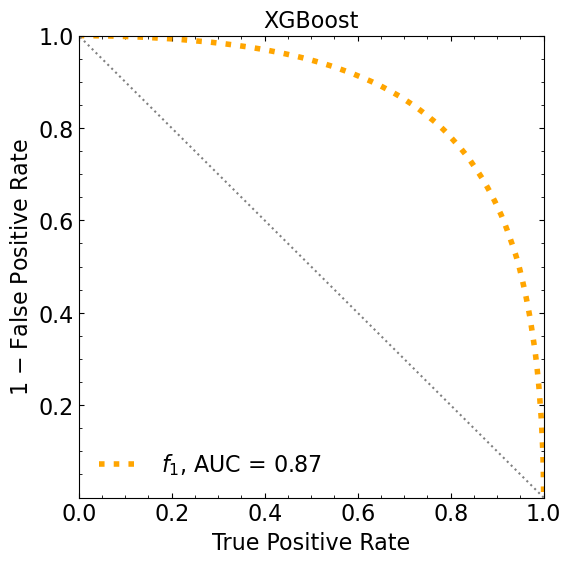

ML iteration 0
[0]	validation_0-logloss:0.65325	validation_1-logloss:0.65366
[1]	validation_0-logloss:0.62062	validation_1-logloss:0.62141
[2]	validation_0-logloss:0.59359	validation_1-logloss:0.59471


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.57096	validation_1-logloss:0.57240
[4]	validation_0-logloss:0.55195	validation_1-logloss:0.55368
[5]	validation_0-logloss:0.53593	validation_1-logloss:0.53791
[6]	validation_0-logloss:0.52231	validation_1-logloss:0.52453
[7]	validation_0-logloss:0.51068	validation_1-logloss:0.51313
[8]	validation_0-logloss:0.50072	validation_1-logloss:0.50339
[9]	validation_0-logloss:0.49224	validation_1-logloss:0.49510
[10]	validation_0-logloss:0.48495	validation_1-logloss:0.48801
[11]	validation_0-logloss:0.47869	validation_1-logloss:0.48193
[12]	validation_0-logloss:0.47330	validation_1-logloss:0.47673
[13]	validation_0-logloss:0.46868	validation_1-logloss:0.47227
[14]	validation_0-logloss:0.46470	validation_1-logloss:0.46845
[15]	validation_0-logloss:0.46129	validation_1-logloss:0.46517
[16]	validation_0-logloss:0.45834	validation_1-logloss:0.46237
[17]	validation_0-logloss:0.45582	validation_1-logloss:0.45999
[18]	validation_0-logloss:0.45363	validation_1-logloss:0.45793

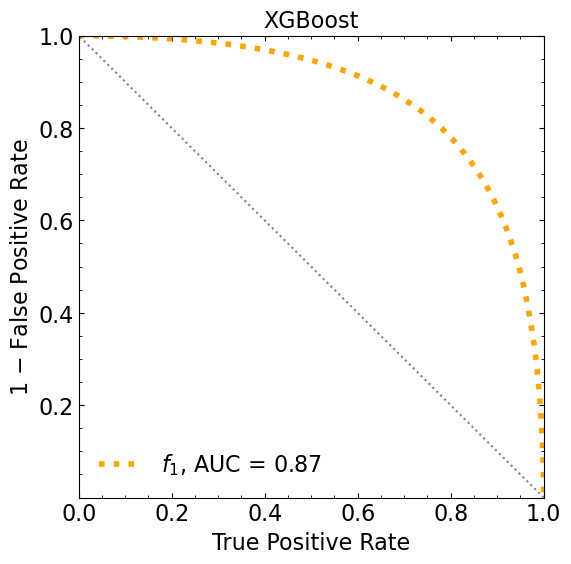

ML iteration  1
[0]	validation_0-logloss:0.65342	validation_1-logloss:0.65370
[1]	validation_0-logloss:0.62093	validation_1-logloss:0.62148
[2]	validation_0-logloss:0.59399	validation_1-logloss:0.59478
[3]	validation_0-logloss:0.57156	validation_1-logloss:0.57260


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-logloss:0.55266	validation_1-logloss:0.55389
[5]	validation_0-logloss:0.53661	validation_1-logloss:0.53804
[6]	validation_0-logloss:0.52302	validation_1-logloss:0.52464
[7]	validation_0-logloss:0.51143	validation_1-logloss:0.51322
[8]	validation_0-logloss:0.50153	validation_1-logloss:0.50349
[9]	validation_0-logloss:0.49308	validation_1-logloss:0.49518
[10]	validation_0-logloss:0.48581	validation_1-logloss:0.48808
[11]	validation_0-logloss:0.47959	validation_1-logloss:0.48200
[12]	validation_0-logloss:0.47424	validation_1-logloss:0.47679
[13]	validation_0-logloss:0.46963	validation_1-logloss:0.47234
[14]	validation_0-logloss:0.46567	validation_1-logloss:0.46852
[15]	validation_0-logloss:0.46226	validation_1-logloss:0.46523
[16]	validation_0-logloss:0.45931	validation_1-logloss:0.46242
[17]	validation_0-logloss:0.45677	validation_1-logloss:0.46002
[18]	validation_0-logloss:0.45458	validation_1-logloss:0.45796
[19]	validation_0-logloss:0.45268	validation_1-logloss:0.4562

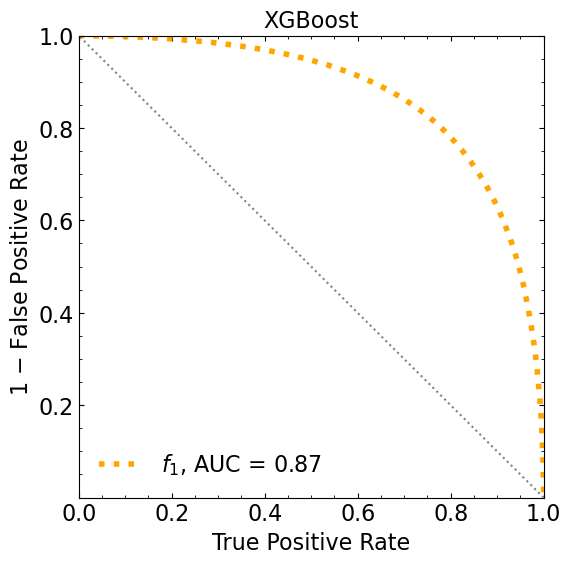

ML iteration  2
[0]	validation_0-logloss:0.65315	validation_1-logloss:0.65365
[1]	validation_0-logloss:0.62045	validation_1-logloss:0.62137
[2]	validation_0-logloss:0.59332	validation_1-logloss:0.59462


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.57060	validation_1-logloss:0.57227
[4]	validation_0-logloss:0.55156	validation_1-logloss:0.55357
[5]	validation_0-logloss:0.53542	validation_1-logloss:0.53774
[6]	validation_0-logloss:0.52173	validation_1-logloss:0.52435
[7]	validation_0-logloss:0.51003	validation_1-logloss:0.51292
[8]	validation_0-logloss:0.50005	validation_1-logloss:0.50317
[9]	validation_0-logloss:0.49149	validation_1-logloss:0.49486
[10]	validation_0-logloss:0.48417	validation_1-logloss:0.48776
[11]	validation_0-logloss:0.47788	validation_1-logloss:0.48168
[12]	validation_0-logloss:0.47246	validation_1-logloss:0.47648
[13]	validation_0-logloss:0.46780	validation_1-logloss:0.47201
[14]	validation_0-logloss:0.46380	validation_1-logloss:0.46820
[15]	validation_0-logloss:0.46035	validation_1-logloss:0.46491
[16]	validation_0-logloss:0.45737	validation_1-logloss:0.46211
[17]	validation_0-logloss:0.45480	validation_1-logloss:0.45971
[18]	validation_0-logloss:0.45258	validation_1-logloss:0.45766

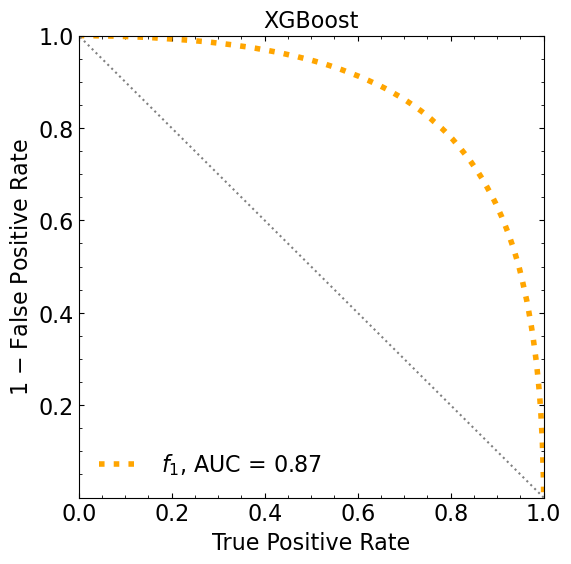

ML iteration  3
[0]	validation_0-logloss:0.65388	validation_1-logloss:0.65404
[1]	validation_0-logloss:0.62179	validation_1-logloss:0.62210
[2]	validation_0-logloss:0.59515	validation_1-logloss:0.59557
[3]	validation_0-logloss:0.57290	validation_1-logloss:0.57341


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[4]	validation_0-logloss:0.55414	validation_1-logloss:0.55475
[5]	validation_0-logloss:0.53834	validation_1-logloss:0.53902
[6]	validation_0-logloss:0.52494	validation_1-logloss:0.52569
[7]	validation_0-logloss:0.51353	validation_1-logloss:0.51432
[8]	validation_0-logloss:0.50378	validation_1-logloss:0.50463
[9]	validation_0-logloss:0.49546	validation_1-logloss:0.49635
[10]	validation_0-logloss:0.48832	validation_1-logloss:0.48926
[11]	validation_0-logloss:0.48219	validation_1-logloss:0.48317
[12]	validation_0-logloss:0.47693	validation_1-logloss:0.47795
[13]	validation_0-logloss:0.47239	validation_1-logloss:0.47347
[14]	validation_0-logloss:0.46846	validation_1-logloss:0.46961
[15]	validation_0-logloss:0.46509	validation_1-logloss:0.46626
[16]	validation_0-logloss:0.46219	validation_1-logloss:0.46342
[17]	validation_0-logloss:0.45969	validation_1-logloss:0.46097
[18]	validation_0-logloss:0.45754	validation_1-logloss:0.45886
[19]	validation_0-logloss:0.45567	validation_1-logloss:0.4570

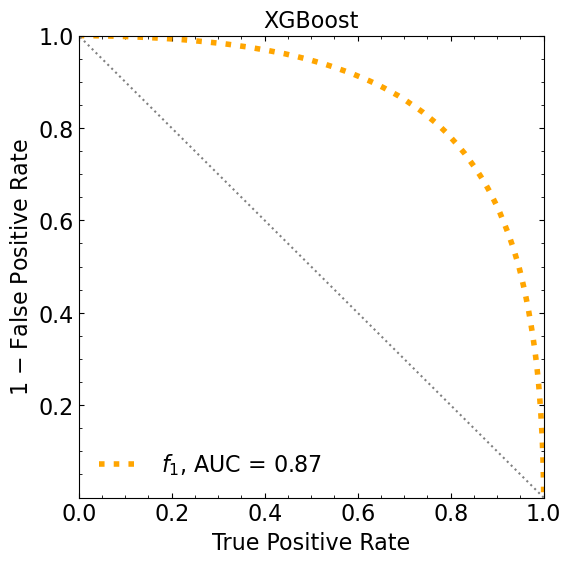

ML iteration  4
[0]	validation_0-logloss:0.65310	validation_1-logloss:0.65364
[1]	validation_0-logloss:0.62037	validation_1-logloss:0.62138
[2]	validation_0-logloss:0.59327	validation_1-logloss:0.59469


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.57057	validation_1-logloss:0.57238
[4]	validation_0-logloss:0.55154	validation_1-logloss:0.55367
[5]	validation_0-logloss:0.53544	validation_1-logloss:0.53789
[6]	validation_0-logloss:0.52175	validation_1-logloss:0.52448
[7]	validation_0-logloss:0.51010	validation_1-logloss:0.51307
[8]	validation_0-logloss:0.50013	validation_1-logloss:0.50332
[9]	validation_0-logloss:0.49159	validation_1-logloss:0.49505
[10]	validation_0-logloss:0.48429	validation_1-logloss:0.48795
[11]	validation_0-logloss:0.47802	validation_1-logloss:0.48188
[12]	validation_0-logloss:0.47263	validation_1-logloss:0.47666
[13]	validation_0-logloss:0.46798	validation_1-logloss:0.47220
[14]	validation_0-logloss:0.46400	validation_1-logloss:0.46839
[15]	validation_0-logloss:0.46056	validation_1-logloss:0.46513
[16]	validation_0-logloss:0.45761	validation_1-logloss:0.46233
[17]	validation_0-logloss:0.45505	validation_1-logloss:0.45994
[18]	validation_0-logloss:0.45285	validation_1-logloss:0.45789

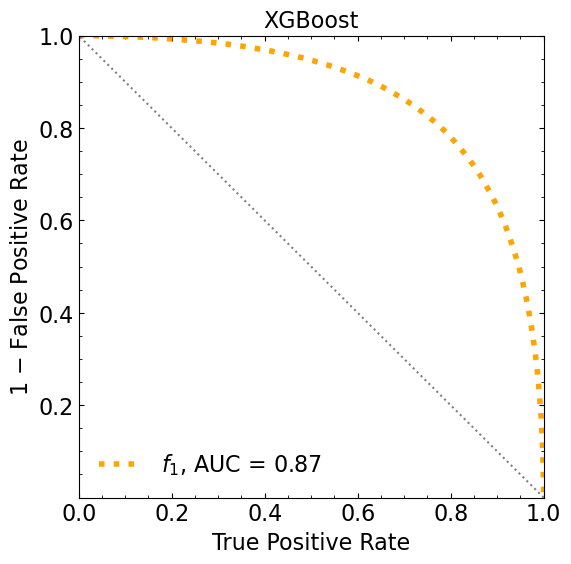

ML iteration  5
[0]	validation_0-logloss:0.65348	validation_1-logloss:0.65382
[1]	validation_0-logloss:0.62101	validation_1-logloss:0.62161
[2]	validation_0-logloss:0.59411	validation_1-logloss:0.59497


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.57166	validation_1-logloss:0.57273
[4]	validation_0-logloss:0.55278	validation_1-logloss:0.55404
[5]	validation_0-logloss:0.53682	validation_1-logloss:0.53827
[6]	validation_0-logloss:0.52327	validation_1-logloss:0.52487
[7]	validation_0-logloss:0.51173	validation_1-logloss:0.51347
[8]	validation_0-logloss:0.50189	validation_1-logloss:0.50379
[9]	validation_0-logloss:0.49345	validation_1-logloss:0.49551
[10]	validation_0-logloss:0.48627	validation_1-logloss:0.48846
[11]	validation_0-logloss:0.48009	validation_1-logloss:0.48238
[12]	validation_0-logloss:0.47478	validation_1-logloss:0.47719
[13]	validation_0-logloss:0.47020	validation_1-logloss:0.47273
[14]	validation_0-logloss:0.46629	validation_1-logloss:0.46894
[15]	validation_0-logloss:0.46291	validation_1-logloss:0.46567
[16]	validation_0-logloss:0.46000	validation_1-logloss:0.46287
[17]	validation_0-logloss:0.45749	validation_1-logloss:0.46048
[18]	validation_0-logloss:0.45532	validation_1-logloss:0.45843

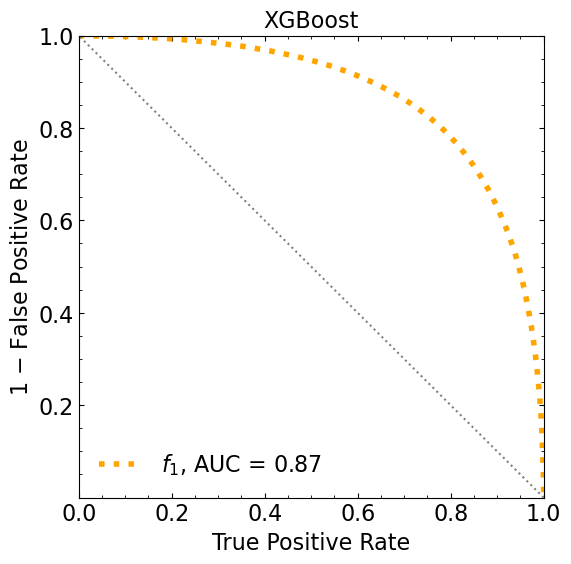

ML iteration  6
[0]	validation_0-logloss:0.65351	validation_1-logloss:0.65381
[1]	validation_0-logloss:0.62107	validation_1-logloss:0.62162
[2]	validation_0-logloss:0.59426	validation_1-logloss:0.59505


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.57183	validation_1-logloss:0.57286
[4]	validation_0-logloss:0.55294	validation_1-logloss:0.55415
[5]	validation_0-logloss:0.53695	validation_1-logloss:0.53834
[6]	validation_0-logloss:0.52340	validation_1-logloss:0.52495
[7]	validation_0-logloss:0.51185	validation_1-logloss:0.51354
[8]	validation_0-logloss:0.50199	validation_1-logloss:0.50382
[9]	validation_0-logloss:0.49354	validation_1-logloss:0.49549
[10]	validation_0-logloss:0.48629	validation_1-logloss:0.48839
[11]	validation_0-logloss:0.48007	validation_1-logloss:0.48229
[12]	validation_0-logloss:0.47473	validation_1-logloss:0.47705
[13]	validation_0-logloss:0.47013	validation_1-logloss:0.47257
[14]	validation_0-logloss:0.46616	validation_1-logloss:0.46877
[15]	validation_0-logloss:0.46276	validation_1-logloss:0.46548
[16]	validation_0-logloss:0.45982	validation_1-logloss:0.46267
[17]	validation_0-logloss:0.45728	validation_1-logloss:0.46028
[18]	validation_0-logloss:0.45507	validation_1-logloss:0.45819

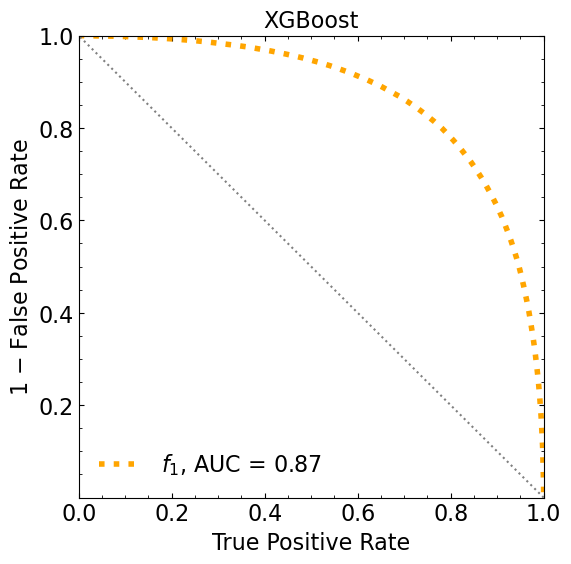

ML iteration  7
[0]	validation_0-logloss:0.65377	validation_1-logloss:0.65390
[1]	validation_0-logloss:0.62155	validation_1-logloss:0.62180
[2]	validation_0-logloss:0.59491	validation_1-logloss:0.59525


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.57266	validation_1-logloss:0.57311
[4]	validation_0-logloss:0.55390	validation_1-logloss:0.55440
[5]	validation_0-logloss:0.53804	validation_1-logloss:0.53861
[6]	validation_0-logloss:0.52458	validation_1-logloss:0.52522
[7]	validation_0-logloss:0.51314	validation_1-logloss:0.51387
[8]	validation_0-logloss:0.50334	validation_1-logloss:0.50414
[9]	validation_0-logloss:0.49497	validation_1-logloss:0.49584
[10]	validation_0-logloss:0.48781	validation_1-logloss:0.48875
[11]	validation_0-logloss:0.48166	validation_1-logloss:0.48266
[12]	validation_0-logloss:0.47638	validation_1-logloss:0.47747
[13]	validation_0-logloss:0.47184	validation_1-logloss:0.47299
[14]	validation_0-logloss:0.46796	validation_1-logloss:0.46919
[15]	validation_0-logloss:0.46459	validation_1-logloss:0.46591
[16]	validation_0-logloss:0.46171	validation_1-logloss:0.46308
[17]	validation_0-logloss:0.45922	validation_1-logloss:0.46066
[18]	validation_0-logloss:0.45707	validation_1-logloss:0.45858

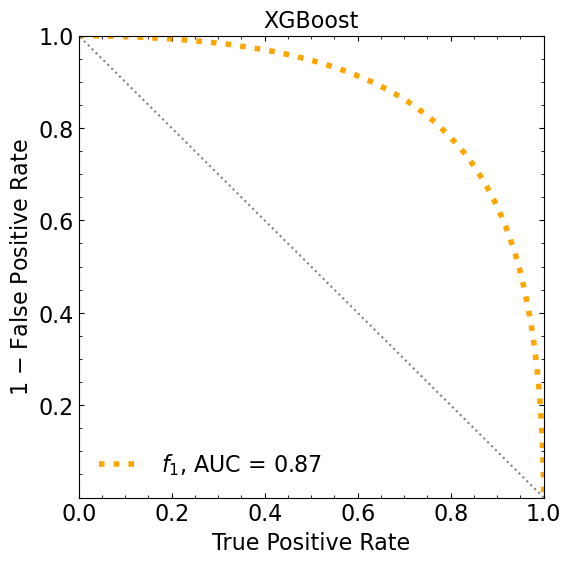

ML iteration  8
[0]	validation_0-logloss:0.65310	validation_1-logloss:0.65372
[1]	validation_0-logloss:0.62035	validation_1-logloss:0.62152
[2]	validation_0-logloss:0.59325	validation_1-logloss:0.59489


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.57061	validation_1-logloss:0.57265
[4]	validation_0-logloss:0.55156	validation_1-logloss:0.55397
[5]	validation_0-logloss:0.53546	validation_1-logloss:0.53818
[6]	validation_0-logloss:0.52179	validation_1-logloss:0.52482
[7]	validation_0-logloss:0.51014	validation_1-logloss:0.51344
[8]	validation_0-logloss:0.50012	validation_1-logloss:0.50369
[9]	validation_0-logloss:0.49159	validation_1-logloss:0.49540
[10]	validation_0-logloss:0.48427	validation_1-logloss:0.48826
[11]	validation_0-logloss:0.47800	validation_1-logloss:0.48220
[12]	validation_0-logloss:0.47259	validation_1-logloss:0.47699
[13]	validation_0-logloss:0.46797	validation_1-logloss:0.47254
[14]	validation_0-logloss:0.46398	validation_1-logloss:0.46870
[15]	validation_0-logloss:0.46056	validation_1-logloss:0.46543
[16]	validation_0-logloss:0.45761	validation_1-logloss:0.46262
[17]	validation_0-logloss:0.45505	validation_1-logloss:0.46019
[18]	validation_0-logloss:0.45286	validation_1-logloss:0.45815

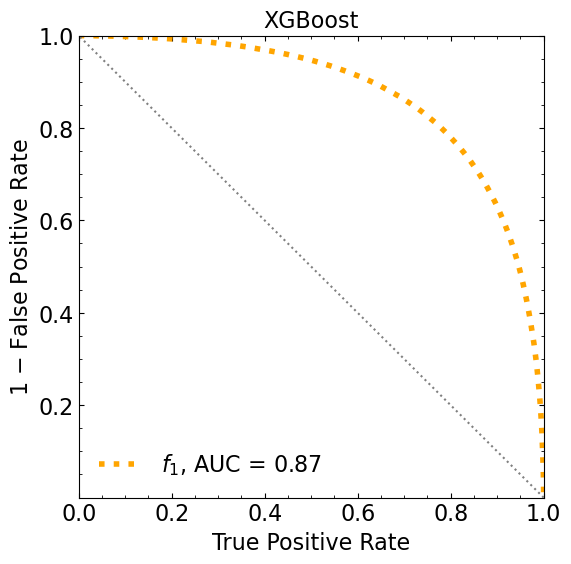

ML iteration  9
[0]	validation_0-logloss:0.65357	validation_1-logloss:0.65382
[1]	validation_0-logloss:0.62115	validation_1-logloss:0.62165
[2]	validation_0-logloss:0.59433	validation_1-logloss:0.59507


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.57191	validation_1-logloss:0.57285
[4]	validation_0-logloss:0.55312	validation_1-logloss:0.55422
[5]	validation_0-logloss:0.53719	validation_1-logloss:0.53844
[6]	validation_0-logloss:0.52370	validation_1-logloss:0.52507
[7]	validation_0-logloss:0.51222	validation_1-logloss:0.51371
[8]	validation_0-logloss:0.50234	validation_1-logloss:0.50397
[9]	validation_0-logloss:0.49393	validation_1-logloss:0.49569
[10]	validation_0-logloss:0.48674	validation_1-logloss:0.48858
[11]	validation_0-logloss:0.48055	validation_1-logloss:0.48250
[12]	validation_0-logloss:0.47527	validation_1-logloss:0.47729
[13]	validation_0-logloss:0.47069	validation_1-logloss:0.47281
[14]	validation_0-logloss:0.46675	validation_1-logloss:0.46898
[15]	validation_0-logloss:0.46338	validation_1-logloss:0.46569
[16]	validation_0-logloss:0.46047	validation_1-logloss:0.46288
[17]	validation_0-logloss:0.45796	validation_1-logloss:0.46047
[18]	validation_0-logloss:0.45581	validation_1-logloss:0.45839

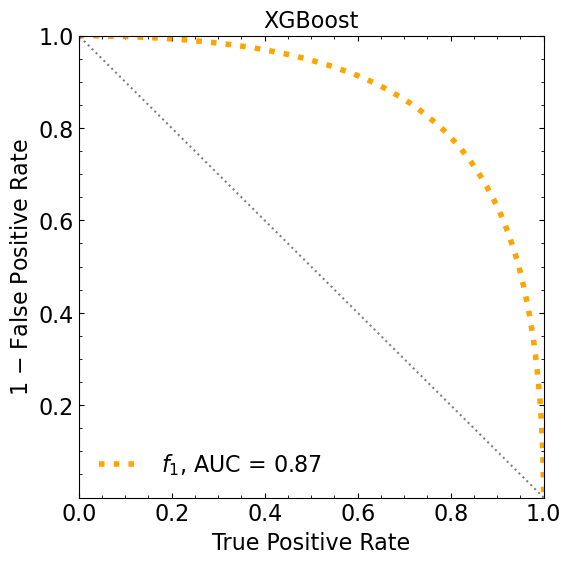

Classification score (1 ML):


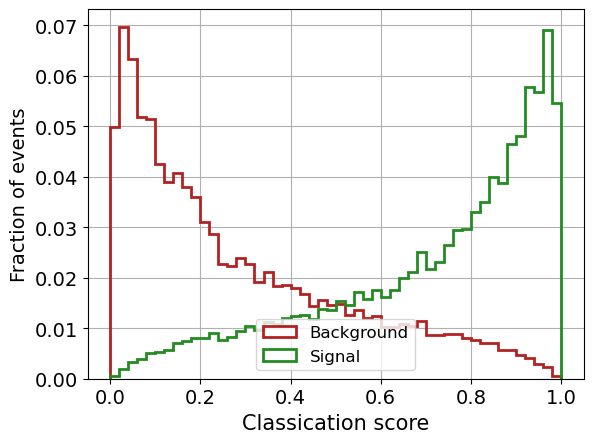

Classification score (10 ML):


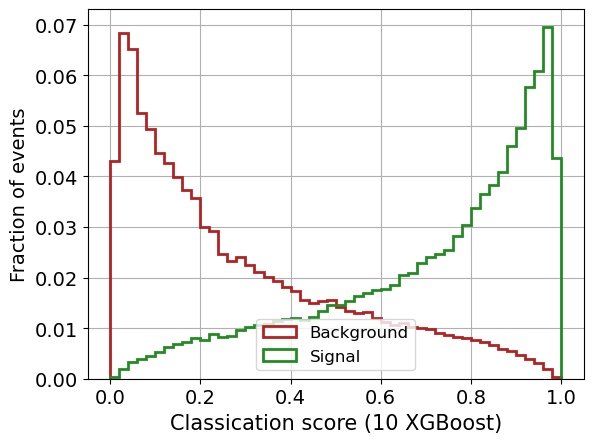

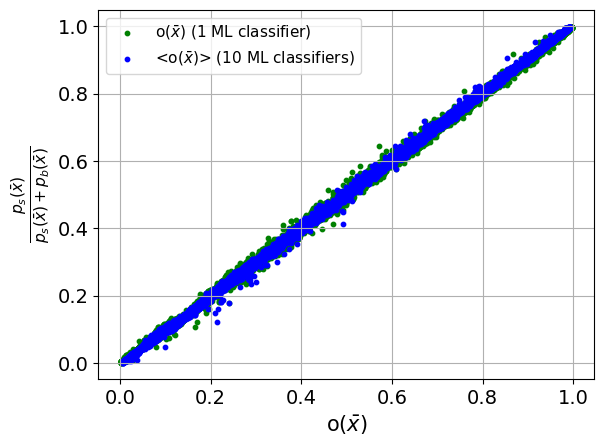


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  5.853246697629005
Z_XG 25 bins_1ML:  6.428058608219332
Z_XG 50 bins_1ML:  6.697224222179377
Z_XG 100 bins_1ML:  6.804668445824279

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  4.550495683671151
Z_XG 25 bins_eq_1ML:  5.272785718988348
Z_XG 50 bins_eq_1ML:  5.697424812982663
Z_XG 100 bins_eq_1ML:  6.039107510205195

 BL lineal bins, 10 ML
Z_XG 10 bins:  5.871298308093088
Z_XG 25 bins:  6.495471048920689
Z_XG 50 bins:  6.722010118926525
Z_XG 100 bins:  6.792546360582067

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  4.552354208578955
Z_XG 25 bins_eq:  5.263691562062334
Z_XG 50 bins_eq:  5.700224031220289
Z_XG 100 bins_eq:  6.038477724351157

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSSIAN

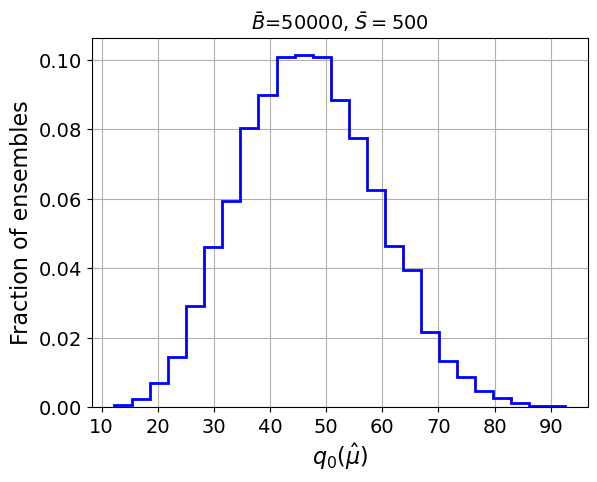

muhat mean:  0.06529453513129879
Z_gaussian:  6.816010860942129
Z_gaussian_mu0:  6.814221099577306

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
           -inf           -inf  1199.37617602  1188.82431295
  1172.26652869  1149.86505037  1112.94817862  1055.58746033
   963.78125577   831.28410849   652.7345396    392.50588875
    31.44064892  -444.99035894 -1077.36976037 -2025.58947446]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [           -inf            -inf            -inf  1.22464149e+03
  1.20399418e+03  1.18352015e+03  1.16932876e+03  1.15314097e+03
  1.13289233e+03  1.10558050e+0

KDE Kernel:  epanechnikov
Background bandwidth:  0.0091866653175426
Signal bandwidth:  0.003030951223220623


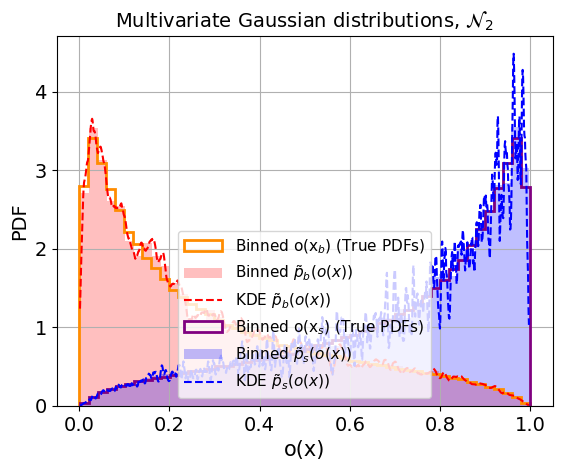

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
  1223.10712678  1220.18192867  1216.60989226  1207.90423083
  1193.25308699  1169.20036912  1131.10462012  1072.29141996
   980.36316976   849.05193136   668.11181764   408.00464532
    46.72667917  -432.03872202 -1066.81511956 -2020.82638917]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf  1174.83579545
  1179.32905319  1179.75253755  1176.31471585  1168.12434383
  1151.49299481  1124.39707606  1082.72

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.0063479219593504735


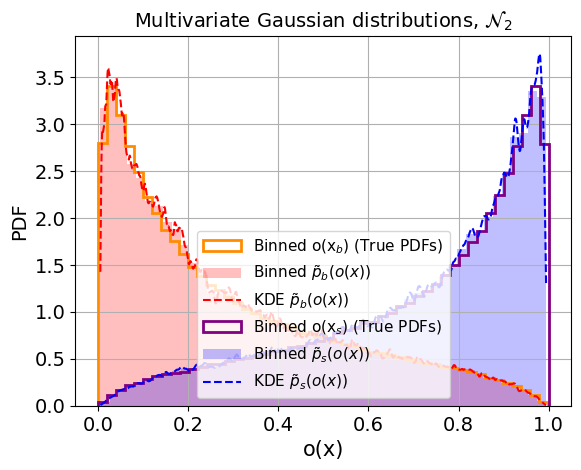

 Z MLL+KDE (1ML) 


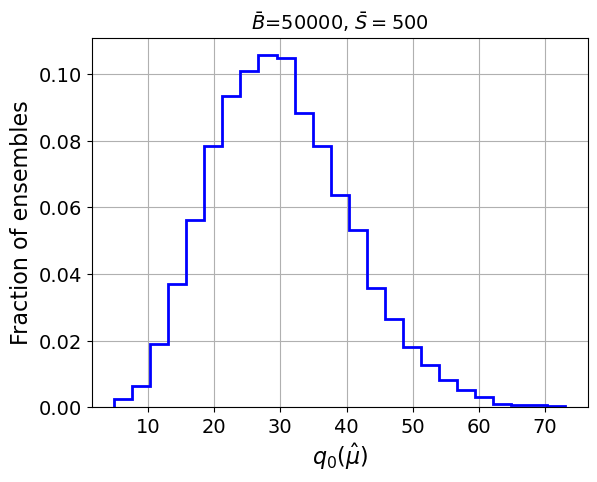

muhat mean_1ML:  0.19309033762546896
Z_KDE_1ML:  5.425691920247131
Z_KDE mu=0_1ML:  5.304542297647804

 Z MLL+KDE (10ML) 


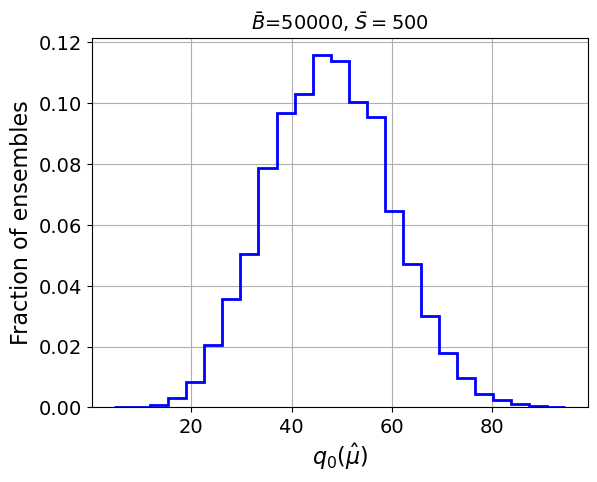

muhat mean:  0.051738821859474815
Z_KDE:  6.886105427021221
Z_KDE mu=0:  6.886729471523131

 ------------------------------------ 



In [26]:
dim=2

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T

dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 3)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 3)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 3)
y_gauss_test :  (1000000, 1)



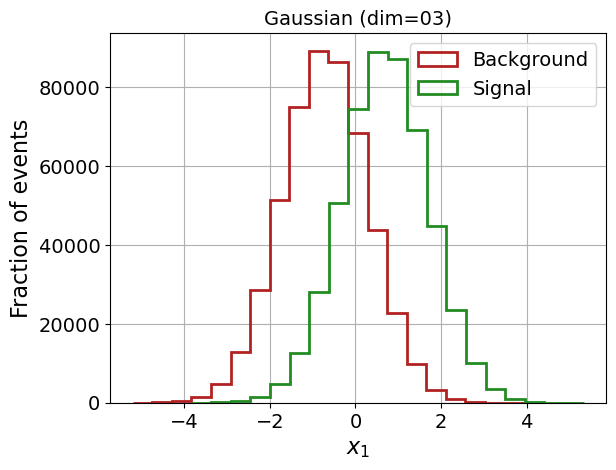

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.65174	validation_1-logloss:0.65182
[1]	validation_0-logloss:0.61771	validation_1-logloss:0.61788
[2]	validation_0-logloss:0.58946	validation_1-logloss:0.58971
[3]	validation_0-logloss:0.56576	validation_1-logloss:0.56609
[4]	validation_0-logloss:0.54567	validation_1-logloss:0.54608
[5]	validation_0-logloss:0.52867	validation_1-logloss:0.52915
[6]	validation_0-logloss:0.51412	validation_1-logloss:0.51466
[7]	validation_0-logloss:0.50165	validation_1-logloss:0.50225
[8]	validation_0-logloss:0.49094	validation_1-logloss:0.49159
[9]	validation_0-logloss:0.48170	validation_1-logloss:0.48240
[10]	validation_0-logloss:0.47370	validation_1-logloss:0.47446
[11]	validation_0-logloss:0.46681	validation_1-logloss:0.46762
[12]	validation_0-logloss:0.46083	validation_1-logloss:0.46169
[13]	validation_0-logloss:0.45567	validation_1-logloss:0.45657
[14]	validation_0-logloss:0.45118	validation_1-logloss:0.45209
[15]	validation_0-logloss:0.44728	validation_1-logloss:0.44823
[1

[130]	validation_0-logloss:0.42050	validation_1-logloss:0.42310
[131]	validation_0-logloss:0.42050	validation_1-logloss:0.42310
[132]	validation_0-logloss:0.42049	validation_1-logloss:0.42311
[133]	validation_0-logloss:0.42049	validation_1-logloss:0.42311
[134]	validation_0-logloss:0.42048	validation_1-logloss:0.42310
[135]	validation_0-logloss:0.42048	validation_1-logloss:0.42310
[136]	validation_0-logloss:0.42047	validation_1-logloss:0.42311
[137]	validation_0-logloss:0.42046	validation_1-logloss:0.42311
[138]	validation_0-logloss:0.42046	validation_1-logloss:0.42311
[139]	validation_0-logloss:0.42046	validation_1-logloss:0.42311


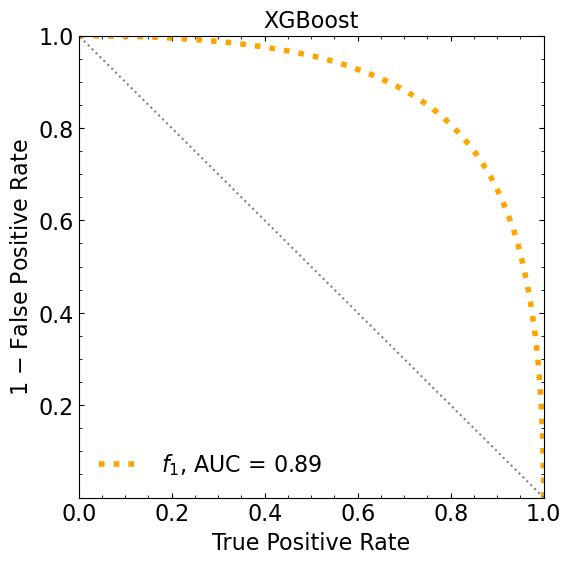

ML iteration 0
[0]	validation_0-logloss:0.65132	validation_1-logloss:0.65164
[1]	validation_0-logloss:0.61693	validation_1-logloss:0.61758
[2]	validation_0-logloss:0.58840	validation_1-logloss:0.58932


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56443	validation_1-logloss:0.56565
[4]	validation_0-logloss:0.54421	validation_1-logloss:0.54567
[5]	validation_0-logloss:0.52699	validation_1-logloss:0.52869
[6]	validation_0-logloss:0.51227	validation_1-logloss:0.51419
[7]	validation_0-logloss:0.49965	validation_1-logloss:0.50179
[8]	validation_0-logloss:0.48879	validation_1-logloss:0.49117
[9]	validation_0-logloss:0.47942	validation_1-logloss:0.48200
[10]	validation_0-logloss:0.47133	validation_1-logloss:0.47410
[11]	validation_0-logloss:0.46431	validation_1-logloss:0.46729
[12]	validation_0-logloss:0.45820	validation_1-logloss:0.46133
[13]	validation_0-logloss:0.45290	validation_1-logloss:0.45624
[14]	validation_0-logloss:0.44832	validation_1-logloss:0.45184
[15]	validation_0-logloss:0.44434	validation_1-logloss:0.44802
[16]	validation_0-logloss:0.44085	validation_1-logloss:0.44472
[17]	validation_0-logloss:0.43782	validation_1-logloss:0.44184
[18]	validation_0-logloss:0.43515	validation_1-logloss:0.43932

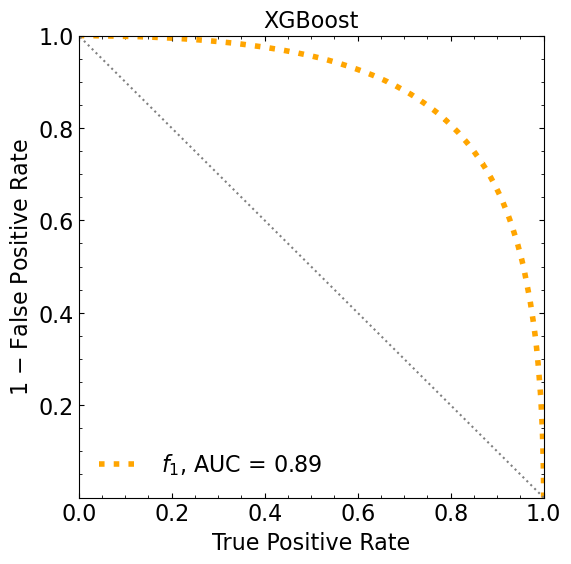

ML iteration  1
[0]	validation_0-logloss:0.65134	validation_1-logloss:0.65166
[1]	validation_0-logloss:0.61709	validation_1-logloss:0.61770
[2]	validation_0-logloss:0.58859	validation_1-logloss:0.58947


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56467	validation_1-logloss:0.56578
[4]	validation_0-logloss:0.54448	validation_1-logloss:0.54584
[5]	validation_0-logloss:0.52731	validation_1-logloss:0.52888
[6]	validation_0-logloss:0.51259	validation_1-logloss:0.51431
[7]	validation_0-logloss:0.50001	validation_1-logloss:0.50192
[8]	validation_0-logloss:0.48922	validation_1-logloss:0.49130
[9]	validation_0-logloss:0.47994	validation_1-logloss:0.48216
[10]	validation_0-logloss:0.47192	validation_1-logloss:0.47427
[11]	validation_0-logloss:0.46492	validation_1-logloss:0.46743
[12]	validation_0-logloss:0.45888	validation_1-logloss:0.46153
[13]	validation_0-logloss:0.45364	validation_1-logloss:0.45642
[14]	validation_0-logloss:0.44911	validation_1-logloss:0.45204
[15]	validation_0-logloss:0.44516	validation_1-logloss:0.44824
[16]	validation_0-logloss:0.44173	validation_1-logloss:0.44492
[17]	validation_0-logloss:0.43870	validation_1-logloss:0.44205
[18]	validation_0-logloss:0.43609	validation_1-logloss:0.43955

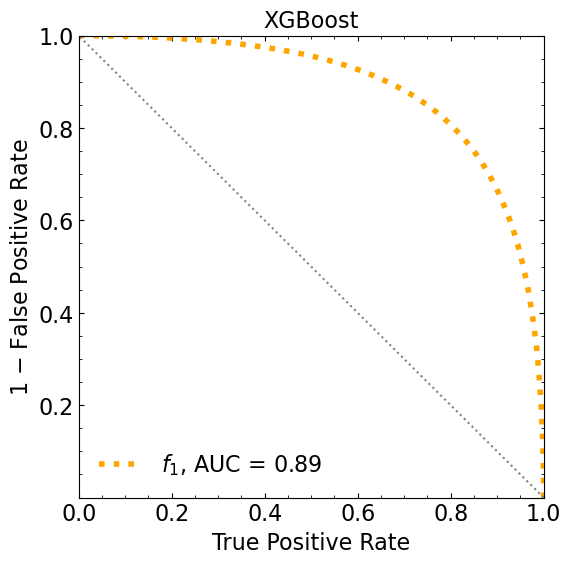

ML iteration  2
[0]	validation_0-logloss:0.65145	validation_1-logloss:0.65173
[1]	validation_0-logloss:0.61725	validation_1-logloss:0.61777
[2]	validation_0-logloss:0.58879	validation_1-logloss:0.58958


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56490	validation_1-logloss:0.56589
[4]	validation_0-logloss:0.54476	validation_1-logloss:0.54597
[5]	validation_0-logloss:0.52761	validation_1-logloss:0.52903
[6]	validation_0-logloss:0.51293	validation_1-logloss:0.51455
[7]	validation_0-logloss:0.50042	validation_1-logloss:0.50223
[8]	validation_0-logloss:0.48960	validation_1-logloss:0.49157
[9]	validation_0-logloss:0.48026	validation_1-logloss:0.48237
[10]	validation_0-logloss:0.47222	validation_1-logloss:0.47449
[11]	validation_0-logloss:0.46523	validation_1-logloss:0.46767
[12]	validation_0-logloss:0.45916	validation_1-logloss:0.46175
[13]	validation_0-logloss:0.45393	validation_1-logloss:0.45665
[14]	validation_0-logloss:0.44936	validation_1-logloss:0.45221
[15]	validation_0-logloss:0.44542	validation_1-logloss:0.44841
[16]	validation_0-logloss:0.44199	validation_1-logloss:0.44512
[17]	validation_0-logloss:0.43896	validation_1-logloss:0.44222
[18]	validation_0-logloss:0.43635	validation_1-logloss:0.43973

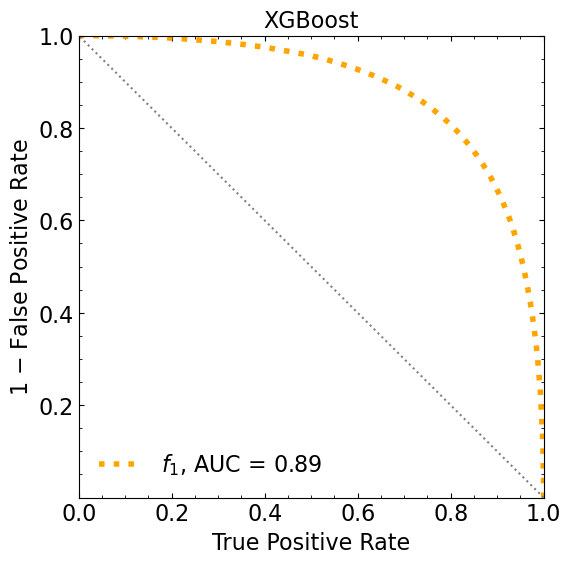

ML iteration  3
[0]	validation_0-logloss:0.65133	validation_1-logloss:0.65167
[1]	validation_0-logloss:0.61697	validation_1-logloss:0.61764
[2]	validation_0-logloss:0.58831	validation_1-logloss:0.58933


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56428	validation_1-logloss:0.56564
[4]	validation_0-logloss:0.54407	validation_1-logloss:0.54566
[5]	validation_0-logloss:0.52682	validation_1-logloss:0.52865
[6]	validation_0-logloss:0.51205	validation_1-logloss:0.51413
[7]	validation_0-logloss:0.49937	validation_1-logloss:0.50175
[8]	validation_0-logloss:0.48846	validation_1-logloss:0.49112
[9]	validation_0-logloss:0.47905	validation_1-logloss:0.48193
[10]	validation_0-logloss:0.47096	validation_1-logloss:0.47407
[11]	validation_0-logloss:0.46394	validation_1-logloss:0.46724
[12]	validation_0-logloss:0.45784	validation_1-logloss:0.46134
[13]	validation_0-logloss:0.45254	validation_1-logloss:0.45625
[14]	validation_0-logloss:0.44795	validation_1-logloss:0.45181
[15]	validation_0-logloss:0.44395	validation_1-logloss:0.44801
[16]	validation_0-logloss:0.44049	validation_1-logloss:0.44472
[17]	validation_0-logloss:0.43743	validation_1-logloss:0.44186
[18]	validation_0-logloss:0.43479	validation_1-logloss:0.43940

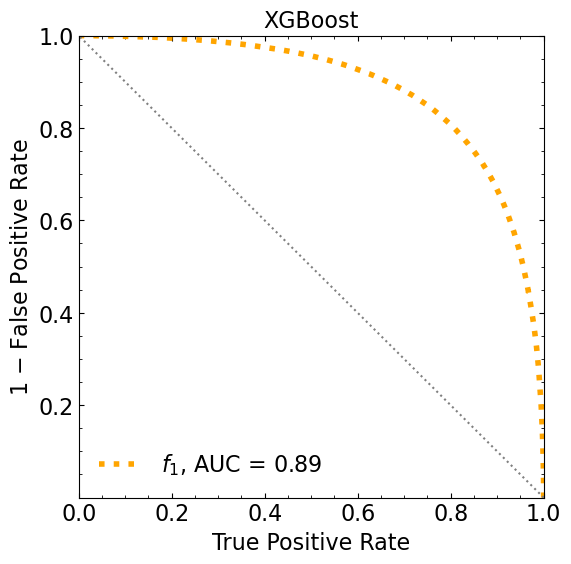

ML iteration  4
[0]	validation_0-logloss:0.65123	validation_1-logloss:0.65164
[1]	validation_0-logloss:0.61679	validation_1-logloss:0.61759
[2]	validation_0-logloss:0.58819	validation_1-logloss:0.58934


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56420	validation_1-logloss:0.56568
[4]	validation_0-logloss:0.54384	validation_1-logloss:0.54566
[5]	validation_0-logloss:0.52663	validation_1-logloss:0.52870
[6]	validation_0-logloss:0.51183	validation_1-logloss:0.51413
[7]	validation_0-logloss:0.49918	validation_1-logloss:0.50172
[8]	validation_0-logloss:0.48827	validation_1-logloss:0.49106
[9]	validation_0-logloss:0.47884	validation_1-logloss:0.48190
[10]	validation_0-logloss:0.47072	validation_1-logloss:0.47397
[11]	validation_0-logloss:0.46371	validation_1-logloss:0.46717
[12]	validation_0-logloss:0.45762	validation_1-logloss:0.46129
[13]	validation_0-logloss:0.45234	validation_1-logloss:0.45622
[14]	validation_0-logloss:0.44776	validation_1-logloss:0.45183
[15]	validation_0-logloss:0.44375	validation_1-logloss:0.44800
[16]	validation_0-logloss:0.44026	validation_1-logloss:0.44466
[17]	validation_0-logloss:0.43722	validation_1-logloss:0.44177
[18]	validation_0-logloss:0.43460	validation_1-logloss:0.43929

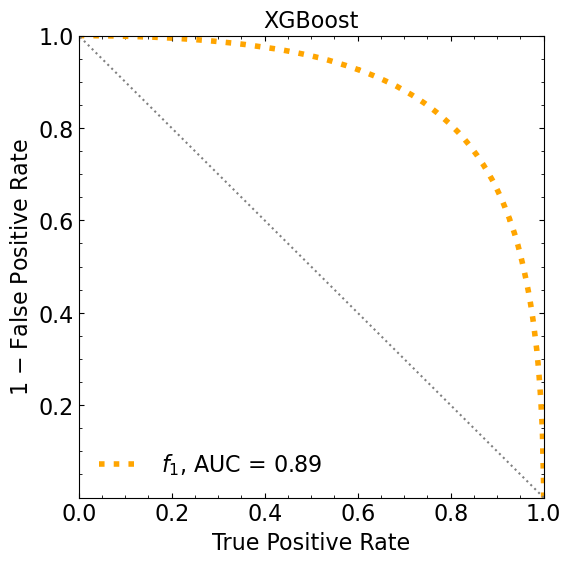

ML iteration  5
[0]	validation_0-logloss:0.65120	validation_1-logloss:0.65167
[1]	validation_0-logloss:0.61681	validation_1-logloss:0.61765
[2]	validation_0-logloss:0.58816	validation_1-logloss:0.58934


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56415	validation_1-logloss:0.56561
[4]	validation_0-logloss:0.54386	validation_1-logloss:0.54559
[5]	validation_0-logloss:0.52665	validation_1-logloss:0.52861
[6]	validation_0-logloss:0.51191	validation_1-logloss:0.51413
[7]	validation_0-logloss:0.49929	validation_1-logloss:0.50181
[8]	validation_0-logloss:0.48843	validation_1-logloss:0.49118
[9]	validation_0-logloss:0.47907	validation_1-logloss:0.48203
[10]	validation_0-logloss:0.47101	validation_1-logloss:0.47417
[11]	validation_0-logloss:0.46402	validation_1-logloss:0.46739
[12]	validation_0-logloss:0.45793	validation_1-logloss:0.46148
[13]	validation_0-logloss:0.45264	validation_1-logloss:0.45637
[14]	validation_0-logloss:0.44811	validation_1-logloss:0.45198
[15]	validation_0-logloss:0.44414	validation_1-logloss:0.44818
[16]	validation_0-logloss:0.44070	validation_1-logloss:0.44490
[17]	validation_0-logloss:0.43768	validation_1-logloss:0.44205
[18]	validation_0-logloss:0.43505	validation_1-logloss:0.43954

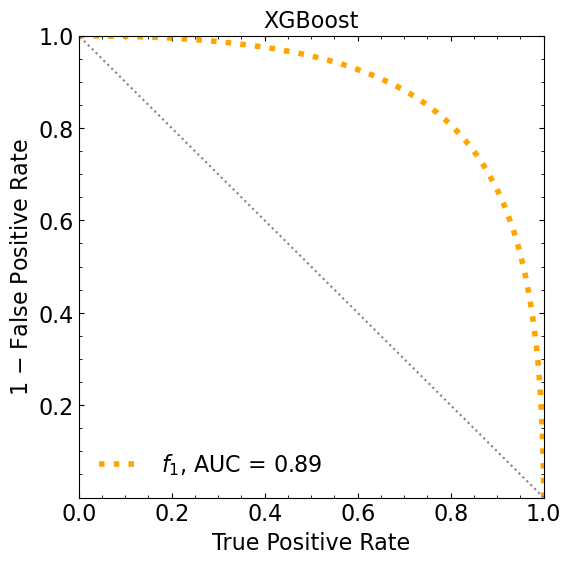

ML iteration  6
[0]	validation_0-logloss:0.65116	validation_1-logloss:0.65169
[1]	validation_0-logloss:0.61674	validation_1-logloss:0.61775
[2]	validation_0-logloss:0.58818	validation_1-logloss:0.58962


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56416	validation_1-logloss:0.56594
[4]	validation_0-logloss:0.54385	validation_1-logloss:0.54597
[5]	validation_0-logloss:0.52659	validation_1-logloss:0.52902
[6]	validation_0-logloss:0.51174	validation_1-logloss:0.51444
[7]	validation_0-logloss:0.49906	validation_1-logloss:0.50202
[8]	validation_0-logloss:0.48810	validation_1-logloss:0.49133
[9]	validation_0-logloss:0.47865	validation_1-logloss:0.48213
[10]	validation_0-logloss:0.47054	validation_1-logloss:0.47424
[11]	validation_0-logloss:0.46354	validation_1-logloss:0.46738
[12]	validation_0-logloss:0.45744	validation_1-logloss:0.46150
[13]	validation_0-logloss:0.45213	validation_1-logloss:0.45640
[14]	validation_0-logloss:0.44753	validation_1-logloss:0.45196
[15]	validation_0-logloss:0.44355	validation_1-logloss:0.44815
[16]	validation_0-logloss:0.44006	validation_1-logloss:0.44483
[17]	validation_0-logloss:0.43705	validation_1-logloss:0.44196
[18]	validation_0-logloss:0.43440	validation_1-logloss:0.43946

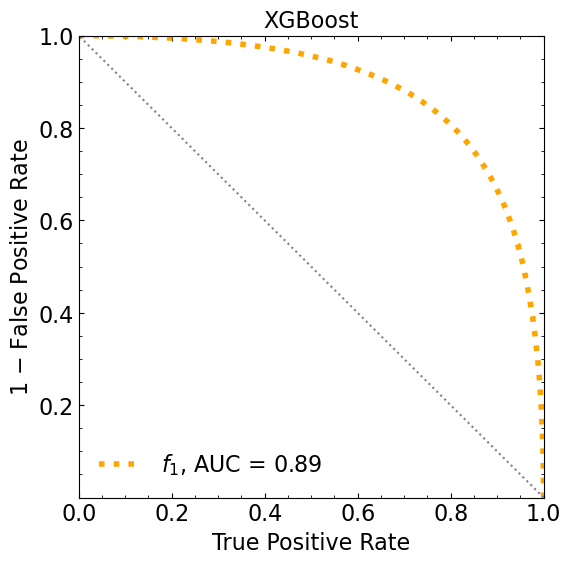

ML iteration  7
[0]	validation_0-logloss:0.65126	validation_1-logloss:0.65172
[1]	validation_0-logloss:0.61684	validation_1-logloss:0.61775
[2]	validation_0-logloss:0.58829	validation_1-logloss:0.58954


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56432	validation_1-logloss:0.56589
[4]	validation_0-logloss:0.54405	validation_1-logloss:0.54592
[5]	validation_0-logloss:0.52683	validation_1-logloss:0.52893
[6]	validation_0-logloss:0.51211	validation_1-logloss:0.51445
[7]	validation_0-logloss:0.49952	validation_1-logloss:0.50205
[8]	validation_0-logloss:0.48872	validation_1-logloss:0.49143
[9]	validation_0-logloss:0.47939	validation_1-logloss:0.48232
[10]	validation_0-logloss:0.47133	validation_1-logloss:0.47446
[11]	validation_0-logloss:0.46435	validation_1-logloss:0.46763
[12]	validation_0-logloss:0.45830	validation_1-logloss:0.46173
[13]	validation_0-logloss:0.45304	validation_1-logloss:0.45667
[14]	validation_0-logloss:0.44848	validation_1-logloss:0.45226
[15]	validation_0-logloss:0.44454	validation_1-logloss:0.44844
[16]	validation_0-logloss:0.44109	validation_1-logloss:0.44511
[17]	validation_0-logloss:0.43809	validation_1-logloss:0.44223
[18]	validation_0-logloss:0.43548	validation_1-logloss:0.43973

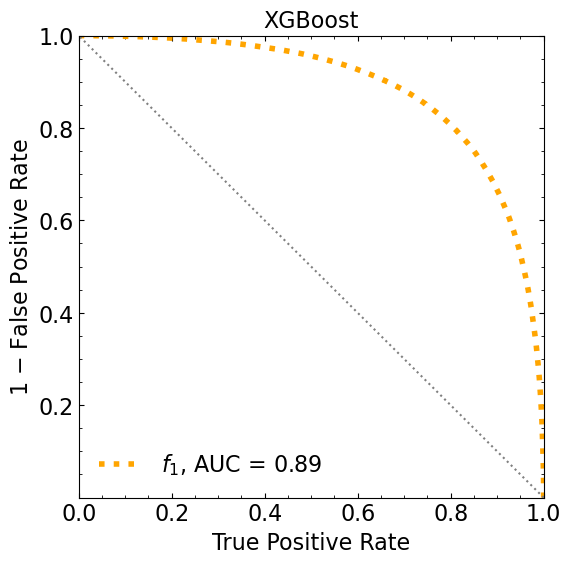

ML iteration  8
[0]	validation_0-logloss:0.65117	validation_1-logloss:0.65166
[1]	validation_0-logloss:0.61666	validation_1-logloss:0.61761
[2]	validation_0-logloss:0.58801	validation_1-logloss:0.58938


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56401	validation_1-logloss:0.56571
[4]	validation_0-logloss:0.54373	validation_1-logloss:0.54575
[5]	validation_0-logloss:0.52648	validation_1-logloss:0.52883
[6]	validation_0-logloss:0.51160	validation_1-logloss:0.51424
[7]	validation_0-logloss:0.49888	validation_1-logloss:0.50177
[8]	validation_0-logloss:0.48799	validation_1-logloss:0.49114
[9]	validation_0-logloss:0.47862	validation_1-logloss:0.48199
[10]	validation_0-logloss:0.47048	validation_1-logloss:0.47410
[11]	validation_0-logloss:0.46344	validation_1-logloss:0.46726
[12]	validation_0-logloss:0.45736	validation_1-logloss:0.46140
[13]	validation_0-logloss:0.45205	validation_1-logloss:0.45627
[14]	validation_0-logloss:0.44743	validation_1-logloss:0.45184
[15]	validation_0-logloss:0.44345	validation_1-logloss:0.44805
[16]	validation_0-logloss:0.43999	validation_1-logloss:0.44477
[17]	validation_0-logloss:0.43697	validation_1-logloss:0.44191
[18]	validation_0-logloss:0.43431	validation_1-logloss:0.43941

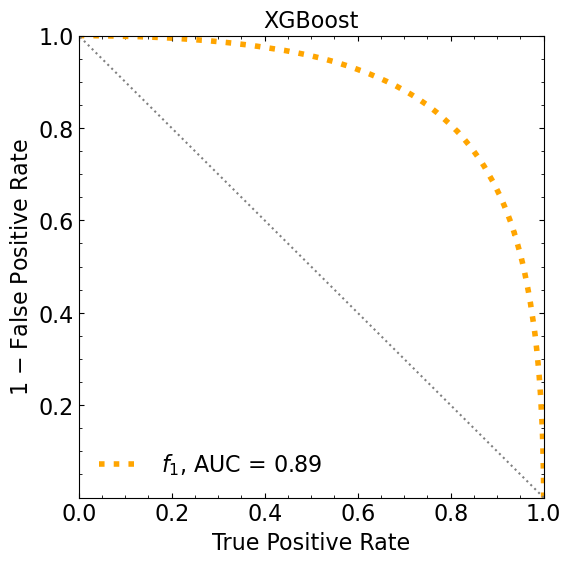

ML iteration  9
[0]	validation_0-logloss:0.65169	validation_1-logloss:0.65188
[1]	validation_0-logloss:0.61765	validation_1-logloss:0.61799
[2]	validation_0-logloss:0.58928	validation_1-logloss:0.58980


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56545	validation_1-logloss:0.56613
[4]	validation_0-logloss:0.54535	validation_1-logloss:0.54615
[5]	validation_0-logloss:0.52821	validation_1-logloss:0.52917
[6]	validation_0-logloss:0.51360	validation_1-logloss:0.51469
[7]	validation_0-logloss:0.50108	validation_1-logloss:0.50235
[8]	validation_0-logloss:0.49031	validation_1-logloss:0.49172
[9]	validation_0-logloss:0.48104	validation_1-logloss:0.48258
[10]	validation_0-logloss:0.47297	validation_1-logloss:0.47463
[11]	validation_0-logloss:0.46599	validation_1-logloss:0.46777
[12]	validation_0-logloss:0.45991	validation_1-logloss:0.46182
[13]	validation_0-logloss:0.45464	validation_1-logloss:0.45669
[14]	validation_0-logloss:0.45010	validation_1-logloss:0.45229
[15]	validation_0-logloss:0.44615	validation_1-logloss:0.44842
[16]	validation_0-logloss:0.44272	validation_1-logloss:0.44511
[17]	validation_0-logloss:0.43969	validation_1-logloss:0.44223
[18]	validation_0-logloss:0.43705	validation_1-logloss:0.43971

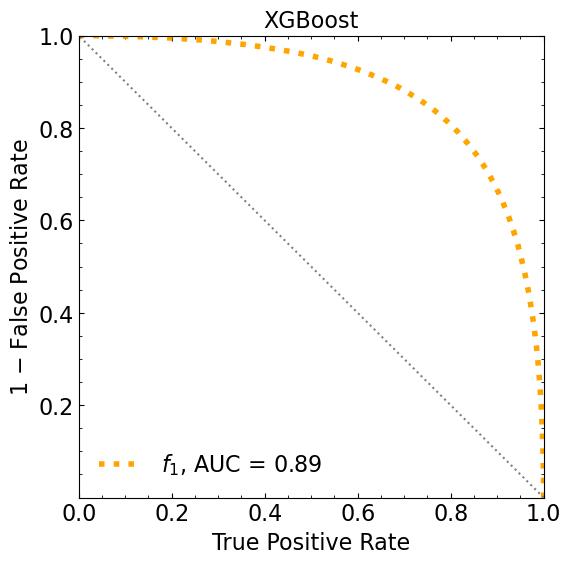

Classification score (1 ML):


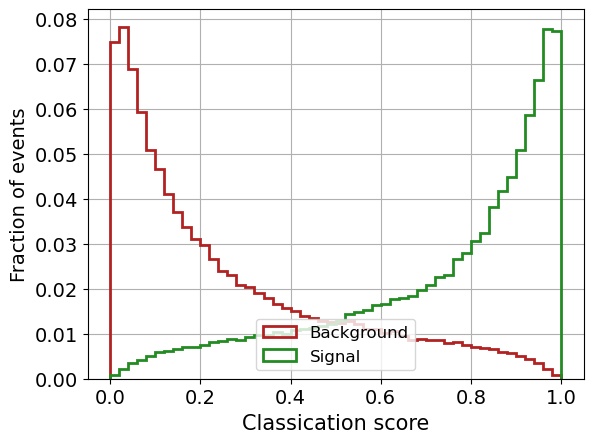

Classification score (10 ML):


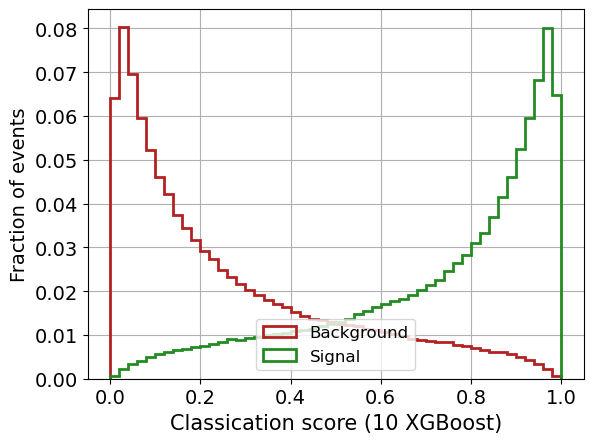

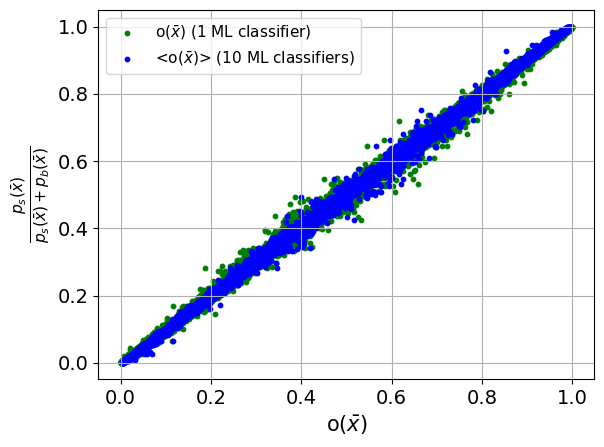


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  6.249923275592657
Z_XG 25 bins_1ML:  7.028357293788718
Z_XG 50 bins_1ML:  7.308031601210633
Z_XG 100 bins_1ML:  7.420712928462088

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  4.751711089106676
Z_XG 25 bins_eq_1ML:  5.5904498382821535
Z_XG 50 bins_eq_1ML:  6.1036652028325395
Z_XG 100 bins_eq_1ML:  6.539558086277514

 BL lineal bins, 10 ML
Z_XG 10 bins:  6.278620138619649
Z_XG 25 bins:  7.076088010630205
Z_XG 50 bins:  7.3837575428649185
Z_XG 100 bins:  7.486597066245859

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  4.759520370806363
Z_XG 25 bins_eq:  5.601704279818991
Z_XG 50 bins_eq:  6.114580953796853
Z_XG 100 bins_eq:  6.553176851041445

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSS

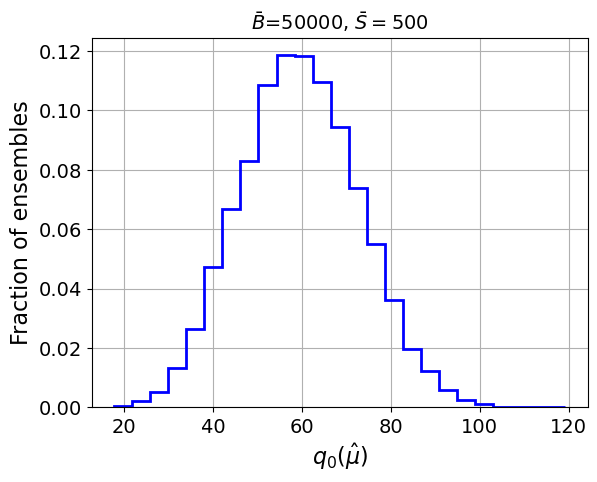

muhat mean:  0.053016323633782836
Z_gaussian:  7.7004787265938885
Z_gaussian_mu0:  7.701193927339663

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf  1362.47655139  1378.07823765  1385.39680918
  1388.83266242  1387.8025671   1379.48771621  1365.86946229
  1343.3042139   1311.46957444  1261.84462817  1185.84386194
  1078.14950918   930.18285583   720.713894     430.61681873
    40.47578643  -462.25363922 -1104.11021473 -2036.74946216]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf  1380.86724279
  1381.2098948   1378.4483834   1372.8527599   1361.80152666
  1343.12212145  1312.84654745  1265.79

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.004386370005779536


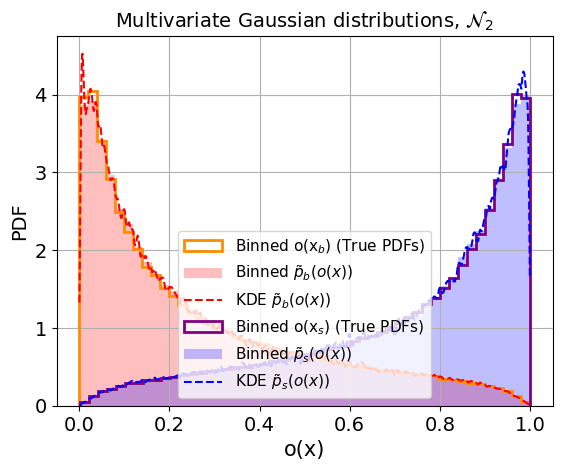

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf  1401.1812842   1407.4757092
  1406.78598511  1404.98353271  1399.89872136  1388.74215671
  1368.14282274  1334.45912324  1281.92467781  1203.37801179
  1094.04341745   944.19008649   734.7690615    445.53974949
    57.53457368  -444.22529927 -1088.91554495 -2029.95971743]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
  1392.97972342  1393.14197629  1387.97620534  1377.39139788
  1359.77694898  1330.52039519  1283.135

KDE Kernel:  epanechnikov
Background bandwidth:  0.003030951223220623
Signal bandwidth:  0.0063479219593504735


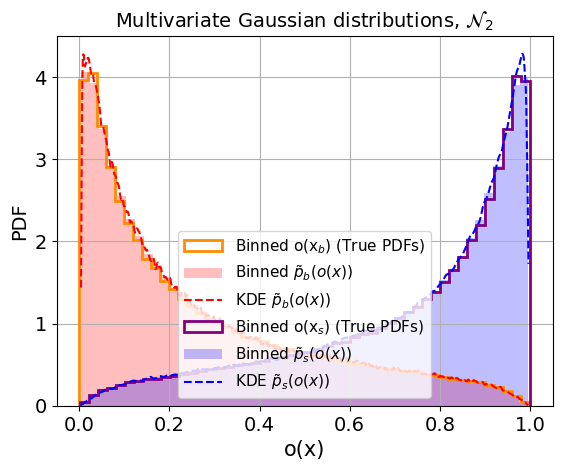

 Z MLL+KDE (1ML) 


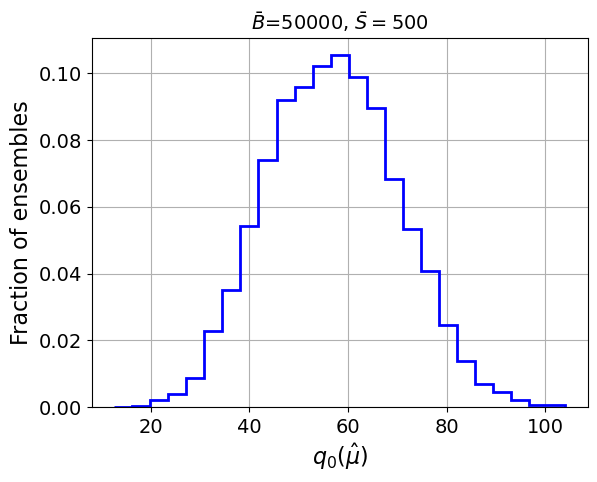

muhat mean_1ML:  0.05097333468518707
Z_KDE_1ML:  7.540776850082608
Z_KDE mu=0_1ML:  7.541886958129575

 Z MLL+KDE (10ML) 


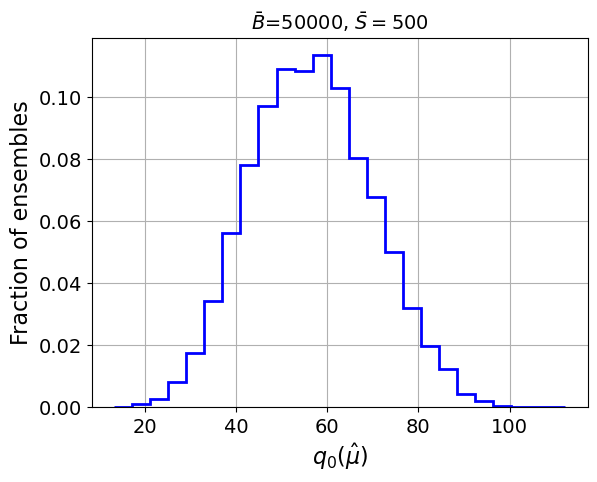

muhat mean:  0.05209368346344925
Z_KDE:  7.50224453731486
Z_KDE mu=0:  7.504024112903142

 ------------------------------------ 



In [27]:
dim=3

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T

dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 4)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 4)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 4)
y_gauss_test :  (1000000, 1)



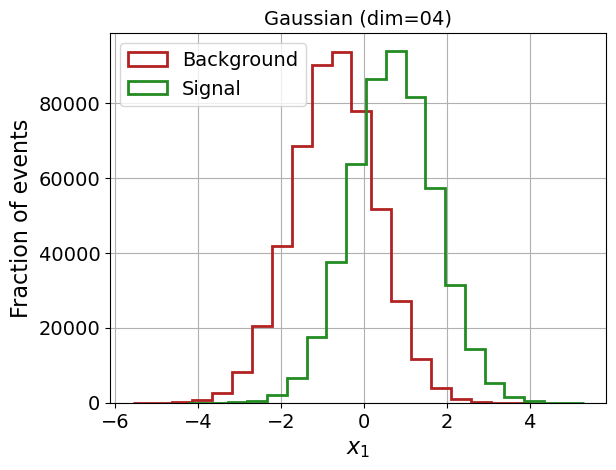

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.65080	validation_1-logloss:0.65082
[1]	validation_0-logloss:0.61593	validation_1-logloss:0.61599
[2]	validation_0-logloss:0.58690	validation_1-logloss:0.58701
[3]	validation_0-logloss:0.56249	validation_1-logloss:0.56264
[4]	validation_0-logloss:0.54183	validation_1-logloss:0.54200
[5]	validation_0-logloss:0.52424	validation_1-logloss:0.52444
[6]	validation_0-logloss:0.50915	validation_1-logloss:0.50937
[7]	validation_0-logloss:0.49619	validation_1-logloss:0.49646
[8]	validation_0-logloss:0.48503	validation_1-logloss:0.48535
[9]	validation_0-logloss:0.47537	validation_1-logloss:0.47573
[10]	validation_0-logloss:0.46697	validation_1-logloss:0.46735
[11]	validation_0-logloss:0.45969	validation_1-logloss:0.46009
[12]	validation_0-logloss:0.45332	validation_1-logloss:0.45374
[13]	validation_0-logloss:0.44777	validation_1-logloss:0.44822
[14]	validation_0-logloss:0.44292	validation_1-logloss:0.44339
[15]	validation_0-logloss:0.43869	validation_1-logloss:0.43917
[1

[130]	validation_0-logloss:0.40771	validation_1-logloss:0.40986
[131]	validation_0-logloss:0.40770	validation_1-logloss:0.40986
[132]	validation_0-logloss:0.40770	validation_1-logloss:0.40986
[133]	validation_0-logloss:0.40769	validation_1-logloss:0.40986
[134]	validation_0-logloss:0.40768	validation_1-logloss:0.40986
[135]	validation_0-logloss:0.40768	validation_1-logloss:0.40986
[136]	validation_0-logloss:0.40767	validation_1-logloss:0.40986
[137]	validation_0-logloss:0.40766	validation_1-logloss:0.40986
[138]	validation_0-logloss:0.40764	validation_1-logloss:0.40986
[139]	validation_0-logloss:0.40763	validation_1-logloss:0.40986
[140]	validation_0-logloss:0.40763	validation_1-logloss:0.40986
[141]	validation_0-logloss:0.40762	validation_1-logloss:0.40986
[142]	validation_0-logloss:0.40759	validation_1-logloss:0.40985
[143]	validation_0-logloss:0.40758	validation_1-logloss:0.40985
[144]	validation_0-logloss:0.40757	validation_1-logloss:0.40985
[145]	validation_0-logloss:0.40757	valid

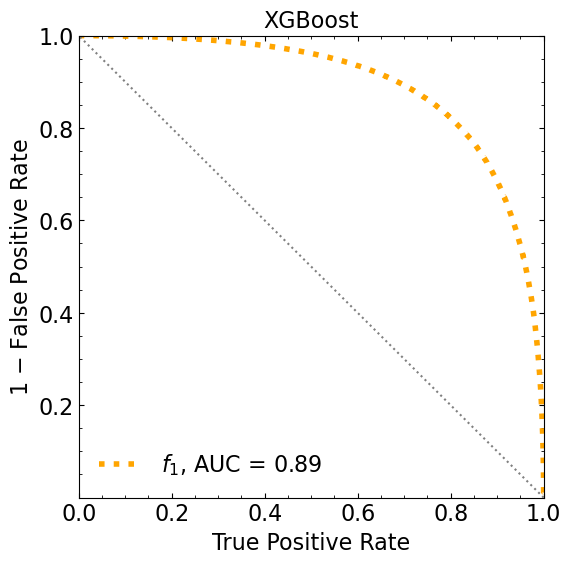

ML iteration 0
[0]	validation_0-logloss:0.65019	validation_1-logloss:0.65067
[1]	validation_0-logloss:0.61499	validation_1-logloss:0.61586
[2]	validation_0-logloss:0.58546	validation_1-logloss:0.58672


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56072	validation_1-logloss:0.56233
[4]	validation_0-logloss:0.53963	validation_1-logloss:0.54160
[5]	validation_0-logloss:0.52174	validation_1-logloss:0.52395
[6]	validation_0-logloss:0.50641	validation_1-logloss:0.50888
[7]	validation_0-logloss:0.49318	validation_1-logloss:0.49597
[8]	validation_0-logloss:0.48181	validation_1-logloss:0.48485
[9]	validation_0-logloss:0.47193	validation_1-logloss:0.47522
[10]	validation_0-logloss:0.46336	validation_1-logloss:0.46690
[11]	validation_0-logloss:0.45590	validation_1-logloss:0.45969
[12]	validation_0-logloss:0.44942	validation_1-logloss:0.45343
[13]	validation_0-logloss:0.44377	validation_1-logloss:0.44796
[14]	validation_0-logloss:0.43886	validation_1-logloss:0.44321
[15]	validation_0-logloss:0.43452	validation_1-logloss:0.43905
[16]	validation_0-logloss:0.43072	validation_1-logloss:0.43542
[17]	validation_0-logloss:0.42739	validation_1-logloss:0.43230
[18]	validation_0-logloss:0.42447	validation_1-logloss:0.42955

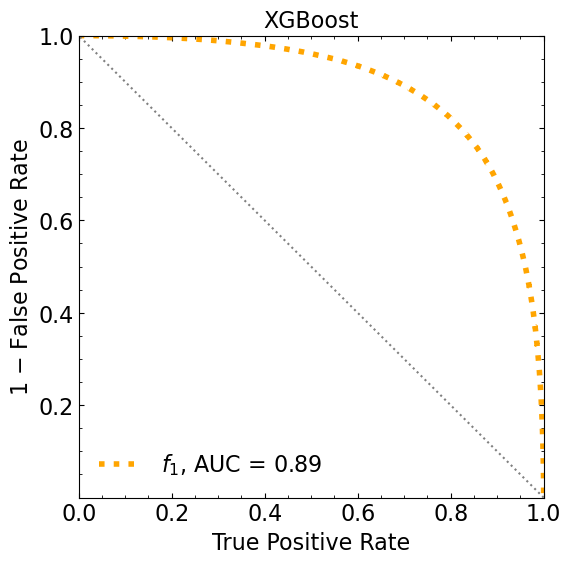

ML iteration  1
[0]	validation_0-logloss:0.65032	validation_1-logloss:0.65068
[1]	validation_0-logloss:0.61509	validation_1-logloss:0.61582
[2]	validation_0-logloss:0.58569	validation_1-logloss:0.58676


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56107	validation_1-logloss:0.56243
[4]	validation_0-logloss:0.54011	validation_1-logloss:0.54174
[5]	validation_0-logloss:0.52218	validation_1-logloss:0.52413
[6]	validation_0-logloss:0.50693	validation_1-logloss:0.50914
[7]	validation_0-logloss:0.49378	validation_1-logloss:0.49617
[8]	validation_0-logloss:0.48241	validation_1-logloss:0.48502
[9]	validation_0-logloss:0.47248	validation_1-logloss:0.47534
[10]	validation_0-logloss:0.46394	validation_1-logloss:0.46702
[11]	validation_0-logloss:0.45649	validation_1-logloss:0.45978
[12]	validation_0-logloss:0.44998	validation_1-logloss:0.45347
[13]	validation_0-logloss:0.44432	validation_1-logloss:0.44801
[14]	validation_0-logloss:0.43938	validation_1-logloss:0.44327
[15]	validation_0-logloss:0.43505	validation_1-logloss:0.43913
[16]	validation_0-logloss:0.43125	validation_1-logloss:0.43551
[17]	validation_0-logloss:0.42794	validation_1-logloss:0.43230
[18]	validation_0-logloss:0.42499	validation_1-logloss:0.42953

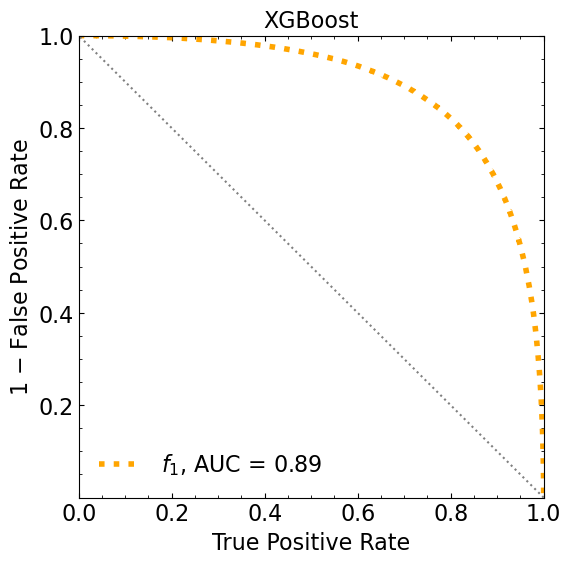

ML iteration  2
[0]	validation_0-logloss:0.65052	validation_1-logloss:0.65079
[1]	validation_0-logloss:0.61545	validation_1-logloss:0.61603
[2]	validation_0-logloss:0.58608	validation_1-logloss:0.58687


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56147	validation_1-logloss:0.56254
[4]	validation_0-logloss:0.54059	validation_1-logloss:0.54191
[5]	validation_0-logloss:0.52276	validation_1-logloss:0.52428
[6]	validation_0-logloss:0.50749	validation_1-logloss:0.50922
[7]	validation_0-logloss:0.49444	validation_1-logloss:0.49633
[8]	validation_0-logloss:0.48315	validation_1-logloss:0.48520
[9]	validation_0-logloss:0.47334	validation_1-logloss:0.47559
[10]	validation_0-logloss:0.46484	validation_1-logloss:0.46722
[11]	validation_0-logloss:0.45746	validation_1-logloss:0.45998
[12]	validation_0-logloss:0.45099	validation_1-logloss:0.45367
[13]	validation_0-logloss:0.44539	validation_1-logloss:0.44823
[14]	validation_0-logloss:0.44046	validation_1-logloss:0.44345
[15]	validation_0-logloss:0.43613	validation_1-logloss:0.43927
[16]	validation_0-logloss:0.43237	validation_1-logloss:0.43564
[17]	validation_0-logloss:0.42904	validation_1-logloss:0.43245
[18]	validation_0-logloss:0.42612	validation_1-logloss:0.42970

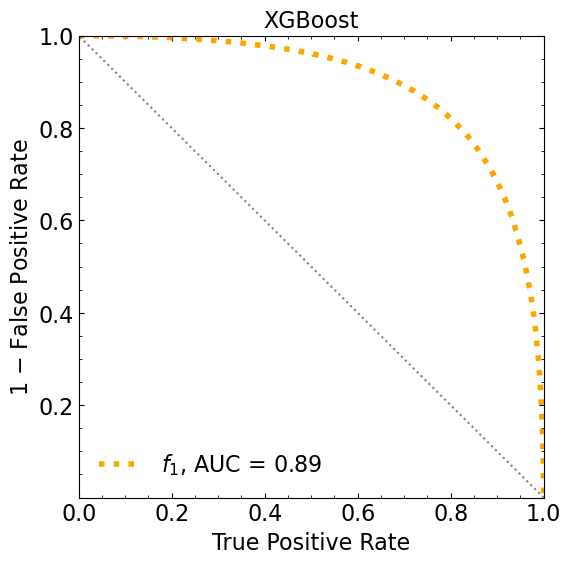

ML iteration  3
[0]	validation_0-logloss:0.65022	validation_1-logloss:0.65065
[1]	validation_0-logloss:0.61494	validation_1-logloss:0.61574
[2]	validation_0-logloss:0.58551	validation_1-logloss:0.58671


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56074	validation_1-logloss:0.56230
[4]	validation_0-logloss:0.53984	validation_1-logloss:0.54170
[5]	validation_0-logloss:0.52193	validation_1-logloss:0.52409
[6]	validation_0-logloss:0.50651	validation_1-logloss:0.50901
[7]	validation_0-logloss:0.49331	validation_1-logloss:0.49607
[8]	validation_0-logloss:0.48192	validation_1-logloss:0.48493
[9]	validation_0-logloss:0.47206	validation_1-logloss:0.47528
[10]	validation_0-logloss:0.46346	validation_1-logloss:0.46691
[11]	validation_0-logloss:0.45598	validation_1-logloss:0.45963
[12]	validation_0-logloss:0.44942	validation_1-logloss:0.45330
[13]	validation_0-logloss:0.44374	validation_1-logloss:0.44781
[14]	validation_0-logloss:0.43877	validation_1-logloss:0.44304
[15]	validation_0-logloss:0.43439	validation_1-logloss:0.43886
[16]	validation_0-logloss:0.43057	validation_1-logloss:0.43522
[17]	validation_0-logloss:0.42722	validation_1-logloss:0.43203
[18]	validation_0-logloss:0.42427	validation_1-logloss:0.42925

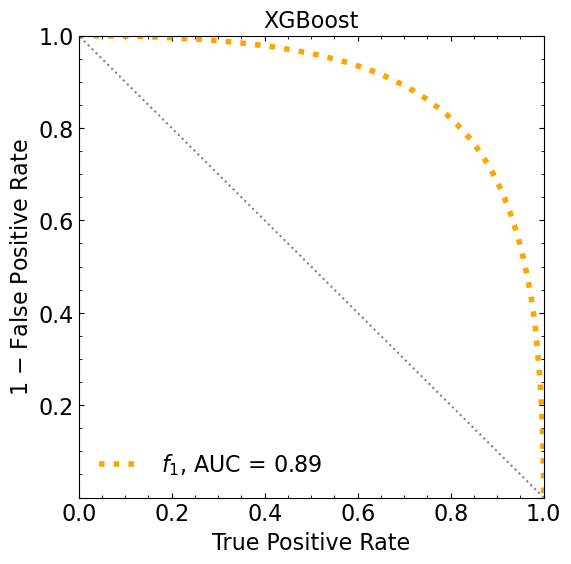

ML iteration  4
[0]	validation_0-logloss:0.65022	validation_1-logloss:0.65058
[1]	validation_0-logloss:0.61484	validation_1-logloss:0.61559
[2]	validation_0-logloss:0.58540	validation_1-logloss:0.58649


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56063	validation_1-logloss:0.56208
[4]	validation_0-logloss:0.53969	validation_1-logloss:0.54144
[5]	validation_0-logloss:0.52178	validation_1-logloss:0.52385
[6]	validation_0-logloss:0.50639	validation_1-logloss:0.50874
[7]	validation_0-logloss:0.49318	validation_1-logloss:0.49578
[8]	validation_0-logloss:0.48176	validation_1-logloss:0.48461
[9]	validation_0-logloss:0.47183	validation_1-logloss:0.47496
[10]	validation_0-logloss:0.46327	validation_1-logloss:0.46665
[11]	validation_0-logloss:0.45574	validation_1-logloss:0.45939
[12]	validation_0-logloss:0.44917	validation_1-logloss:0.45309
[13]	validation_0-logloss:0.44341	validation_1-logloss:0.44758
[14]	validation_0-logloss:0.43841	validation_1-logloss:0.44280
[15]	validation_0-logloss:0.43404	validation_1-logloss:0.43862
[16]	validation_0-logloss:0.43018	validation_1-logloss:0.43499
[17]	validation_0-logloss:0.42680	validation_1-logloss:0.43179
[18]	validation_0-logloss:0.42383	validation_1-logloss:0.42900

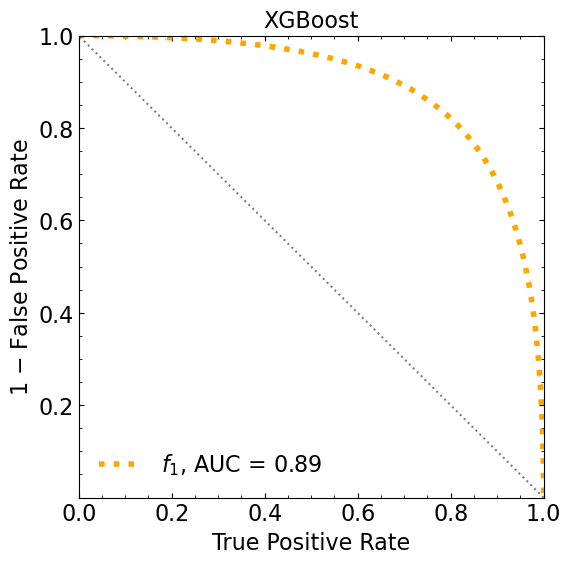

ML iteration  5
[0]	validation_0-logloss:0.65052	validation_1-logloss:0.65075
[1]	validation_0-logloss:0.61544	validation_1-logloss:0.61591
[2]	validation_0-logloss:0.58622	validation_1-logloss:0.58690


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56176	validation_1-logloss:0.56258
[4]	validation_0-logloss:0.54101	validation_1-logloss:0.54199
[5]	validation_0-logloss:0.52325	validation_1-logloss:0.52437
[6]	validation_0-logloss:0.50798	validation_1-logloss:0.50928
[7]	validation_0-logloss:0.49491	validation_1-logloss:0.49634
[8]	validation_0-logloss:0.48359	validation_1-logloss:0.48518
[9]	validation_0-logloss:0.47379	validation_1-logloss:0.47554
[10]	validation_0-logloss:0.46528	validation_1-logloss:0.46721
[11]	validation_0-logloss:0.45789	validation_1-logloss:0.45996
[12]	validation_0-logloss:0.45144	validation_1-logloss:0.45366
[13]	validation_0-logloss:0.44582	validation_1-logloss:0.44818
[14]	validation_0-logloss:0.44088	validation_1-logloss:0.44339
[15]	validation_0-logloss:0.43658	validation_1-logloss:0.43925
[16]	validation_0-logloss:0.43279	validation_1-logloss:0.43558
[17]	validation_0-logloss:0.42949	validation_1-logloss:0.43242
[18]	validation_0-logloss:0.42659	validation_1-logloss:0.42965

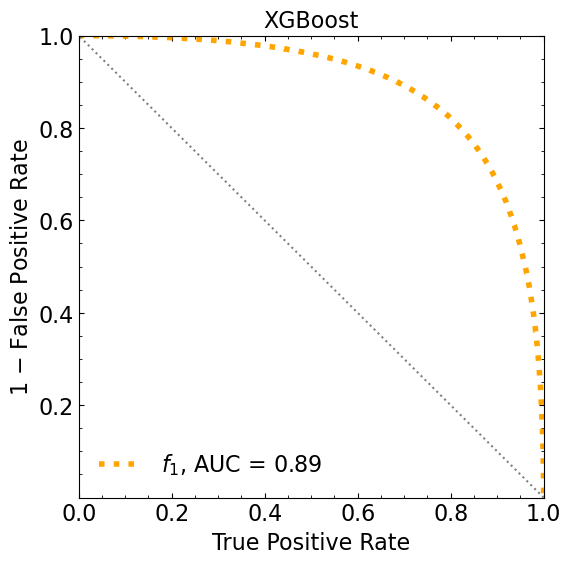

ML iteration  6
[0]	validation_0-logloss:0.65035	validation_1-logloss:0.65069
[1]	validation_0-logloss:0.61524	validation_1-logloss:0.61588
[2]	validation_0-logloss:0.58595	validation_1-logloss:0.58692


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56133	validation_1-logloss:0.56258
[4]	validation_0-logloss:0.54035	validation_1-logloss:0.54183
[5]	validation_0-logloss:0.52248	validation_1-logloss:0.52419
[6]	validation_0-logloss:0.50722	validation_1-logloss:0.50917
[7]	validation_0-logloss:0.49400	validation_1-logloss:0.49615
[8]	validation_0-logloss:0.48259	validation_1-logloss:0.48498
[9]	validation_0-logloss:0.47279	validation_1-logloss:0.47537
[10]	validation_0-logloss:0.46424	validation_1-logloss:0.46701
[11]	validation_0-logloss:0.45680	validation_1-logloss:0.45976
[12]	validation_0-logloss:0.45031	validation_1-logloss:0.45346
[13]	validation_0-logloss:0.44465	validation_1-logloss:0.44798
[14]	validation_0-logloss:0.43970	validation_1-logloss:0.44320
[15]	validation_0-logloss:0.43534	validation_1-logloss:0.43902
[16]	validation_0-logloss:0.43152	validation_1-logloss:0.43534
[17]	validation_0-logloss:0.42816	validation_1-logloss:0.43215
[18]	validation_0-logloss:0.42522	validation_1-logloss:0.42938

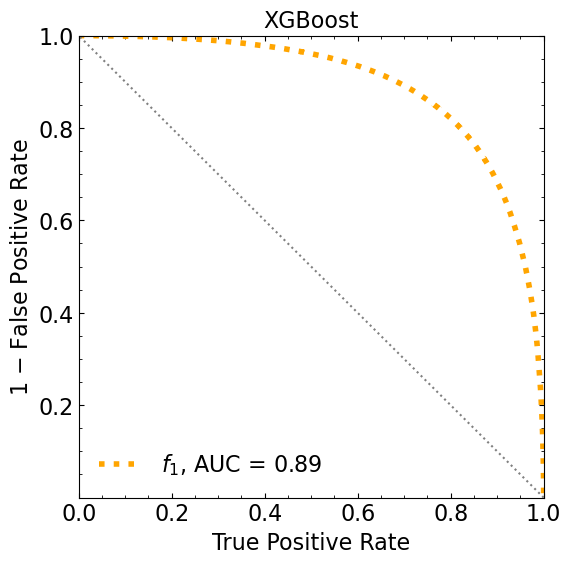

ML iteration  7
[0]	validation_0-logloss:0.65040	validation_1-logloss:0.65083
[1]	validation_0-logloss:0.61533	validation_1-logloss:0.61604
[2]	validation_0-logloss:0.58599	validation_1-logloss:0.58702


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56138	validation_1-logloss:0.56263
[4]	validation_0-logloss:0.54055	validation_1-logloss:0.54204
[5]	validation_0-logloss:0.52280	validation_1-logloss:0.52452
[6]	validation_0-logloss:0.50757	validation_1-logloss:0.50951
[7]	validation_0-logloss:0.49448	validation_1-logloss:0.49661
[8]	validation_0-logloss:0.48319	validation_1-logloss:0.48546
[9]	validation_0-logloss:0.47337	validation_1-logloss:0.47584
[10]	validation_0-logloss:0.46481	validation_1-logloss:0.46745
[11]	validation_0-logloss:0.45735	validation_1-logloss:0.46018
[12]	validation_0-logloss:0.45088	validation_1-logloss:0.45382
[13]	validation_0-logloss:0.44523	validation_1-logloss:0.44831
[14]	validation_0-logloss:0.44030	validation_1-logloss:0.44352
[15]	validation_0-logloss:0.43598	validation_1-logloss:0.43935
[16]	validation_0-logloss:0.43219	validation_1-logloss:0.43568
[17]	validation_0-logloss:0.42885	validation_1-logloss:0.43248
[18]	validation_0-logloss:0.42592	validation_1-logloss:0.42970

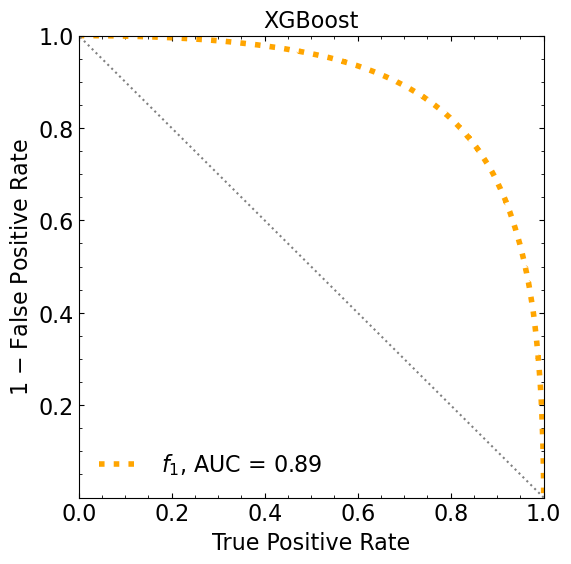

ML iteration  8
[0]	validation_0-logloss:0.65027	validation_1-logloss:0.65066
[1]	validation_0-logloss:0.61507	validation_1-logloss:0.61577
[2]	validation_0-logloss:0.58559	validation_1-logloss:0.58669


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56084	validation_1-logloss:0.56227
[4]	validation_0-logloss:0.53984	validation_1-logloss:0.54158
[5]	validation_0-logloss:0.52197	validation_1-logloss:0.52397
[6]	validation_0-logloss:0.50661	validation_1-logloss:0.50885
[7]	validation_0-logloss:0.49340	validation_1-logloss:0.49591
[8]	validation_0-logloss:0.48199	validation_1-logloss:0.48473
[9]	validation_0-logloss:0.47207	validation_1-logloss:0.47512
[10]	validation_0-logloss:0.46346	validation_1-logloss:0.46676
[11]	validation_0-logloss:0.45589	validation_1-logloss:0.45946
[12]	validation_0-logloss:0.44932	validation_1-logloss:0.45311
[13]	validation_0-logloss:0.44360	validation_1-logloss:0.44764
[14]	validation_0-logloss:0.43858	validation_1-logloss:0.44288
[15]	validation_0-logloss:0.43419	validation_1-logloss:0.43869
[16]	validation_0-logloss:0.43034	validation_1-logloss:0.43505
[17]	validation_0-logloss:0.42697	validation_1-logloss:0.43187
[18]	validation_0-logloss:0.42400	validation_1-logloss:0.42908

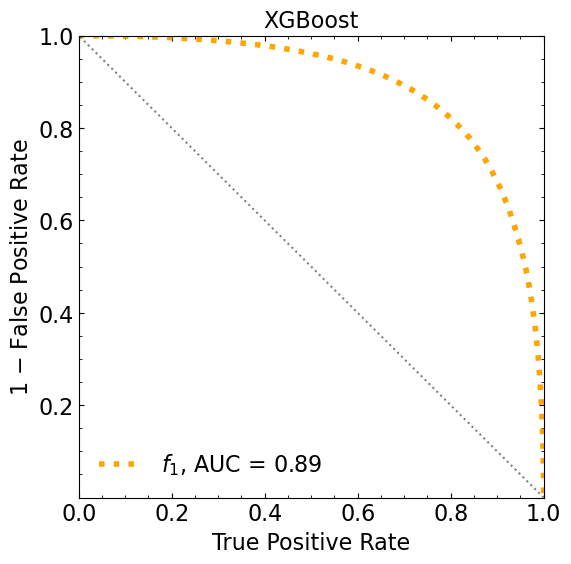

ML iteration  9
[0]	validation_0-logloss:0.65020	validation_1-logloss:0.65062
[1]	validation_0-logloss:0.61494	validation_1-logloss:0.61573
[2]	validation_0-logloss:0.58561	validation_1-logloss:0.58676


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56085	validation_1-logloss:0.56234
[4]	validation_0-logloss:0.53984	validation_1-logloss:0.54161
[5]	validation_0-logloss:0.52200	validation_1-logloss:0.52407
[6]	validation_0-logloss:0.50664	validation_1-logloss:0.50901
[7]	validation_0-logloss:0.49344	validation_1-logloss:0.49601
[8]	validation_0-logloss:0.48199	validation_1-logloss:0.48483
[9]	validation_0-logloss:0.47208	validation_1-logloss:0.47520
[10]	validation_0-logloss:0.46349	validation_1-logloss:0.46681
[11]	validation_0-logloss:0.45604	validation_1-logloss:0.45960
[12]	validation_0-logloss:0.44946	validation_1-logloss:0.45326
[13]	validation_0-logloss:0.44376	validation_1-logloss:0.44776
[14]	validation_0-logloss:0.43881	validation_1-logloss:0.44303
[15]	validation_0-logloss:0.43446	validation_1-logloss:0.43885
[16]	validation_0-logloss:0.43063	validation_1-logloss:0.43522
[17]	validation_0-logloss:0.42727	validation_1-logloss:0.43202
[18]	validation_0-logloss:0.42434	validation_1-logloss:0.42923

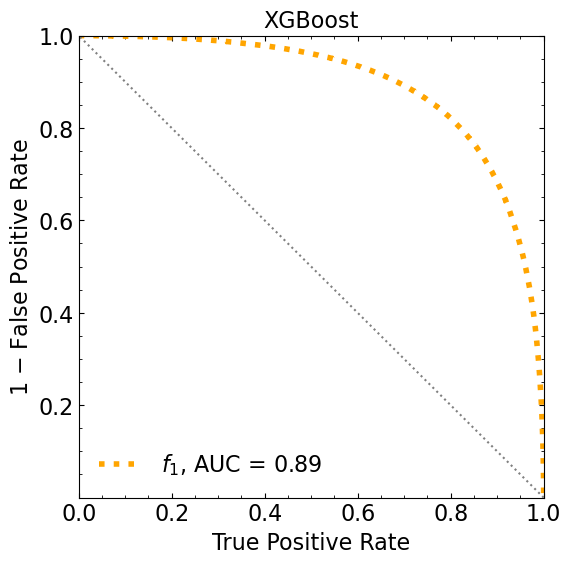

Classification score (1 ML):


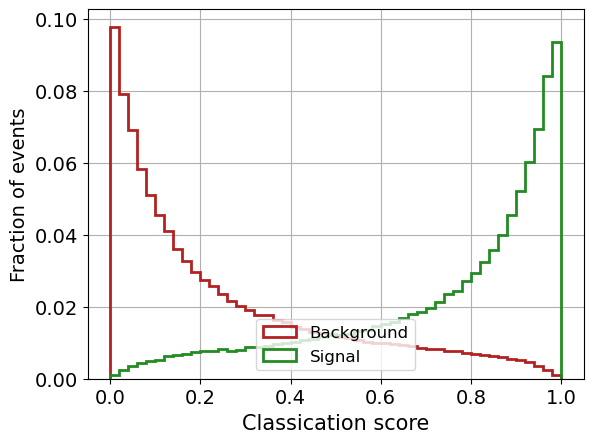

Classification score (10 ML):


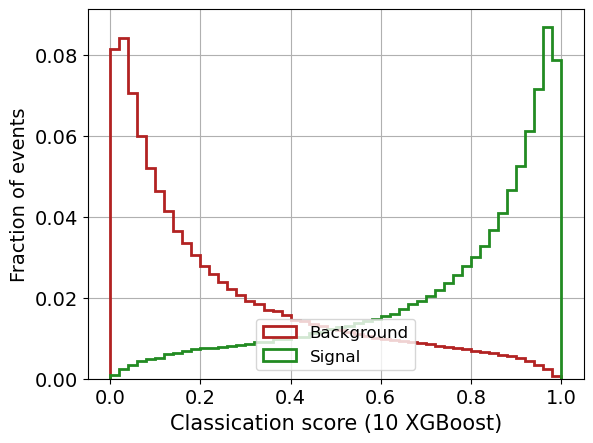

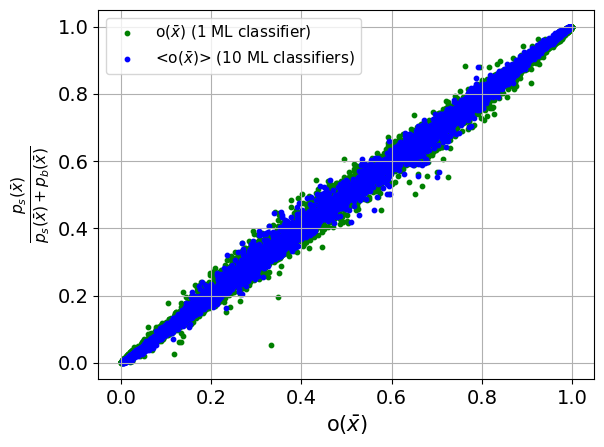


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  6.483309027386618
Z_XG 25 bins_1ML:  7.375792200660377
Z_XG 50 bins_1ML:  7.746639179303208
Z_XG 100 bins_1ML:  7.934154320798844

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  4.872929790940069
Z_XG 25 bins_eq_1ML:  5.794599481744052
Z_XG 50 bins_eq_1ML:  6.377926579191114
Z_XG 100 bins_eq_1ML:  6.851893640400801

 BL lineal bins, 10 ML
Z_XG 10 bins:  6.5376950717840305
Z_XG 25 bins:  7.425756169745528
Z_XG 50 bins:  7.858192437973806
Z_XG 100 bins:  7.9789217144846685

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  4.874156573556178
Z_XG 25 bins_eq:  5.800534497707283
Z_XG 50 bins_eq:  6.37936129748397
Z_XG 100 bins_eq:  6.86478877354213

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSSIAN

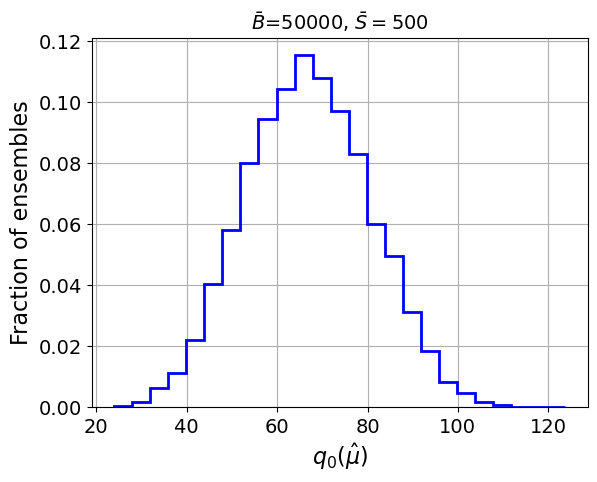

muhat mean:  0.043622630031430604
Z_gaussian:  8.164445573202427
Z_gaussian_mu0:  8.166688698335594

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
  1501.23089865  1497.93228972  1484.3001892   1463.50478835
  1434.40397596  1388.22753742  1324.91012519  1240.98363853
  1121.27092938   954.68880182   726.45643315   419.66607633
    16.84027142  -494.84835023 -1135.16919511 -2050.29767762]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
           -inf  1519.66770568  1509.49075036  1491.62550169
  1464.19605555  1422.63180727  1361.27

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.0063479219593504735


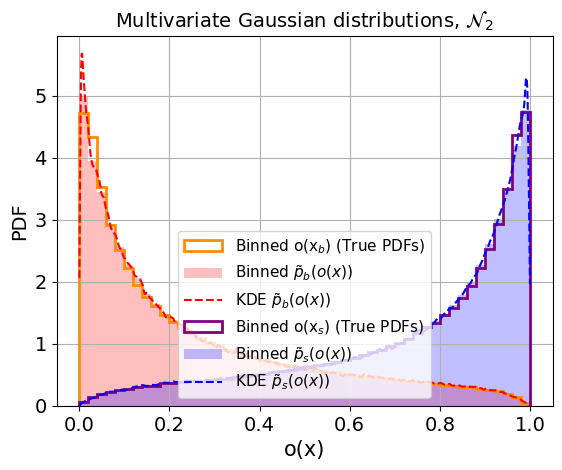

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
           -inf  1505.95678184  1496.68149233  1478.8118877
  1450.82124669  1407.69324485  1345.46097122  1261.52891803
  1141.27873181   973.20994651   745.30409828   439.24993196
    37.05466666  -474.13210302 -1116.4483555  -2041.75106286]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
           -inf  1531.3686995   1521.10038162  1504.4089815
  1477.92786771  1436.4049614   1375.9431

KDE Kernel:  epanechnikov
Background bandwidth:  0.0063479219593504735
Signal bandwidth:  0.0063479219593504735


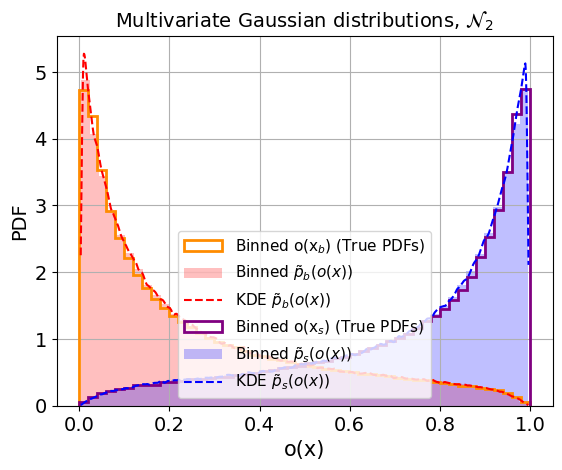

 Z MLL+KDE (1ML) 


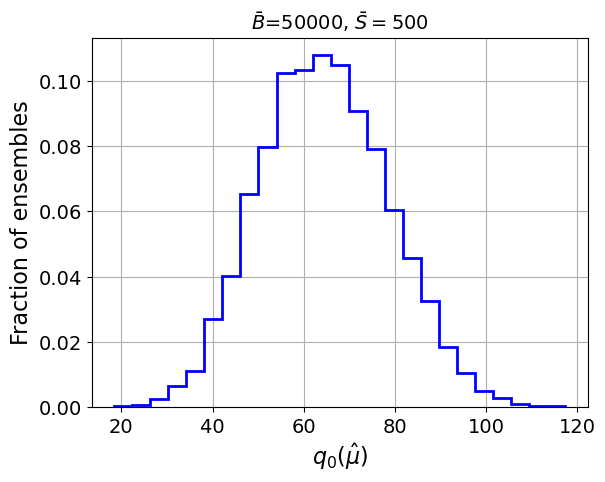

muhat mean_1ML:  0.04667950927709622
Z_KDE_1ML:  8.00992405735182
Z_KDE mu=0_1ML:  8.01333110651803

 Z MLL+KDE (10ML) 


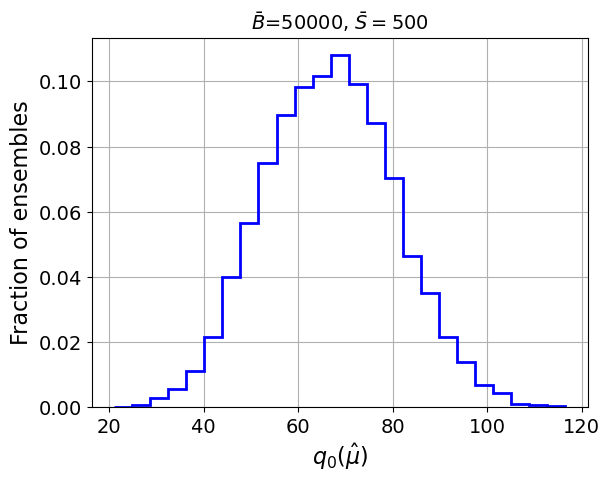

muhat mean:  0.03698671803710839
Z_KDE:  8.168813471917204
Z_KDE mu=0:  8.168851382874385

 ------------------------------------ 



In [28]:
dim=4

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T

dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 5)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 5)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 5)
y_gauss_test :  (1000000, 1)



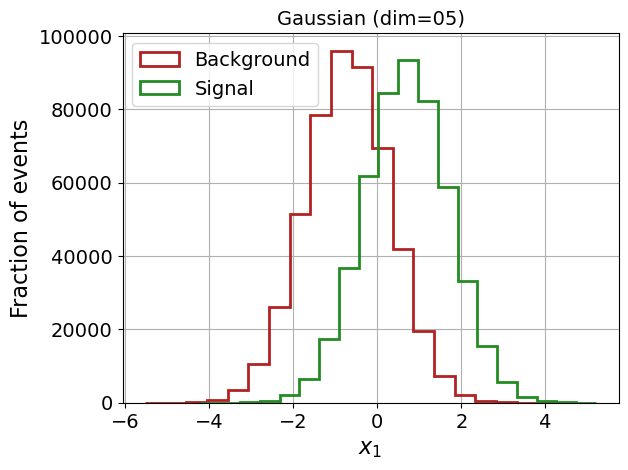

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.65011	validation_1-logloss:0.65017
[1]	validation_0-logloss:0.61472	validation_1-logloss:0.61485
[2]	validation_0-logloss:0.58526	validation_1-logloss:0.58544
[3]	validation_0-logloss:0.56043	validation_1-logloss:0.56066
[4]	validation_0-logloss:0.53946	validation_1-logloss:0.53975
[5]	validation_0-logloss:0.52154	validation_1-logloss:0.52187
[6]	validation_0-logloss:0.50609	validation_1-logloss:0.50643
[7]	validation_0-logloss:0.49280	validation_1-logloss:0.49319
[8]	validation_0-logloss:0.48134	validation_1-logloss:0.48176
[9]	validation_0-logloss:0.47139	validation_1-logloss:0.47184
[10]	validation_0-logloss:0.46273	validation_1-logloss:0.46322
[11]	validation_0-logloss:0.45518	validation_1-logloss:0.45570
[12]	validation_0-logloss:0.44859	validation_1-logloss:0.44913
[13]	validation_0-logloss:0.44281	validation_1-logloss:0.44339
[14]	validation_0-logloss:0.43774	validation_1-logloss:0.43835
[15]	validation_0-logloss:0.43327	validation_1-logloss:0.43392
[1

[130]	validation_0-logloss:0.39956	validation_1-logloss:0.40169
[131]	validation_0-logloss:0.39952	validation_1-logloss:0.40166
[132]	validation_0-logloss:0.39950	validation_1-logloss:0.40166
[133]	validation_0-logloss:0.39949	validation_1-logloss:0.40166
[134]	validation_0-logloss:0.39949	validation_1-logloss:0.40166
[135]	validation_0-logloss:0.39947	validation_1-logloss:0.40166
[136]	validation_0-logloss:0.39943	validation_1-logloss:0.40163
[137]	validation_0-logloss:0.39941	validation_1-logloss:0.40163
[138]	validation_0-logloss:0.39941	validation_1-logloss:0.40163
[139]	validation_0-logloss:0.39938	validation_1-logloss:0.40161
[140]	validation_0-logloss:0.39936	validation_1-logloss:0.40160
[141]	validation_0-logloss:0.39935	validation_1-logloss:0.40161
[142]	validation_0-logloss:0.39935	validation_1-logloss:0.40161
[143]	validation_0-logloss:0.39935	validation_1-logloss:0.40161
[144]	validation_0-logloss:0.39934	validation_1-logloss:0.40161
[145]	validation_0-logloss:0.39931	valid

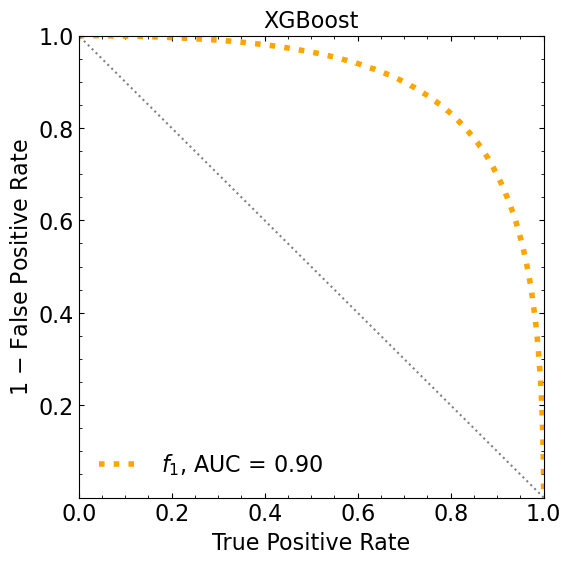

ML iteration 0
[0]	validation_0-logloss:0.64989	validation_1-logloss:0.65004
[1]	validation_0-logloss:0.61437	validation_1-logloss:0.61479


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58465	validation_1-logloss:0.58535
[3]	validation_0-logloss:0.55956	validation_1-logloss:0.56054
[4]	validation_0-logloss:0.53831	validation_1-logloss:0.53955
[5]	validation_0-logloss:0.52008	validation_1-logloss:0.52158
[6]	validation_0-logloss:0.50446	validation_1-logloss:0.50620
[7]	validation_0-logloss:0.49096	validation_1-logloss:0.49297
[8]	validation_0-logloss:0.47919	validation_1-logloss:0.48150
[9]	validation_0-logloss:0.46904	validation_1-logloss:0.47153
[10]	validation_0-logloss:0.46019	validation_1-logloss:0.46289
[11]	validation_0-logloss:0.45246	validation_1-logloss:0.45537
[12]	validation_0-logloss:0.44568	validation_1-logloss:0.44883
[13]	validation_0-logloss:0.43975	validation_1-logloss:0.44310
[14]	validation_0-logloss:0.43458	validation_1-logloss:0.43810
[15]	validation_0-logloss:0.43001	validation_1-logloss:0.43372
[16]	validation_0-logloss:0.42599	validation_1-logloss:0.42988
[17]	validation_0-logloss:0.42247	validation_1-logloss:0.42649


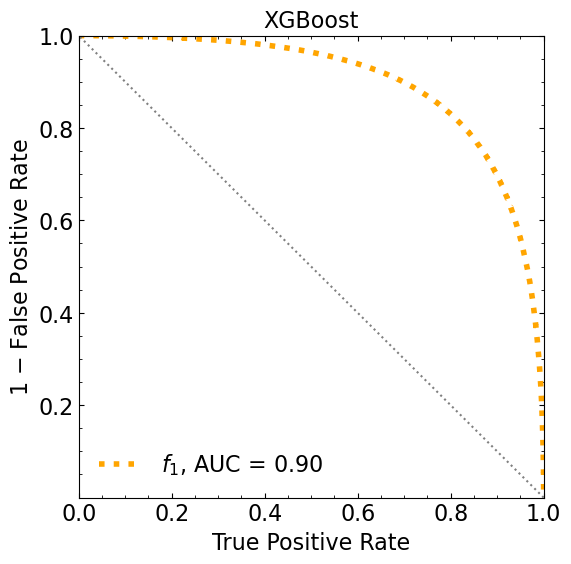

ML iteration  1
[0]	validation_0-logloss:0.65007	validation_1-logloss:0.65023
[1]	validation_0-logloss:0.61457	validation_1-logloss:0.61487
[2]	validation_0-logloss:0.58498	validation_1-logloss:0.58545


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.56008	validation_1-logloss:0.56074
[4]	validation_0-logloss:0.53898	validation_1-logloss:0.53977
[5]	validation_0-logloss:0.52088	validation_1-logloss:0.52188
[6]	validation_0-logloss:0.50534	validation_1-logloss:0.50648
[7]	validation_0-logloss:0.49197	validation_1-logloss:0.49322
[8]	validation_0-logloss:0.48037	validation_1-logloss:0.48177
[9]	validation_0-logloss:0.47026	validation_1-logloss:0.47186
[10]	validation_0-logloss:0.46152	validation_1-logloss:0.46325
[11]	validation_0-logloss:0.45386	validation_1-logloss:0.45575
[12]	validation_0-logloss:0.44717	validation_1-logloss:0.44915
[13]	validation_0-logloss:0.44130	validation_1-logloss:0.44343
[14]	validation_0-logloss:0.43618	validation_1-logloss:0.43840
[15]	validation_0-logloss:0.43162	validation_1-logloss:0.43399
[16]	validation_0-logloss:0.42763	validation_1-logloss:0.43014
[17]	validation_0-logloss:0.42414	validation_1-logloss:0.42672
[18]	validation_0-logloss:0.42105	validation_1-logloss:0.42373

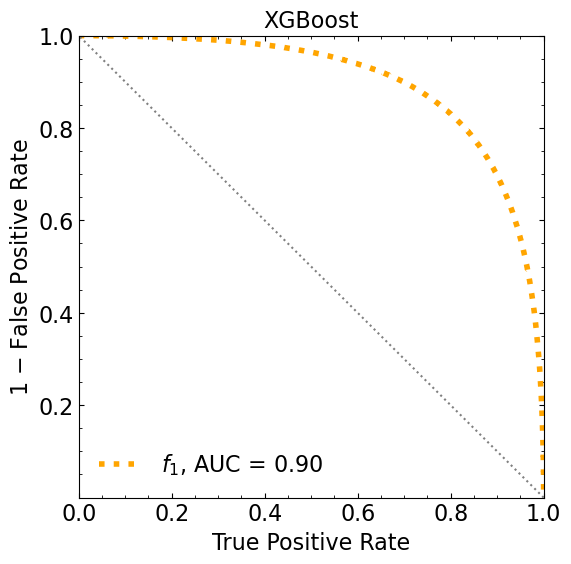

ML iteration  2
[0]	validation_0-logloss:0.64951	validation_1-logloss:0.65002
[1]	validation_0-logloss:0.61358	validation_1-logloss:0.61457


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58370	validation_1-logloss:0.58512
[3]	validation_0-logloss:0.55850	validation_1-logloss:0.56027
[4]	validation_0-logloss:0.53703	validation_1-logloss:0.53923
[5]	validation_0-logloss:0.51863	validation_1-logloss:0.52117
[6]	validation_0-logloss:0.50301	validation_1-logloss:0.50578
[7]	validation_0-logloss:0.48945	validation_1-logloss:0.49254
[8]	validation_0-logloss:0.47770	validation_1-logloss:0.48110
[9]	validation_0-logloss:0.46745	validation_1-logloss:0.47114
[10]	validation_0-logloss:0.45859	validation_1-logloss:0.46251
[11]	validation_0-logloss:0.45087	validation_1-logloss:0.45502
[12]	validation_0-logloss:0.44409	validation_1-logloss:0.44847
[13]	validation_0-logloss:0.43815	validation_1-logloss:0.44275
[14]	validation_0-logloss:0.43292	validation_1-logloss:0.43773
[15]	validation_0-logloss:0.42832	validation_1-logloss:0.43331
[16]	validation_0-logloss:0.42434	validation_1-logloss:0.42950
[17]	validation_0-logloss:0.42074	validation_1-logloss:0.42614


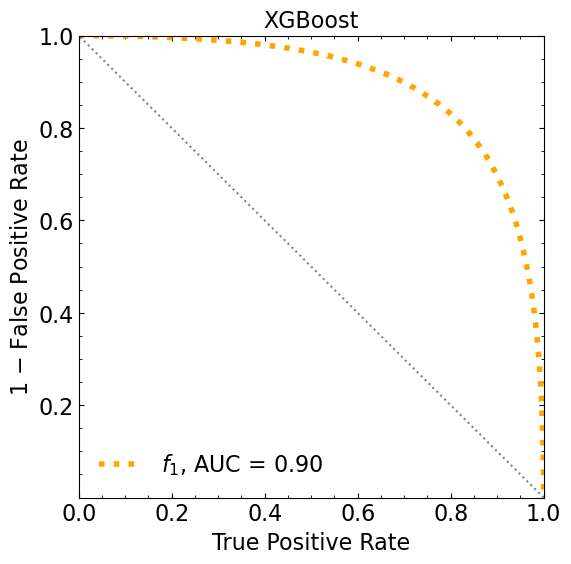

ML iteration  3
[0]	validation_0-logloss:0.64994	validation_1-logloss:0.65016
[1]	validation_0-logloss:0.61432	validation_1-logloss:0.61473
[2]	validation_0-logloss:0.58466	validation_1-logloss:0.58529


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.55961	validation_1-logloss:0.56047
[4]	validation_0-logloss:0.53845	validation_1-logloss:0.53956
[5]	validation_0-logloss:0.52033	validation_1-logloss:0.52165
[6]	validation_0-logloss:0.50474	validation_1-logloss:0.50623
[7]	validation_0-logloss:0.49133	validation_1-logloss:0.49301
[8]	validation_0-logloss:0.47973	validation_1-logloss:0.48154
[9]	validation_0-logloss:0.46964	validation_1-logloss:0.47160
[10]	validation_0-logloss:0.46085	validation_1-logloss:0.46298
[11]	validation_0-logloss:0.45318	validation_1-logloss:0.45545
[12]	validation_0-logloss:0.44650	validation_1-logloss:0.44892
[13]	validation_0-logloss:0.44062	validation_1-logloss:0.44320
[14]	validation_0-logloss:0.43542	validation_1-logloss:0.43815
[15]	validation_0-logloss:0.43090	validation_1-logloss:0.43379
[16]	validation_0-logloss:0.42694	validation_1-logloss:0.42997
[17]	validation_0-logloss:0.42346	validation_1-logloss:0.42658
[18]	validation_0-logloss:0.42035	validation_1-logloss:0.42363

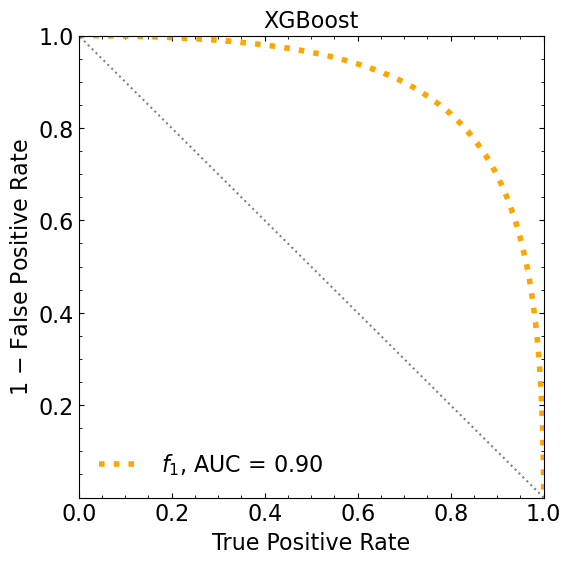

ML iteration  4
[0]	validation_0-logloss:0.64953	validation_1-logloss:0.65006
[1]	validation_0-logloss:0.61379	validation_1-logloss:0.61483


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58399	validation_1-logloss:0.58547
[3]	validation_0-logloss:0.55873	validation_1-logloss:0.56061
[4]	validation_0-logloss:0.53739	validation_1-logloss:0.53959
[5]	validation_0-logloss:0.51902	validation_1-logloss:0.52163
[6]	validation_0-logloss:0.50329	validation_1-logloss:0.50619
[7]	validation_0-logloss:0.48972	validation_1-logloss:0.49292
[8]	validation_0-logloss:0.47798	validation_1-logloss:0.48144
[9]	validation_0-logloss:0.46772	validation_1-logloss:0.47142
[10]	validation_0-logloss:0.45884	validation_1-logloss:0.46279
[11]	validation_0-logloss:0.45107	validation_1-logloss:0.45527
[12]	validation_0-logloss:0.44428	validation_1-logloss:0.44869
[13]	validation_0-logloss:0.43831	validation_1-logloss:0.44297
[14]	validation_0-logloss:0.43310	validation_1-logloss:0.43796
[15]	validation_0-logloss:0.42850	validation_1-logloss:0.43356
[16]	validation_0-logloss:0.42446	validation_1-logloss:0.42969
[17]	validation_0-logloss:0.42090	validation_1-logloss:0.42630


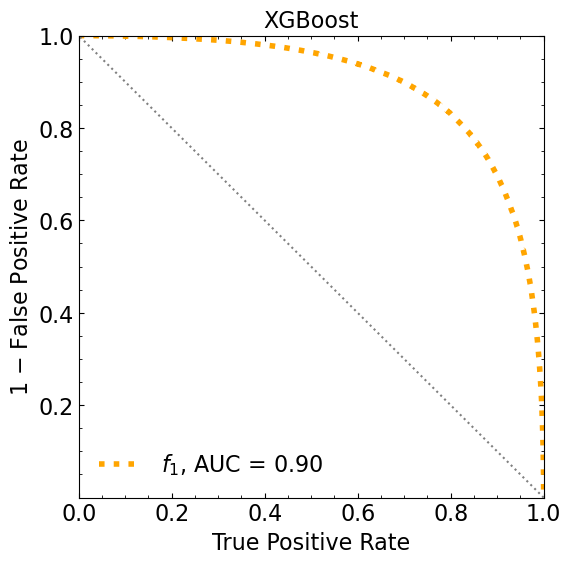

ML iteration  5
[0]	validation_0-logloss:0.64941	validation_1-logloss:0.64992
[1]	validation_0-logloss:0.61348	validation_1-logloss:0.61446


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58358	validation_1-logloss:0.58499
[3]	validation_0-logloss:0.55842	validation_1-logloss:0.56018
[4]	validation_0-logloss:0.53702	validation_1-logloss:0.53919
[5]	validation_0-logloss:0.51881	validation_1-logloss:0.52131
[6]	validation_0-logloss:0.50306	validation_1-logloss:0.50587
[7]	validation_0-logloss:0.48948	validation_1-logloss:0.49263
[8]	validation_0-logloss:0.47770	validation_1-logloss:0.48113
[9]	validation_0-logloss:0.46754	validation_1-logloss:0.47125
[10]	validation_0-logloss:0.45864	validation_1-logloss:0.46260
[11]	validation_0-logloss:0.45086	validation_1-logloss:0.45509
[12]	validation_0-logloss:0.44408	validation_1-logloss:0.44856
[13]	validation_0-logloss:0.43812	validation_1-logloss:0.44281
[14]	validation_0-logloss:0.43285	validation_1-logloss:0.43777
[15]	validation_0-logloss:0.42827	validation_1-logloss:0.43339
[16]	validation_0-logloss:0.42423	validation_1-logloss:0.42957
[17]	validation_0-logloss:0.42067	validation_1-logloss:0.42618


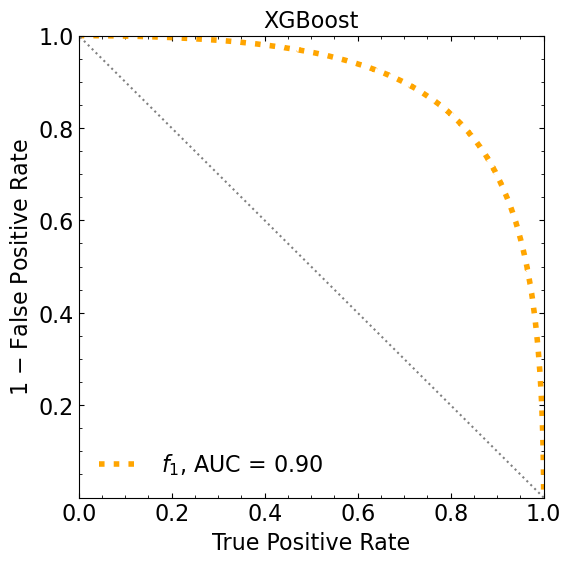

ML iteration  6
[0]	validation_0-logloss:0.64956	validation_1-logloss:0.64994
[1]	validation_0-logloss:0.61369	validation_1-logloss:0.61445


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58375	validation_1-logloss:0.58492
[3]	validation_0-logloss:0.55854	validation_1-logloss:0.56008
[4]	validation_0-logloss:0.53707	validation_1-logloss:0.53899
[5]	validation_0-logloss:0.51871	validation_1-logloss:0.52104
[6]	validation_0-logloss:0.50293	validation_1-logloss:0.50559
[7]	validation_0-logloss:0.48937	validation_1-logloss:0.49238
[8]	validation_0-logloss:0.47760	validation_1-logloss:0.48093
[9]	validation_0-logloss:0.46739	validation_1-logloss:0.47101
[10]	validation_0-logloss:0.45853	validation_1-logloss:0.46240
[11]	validation_0-logloss:0.45076	validation_1-logloss:0.45493
[12]	validation_0-logloss:0.44395	validation_1-logloss:0.44839
[13]	validation_0-logloss:0.43800	validation_1-logloss:0.44268
[14]	validation_0-logloss:0.43277	validation_1-logloss:0.43767
[15]	validation_0-logloss:0.42814	validation_1-logloss:0.43326
[16]	validation_0-logloss:0.42409	validation_1-logloss:0.42942
[17]	validation_0-logloss:0.42051	validation_1-logloss:0.42606


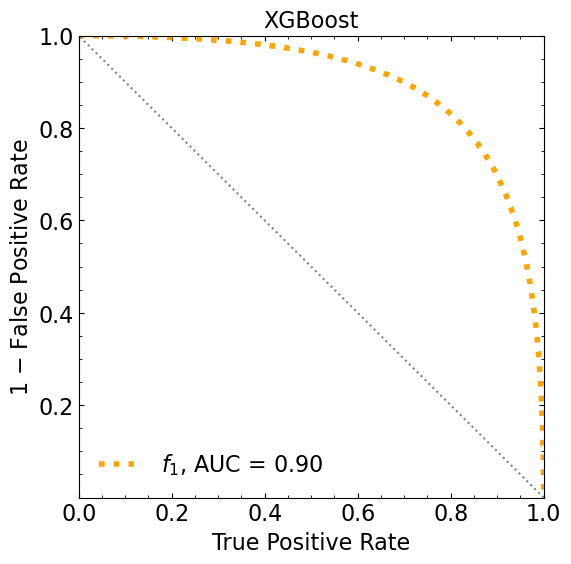

ML iteration  7
[0]	validation_0-logloss:0.64967	validation_1-logloss:0.65007
[1]	validation_0-logloss:0.61376	validation_1-logloss:0.61460


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58391	validation_1-logloss:0.58517
[3]	validation_0-logloss:0.55871	validation_1-logloss:0.56041
[4]	validation_0-logloss:0.53732	validation_1-logloss:0.53933
[5]	validation_0-logloss:0.51899	validation_1-logloss:0.52138
[6]	validation_0-logloss:0.50333	validation_1-logloss:0.50607
[7]	validation_0-logloss:0.48974	validation_1-logloss:0.49279
[8]	validation_0-logloss:0.47803	validation_1-logloss:0.48133
[9]	validation_0-logloss:0.46781	validation_1-logloss:0.47139
[10]	validation_0-logloss:0.45894	validation_1-logloss:0.46278
[11]	validation_0-logloss:0.45114	validation_1-logloss:0.45523
[12]	validation_0-logloss:0.44434	validation_1-logloss:0.44869
[13]	validation_0-logloss:0.43836	validation_1-logloss:0.44292
[14]	validation_0-logloss:0.43312	validation_1-logloss:0.43789
[15]	validation_0-logloss:0.42850	validation_1-logloss:0.43350
[16]	validation_0-logloss:0.42446	validation_1-logloss:0.42966
[17]	validation_0-logloss:0.42089	validation_1-logloss:0.42626


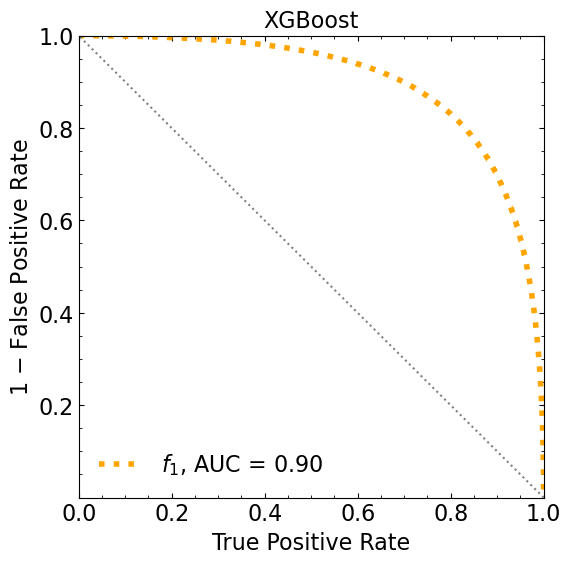

ML iteration  8
[0]	validation_0-logloss:0.64952	validation_1-logloss:0.64998
[1]	validation_0-logloss:0.61366	validation_1-logloss:0.61450


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58385	validation_1-logloss:0.58505
[3]	validation_0-logloss:0.55880	validation_1-logloss:0.56031
[4]	validation_0-logloss:0.53741	validation_1-logloss:0.53930
[5]	validation_0-logloss:0.51906	validation_1-logloss:0.52128
[6]	validation_0-logloss:0.50333	validation_1-logloss:0.50587
[7]	validation_0-logloss:0.48976	validation_1-logloss:0.49256
[8]	validation_0-logloss:0.47802	validation_1-logloss:0.48112
[9]	validation_0-logloss:0.46781	validation_1-logloss:0.47122
[10]	validation_0-logloss:0.45893	validation_1-logloss:0.46260
[11]	validation_0-logloss:0.45117	validation_1-logloss:0.45511
[12]	validation_0-logloss:0.44433	validation_1-logloss:0.44851
[13]	validation_0-logloss:0.43836	validation_1-logloss:0.44279
[14]	validation_0-logloss:0.43311	validation_1-logloss:0.43778
[15]	validation_0-logloss:0.42849	validation_1-logloss:0.43333
[16]	validation_0-logloss:0.42445	validation_1-logloss:0.42950
[17]	validation_0-logloss:0.42090	validation_1-logloss:0.42618


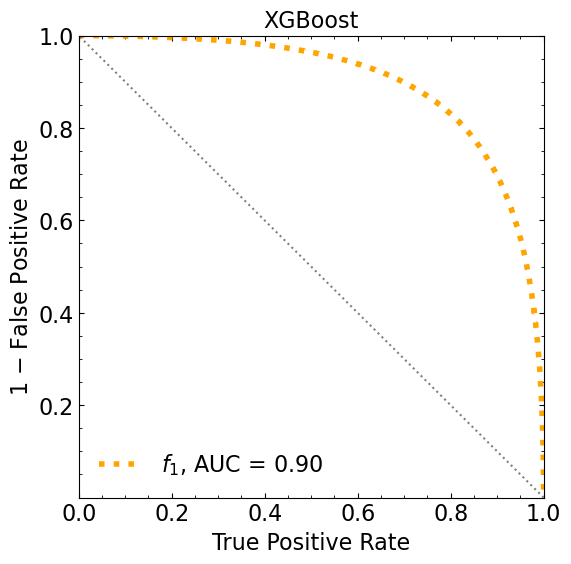

ML iteration  9
[0]	validation_0-logloss:0.64951	validation_1-logloss:0.64997


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.61371	validation_1-logloss:0.61463
[2]	validation_0-logloss:0.58379	validation_1-logloss:0.58511
[3]	validation_0-logloss:0.55864	validation_1-logloss:0.56028
[4]	validation_0-logloss:0.53726	validation_1-logloss:0.53923
[5]	validation_0-logloss:0.51908	validation_1-logloss:0.52132
[6]	validation_0-logloss:0.50332	validation_1-logloss:0.50590
[7]	validation_0-logloss:0.48982	validation_1-logloss:0.49267
[8]	validation_0-logloss:0.47817	validation_1-logloss:0.48123
[9]	validation_0-logloss:0.46804	validation_1-logloss:0.47132
[10]	validation_0-logloss:0.45919	validation_1-logloss:0.46271
[11]	validation_0-logloss:0.45148	validation_1-logloss:0.45526
[12]	validation_0-logloss:0.44472	validation_1-logloss:0.44869
[13]	validation_0-logloss:0.43883	validation_1-logloss:0.44299
[14]	validation_0-logloss:0.43364	validation_1-logloss:0.43795
[15]	validation_0-logloss:0.42906	validation_1-logloss:0.43355
[16]	validation_0-logloss:0.42506	validation_1-logloss:0.42971
[

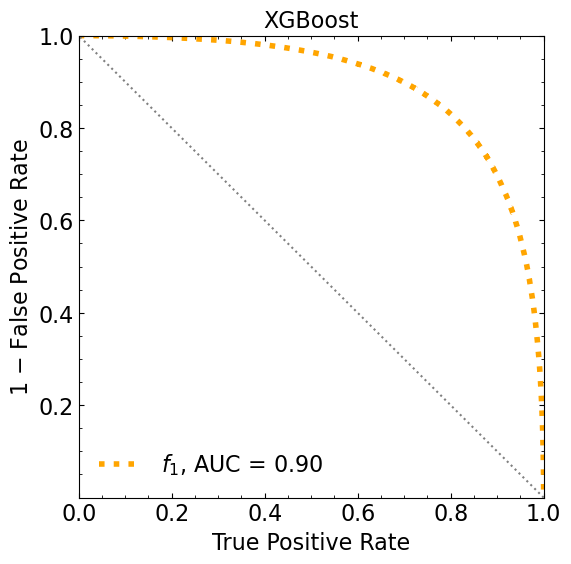

Classification score (1 ML):


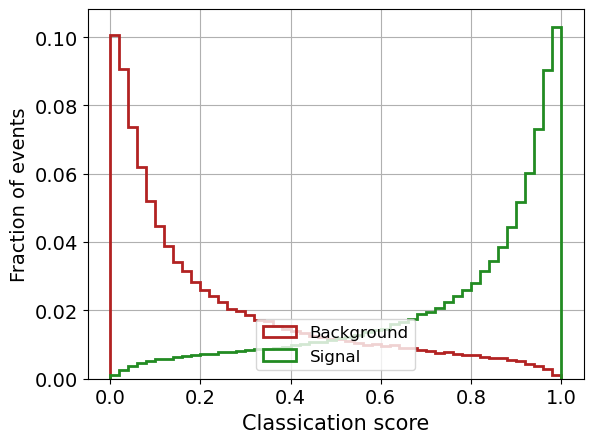

Classification score (10 ML):


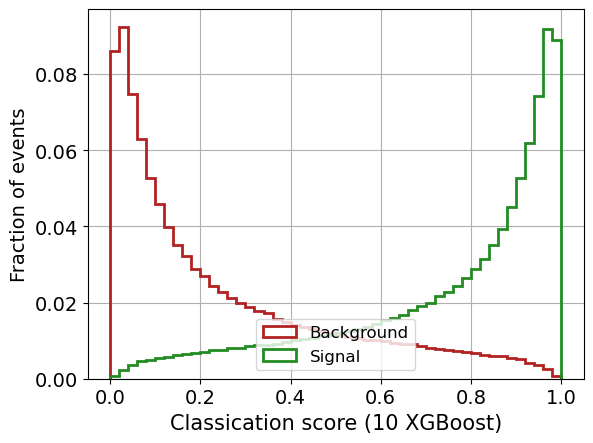

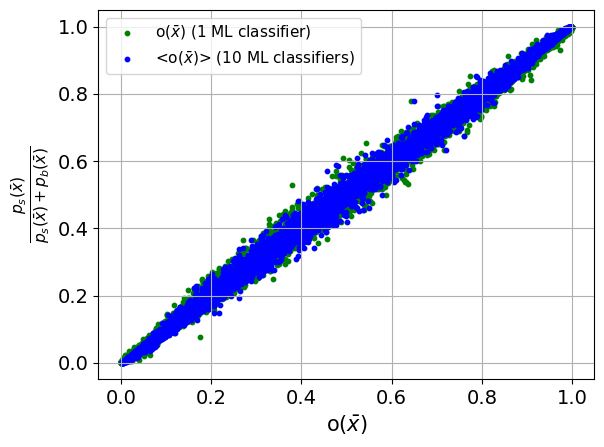


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  6.662099302715966
Z_XG 25 bins_1ML:  7.55355096892089
Z_XG 50 bins_1ML:  7.974515656228193
Z_XG 100 bins_1ML:  8.143793585930203

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  4.943525633968998
Z_XG 25 bins_eq_1ML:  5.915473169897974
Z_XG 50 bins_eq_1ML:  6.533154860431133
Z_XG 100 bins_eq_1ML:  7.04345916225164

 BL lineal bins, 10 ML
Z_XG 10 bins:  6.709297006234071
Z_XG 25 bins:  7.629285693298025
Z_XG 50 bins:  8.084925384886448
Z_XG 100 bins:  8.209474959358708

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  4.942769073560302
Z_XG 25 bins_eq:  5.912566136407904
Z_XG 50 bins_eq:  6.532990349703435
Z_XG 100 bins_eq:  7.054910671944802

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSSIANS)

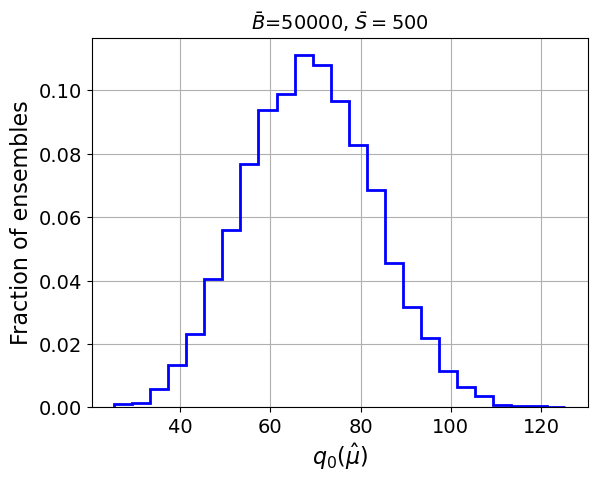

muhat mean:  0.057401399168609965
Z_gaussian:  8.281836805118251
Z_gaussian_mu0:  8.278197257123463

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf  1615.52845778  1624.87769961
  1629.72942138  1628.50894887  1620.27883544  1604.16961664
  1577.49222656  1535.01345435  1470.81732802  1378.1173543
  1245.58102559  1058.16242563   805.14636805   476.50334071
    56.91881819  -470.8441488  -1123.04041443 -2045.34966737]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
           -inf           -inf  1621.76616703  1604.32692964
  1576.23710625  1532.38403124  1467.563

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.0091866653175426


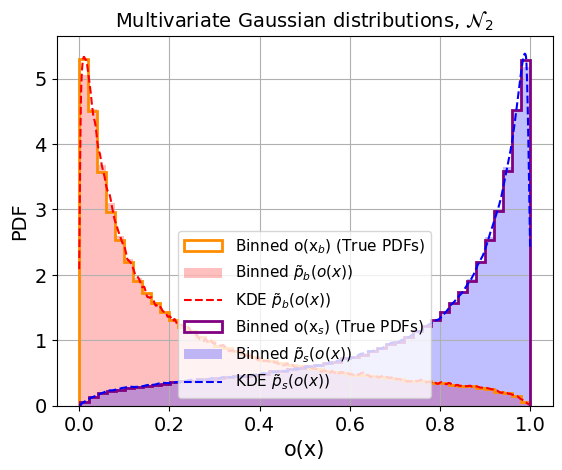

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
  1637.26600623  1636.34210728  1627.03365516  1610.21276665
  1582.01386342  1538.31680858  1473.7070137   1381.63654445
  1249.51730903  1064.68148892   816.05741346   491.41959322
    76.0062296   -447.699204   -1103.3736322  -2036.36530853]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
           -inf           -inf  1626.05487208  1609.91486068
  1581.08990828  1536.36631906  1472.13

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.0091866653175426


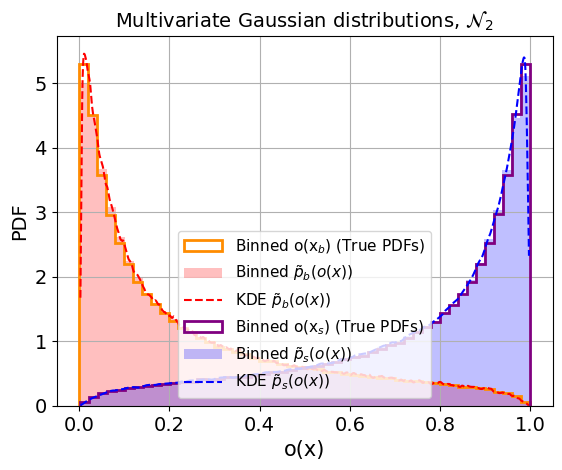

 Z MLL+KDE (1ML) 


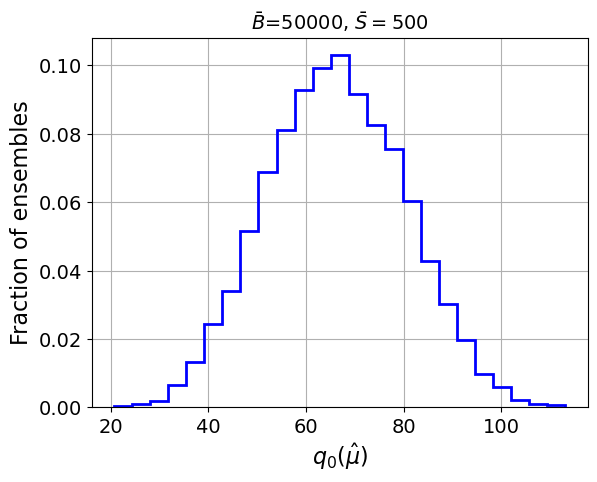

muhat mean_1ML:  0.04501165973841631
Z_KDE_1ML:  8.125356756583635
Z_KDE mu=0_1ML:  8.126752792290253

 Z MLL+KDE (10ML) 


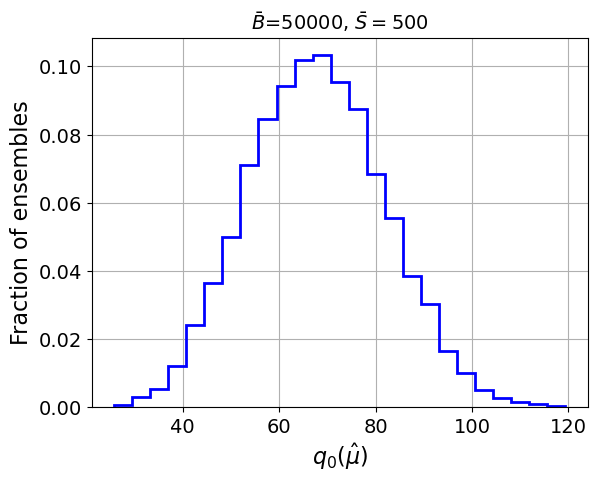

muhat mean:  0.038984081922336
Z_KDE:  8.21884168816357
Z_KDE mu=0:  8.22043582692714

 ------------------------------------ 



In [29]:
dim=5

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))


# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 6)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 6)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 6)
y_gauss_test :  (1000000, 1)



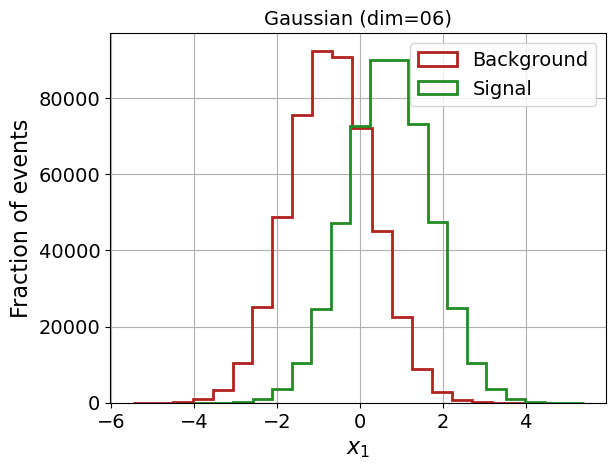

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.64997	validation_1-logloss:0.64998
[1]	validation_0-logloss:0.61427	validation_1-logloss:0.61427
[2]	validation_0-logloss:0.58443	validation_1-logloss:0.58445
[3]	validation_0-logloss:0.55926	validation_1-logloss:0.55927
[4]	validation_0-logloss:0.53785	validation_1-logloss:0.53786
[5]	validation_0-logloss:0.51954	validation_1-logloss:0.51954
[6]	validation_0-logloss:0.50385	validation_1-logloss:0.50387
[7]	validation_0-logloss:0.49024	validation_1-logloss:0.49029
[8]	validation_0-logloss:0.47845	validation_1-logloss:0.47853
[9]	validation_0-logloss:0.46824	validation_1-logloss:0.46834
[10]	validation_0-logloss:0.45934	validation_1-logloss:0.45946
[11]	validation_0-logloss:0.45153	validation_1-logloss:0.45168
[12]	validation_0-logloss:0.44473	validation_1-logloss:0.44490
[13]	validation_0-logloss:0.43877	validation_1-logloss:0.43895
[14]	validation_0-logloss:0.43351	validation_1-logloss:0.43373
[15]	validation_0-logloss:0.42888	validation_1-logloss:0.42914
[1

[130]	validation_0-logloss:0.39295	validation_1-logloss:0.39475
[131]	validation_0-logloss:0.39294	validation_1-logloss:0.39476
[132]	validation_0-logloss:0.39294	validation_1-logloss:0.39475
[133]	validation_0-logloss:0.39293	validation_1-logloss:0.39476
[134]	validation_0-logloss:0.39288	validation_1-logloss:0.39474
[135]	validation_0-logloss:0.39285	validation_1-logloss:0.39473
[136]	validation_0-logloss:0.39281	validation_1-logloss:0.39471
[137]	validation_0-logloss:0.39278	validation_1-logloss:0.39470
[138]	validation_0-logloss:0.39275	validation_1-logloss:0.39469
[139]	validation_0-logloss:0.39273	validation_1-logloss:0.39468
[140]	validation_0-logloss:0.39269	validation_1-logloss:0.39467
[141]	validation_0-logloss:0.39267	validation_1-logloss:0.39466
[142]	validation_0-logloss:0.39264	validation_1-logloss:0.39466
[143]	validation_0-logloss:0.39263	validation_1-logloss:0.39465
[144]	validation_0-logloss:0.39261	validation_1-logloss:0.39465
[145]	validation_0-logloss:0.39259	valid

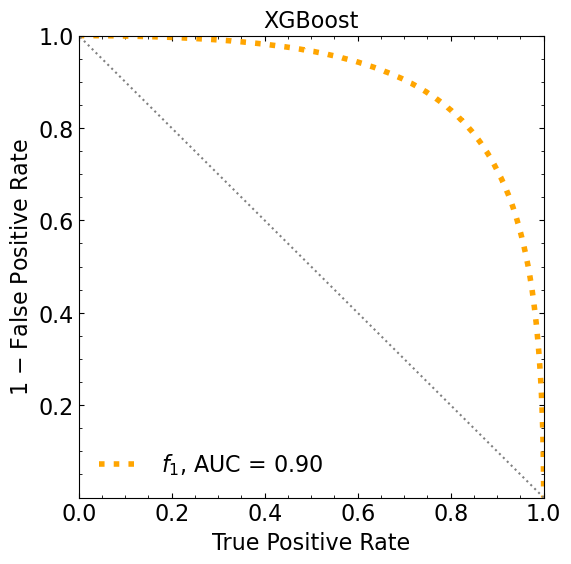

ML iteration 0
[0]	validation_0-logloss:0.64926	validation_1-logloss:0.64970
[1]	validation_0-logloss:0.61301	validation_1-logloss:0.61392


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58267	validation_1-logloss:0.58403
[3]	validation_0-logloss:0.55705	validation_1-logloss:0.55882
[4]	validation_0-logloss:0.53523	validation_1-logloss:0.53736
[5]	validation_0-logloss:0.51651	validation_1-logloss:0.51905
[6]	validation_0-logloss:0.50050	validation_1-logloss:0.50332
[7]	validation_0-logloss:0.48665	validation_1-logloss:0.48978
[8]	validation_0-logloss:0.47460	validation_1-logloss:0.47803
[9]	validation_0-logloss:0.46413	validation_1-logloss:0.46782
[10]	validation_0-logloss:0.45501	validation_1-logloss:0.45894
[11]	validation_0-logloss:0.44701	validation_1-logloss:0.45118
[12]	validation_0-logloss:0.43998	validation_1-logloss:0.44445
[13]	validation_0-logloss:0.43380	validation_1-logloss:0.43851
[14]	validation_0-logloss:0.42838	validation_1-logloss:0.43330
[15]	validation_0-logloss:0.42359	validation_1-logloss:0.42877
[16]	validation_0-logloss:0.41938	validation_1-logloss:0.42480
[17]	validation_0-logloss:0.41565	validation_1-logloss:0.42125


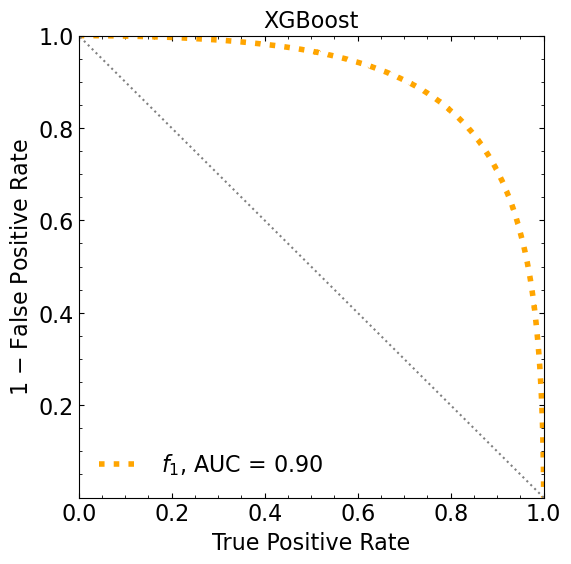

ML iteration  1
[0]	validation_0-logloss:0.64927	validation_1-logloss:0.64982
[1]	validation_0-logloss:0.61307	validation_1-logloss:0.61409
[2]	validation_0-logloss:0.58287	validation_1-logloss:0.58424


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[3]	validation_0-logloss:0.55728	validation_1-logloss:0.55899
[4]	validation_0-logloss:0.53560	validation_1-logloss:0.53762
[5]	validation_0-logloss:0.51694	validation_1-logloss:0.51924
[6]	validation_0-logloss:0.50083	validation_1-logloss:0.50343
[7]	validation_0-logloss:0.48698	validation_1-logloss:0.48982
[8]	validation_0-logloss:0.47498	validation_1-logloss:0.47808
[9]	validation_0-logloss:0.46456	validation_1-logloss:0.46792
[10]	validation_0-logloss:0.45542	validation_1-logloss:0.45904
[11]	validation_0-logloss:0.44739	validation_1-logloss:0.45124
[12]	validation_0-logloss:0.44039	validation_1-logloss:0.44446
[13]	validation_0-logloss:0.43421	validation_1-logloss:0.43852
[14]	validation_0-logloss:0.42881	validation_1-logloss:0.43334
[15]	validation_0-logloss:0.42403	validation_1-logloss:0.42878
[16]	validation_0-logloss:0.41985	validation_1-logloss:0.42482
[17]	validation_0-logloss:0.41613	validation_1-logloss:0.42130
[18]	validation_0-logloss:0.41285	validation_1-logloss:0.41821

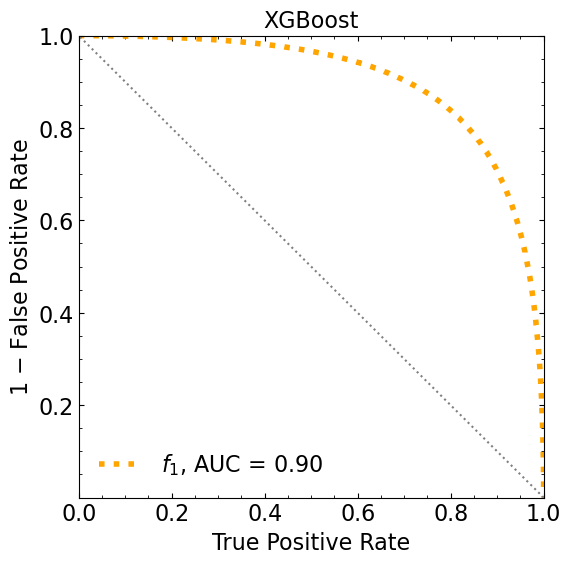

ML iteration  2
[0]	validation_0-logloss:0.64938	validation_1-logloss:0.64982
[1]	validation_0-logloss:0.61329	validation_1-logloss:0.61402


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58312	validation_1-logloss:0.58419
[3]	validation_0-logloss:0.55757	validation_1-logloss:0.55893
[4]	validation_0-logloss:0.53582	validation_1-logloss:0.53746
[5]	validation_0-logloss:0.51726	validation_1-logloss:0.51916
[6]	validation_0-logloss:0.50132	validation_1-logloss:0.50349
[7]	validation_0-logloss:0.48748	validation_1-logloss:0.48990
[8]	validation_0-logloss:0.47547	validation_1-logloss:0.47819
[9]	validation_0-logloss:0.46508	validation_1-logloss:0.46806
[10]	validation_0-logloss:0.45598	validation_1-logloss:0.45916
[11]	validation_0-logloss:0.44801	validation_1-logloss:0.45143
[12]	validation_0-logloss:0.44102	validation_1-logloss:0.44465
[13]	validation_0-logloss:0.43489	validation_1-logloss:0.43871
[14]	validation_0-logloss:0.42949	validation_1-logloss:0.43350
[15]	validation_0-logloss:0.42478	validation_1-logloss:0.42896
[16]	validation_0-logloss:0.42056	validation_1-logloss:0.42492
[17]	validation_0-logloss:0.41688	validation_1-logloss:0.42140


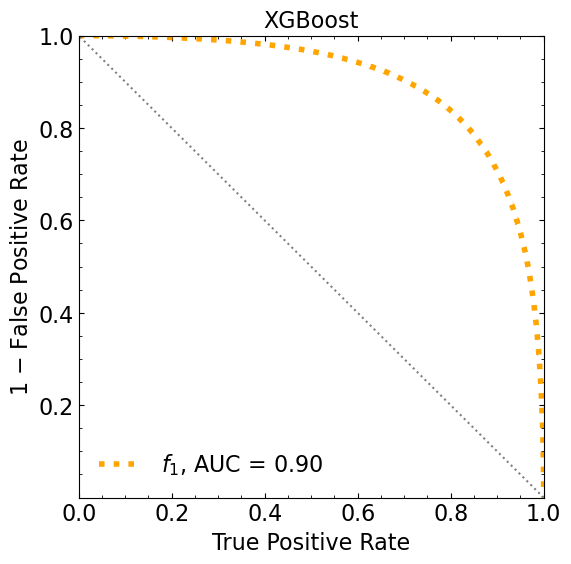

ML iteration  3
[0]	validation_0-logloss:0.64948	validation_1-logloss:0.64986
[1]	validation_0-logloss:0.61327	validation_1-logloss:0.61400


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58306	validation_1-logloss:0.58410
[3]	validation_0-logloss:0.55744	validation_1-logloss:0.55881
[4]	validation_0-logloss:0.53577	validation_1-logloss:0.53744
[5]	validation_0-logloss:0.51714	validation_1-logloss:0.51910
[6]	validation_0-logloss:0.50110	validation_1-logloss:0.50333
[7]	validation_0-logloss:0.48723	validation_1-logloss:0.48968
[8]	validation_0-logloss:0.47524	validation_1-logloss:0.47796
[9]	validation_0-logloss:0.46483	validation_1-logloss:0.46782
[10]	validation_0-logloss:0.45567	validation_1-logloss:0.45895
[11]	validation_0-logloss:0.44768	validation_1-logloss:0.45117
[12]	validation_0-logloss:0.44072	validation_1-logloss:0.44440
[13]	validation_0-logloss:0.43461	validation_1-logloss:0.43852
[14]	validation_0-logloss:0.42923	validation_1-logloss:0.43337
[15]	validation_0-logloss:0.42449	validation_1-logloss:0.42885
[16]	validation_0-logloss:0.42034	validation_1-logloss:0.42487
[17]	validation_0-logloss:0.41667	validation_1-logloss:0.42136


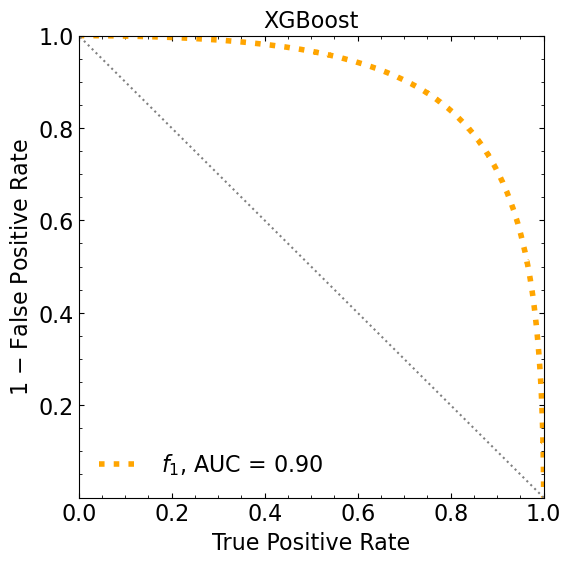

ML iteration  4
[0]	validation_0-logloss:0.64964	validation_1-logloss:0.64985
[1]	validation_0-logloss:0.61371	validation_1-logloss:0.61414


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58357	validation_1-logloss:0.58432
[3]	validation_0-logloss:0.55816	validation_1-logloss:0.55912
[4]	validation_0-logloss:0.53648	validation_1-logloss:0.53771
[5]	validation_0-logloss:0.51793	validation_1-logloss:0.51935
[6]	validation_0-logloss:0.50196	validation_1-logloss:0.50355
[7]	validation_0-logloss:0.48820	validation_1-logloss:0.49003
[8]	validation_0-logloss:0.47627	validation_1-logloss:0.47837
[9]	validation_0-logloss:0.46586	validation_1-logloss:0.46817
[10]	validation_0-logloss:0.45673	validation_1-logloss:0.45924
[11]	validation_0-logloss:0.44877	validation_1-logloss:0.45145
[12]	validation_0-logloss:0.44176	validation_1-logloss:0.44460
[13]	validation_0-logloss:0.43562	validation_1-logloss:0.43865
[14]	validation_0-logloss:0.43025	validation_1-logloss:0.43345
[15]	validation_0-logloss:0.42550	validation_1-logloss:0.42891
[16]	validation_0-logloss:0.42132	validation_1-logloss:0.42487
[17]	validation_0-logloss:0.41761	validation_1-logloss:0.42136


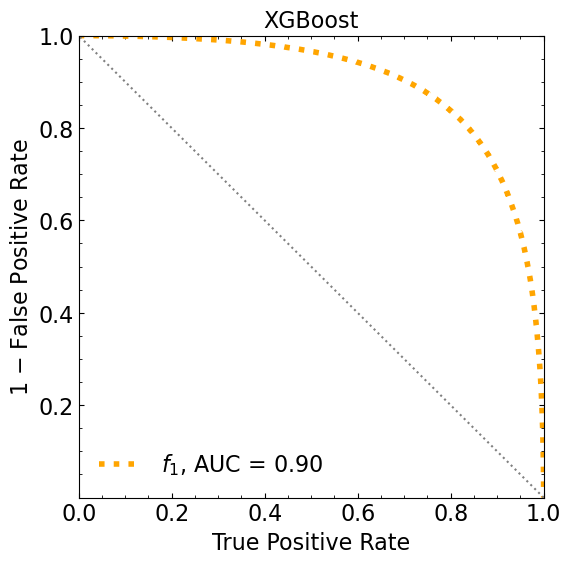

ML iteration  5
[0]	validation_0-logloss:0.64992	validation_1-logloss:0.65003
[1]	validation_0-logloss:0.61416	validation_1-logloss:0.61440


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58425	validation_1-logloss:0.58462
[3]	validation_0-logloss:0.55902	validation_1-logloss:0.55953
[4]	validation_0-logloss:0.53755	validation_1-logloss:0.53819
[5]	validation_0-logloss:0.51917	validation_1-logloss:0.51988
[6]	validation_0-logloss:0.50334	validation_1-logloss:0.50419
[7]	validation_0-logloss:0.48963	validation_1-logloss:0.49059
[8]	validation_0-logloss:0.47778	validation_1-logloss:0.47886
[9]	validation_0-logloss:0.46744	validation_1-logloss:0.46864
[10]	validation_0-logloss:0.45847	validation_1-logloss:0.45977
[11]	validation_0-logloss:0.45058	validation_1-logloss:0.45205
[12]	validation_0-logloss:0.44366	validation_1-logloss:0.44525
[13]	validation_0-logloss:0.43757	validation_1-logloss:0.43927
[14]	validation_0-logloss:0.43225	validation_1-logloss:0.43407
[15]	validation_0-logloss:0.42757	validation_1-logloss:0.42950
[16]	validation_0-logloss:0.42343	validation_1-logloss:0.42544
[17]	validation_0-logloss:0.41979	validation_1-logloss:0.42189


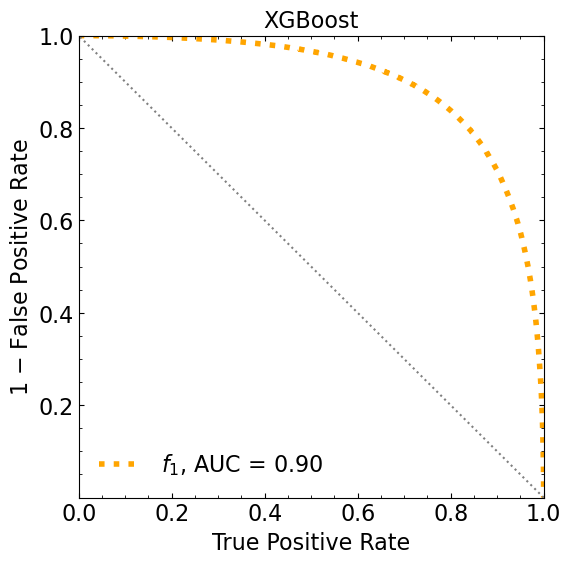

ML iteration  6
[0]	validation_0-logloss:0.64920	validation_1-logloss:0.64973
[1]	validation_0-logloss:0.61284	validation_1-logloss:0.61380


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58250	validation_1-logloss:0.58388
[3]	validation_0-logloss:0.55675	validation_1-logloss:0.55855
[4]	validation_0-logloss:0.53493	validation_1-logloss:0.53712
[5]	validation_0-logloss:0.51616	validation_1-logloss:0.51869
[6]	validation_0-logloss:0.50003	validation_1-logloss:0.50294
[7]	validation_0-logloss:0.48608	validation_1-logloss:0.48930
[8]	validation_0-logloss:0.47393	validation_1-logloss:0.47754
[9]	validation_0-logloss:0.46338	validation_1-logloss:0.46733
[10]	validation_0-logloss:0.45415	validation_1-logloss:0.45839
[11]	validation_0-logloss:0.44607	validation_1-logloss:0.45066
[12]	validation_0-logloss:0.43904	validation_1-logloss:0.44390
[13]	validation_0-logloss:0.43285	validation_1-logloss:0.43800
[14]	validation_0-logloss:0.42739	validation_1-logloss:0.43279
[15]	validation_0-logloss:0.42261	validation_1-logloss:0.42829
[16]	validation_0-logloss:0.41836	validation_1-logloss:0.42427
[17]	validation_0-logloss:0.41460	validation_1-logloss:0.42075


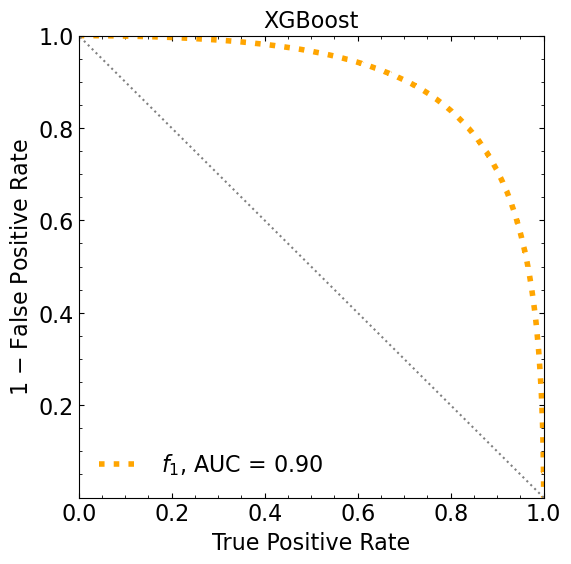

ML iteration  7
[0]	validation_0-logloss:0.64897	validation_1-logloss:0.64963
[1]	validation_0-logloss:0.61251	validation_1-logloss:0.61372


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58190	validation_1-logloss:0.58367
[3]	validation_0-logloss:0.55609	validation_1-logloss:0.55842
[4]	validation_0-logloss:0.53419	validation_1-logloss:0.53694
[5]	validation_0-logloss:0.51543	validation_1-logloss:0.51861
[6]	validation_0-logloss:0.49919	validation_1-logloss:0.50281
[7]	validation_0-logloss:0.48527	validation_1-logloss:0.48926
[8]	validation_0-logloss:0.47314	validation_1-logloss:0.47751
[9]	validation_0-logloss:0.46259	validation_1-logloss:0.46726
[10]	validation_0-logloss:0.45335	validation_1-logloss:0.45840
[11]	validation_0-logloss:0.44530	validation_1-logloss:0.45065
[12]	validation_0-logloss:0.43823	validation_1-logloss:0.44389
[13]	validation_0-logloss:0.43202	validation_1-logloss:0.43797
[14]	validation_0-logloss:0.42657	validation_1-logloss:0.43281
[15]	validation_0-logloss:0.42177	validation_1-logloss:0.42829
[16]	validation_0-logloss:0.41748	validation_1-logloss:0.42431
[17]	validation_0-logloss:0.41371	validation_1-logloss:0.42077


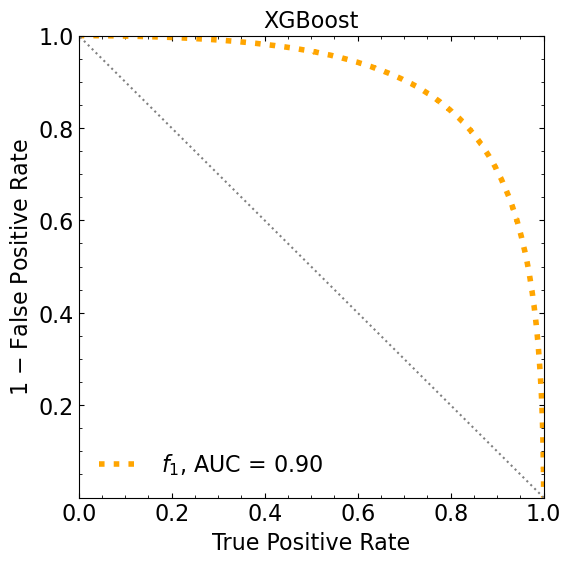

ML iteration  8
[0]	validation_0-logloss:0.64971	validation_1-logloss:0.64987
[1]	validation_0-logloss:0.61385	validation_1-logloss:0.61411


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58378	validation_1-logloss:0.58432
[3]	validation_0-logloss:0.55841	validation_1-logloss:0.55910
[4]	validation_0-logloss:0.53685	validation_1-logloss:0.53776
[5]	validation_0-logloss:0.51839	validation_1-logloss:0.51945
[6]	validation_0-logloss:0.50251	validation_1-logloss:0.50375
[7]	validation_0-logloss:0.48878	validation_1-logloss:0.49014
[8]	validation_0-logloss:0.47685	validation_1-logloss:0.47836
[9]	validation_0-logloss:0.46649	validation_1-logloss:0.46821
[10]	validation_0-logloss:0.45748	validation_1-logloss:0.45938
[11]	validation_0-logloss:0.44957	validation_1-logloss:0.45161
[12]	validation_0-logloss:0.44266	validation_1-logloss:0.44486
[13]	validation_0-logloss:0.43657	validation_1-logloss:0.43895
[14]	validation_0-logloss:0.43118	validation_1-logloss:0.43375
[15]	validation_0-logloss:0.42650	validation_1-logloss:0.42924
[16]	validation_0-logloss:0.42232	validation_1-logloss:0.42524
[17]	validation_0-logloss:0.41865	validation_1-logloss:0.42170


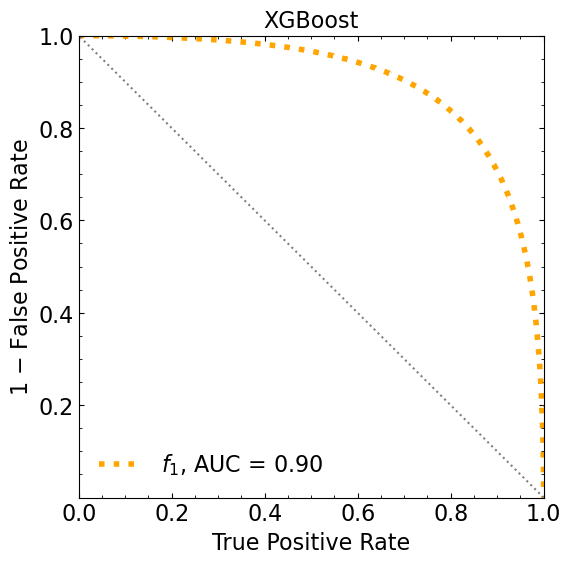

ML iteration  9
[0]	validation_0-logloss:0.64912	validation_1-logloss:0.64969


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.61287	validation_1-logloss:0.61393
[2]	validation_0-logloss:0.58246	validation_1-logloss:0.58402
[3]	validation_0-logloss:0.55683	validation_1-logloss:0.55881
[4]	validation_0-logloss:0.53504	validation_1-logloss:0.53741
[5]	validation_0-logloss:0.51634	validation_1-logloss:0.51908
[6]	validation_0-logloss:0.50025	validation_1-logloss:0.50332
[7]	validation_0-logloss:0.48627	validation_1-logloss:0.48973
[8]	validation_0-logloss:0.47428	validation_1-logloss:0.47800
[9]	validation_0-logloss:0.46373	validation_1-logloss:0.46777
[10]	validation_0-logloss:0.45451	validation_1-logloss:0.45882
[11]	validation_0-logloss:0.44646	validation_1-logloss:0.45106
[12]	validation_0-logloss:0.43945	validation_1-logloss:0.44430
[13]	validation_0-logloss:0.43324	validation_1-logloss:0.43837
[14]	validation_0-logloss:0.42779	validation_1-logloss:0.43317
[15]	validation_0-logloss:0.42301	validation_1-logloss:0.42861
[16]	validation_0-logloss:0.41882	validation_1-logloss:0.42463
[

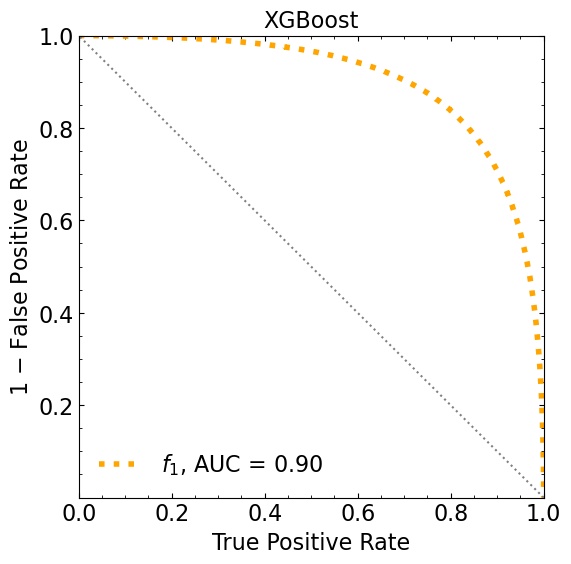

Classification score (1 ML):


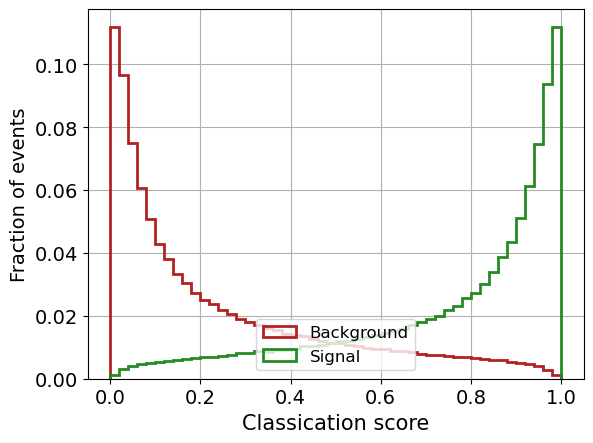

Classification score (10 ML):


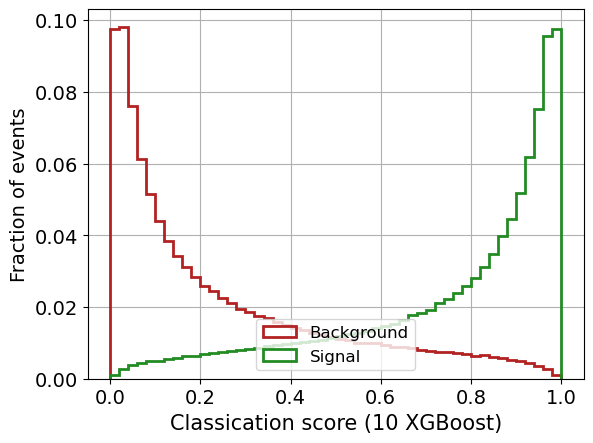

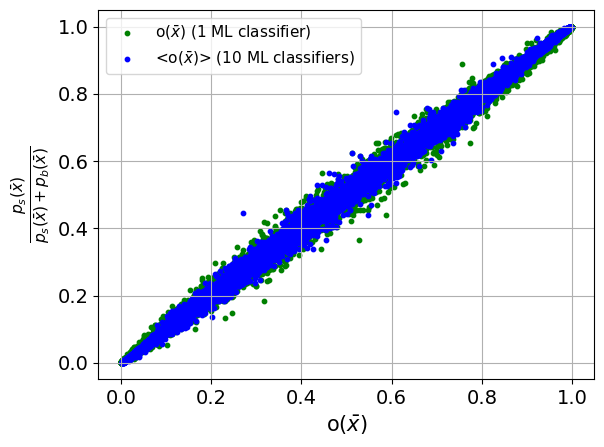


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  6.773103746624184
Z_XG 25 bins_1ML:  7.696507709928942
Z_XG 50 bins_1ML:  8.114033062601717
Z_XG 100 bins_1ML:  8.389740072395037

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  5.003341595619298
Z_XG 25 bins_eq_1ML:  6.009103458323454
Z_XG 50 bins_eq_1ML:  6.656101330947932
Z_XG 100 bins_eq_1ML:  7.183234766432677

 BL lineal bins, 10 ML
Z_XG 10 bins:  6.828652929164154
Z_XG 25 bins:  7.7963923505902075
Z_XG 50 bins:  8.202236815169318
Z_XG 100 bins:  8.446104287940882

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  5.018611950435621
Z_XG 25 bins_eq:  6.0321834580453535
Z_XG 50 bins_eq:  6.686577189153565
Z_XG 100 bins_eq:  7.2274502303966415

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSS

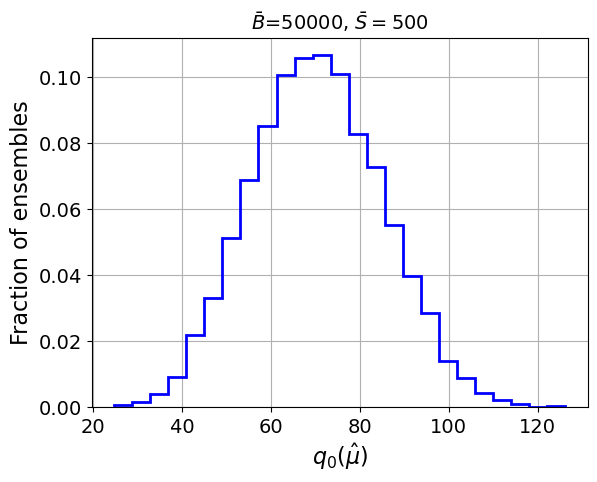

muhat mean:  0.05906417925580453
Z_gaussian:  8.369968228569522
Z_gaussian_mu0:  8.367207179685511

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf  1755.15986097  1764.57539851
  1765.92674409  1760.49561993  1747.13120898  1726.02949903
  1693.86392061  1646.43870537  1573.2071546   1464.56738291
  1310.86072024  1104.51779131   837.66716124   499.19498308
    68.66581537  -472.97095743 -1139.12084769 -2051.46831323]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights


KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.003030951223220623


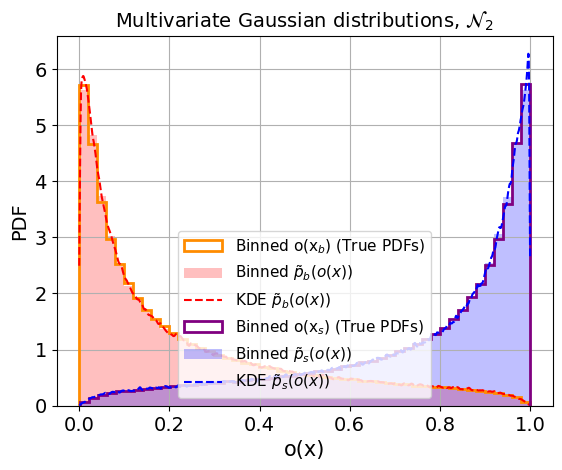

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf  1759.57518856  1767.37399383
  1770.07097398  1766.16701739  1754.13875246  1733.64830044
  1700.33346607  1650.70852879  1575.62051471  1466.8583868
  1314.36908897  1110.0040501    846.39005268   513.64992794
    88.80392927  -452.3641243  -1120.08598602 -2042.67211551]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf  1696.95677361  1713.35844042  1721.90400794
  1723.26147362  1718.53251088  1705.03710997  1684.43330256
  1651.20812947  1599.75985998  1523.991

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.004386370005779536


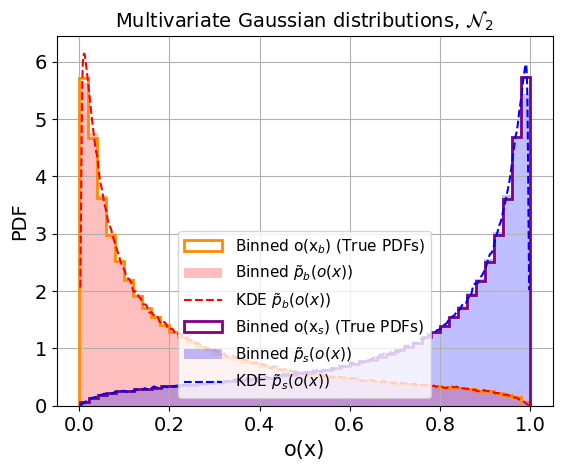

 Z MLL+KDE (1ML) 


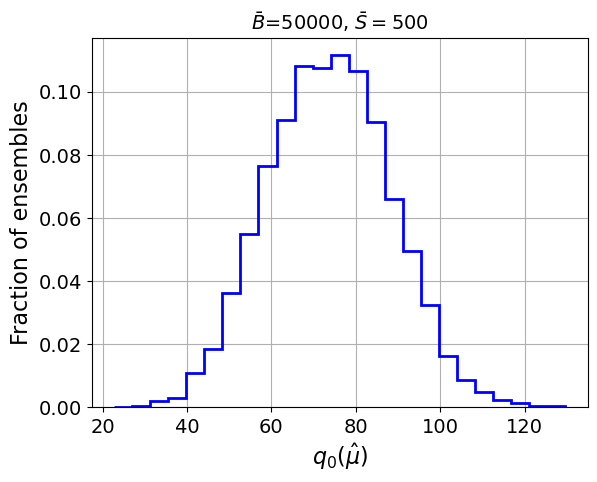

muhat mean_1ML:  0.036317550441042276
Z_KDE_1ML:  8.582201860219122
Z_KDE mu=0_1ML:  8.583218501023197

 Z MLL+KDE (10ML) 


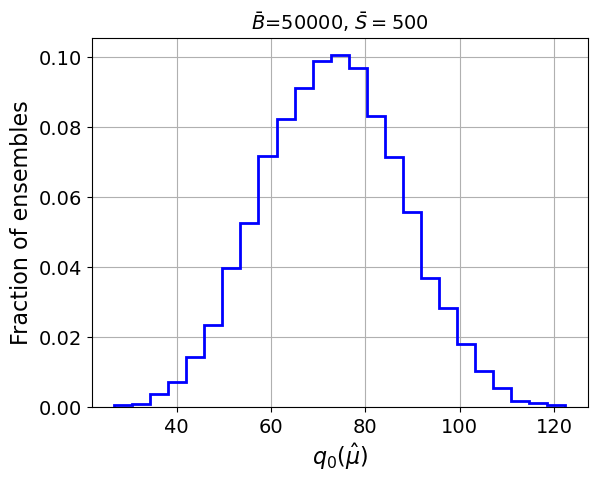

muhat mean:  0.03710838487275677
Z_KDE:  8.545960101490621
Z_KDE mu=0:  8.547240987777704

 ------------------------------------ 



In [30]:
dim=6

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 7)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 7)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 7)
y_gauss_test :  (1000000, 1)



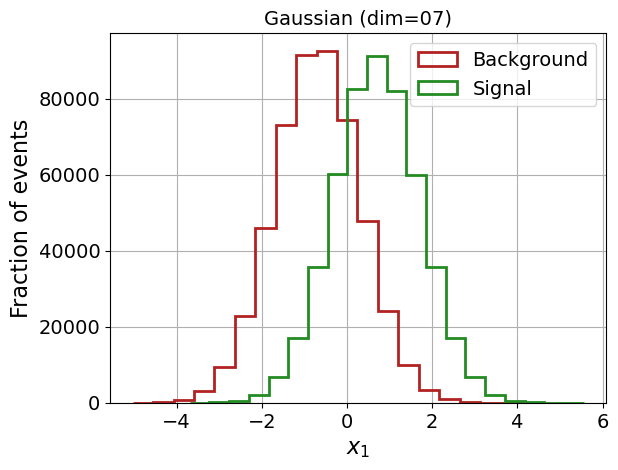

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.64986	validation_1-logloss:0.65000
[1]	validation_0-logloss:0.61389	validation_1-logloss:0.61413
[2]	validation_0-logloss:0.58379	validation_1-logloss:0.58412
[3]	validation_0-logloss:0.55832	validation_1-logloss:0.55873
[4]	validation_0-logloss:0.53659	validation_1-logloss:0.53710
[5]	validation_0-logloss:0.51801	validation_1-logloss:0.51855
[6]	validation_0-logloss:0.50204	validation_1-logloss:0.50267
[7]	validation_0-logloss:0.48820	validation_1-logloss:0.48890
[8]	validation_0-logloss:0.47619	validation_1-logloss:0.47698
[9]	validation_0-logloss:0.46574	validation_1-logloss:0.46658
[10]	validation_0-logloss:0.45662	validation_1-logloss:0.45755
[11]	validation_0-logloss:0.44865	validation_1-logloss:0.44963
[12]	validation_0-logloss:0.44165	validation_1-logloss:0.44268
[13]	validation_0-logloss:0.43553	validation_1-logloss:0.43661
[14]	validation_0-logloss:0.43016	validation_1-logloss:0.43130
[15]	validation_0-logloss:0.42543	validation_1-logloss:0.42660
[1

[130]	validation_0-logloss:0.38764	validation_1-logloss:0.39092
[131]	validation_0-logloss:0.38762	validation_1-logloss:0.39092
[132]	validation_0-logloss:0.38759	validation_1-logloss:0.39091
[133]	validation_0-logloss:0.38756	validation_1-logloss:0.39090
[134]	validation_0-logloss:0.38754	validation_1-logloss:0.39090
[135]	validation_0-logloss:0.38752	validation_1-logloss:0.39090
[136]	validation_0-logloss:0.38750	validation_1-logloss:0.39090
[137]	validation_0-logloss:0.38748	validation_1-logloss:0.39090
[138]	validation_0-logloss:0.38747	validation_1-logloss:0.39090
[139]	validation_0-logloss:0.38747	validation_1-logloss:0.39090
[140]	validation_0-logloss:0.38746	validation_1-logloss:0.39090
[141]	validation_0-logloss:0.38745	validation_1-logloss:0.39090
[142]	validation_0-logloss:0.38744	validation_1-logloss:0.39090
[143]	validation_0-logloss:0.38743	validation_1-logloss:0.39090
[144]	validation_0-logloss:0.38743	validation_1-logloss:0.39090
[145]	validation_0-logloss:0.38742	valid

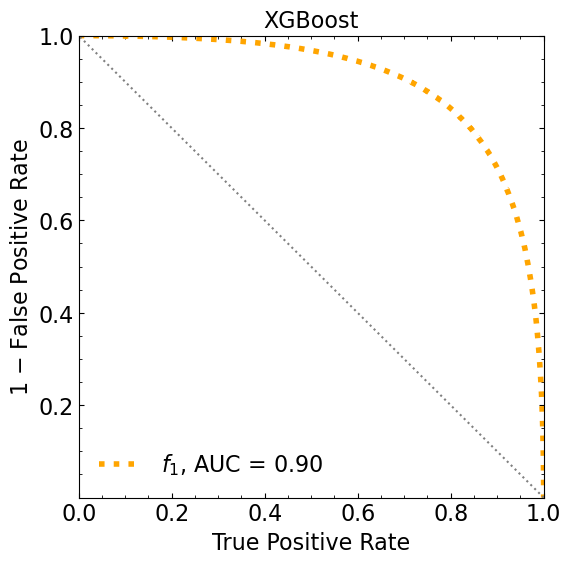

ML iteration 0
[0]	validation_0-logloss:0.64932	validation_1-logloss:0.64976
[1]	validation_0-logloss:0.61296	validation_1-logloss:0.61383


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58250	validation_1-logloss:0.58369
[3]	validation_0-logloss:0.55675	validation_1-logloss:0.55830
[4]	validation_0-logloss:0.53471	validation_1-logloss:0.53665
[5]	validation_0-logloss:0.51585	validation_1-logloss:0.51806
[6]	validation_0-logloss:0.49962	validation_1-logloss:0.50212
[7]	validation_0-logloss:0.48551	validation_1-logloss:0.48836
[8]	validation_0-logloss:0.47326	validation_1-logloss:0.47641
[9]	validation_0-logloss:0.46258	validation_1-logloss:0.46600
[10]	validation_0-logloss:0.45326	validation_1-logloss:0.45697
[11]	validation_0-logloss:0.44514	validation_1-logloss:0.44911
[12]	validation_0-logloss:0.43802	validation_1-logloss:0.44223
[13]	validation_0-logloss:0.43175	validation_1-logloss:0.43618
[14]	validation_0-logloss:0.42622	validation_1-logloss:0.43084
[15]	validation_0-logloss:0.42135	validation_1-logloss:0.42621
[16]	validation_0-logloss:0.41705	validation_1-logloss:0.42211
[17]	validation_0-logloss:0.41329	validation_1-logloss:0.41855


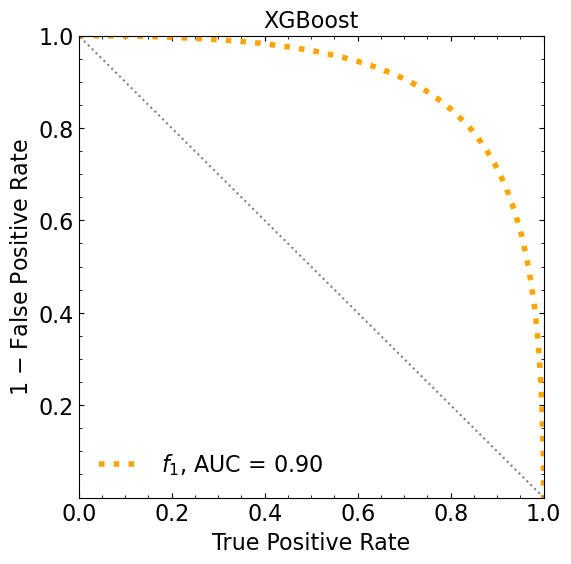

ML iteration  1
[0]	validation_0-logloss:0.64903	validation_1-logloss:0.64970


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.61240	validation_1-logloss:0.61372
[2]	validation_0-logloss:0.58168	validation_1-logloss:0.58360
[3]	validation_0-logloss:0.55566	validation_1-logloss:0.55811
[4]	validation_0-logloss:0.53354	validation_1-logloss:0.53645
[5]	validation_0-logloss:0.51453	validation_1-logloss:0.51790
[6]	validation_0-logloss:0.49815	validation_1-logloss:0.50192
[7]	validation_0-logloss:0.48402	validation_1-logloss:0.48819
[8]	validation_0-logloss:0.47171	validation_1-logloss:0.47628
[9]	validation_0-logloss:0.46093	validation_1-logloss:0.46582
[10]	validation_0-logloss:0.45160	validation_1-logloss:0.45680
[11]	validation_0-logloss:0.44332	validation_1-logloss:0.44890
[12]	validation_0-logloss:0.43605	validation_1-logloss:0.44195
[13]	validation_0-logloss:0.42974	validation_1-logloss:0.43590
[14]	validation_0-logloss:0.42414	validation_1-logloss:0.43061
[15]	validation_0-logloss:0.41922	validation_1-logloss:0.42599
[16]	validation_0-logloss:0.41489	validation_1-logloss:0.42192
[

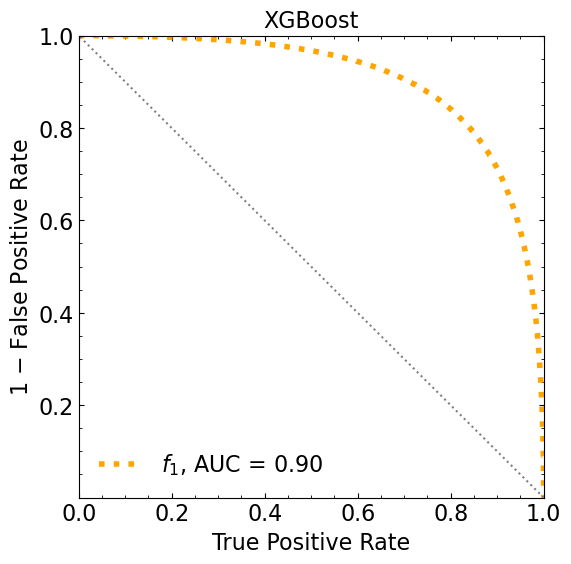

ML iteration  2
[0]	validation_0-logloss:0.64914	validation_1-logloss:0.64971
[1]	validation_0-logloss:0.61262	validation_1-logloss:0.61377


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58206	validation_1-logloss:0.58374
[3]	validation_0-logloss:0.55613	validation_1-logloss:0.55825
[4]	validation_0-logloss:0.53400	validation_1-logloss:0.53657
[5]	validation_0-logloss:0.51503	validation_1-logloss:0.51795
[6]	validation_0-logloss:0.49877	validation_1-logloss:0.50207
[7]	validation_0-logloss:0.48460	validation_1-logloss:0.48828
[8]	validation_0-logloss:0.47232	validation_1-logloss:0.47634
[9]	validation_0-logloss:0.46164	validation_1-logloss:0.46599
[10]	validation_0-logloss:0.45227	validation_1-logloss:0.45697
[11]	validation_0-logloss:0.44407	validation_1-logloss:0.44908
[12]	validation_0-logloss:0.43690	validation_1-logloss:0.44218
[13]	validation_0-logloss:0.43058	validation_1-logloss:0.43617
[14]	validation_0-logloss:0.42505	validation_1-logloss:0.43090
[15]	validation_0-logloss:0.42014	validation_1-logloss:0.42620
[16]	validation_0-logloss:0.41583	validation_1-logloss:0.42213
[17]	validation_0-logloss:0.41197	validation_1-logloss:0.41851


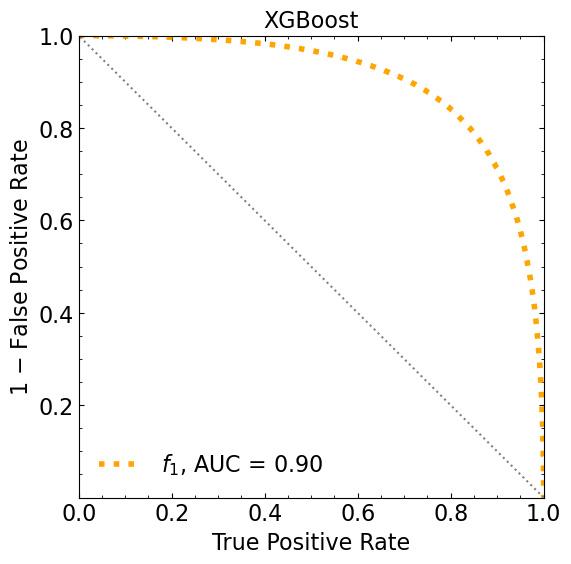

ML iteration  3
[0]	validation_0-logloss:0.64931	validation_1-logloss:0.64982
[1]	validation_0-logloss:0.61289	validation_1-logloss:0.61386


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58241	validation_1-logloss:0.58377
[3]	validation_0-logloss:0.55664	validation_1-logloss:0.55836
[4]	validation_0-logloss:0.53464	validation_1-logloss:0.53670
[5]	validation_0-logloss:0.51574	validation_1-logloss:0.51816
[6]	validation_0-logloss:0.49949	validation_1-logloss:0.50225
[7]	validation_0-logloss:0.48544	validation_1-logloss:0.48848
[8]	validation_0-logloss:0.47320	validation_1-logloss:0.47653
[9]	validation_0-logloss:0.46255	validation_1-logloss:0.46612
[10]	validation_0-logloss:0.45321	validation_1-logloss:0.45703
[11]	validation_0-logloss:0.44503	validation_1-logloss:0.44914
[12]	validation_0-logloss:0.43786	validation_1-logloss:0.44221
[13]	validation_0-logloss:0.43153	validation_1-logloss:0.43615
[14]	validation_0-logloss:0.42595	validation_1-logloss:0.43082
[15]	validation_0-logloss:0.42106	validation_1-logloss:0.42616
[16]	validation_0-logloss:0.41669	validation_1-logloss:0.42206
[17]	validation_0-logloss:0.41289	validation_1-logloss:0.41846


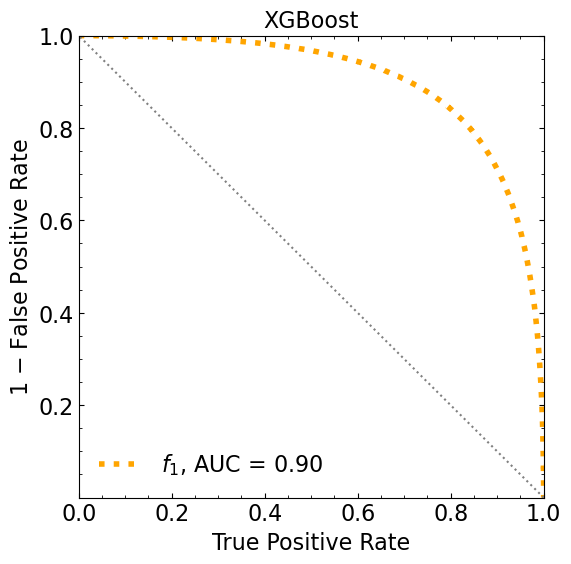

ML iteration  4
[0]	validation_0-logloss:0.64906	validation_1-logloss:0.64968
[1]	validation_0-logloss:0.61246	validation_1-logloss:0.61363


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58182	validation_1-logloss:0.58348
[3]	validation_0-logloss:0.55591	validation_1-logloss:0.55798
[4]	validation_0-logloss:0.53380	validation_1-logloss:0.53634
[5]	validation_0-logloss:0.51491	validation_1-logloss:0.51782
[6]	validation_0-logloss:0.49860	validation_1-logloss:0.50188
[7]	validation_0-logloss:0.48446	validation_1-logloss:0.48811
[8]	validation_0-logloss:0.47219	validation_1-logloss:0.47618
[9]	validation_0-logloss:0.46149	validation_1-logloss:0.46582
[10]	validation_0-logloss:0.45211	validation_1-logloss:0.45676
[11]	validation_0-logloss:0.44393	validation_1-logloss:0.44891
[12]	validation_0-logloss:0.43680	validation_1-logloss:0.44205
[13]	validation_0-logloss:0.43050	validation_1-logloss:0.43599
[14]	validation_0-logloss:0.42495	validation_1-logloss:0.43069
[15]	validation_0-logloss:0.42004	validation_1-logloss:0.42602
[16]	validation_0-logloss:0.41575	validation_1-logloss:0.42199
[17]	validation_0-logloss:0.41197	validation_1-logloss:0.41838


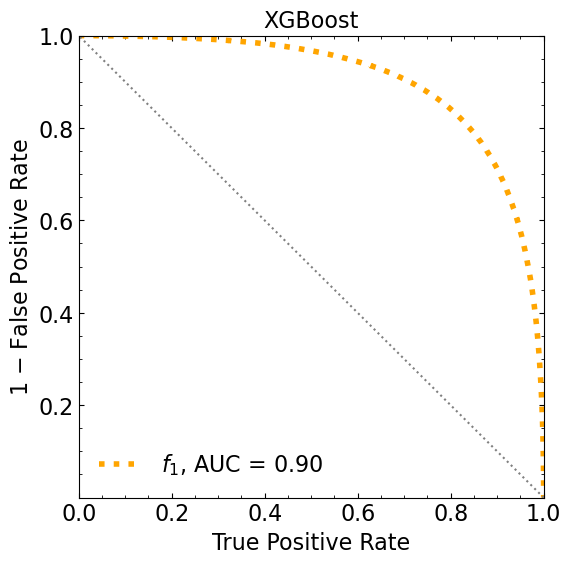

ML iteration  5
[0]	validation_0-logloss:0.64914	validation_1-logloss:0.64974
[1]	validation_0-logloss:0.61268	validation_1-logloss:0.61386


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58211	validation_1-logloss:0.58382
[3]	validation_0-logloss:0.55631	validation_1-logloss:0.55844
[4]	validation_0-logloss:0.53419	validation_1-logloss:0.53675
[5]	validation_0-logloss:0.51536	validation_1-logloss:0.51828
[6]	validation_0-logloss:0.49901	validation_1-logloss:0.50231
[7]	validation_0-logloss:0.48486	validation_1-logloss:0.48853
[8]	validation_0-logloss:0.47266	validation_1-logloss:0.47658
[9]	validation_0-logloss:0.46196	validation_1-logloss:0.46614
[10]	validation_0-logloss:0.45263	validation_1-logloss:0.45713
[11]	validation_0-logloss:0.44445	validation_1-logloss:0.44925
[12]	validation_0-logloss:0.43722	validation_1-logloss:0.44229
[13]	validation_0-logloss:0.43092	validation_1-logloss:0.43626
[14]	validation_0-logloss:0.42534	validation_1-logloss:0.43092
[15]	validation_0-logloss:0.42043	validation_1-logloss:0.42622
[16]	validation_0-logloss:0.41606	validation_1-logloss:0.42212
[17]	validation_0-logloss:0.41223	validation_1-logloss:0.41850


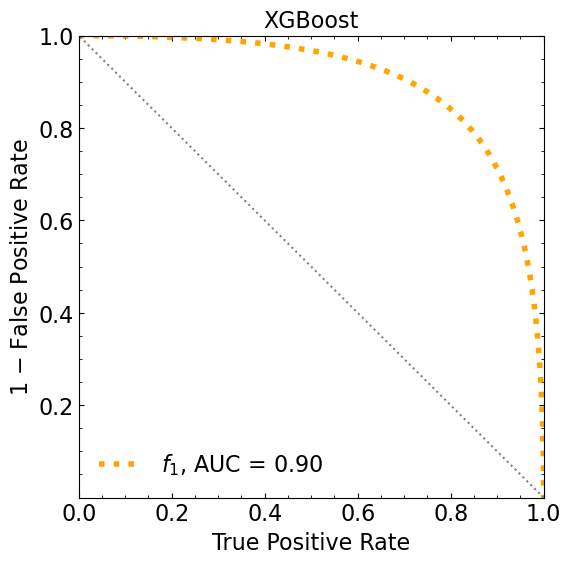

ML iteration  6
[0]	validation_0-logloss:0.64911	validation_1-logloss:0.64974
[1]	validation_0-logloss:0.61256	validation_1-logloss:0.61379


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58205	validation_1-logloss:0.58371
[3]	validation_0-logloss:0.55608	validation_1-logloss:0.55822
[4]	validation_0-logloss:0.53406	validation_1-logloss:0.53661
[5]	validation_0-logloss:0.51499	validation_1-logloss:0.51797
[6]	validation_0-logloss:0.49861	validation_1-logloss:0.50195
[7]	validation_0-logloss:0.48441	validation_1-logloss:0.48812
[8]	validation_0-logloss:0.47210	validation_1-logloss:0.47621
[9]	validation_0-logloss:0.46137	validation_1-logloss:0.46583
[10]	validation_0-logloss:0.45196	validation_1-logloss:0.45679
[11]	validation_0-logloss:0.44374	validation_1-logloss:0.44889
[12]	validation_0-logloss:0.43651	validation_1-logloss:0.44199
[13]	validation_0-logloss:0.43015	validation_1-logloss:0.43593
[14]	validation_0-logloss:0.42454	validation_1-logloss:0.43060
[15]	validation_0-logloss:0.41961	validation_1-logloss:0.42592
[16]	validation_0-logloss:0.41523	validation_1-logloss:0.42180
[17]	validation_0-logloss:0.41137	validation_1-logloss:0.41820


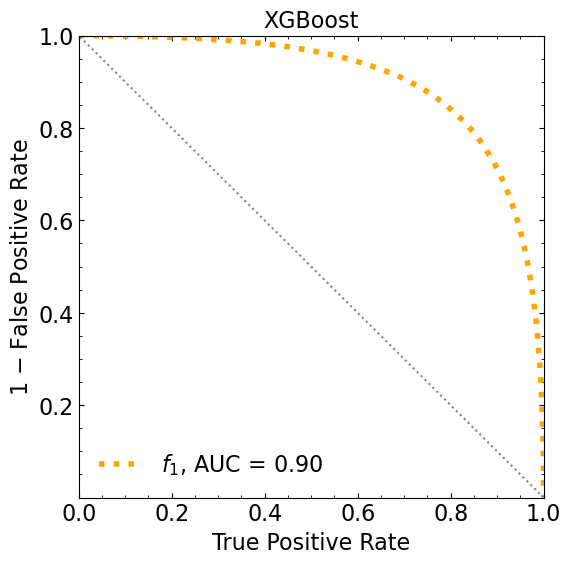

ML iteration  7
[0]	validation_0-logloss:0.64936	validation_1-logloss:0.64987
[1]	validation_0-logloss:0.61302	validation_1-logloss:0.61399


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58257	validation_1-logloss:0.58397
[3]	validation_0-logloss:0.55675	validation_1-logloss:0.55855
[4]	validation_0-logloss:0.53479	validation_1-logloss:0.53698
[5]	validation_0-logloss:0.51591	validation_1-logloss:0.51846
[6]	validation_0-logloss:0.49965	validation_1-logloss:0.50253
[7]	validation_0-logloss:0.48555	validation_1-logloss:0.48877
[8]	validation_0-logloss:0.47328	validation_1-logloss:0.47679
[9]	validation_0-logloss:0.46262	validation_1-logloss:0.46640
[10]	validation_0-logloss:0.45326	validation_1-logloss:0.45727
[11]	validation_0-logloss:0.44510	validation_1-logloss:0.44934
[12]	validation_0-logloss:0.43795	validation_1-logloss:0.44245
[13]	validation_0-logloss:0.43167	validation_1-logloss:0.43639
[14]	validation_0-logloss:0.42610	validation_1-logloss:0.43109
[15]	validation_0-logloss:0.42120	validation_1-logloss:0.42637
[16]	validation_0-logloss:0.41692	validation_1-logloss:0.42228
[17]	validation_0-logloss:0.41308	validation_1-logloss:0.41866


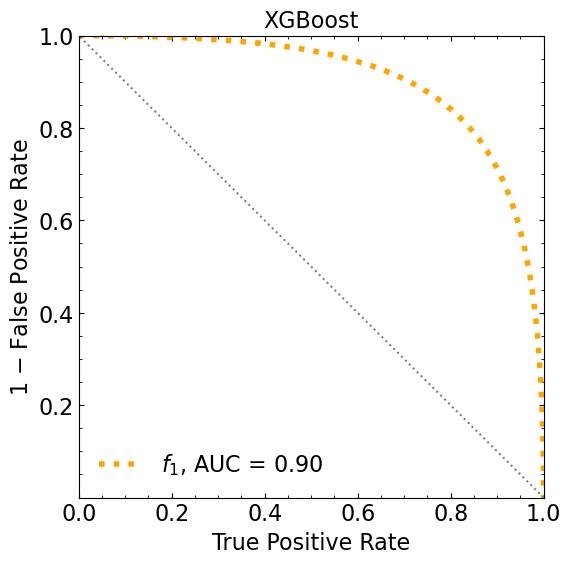

ML iteration  8
[0]	validation_0-logloss:0.64909	validation_1-logloss:0.64976


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.61247	validation_1-logloss:0.61378
[2]	validation_0-logloss:0.58174	validation_1-logloss:0.58361
[3]	validation_0-logloss:0.55569	validation_1-logloss:0.55811
[4]	validation_0-logloss:0.53356	validation_1-logloss:0.53649
[5]	validation_0-logloss:0.51457	validation_1-logloss:0.51796
[6]	validation_0-logloss:0.49820	validation_1-logloss:0.50192
[7]	validation_0-logloss:0.48403	validation_1-logloss:0.48815
[8]	validation_0-logloss:0.47168	validation_1-logloss:0.47619
[9]	validation_0-logloss:0.46096	validation_1-logloss:0.46582
[10]	validation_0-logloss:0.45156	validation_1-logloss:0.45681
[11]	validation_0-logloss:0.44334	validation_1-logloss:0.44885
[12]	validation_0-logloss:0.43618	validation_1-logloss:0.44196
[13]	validation_0-logloss:0.42989	validation_1-logloss:0.43596
[14]	validation_0-logloss:0.42429	validation_1-logloss:0.43066
[15]	validation_0-logloss:0.41938	validation_1-logloss:0.42602
[16]	validation_0-logloss:0.41502	validation_1-logloss:0.42195
[

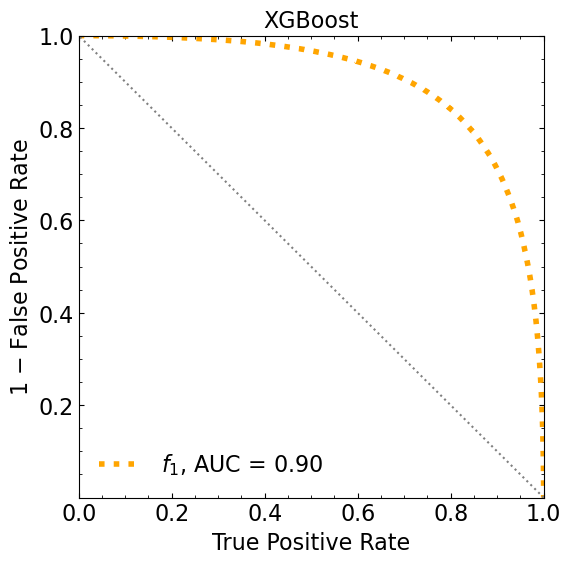

ML iteration  9
[0]	validation_0-logloss:0.64927	validation_1-logloss:0.64975
[1]	validation_0-logloss:0.61288	validation_1-logloss:0.61381


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58247	validation_1-logloss:0.58373
[3]	validation_0-logloss:0.55672	validation_1-logloss:0.55832
[4]	validation_0-logloss:0.53477	validation_1-logloss:0.53670
[5]	validation_0-logloss:0.51596	validation_1-logloss:0.51813
[6]	validation_0-logloss:0.49974	validation_1-logloss:0.50224
[7]	validation_0-logloss:0.48573	validation_1-logloss:0.48852
[8]	validation_0-logloss:0.47349	validation_1-logloss:0.47657
[9]	validation_0-logloss:0.46289	validation_1-logloss:0.46623
[10]	validation_0-logloss:0.45360	validation_1-logloss:0.45715
[11]	validation_0-logloss:0.44548	validation_1-logloss:0.44927
[12]	validation_0-logloss:0.43840	validation_1-logloss:0.44239
[13]	validation_0-logloss:0.43213	validation_1-logloss:0.43635
[14]	validation_0-logloss:0.42659	validation_1-logloss:0.43104
[15]	validation_0-logloss:0.42174	validation_1-logloss:0.42642
[16]	validation_0-logloss:0.41743	validation_1-logloss:0.42233
[17]	validation_0-logloss:0.41366	validation_1-logloss:0.41872


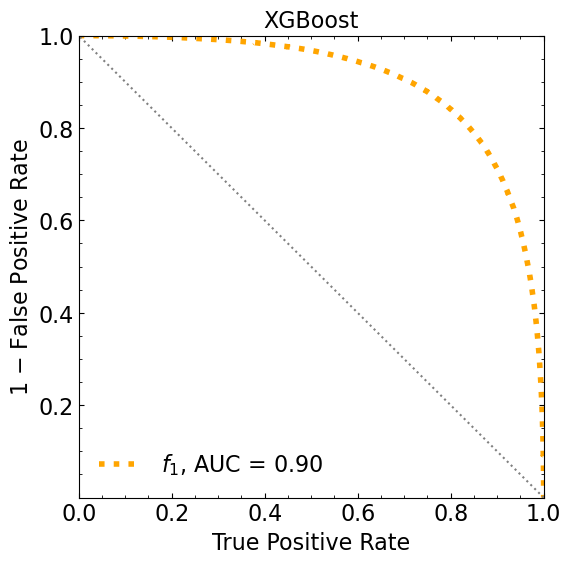

Classification score (1 ML):


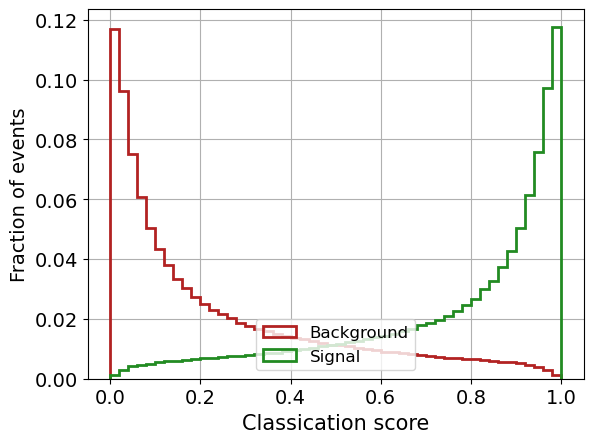

Classification score (10 ML):


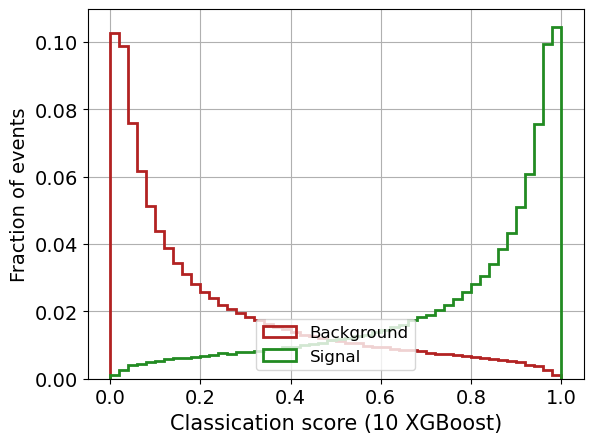

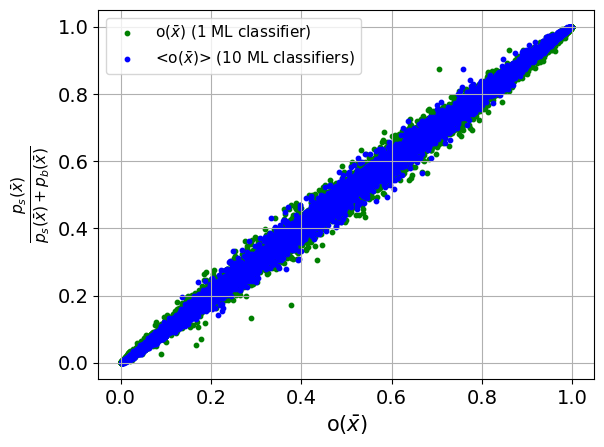


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  6.867687360920723
Z_XG 25 bins_1ML:  7.86823622763364
Z_XG 50 bins_1ML:  8.26981601759772
Z_XG 100 bins_1ML:  8.458563397862104

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  5.037398472408256
Z_XG 25 bins_eq_1ML:  6.078595867425418
Z_XG 50 bins_eq_1ML:  6.772783869349841
Z_XG 100 bins_eq_1ML:  7.336406342789142

 BL lineal bins, 10 ML
Z_XG 10 bins:  6.961206981876469
Z_XG 25 bins:  7.917047774437447
Z_XG 50 bins:  8.32287170951484
Z_XG 100 bins:  8.557278051800182

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  5.0414753593305806
Z_XG 25 bins_eq:  6.083329547298109
Z_XG 50 bins_eq:  6.7831030323622405
Z_XG 100 bins_eq:  7.3474521270682045

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSSIAN

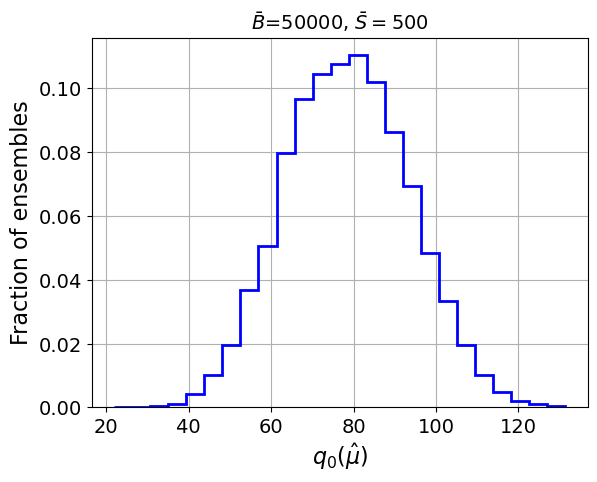

muhat mean:  0.04763763560782724
Z_gaussian:  8.85018302523747
Z_gaussian_mu0:  8.84057553676431

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf  1813.753155    1831.39960613  1839.34856258
  1840.40933329  1836.81511836  1827.59674607  1806.21013384
  1771.70626193  1718.4861368   1642.28802933  1534.03625385
  1383.78363755  1179.71947826   904.97164416   545.20158041
    94.65692292  -456.18741518 -1124.78456292 -2044.58167179]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf  1778.28098588  1786.10311008
  1791.67416495  1787.59344717  1776.00586388  1752.93477674
  1717.96432112  1667.5137601   1591.91

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.004386370005779536


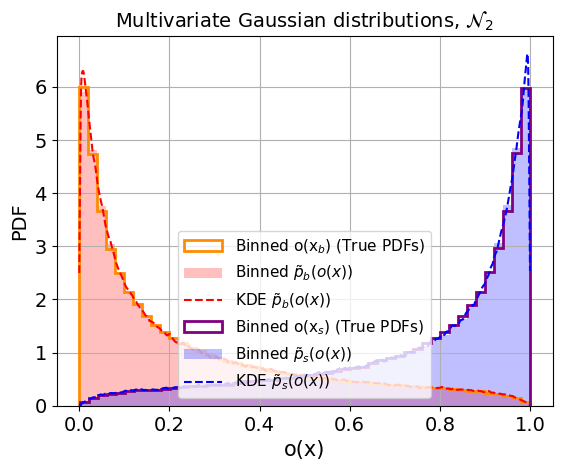

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf  1831.61003247  1842.60417033
  1843.45239804  1838.8801195   1827.87399633  1806.86787384
  1772.04981873  1718.32053161  1641.08039018  1534.45399091
  1387.01595782  1185.33281225   915.91323494   561.95026317
   114.87345918  -434.83109866 -1105.3833691  -2035.66704735]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf  1761.04576152  1774.75193403  1784.64370812
  1788.792063    1784.45987174  1771.93155836  1748.73388498
  1714.40652851  1662.9738644   1585.61

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.004386370005779536


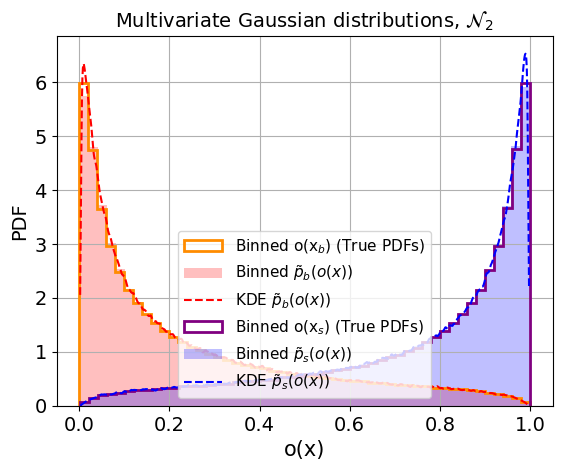

 Z MLL+KDE (1ML) 


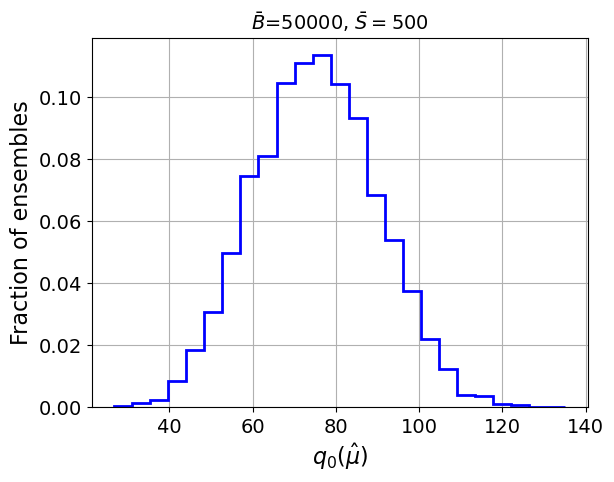

muhat mean_1ML:  0.04057588968873568
Z_KDE_1ML:  8.667530497735612
Z_KDE mu=0_1ML:  8.668834858531746

 Z MLL+KDE (10ML) 


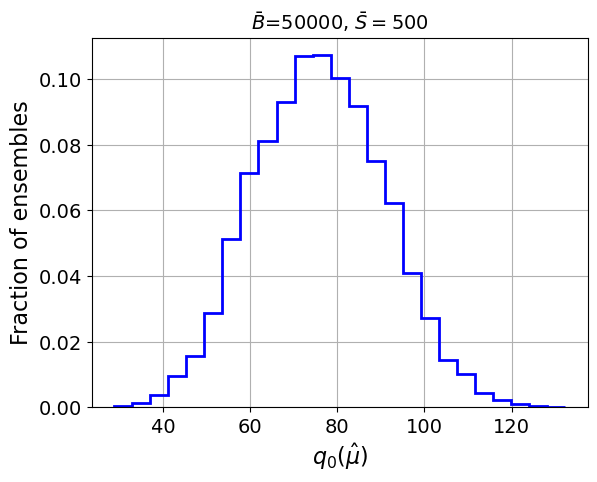

muhat mean:  0.038710331542127135
Z_KDE:  8.705820367760372
Z_KDE mu=0:  8.706961205604728

 ------------------------------------ 



In [31]:
dim=7

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6, signal_X_7 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6, background_X_7 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))
dim7 = np.concatenate((background_X_7,signal_X_7))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['dim7'] = dim7.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6','dim7']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 8)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 8)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 8)
y_gauss_test :  (1000000, 1)



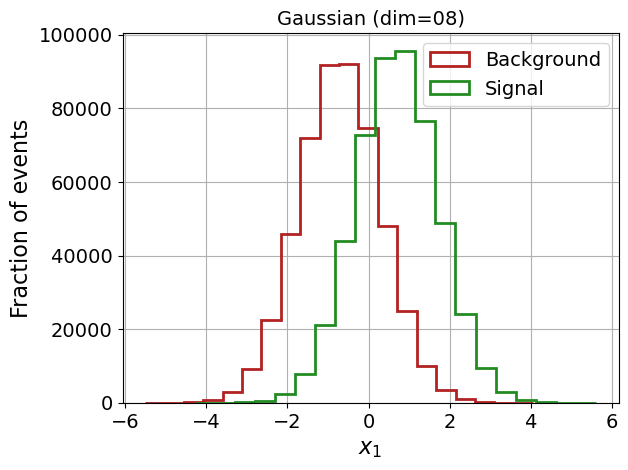

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.64994	validation_1-logloss:0.65014
[1]	validation_0-logloss:0.61388	validation_1-logloss:0.61423
[2]	validation_0-logloss:0.58362	validation_1-logloss:0.58409
[3]	validation_0-logloss:0.55800	validation_1-logloss:0.55864
[4]	validation_0-logloss:0.53613	validation_1-logloss:0.53686
[5]	validation_0-logloss:0.51734	validation_1-logloss:0.51817
[6]	validation_0-logloss:0.50118	validation_1-logloss:0.50211
[7]	validation_0-logloss:0.48715	validation_1-logloss:0.48818
[8]	validation_0-logloss:0.47497	validation_1-logloss:0.47609
[9]	validation_0-logloss:0.46436	validation_1-logloss:0.46556
[10]	validation_0-logloss:0.45509	validation_1-logloss:0.45638
[11]	validation_0-logloss:0.44698	validation_1-logloss:0.44833
[12]	validation_0-logloss:0.43987	validation_1-logloss:0.44128
[13]	validation_0-logloss:0.43362	validation_1-logloss:0.43512
[14]	validation_0-logloss:0.42813	validation_1-logloss:0.42970
[15]	validation_0-logloss:0.42331	validation_1-logloss:0.42493
[1

[130]	validation_0-logloss:0.38421	validation_1-logloss:0.38846
[131]	validation_0-logloss:0.38419	validation_1-logloss:0.38846
[132]	validation_0-logloss:0.38418	validation_1-logloss:0.38846
[133]	validation_0-logloss:0.38417	validation_1-logloss:0.38846
[134]	validation_0-logloss:0.38415	validation_1-logloss:0.38846
[135]	validation_0-logloss:0.38413	validation_1-logloss:0.38845
[136]	validation_0-logloss:0.38411	validation_1-logloss:0.38845
[137]	validation_0-logloss:0.38409	validation_1-logloss:0.38845
[138]	validation_0-logloss:0.38408	validation_1-logloss:0.38845
[139]	validation_0-logloss:0.38408	validation_1-logloss:0.38845
[140]	validation_0-logloss:0.38407	validation_1-logloss:0.38845
[141]	validation_0-logloss:0.38406	validation_1-logloss:0.38845
[142]	validation_0-logloss:0.38405	validation_1-logloss:0.38845
[143]	validation_0-logloss:0.38404	validation_1-logloss:0.38845
[144]	validation_0-logloss:0.38403	validation_1-logloss:0.38845
[145]	validation_0-logloss:0.38403	valid

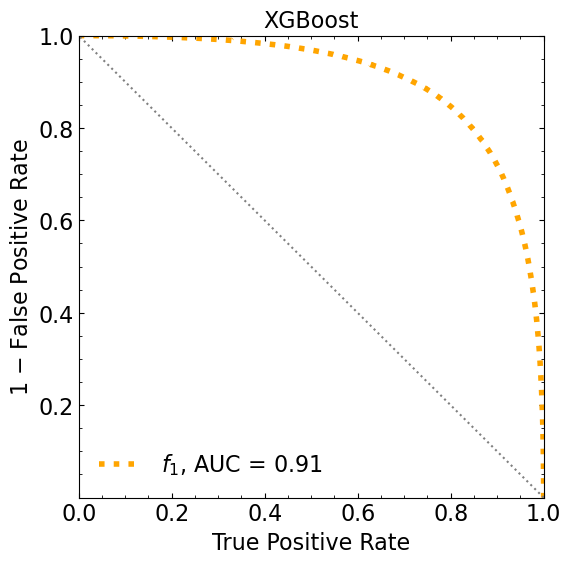

ML iteration 0
[0]	validation_0-logloss:0.64887	validation_1-logloss:0.64976
[1]	validation_0-logloss:0.61226	validation_1-logloss:0.61389


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58135	validation_1-logloss:0.58360
[3]	validation_0-logloss:0.55514	validation_1-logloss:0.55795
[4]	validation_0-logloss:0.53283	validation_1-logloss:0.53622
[5]	validation_0-logloss:0.51359	validation_1-logloss:0.51748
[6]	validation_0-logloss:0.49706	validation_1-logloss:0.50147
[7]	validation_0-logloss:0.48270	validation_1-logloss:0.48750
[8]	validation_0-logloss:0.47018	validation_1-logloss:0.47542
[9]	validation_0-logloss:0.45932	validation_1-logloss:0.46489
[10]	validation_0-logloss:0.44975	validation_1-logloss:0.45569
[11]	validation_0-logloss:0.44138	validation_1-logloss:0.44769
[12]	validation_0-logloss:0.43405	validation_1-logloss:0.44071
[13]	validation_0-logloss:0.42758	validation_1-logloss:0.43456
[14]	validation_0-logloss:0.42186	validation_1-logloss:0.42914
[15]	validation_0-logloss:0.41681	validation_1-logloss:0.42441
[16]	validation_0-logloss:0.41235	validation_1-logloss:0.42024
[17]	validation_0-logloss:0.40838	validation_1-logloss:0.41657


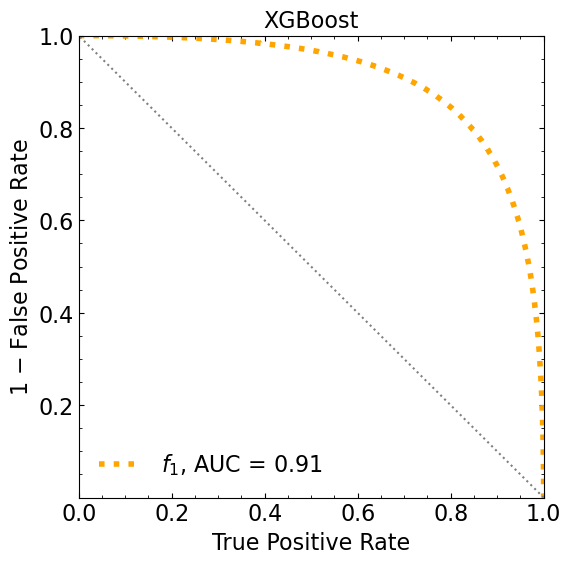

ML iteration  1
[0]	validation_0-logloss:0.64936	validation_1-logloss:0.64983
[1]	validation_0-logloss:0.61312	validation_1-logloss:0.61399


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58249	validation_1-logloss:0.58379
[3]	validation_0-logloss:0.55651	validation_1-logloss:0.55820
[4]	validation_0-logloss:0.53440	validation_1-logloss:0.53649
[5]	validation_0-logloss:0.51540	validation_1-logloss:0.51783
[6]	validation_0-logloss:0.49896	validation_1-logloss:0.50171
[7]	validation_0-logloss:0.48467	validation_1-logloss:0.48775
[8]	validation_0-logloss:0.47223	validation_1-logloss:0.47570
[9]	validation_0-logloss:0.46136	validation_1-logloss:0.46519
[10]	validation_0-logloss:0.45185	validation_1-logloss:0.45596
[11]	validation_0-logloss:0.44354	validation_1-logloss:0.44792
[12]	validation_0-logloss:0.43623	validation_1-logloss:0.44084
[13]	validation_0-logloss:0.42983	validation_1-logloss:0.43470
[14]	validation_0-logloss:0.42415	validation_1-logloss:0.42928
[15]	validation_0-logloss:0.41914	validation_1-logloss:0.42453
[16]	validation_0-logloss:0.41473	validation_1-logloss:0.42036
[17]	validation_0-logloss:0.41083	validation_1-logloss:0.41669


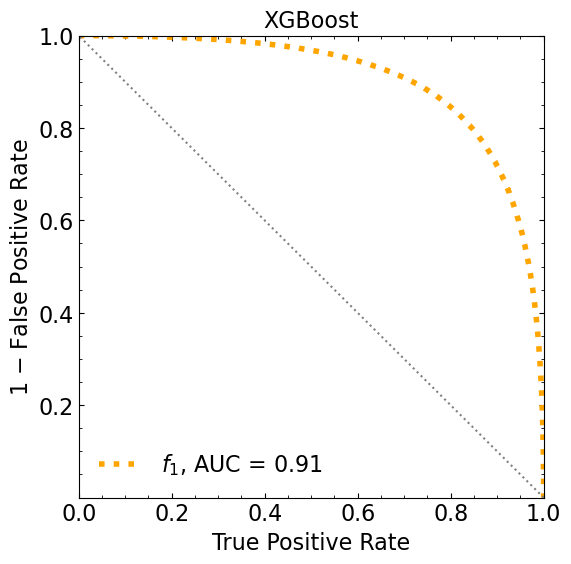

ML iteration  2
[0]	validation_0-logloss:0.64919	validation_1-logloss:0.64980
[1]	validation_0-logloss:0.61276	validation_1-logloss:0.61389


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58205	validation_1-logloss:0.58372
[3]	validation_0-logloss:0.55603	validation_1-logloss:0.55811
[4]	validation_0-logloss:0.53374	validation_1-logloss:0.53625
[5]	validation_0-logloss:0.51463	validation_1-logloss:0.51752
[6]	validation_0-logloss:0.49811	validation_1-logloss:0.50138
[7]	validation_0-logloss:0.48381	validation_1-logloss:0.48747
[8]	validation_0-logloss:0.47142	validation_1-logloss:0.47539
[9]	validation_0-logloss:0.46062	validation_1-logloss:0.46494
[10]	validation_0-logloss:0.45113	validation_1-logloss:0.45575
[11]	validation_0-logloss:0.44284	validation_1-logloss:0.44777
[12]	validation_0-logloss:0.43553	validation_1-logloss:0.44077
[13]	validation_0-logloss:0.42909	validation_1-logloss:0.43460
[14]	validation_0-logloss:0.42341	validation_1-logloss:0.42919
[15]	validation_0-logloss:0.41840	validation_1-logloss:0.42444
[16]	validation_0-logloss:0.41395	validation_1-logloss:0.42026
[17]	validation_0-logloss:0.41002	validation_1-logloss:0.41658


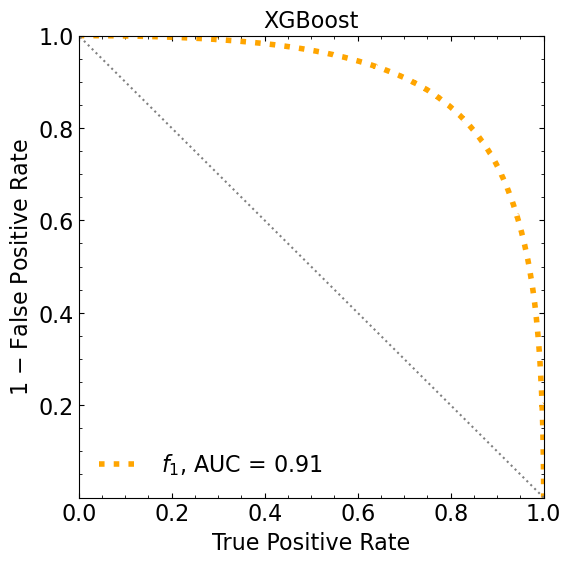

ML iteration  3
[0]	validation_0-logloss:0.64900	validation_1-logloss:0.64975
[1]	validation_0-logloss:0.61240	validation_1-logloss:0.61381


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58160	validation_1-logloss:0.58363
[3]	validation_0-logloss:0.55556	validation_1-logloss:0.55812
[4]	validation_0-logloss:0.53333	validation_1-logloss:0.53633
[5]	validation_0-logloss:0.51420	validation_1-logloss:0.51767
[6]	validation_0-logloss:0.49770	validation_1-logloss:0.50154
[7]	validation_0-logloss:0.48346	validation_1-logloss:0.48777
[8]	validation_0-logloss:0.47097	validation_1-logloss:0.47559
[9]	validation_0-logloss:0.46013	validation_1-logloss:0.46508
[10]	validation_0-logloss:0.45061	validation_1-logloss:0.45586
[11]	validation_0-logloss:0.44233	validation_1-logloss:0.44790
[12]	validation_0-logloss:0.43505	validation_1-logloss:0.44091
[13]	validation_0-logloss:0.42857	validation_1-logloss:0.43470
[14]	validation_0-logloss:0.42294	validation_1-logloss:0.42933
[15]	validation_0-logloss:0.41792	validation_1-logloss:0.42463
[16]	validation_0-logloss:0.41346	validation_1-logloss:0.42044
[17]	validation_0-logloss:0.40952	validation_1-logloss:0.41677


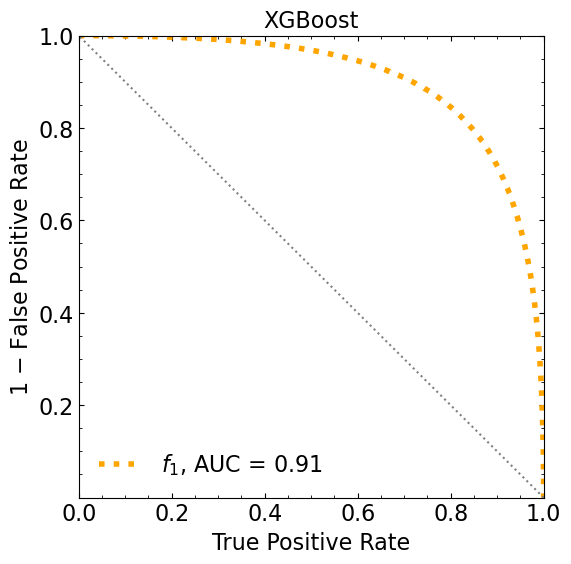

ML iteration  4
[0]	validation_0-logloss:0.64915	validation_1-logloss:0.64979
[1]	validation_0-logloss:0.61244	validation_1-logloss:0.61371


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58158	validation_1-logloss:0.58347
[3]	validation_0-logloss:0.55545	validation_1-logloss:0.55789
[4]	validation_0-logloss:0.53320	validation_1-logloss:0.53604
[5]	validation_0-logloss:0.51401	validation_1-logloss:0.51735
[6]	validation_0-logloss:0.49748	validation_1-logloss:0.50122
[7]	validation_0-logloss:0.48316	validation_1-logloss:0.48727
[8]	validation_0-logloss:0.47070	validation_1-logloss:0.47518
[9]	validation_0-logloss:0.45981	validation_1-logloss:0.46465
[10]	validation_0-logloss:0.45030	validation_1-logloss:0.45554
[11]	validation_0-logloss:0.44195	validation_1-logloss:0.44754
[12]	validation_0-logloss:0.43463	validation_1-logloss:0.44056
[13]	validation_0-logloss:0.42822	validation_1-logloss:0.43446
[14]	validation_0-logloss:0.42253	validation_1-logloss:0.42907
[15]	validation_0-logloss:0.41753	validation_1-logloss:0.42436
[16]	validation_0-logloss:0.41309	validation_1-logloss:0.42020
[17]	validation_0-logloss:0.40920	validation_1-logloss:0.41653


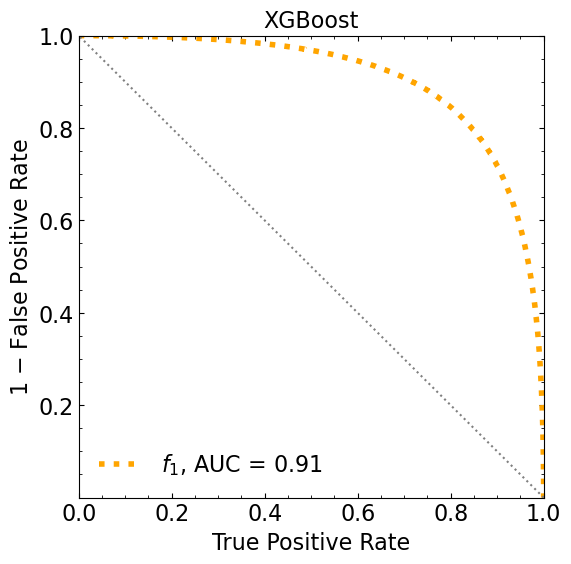

ML iteration  5
[0]	validation_0-logloss:0.64899	validation_1-logloss:0.64981
[1]	validation_0-logloss:0.61242	validation_1-logloss:0.61383


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58159	validation_1-logloss:0.58364
[3]	validation_0-logloss:0.55545	validation_1-logloss:0.55802
[4]	validation_0-logloss:0.53305	validation_1-logloss:0.53619
[5]	validation_0-logloss:0.51387	validation_1-logloss:0.51743
[6]	validation_0-logloss:0.49735	validation_1-logloss:0.50131
[7]	validation_0-logloss:0.48304	validation_1-logloss:0.48742
[8]	validation_0-logloss:0.47054	validation_1-logloss:0.47531
[9]	validation_0-logloss:0.45959	validation_1-logloss:0.46480
[10]	validation_0-logloss:0.45009	validation_1-logloss:0.45560
[11]	validation_0-logloss:0.44172	validation_1-logloss:0.44755
[12]	validation_0-logloss:0.43442	validation_1-logloss:0.44055
[13]	validation_0-logloss:0.42794	validation_1-logloss:0.43437
[14]	validation_0-logloss:0.42228	validation_1-logloss:0.42898
[15]	validation_0-logloss:0.41726	validation_1-logloss:0.42428
[16]	validation_0-logloss:0.41281	validation_1-logloss:0.42008
[17]	validation_0-logloss:0.40886	validation_1-logloss:0.41643


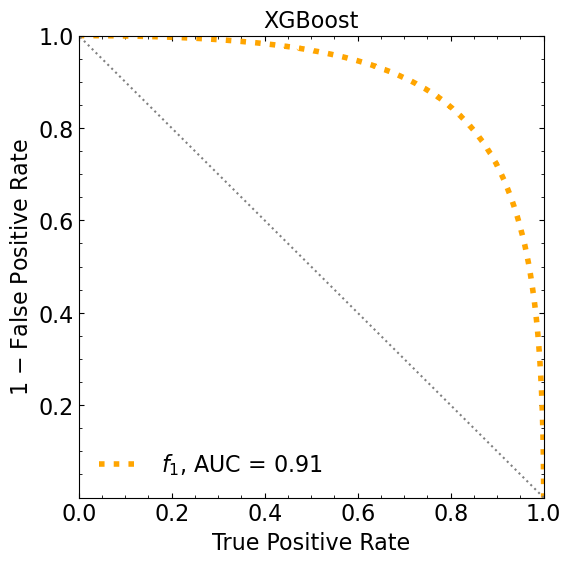

ML iteration  6
[0]	validation_0-logloss:0.64922	validation_1-logloss:0.64976
[1]	validation_0-logloss:0.61288	validation_1-logloss:0.61393


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58221	validation_1-logloss:0.58370
[3]	validation_0-logloss:0.55616	validation_1-logloss:0.55809
[4]	validation_0-logloss:0.53399	validation_1-logloss:0.53626
[5]	validation_0-logloss:0.51492	validation_1-logloss:0.51760
[6]	validation_0-logloss:0.49853	validation_1-logloss:0.50155
[7]	validation_0-logloss:0.48429	validation_1-logloss:0.48763
[8]	validation_0-logloss:0.47185	validation_1-logloss:0.47551
[9]	validation_0-logloss:0.46105	validation_1-logloss:0.46500
[10]	validation_0-logloss:0.45161	validation_1-logloss:0.45587
[11]	validation_0-logloss:0.44329	validation_1-logloss:0.44782
[12]	validation_0-logloss:0.43602	validation_1-logloss:0.44086
[13]	validation_0-logloss:0.42964	validation_1-logloss:0.43475
[14]	validation_0-logloss:0.42399	validation_1-logloss:0.42930
[15]	validation_0-logloss:0.41895	validation_1-logloss:0.42453
[16]	validation_0-logloss:0.41454	validation_1-logloss:0.42038
[17]	validation_0-logloss:0.41059	validation_1-logloss:0.41670


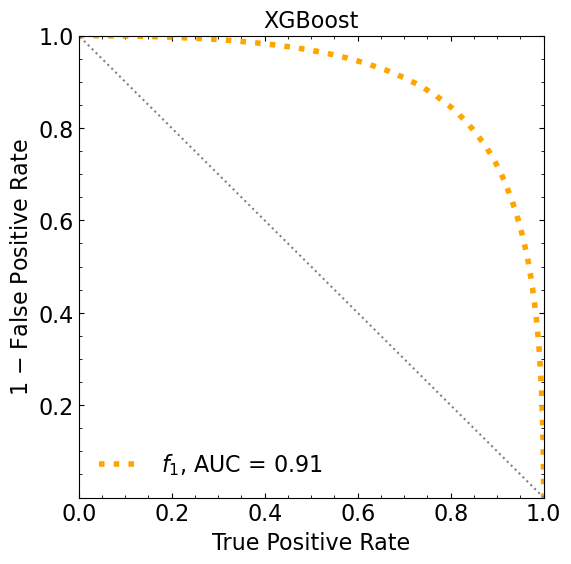

ML iteration  7
[0]	validation_0-logloss:0.64917	validation_1-logloss:0.64978
[1]	validation_0-logloss:0.61261	validation_1-logloss:0.61376


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58195	validation_1-logloss:0.58363
[3]	validation_0-logloss:0.55593	validation_1-logloss:0.55810
[4]	validation_0-logloss:0.53375	validation_1-logloss:0.53632
[5]	validation_0-logloss:0.51464	validation_1-logloss:0.51760
[6]	validation_0-logloss:0.49821	validation_1-logloss:0.50158
[7]	validation_0-logloss:0.48390	validation_1-logloss:0.48758
[8]	validation_0-logloss:0.47149	validation_1-logloss:0.47553
[9]	validation_0-logloss:0.46065	validation_1-logloss:0.46501
[10]	validation_0-logloss:0.45123	validation_1-logloss:0.45588
[11]	validation_0-logloss:0.44294	validation_1-logloss:0.44788
[12]	validation_0-logloss:0.43564	validation_1-logloss:0.44087
[13]	validation_0-logloss:0.42922	validation_1-logloss:0.43472
[14]	validation_0-logloss:0.42358	validation_1-logloss:0.42935
[15]	validation_0-logloss:0.41859	validation_1-logloss:0.42462
[16]	validation_0-logloss:0.41420	validation_1-logloss:0.42048
[17]	validation_0-logloss:0.41028	validation_1-logloss:0.41679


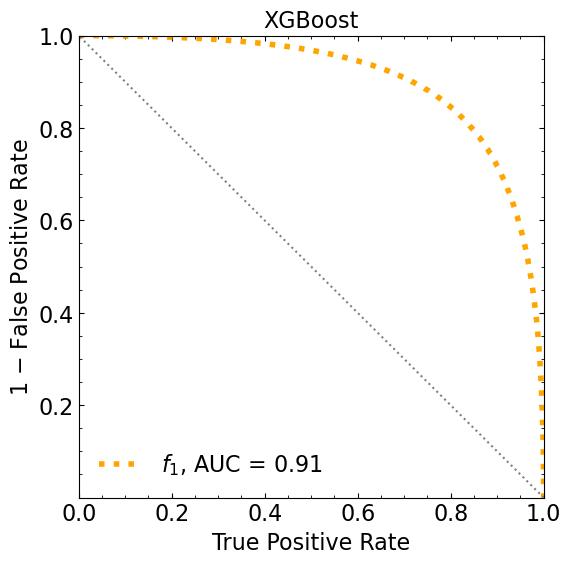

ML iteration  8
[0]	validation_0-logloss:0.64915	validation_1-logloss:0.64987
[1]	validation_0-logloss:0.61258	validation_1-logloss:0.61391


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58190	validation_1-logloss:0.58383
[3]	validation_0-logloss:0.55588	validation_1-logloss:0.55826
[4]	validation_0-logloss:0.53359	validation_1-logloss:0.53642
[5]	validation_0-logloss:0.51448	validation_1-logloss:0.51771
[6]	validation_0-logloss:0.49795	validation_1-logloss:0.50157
[7]	validation_0-logloss:0.48365	validation_1-logloss:0.48767
[8]	validation_0-logloss:0.47126	validation_1-logloss:0.47556
[9]	validation_0-logloss:0.46040	validation_1-logloss:0.46504
[10]	validation_0-logloss:0.45091	validation_1-logloss:0.45589
[11]	validation_0-logloss:0.44257	validation_1-logloss:0.44786
[12]	validation_0-logloss:0.43526	validation_1-logloss:0.44088
[13]	validation_0-logloss:0.42881	validation_1-logloss:0.43469
[14]	validation_0-logloss:0.42313	validation_1-logloss:0.42926
[15]	validation_0-logloss:0.41811	validation_1-logloss:0.42453
[16]	validation_0-logloss:0.41369	validation_1-logloss:0.42039
[17]	validation_0-logloss:0.40975	validation_1-logloss:0.41671


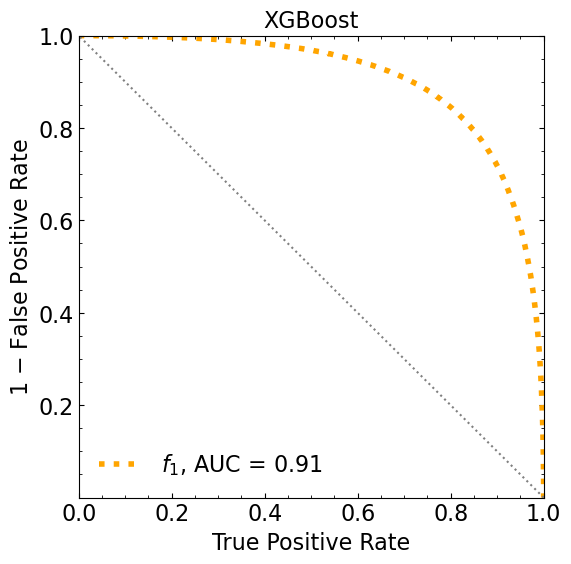

ML iteration  9
[0]	validation_0-logloss:0.64893	validation_1-logloss:0.64967
[1]	validation_0-logloss:0.61238	validation_1-logloss:0.61364


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58164	validation_1-logloss:0.58346
[3]	validation_0-logloss:0.55557	validation_1-logloss:0.55787
[4]	validation_0-logloss:0.53332	validation_1-logloss:0.53611
[5]	validation_0-logloss:0.51416	validation_1-logloss:0.51743
[6]	validation_0-logloss:0.49767	validation_1-logloss:0.50129
[7]	validation_0-logloss:0.48336	validation_1-logloss:0.48734
[8]	validation_0-logloss:0.47088	validation_1-logloss:0.47528
[9]	validation_0-logloss:0.45998	validation_1-logloss:0.46477
[10]	validation_0-logloss:0.45046	validation_1-logloss:0.45562
[11]	validation_0-logloss:0.44217	validation_1-logloss:0.44760
[12]	validation_0-logloss:0.43485	validation_1-logloss:0.44058
[13]	validation_0-logloss:0.42842	validation_1-logloss:0.43444
[14]	validation_0-logloss:0.42275	validation_1-logloss:0.42903
[15]	validation_0-logloss:0.41775	validation_1-logloss:0.42435
[16]	validation_0-logloss:0.41332	validation_1-logloss:0.42018
[17]	validation_0-logloss:0.40934	validation_1-logloss:0.41651


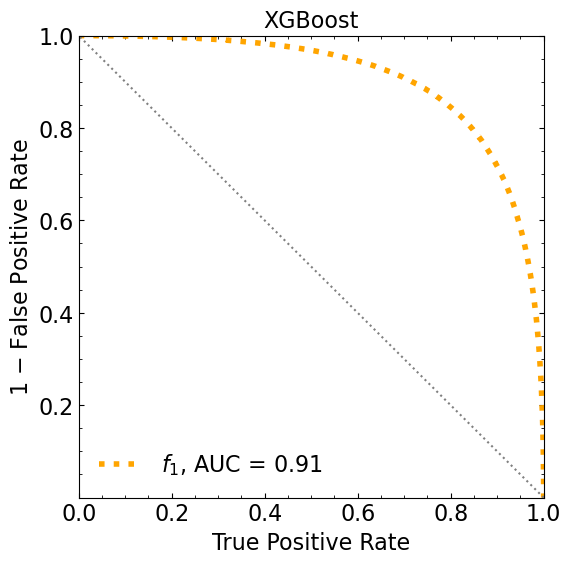

Classification score (1 ML):


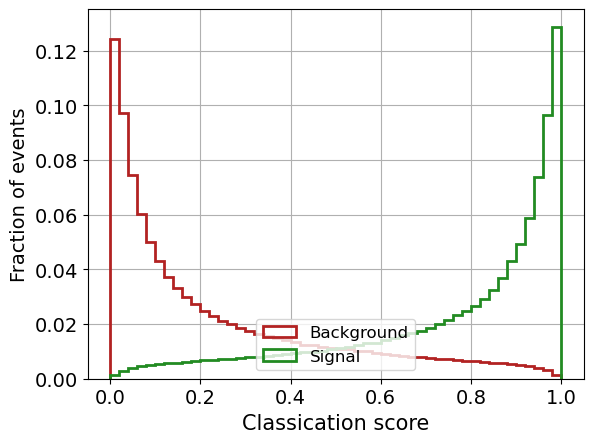

Classification score (10 ML):


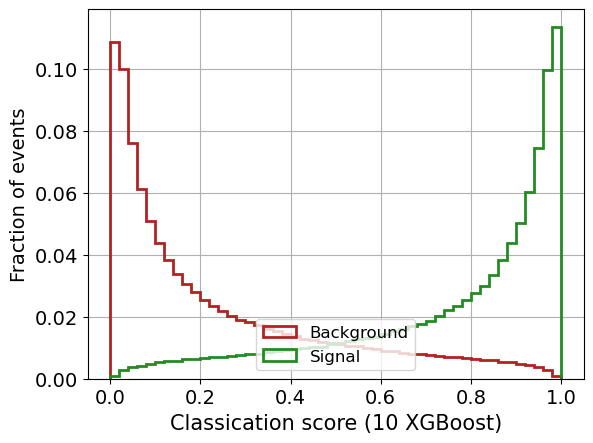

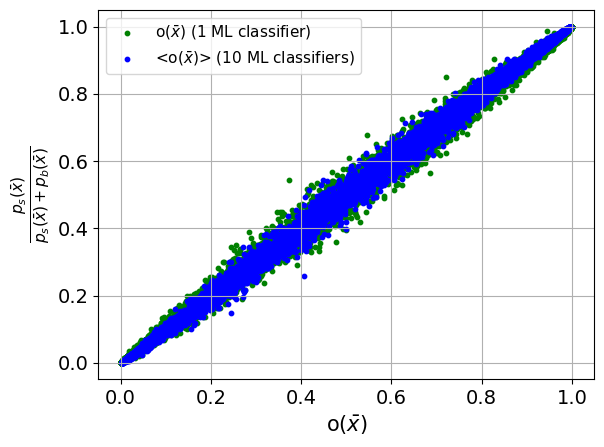


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  6.90634701927205
Z_XG 25 bins_1ML:  7.90580333739146
Z_XG 50 bins_1ML:  8.430310849983073
Z_XG 100 bins_1ML:  8.713964310746569

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  5.051559863454214
Z_XG 25 bins_eq_1ML:  6.09784215108679
Z_XG 50 bins_eq_1ML:  6.773630730838618
Z_XG 100 bins_eq_1ML:  7.34363505267338

 BL lineal bins, 10 ML
Z_XG 10 bins:  6.98412842730722
Z_XG 25 bins:  7.991421237712003
Z_XG 50 bins:  8.514973016228998
Z_XG 100 bins:  8.74751352424288

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  5.069924593883026
Z_XG 25 bins_eq:  6.1285694447929595
Z_XG 50 bins_eq:  6.815588395269349
Z_XG 100 bins_eq:  7.389806772513637

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSSIANS):
n

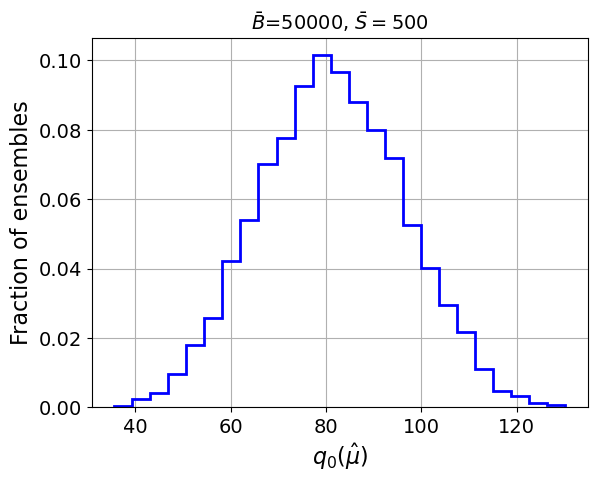

muhat mean:  0.02950420764473284
Z_gaussian:  9.000616457974868
Z_gaussian_mu0:  9.00197593590104

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf  1902.06494275
  1902.74246873  1897.71502873  1882.62673169  1856.76791217
  1816.21586463  1759.43344992  1676.69366896  1560.89589916
  1400.24564827  1184.545212     905.10633313   550.35086471
    98.63155331  -459.10592921 -1129.0732948  -2046.88552981]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf  1884.03592908  1889.26008364
  1890.30305749  1884.81225049  1870.10299754  1844.418214
  1804.47887286  1746.71380567  1663.4004

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.004386370005779536


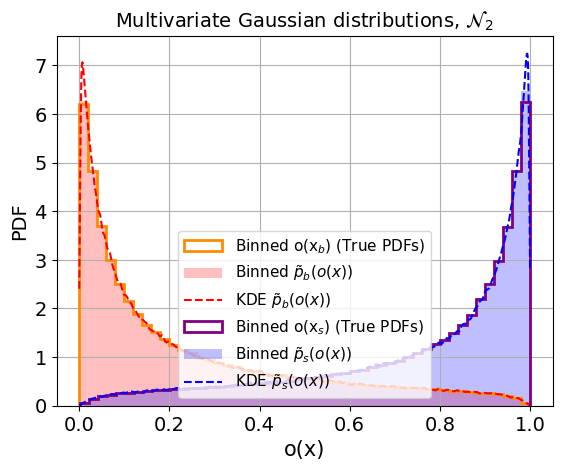

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf  1910.80722918
  1907.64492334  1896.46300239  1880.52278518  1853.42985445
  1812.89147974  1755.91162487  1672.87960941  1557.57812119
  1399.19784667  1185.90463779   909.12962941   560.05636255
   114.75363995  -438.17966846 -1108.86832119 -2037.7690152 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf  1866.56390648  1884.53847293  1892.77193415
  1890.17690926  1882.65872934  1867.56427415  1840.34212152
  1799.51363197  1740.5267511   1656.59

KDE Kernel:  epanechnikov
Background bandwidth:  0.003030951223220623
Signal bandwidth:  0.003030951223220623


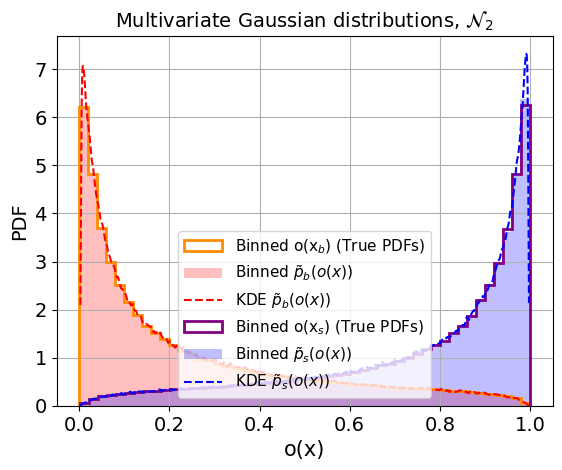

 Z MLL+KDE (1ML) 


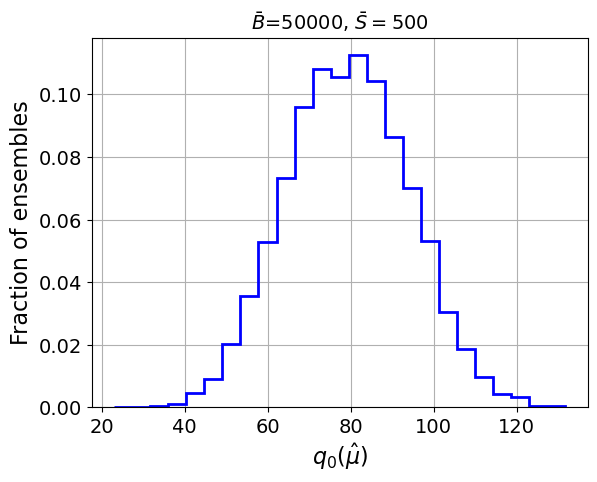

muhat mean_1ML:  0.03326067119537666
Z_KDE_1ML:  8.901197029028662
Z_KDE mu=0_1ML:  8.902132474320274

 Z MLL+KDE (10ML) 


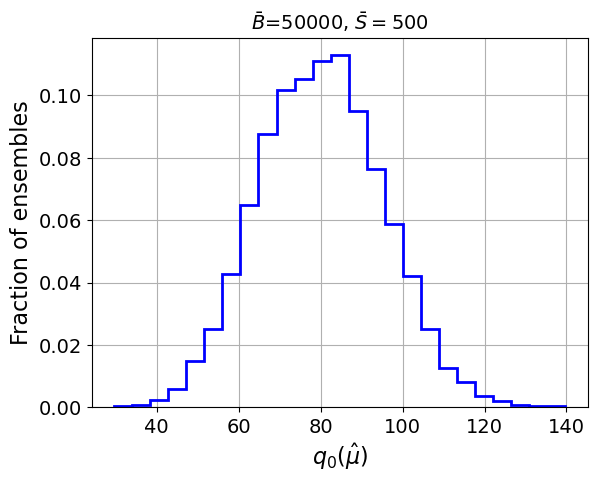

muhat mean:  0.039222346142147424
Z_KDE:  8.934711845006143
Z_KDE mu=0:  8.937894356957184

 ------------------------------------ 



In [32]:
dim=8

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6, signal_X_7, signal_X_8 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6, background_X_7, background_X_8 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))
dim7 = np.concatenate((background_X_7,signal_X_7))
dim8 = np.concatenate((background_X_8,signal_X_8))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['dim7'] = dim7.reshape(-1)
df['dim8'] = dim8.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6','dim7','dim8']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 9)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 9)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 9)
y_gauss_test :  (1000000, 1)



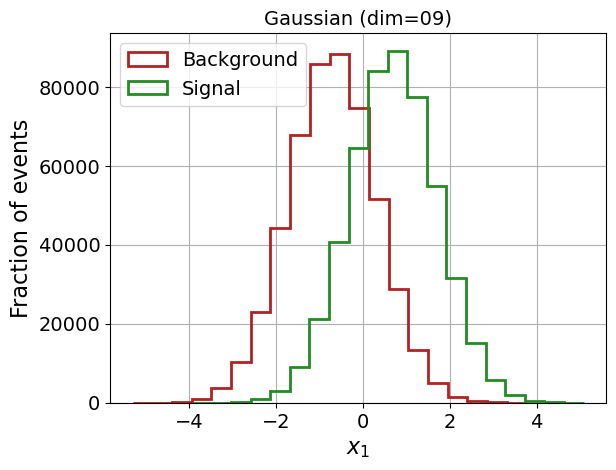

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.64955	validation_1-logloss:0.64989
[1]	validation_0-logloss:0.61324	validation_1-logloss:0.61377
[2]	validation_0-logloss:0.58268	validation_1-logloss:0.58342
[3]	validation_0-logloss:0.55674	validation_1-logloss:0.55767
[4]	validation_0-logloss:0.53459	validation_1-logloss:0.53571
[5]	validation_0-logloss:0.51554	validation_1-logloss:0.51681
[6]	validation_0-logloss:0.49909	validation_1-logloss:0.50051
[7]	validation_0-logloss:0.48486	validation_1-logloss:0.48643
[8]	validation_0-logloss:0.47248	validation_1-logloss:0.47417
[9]	validation_0-logloss:0.46167	validation_1-logloss:0.46350
[10]	validation_0-logloss:0.45220	validation_1-logloss:0.45415
[11]	validation_0-logloss:0.44392	validation_1-logloss:0.44601
[12]	validation_0-logloss:0.43666	validation_1-logloss:0.43885
[13]	validation_0-logloss:0.43029	validation_1-logloss:0.43259
[14]	validation_0-logloss:0.42468	validation_1-logloss:0.42709
[15]	validation_0-logloss:0.41974	validation_1-logloss:0.42223
[1

[130]	validation_0-logloss:0.37957	validation_1-logloss:0.38517
[131]	validation_0-logloss:0.37956	validation_1-logloss:0.38517
[132]	validation_0-logloss:0.37955	validation_1-logloss:0.38517
[133]	validation_0-logloss:0.37954	validation_1-logloss:0.38517
[134]	validation_0-logloss:0.37953	validation_1-logloss:0.38517
[135]	validation_0-logloss:0.37952	validation_1-logloss:0.38517
[136]	validation_0-logloss:0.37951	validation_1-logloss:0.38517
[137]	validation_0-logloss:0.37949	validation_1-logloss:0.38517
[138]	validation_0-logloss:0.37949	validation_1-logloss:0.38518
[139]	validation_0-logloss:0.37947	validation_1-logloss:0.38518
[140]	validation_0-logloss:0.37947	validation_1-logloss:0.38518
[141]	validation_0-logloss:0.37946	validation_1-logloss:0.38518
[142]	validation_0-logloss:0.37944	validation_1-logloss:0.38518
[143]	validation_0-logloss:0.37943	validation_1-logloss:0.38518
[144]	validation_0-logloss:0.37941	validation_1-logloss:0.38518
[145]	validation_0-logloss:0.37941	valid

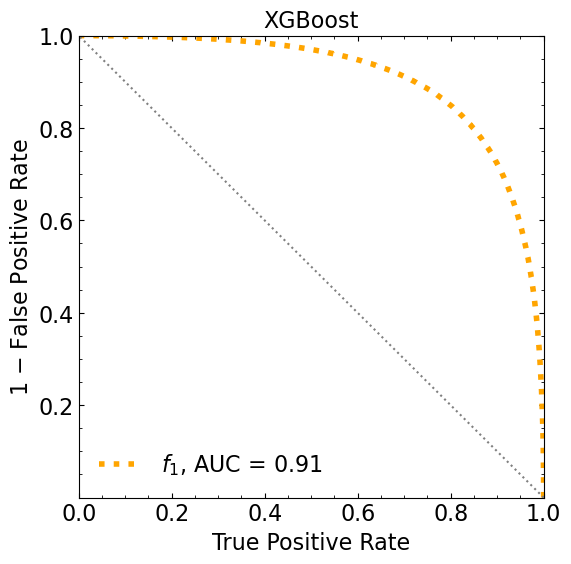

ML iteration 0
[0]	validation_0-logloss:0.64877	validation_1-logloss:0.64958
[1]	validation_0-logloss:0.61177	validation_1-logloss:0.61324


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58066	validation_1-logloss:0.58275
[3]	validation_0-logloss:0.55430	validation_1-logloss:0.55699
[4]	validation_0-logloss:0.53179	validation_1-logloss:0.53505
[5]	validation_0-logloss:0.51233	validation_1-logloss:0.51607
[6]	validation_0-logloss:0.49558	validation_1-logloss:0.49981
[7]	validation_0-logloss:0.48108	validation_1-logloss:0.48570
[8]	validation_0-logloss:0.46840	validation_1-logloss:0.47343
[9]	validation_0-logloss:0.45738	validation_1-logloss:0.46275
[10]	validation_0-logloss:0.44770	validation_1-logloss:0.45345
[11]	validation_0-logloss:0.43922	validation_1-logloss:0.44538
[12]	validation_0-logloss:0.43176	validation_1-logloss:0.43822
[13]	validation_0-logloss:0.42520	validation_1-logloss:0.43204
[14]	validation_0-logloss:0.41942	validation_1-logloss:0.42654
[15]	validation_0-logloss:0.41430	validation_1-logloss:0.42174
[16]	validation_0-logloss:0.40979	validation_1-logloss:0.41752
[17]	validation_0-logloss:0.40580	validation_1-logloss:0.41382


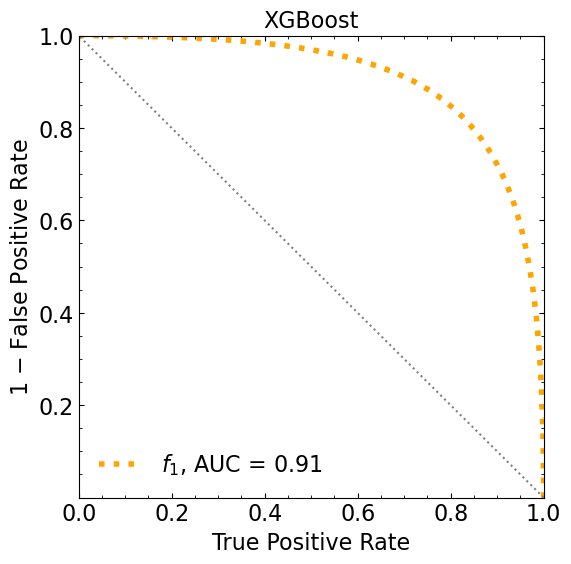

ML iteration  1
[0]	validation_0-logloss:0.64873	validation_1-logloss:0.64956
[1]	validation_0-logloss:0.61170	validation_1-logloss:0.61327


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58052	validation_1-logloss:0.58279
[3]	validation_0-logloss:0.55402	validation_1-logloss:0.55697
[4]	validation_0-logloss:0.53141	validation_1-logloss:0.53490
[5]	validation_0-logloss:0.51199	validation_1-logloss:0.51603
[6]	validation_0-logloss:0.49517	validation_1-logloss:0.49980
[7]	validation_0-logloss:0.48057	validation_1-logloss:0.48570
[8]	validation_0-logloss:0.46782	validation_1-logloss:0.47345
[9]	validation_0-logloss:0.45673	validation_1-logloss:0.46281
[10]	validation_0-logloss:0.44704	validation_1-logloss:0.45348
[11]	validation_0-logloss:0.43845	validation_1-logloss:0.44533
[12]	validation_0-logloss:0.43091	validation_1-logloss:0.43820
[13]	validation_0-logloss:0.42430	validation_1-logloss:0.43196
[14]	validation_0-logloss:0.41847	validation_1-logloss:0.42646
[15]	validation_0-logloss:0.41328	validation_1-logloss:0.42160
[16]	validation_0-logloss:0.40869	validation_1-logloss:0.41730
[17]	validation_0-logloss:0.40466	validation_1-logloss:0.41357


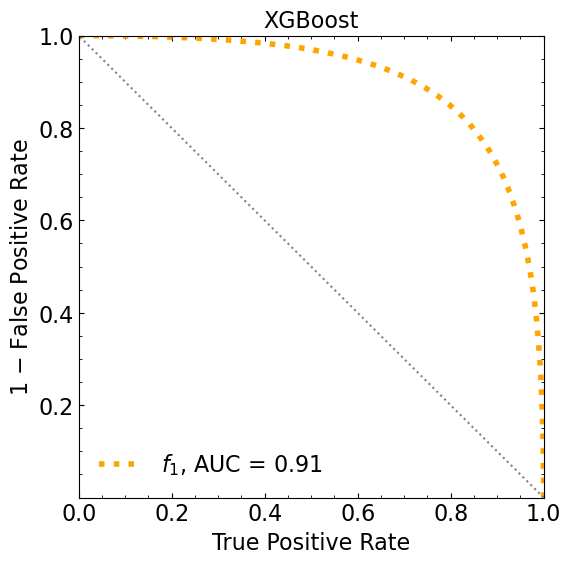

ML iteration  2
[0]	validation_0-logloss:0.64893	validation_1-logloss:0.64968
[1]	validation_0-logloss:0.61218	validation_1-logloss:0.61351


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58137	validation_1-logloss:0.58312
[3]	validation_0-logloss:0.55509	validation_1-logloss:0.55731
[4]	validation_0-logloss:0.53271	validation_1-logloss:0.53539
[5]	validation_0-logloss:0.51354	validation_1-logloss:0.51661
[6]	validation_0-logloss:0.49691	validation_1-logloss:0.50030
[7]	validation_0-logloss:0.48252	validation_1-logloss:0.48620
[8]	validation_0-logloss:0.46998	validation_1-logloss:0.47399
[9]	validation_0-logloss:0.45899	validation_1-logloss:0.46337
[10]	validation_0-logloss:0.44941	validation_1-logloss:0.45401
[11]	validation_0-logloss:0.44099	validation_1-logloss:0.44585
[12]	validation_0-logloss:0.43356	validation_1-logloss:0.43875
[13]	validation_0-logloss:0.42708	validation_1-logloss:0.43252
[14]	validation_0-logloss:0.42137	validation_1-logloss:0.42705
[15]	validation_0-logloss:0.41633	validation_1-logloss:0.42223
[16]	validation_0-logloss:0.41185	validation_1-logloss:0.41800
[17]	validation_0-logloss:0.40791	validation_1-logloss:0.41428


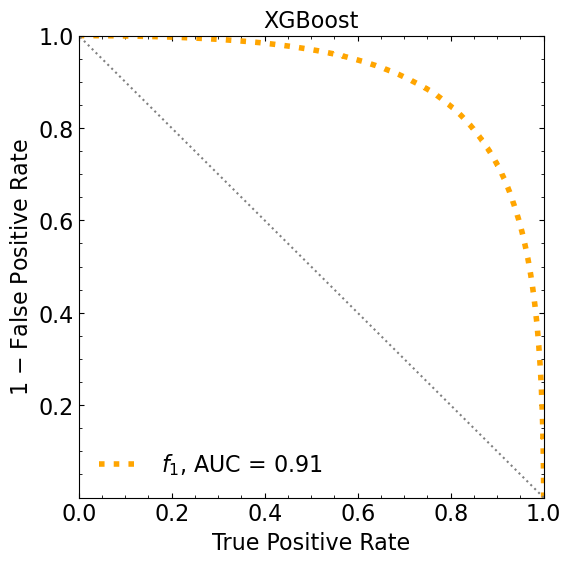

ML iteration  3
[0]	validation_0-logloss:0.64828	validation_1-logloss:0.64940
[1]	validation_0-logloss:0.61111	validation_1-logloss:0.61306


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.57985	validation_1-logloss:0.58261
[3]	validation_0-logloss:0.55324	validation_1-logloss:0.55681
[4]	validation_0-logloss:0.53041	validation_1-logloss:0.53464
[5]	validation_0-logloss:0.51083	validation_1-logloss:0.51570
[6]	validation_0-logloss:0.49399	validation_1-logloss:0.49946
[7]	validation_0-logloss:0.47929	validation_1-logloss:0.48531
[8]	validation_0-logloss:0.46654	validation_1-logloss:0.47306
[9]	validation_0-logloss:0.45542	validation_1-logloss:0.46241
[10]	validation_0-logloss:0.44559	validation_1-logloss:0.45305
[11]	validation_0-logloss:0.43701	validation_1-logloss:0.44494
[12]	validation_0-logloss:0.42951	validation_1-logloss:0.43786
[13]	validation_0-logloss:0.42287	validation_1-logloss:0.43162
[14]	validation_0-logloss:0.41705	validation_1-logloss:0.42618
[15]	validation_0-logloss:0.41187	validation_1-logloss:0.42139
[16]	validation_0-logloss:0.40726	validation_1-logloss:0.41714
[17]	validation_0-logloss:0.40325	validation_1-logloss:0.41344


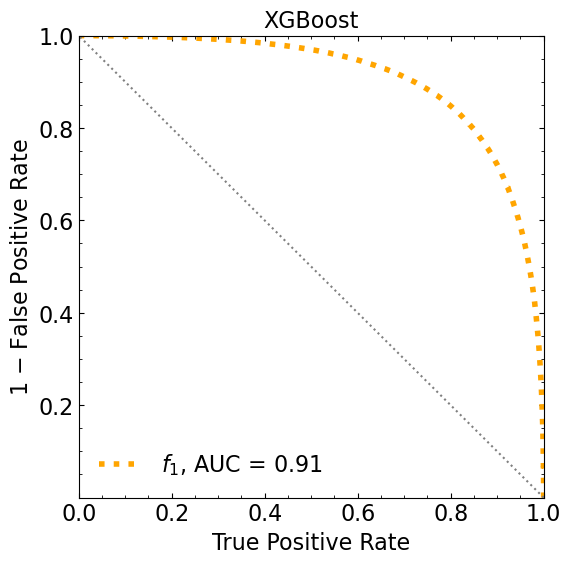

ML iteration  4
[0]	validation_0-logloss:0.64915	validation_1-logloss:0.64961
[1]	validation_0-logloss:0.61244	validation_1-logloss:0.61346


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58157	validation_1-logloss:0.58305
[3]	validation_0-logloss:0.55526	validation_1-logloss:0.55722
[4]	validation_0-logloss:0.53278	validation_1-logloss:0.53522
[5]	validation_0-logloss:0.51353	validation_1-logloss:0.51636
[6]	validation_0-logloss:0.49680	validation_1-logloss:0.50006
[7]	validation_0-logloss:0.48234	validation_1-logloss:0.48596
[8]	validation_0-logloss:0.46975	validation_1-logloss:0.47370
[9]	validation_0-logloss:0.45876	validation_1-logloss:0.46300
[10]	validation_0-logloss:0.44915	validation_1-logloss:0.45373
[11]	validation_0-logloss:0.44072	validation_1-logloss:0.44559
[12]	validation_0-logloss:0.43330	validation_1-logloss:0.43845
[13]	validation_0-logloss:0.42669	validation_1-logloss:0.43213
[14]	validation_0-logloss:0.42091	validation_1-logloss:0.42665
[15]	validation_0-logloss:0.41579	validation_1-logloss:0.42183
[16]	validation_0-logloss:0.41130	validation_1-logloss:0.41759
[17]	validation_0-logloss:0.40732	validation_1-logloss:0.41387


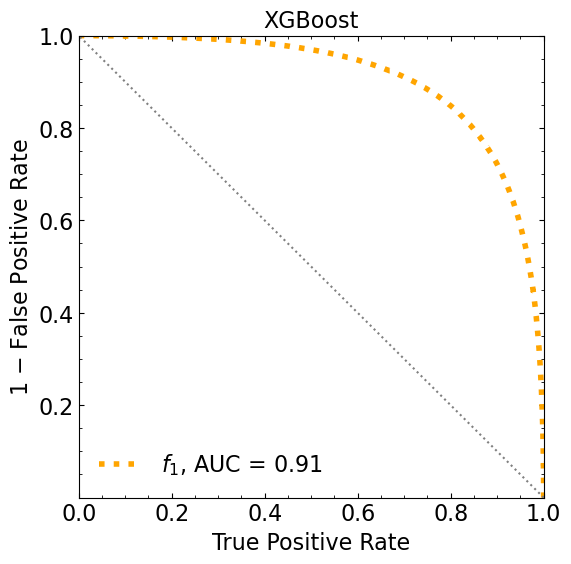

ML iteration  5
[0]	validation_0-logloss:0.64875	validation_1-logloss:0.64953
[1]	validation_0-logloss:0.61187	validation_1-logloss:0.61331


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58088	validation_1-logloss:0.58285
[3]	validation_0-logloss:0.55454	validation_1-logloss:0.55707
[4]	validation_0-logloss:0.53200	validation_1-logloss:0.53507
[5]	validation_0-logloss:0.51262	validation_1-logloss:0.51617
[6]	validation_0-logloss:0.49580	validation_1-logloss:0.49980
[7]	validation_0-logloss:0.48127	validation_1-logloss:0.48570
[8]	validation_0-logloss:0.46864	validation_1-logloss:0.47348
[9]	validation_0-logloss:0.45761	validation_1-logloss:0.46283
[10]	validation_0-logloss:0.44795	validation_1-logloss:0.45353
[11]	validation_0-logloss:0.43942	validation_1-logloss:0.44538
[12]	validation_0-logloss:0.43192	validation_1-logloss:0.43827
[13]	validation_0-logloss:0.42533	validation_1-logloss:0.43200
[14]	validation_0-logloss:0.41952	validation_1-logloss:0.42654
[15]	validation_0-logloss:0.41441	validation_1-logloss:0.42175
[16]	validation_0-logloss:0.40989	validation_1-logloss:0.41758
[17]	validation_0-logloss:0.40586	validation_1-logloss:0.41390


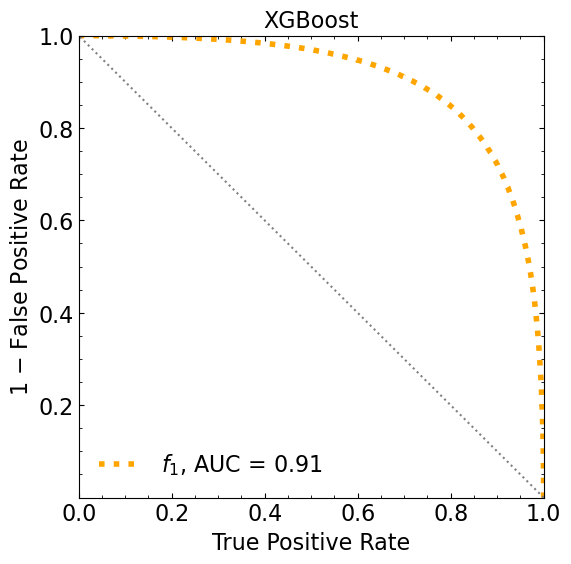

ML iteration  6
[0]	validation_0-logloss:0.64868	validation_1-logloss:0.64960
[1]	validation_0-logloss:0.61176	validation_1-logloss:0.61340


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58067	validation_1-logloss:0.58292
[3]	validation_0-logloss:0.55418	validation_1-logloss:0.55705
[4]	validation_0-logloss:0.53165	validation_1-logloss:0.53507
[5]	validation_0-logloss:0.51228	validation_1-logloss:0.51621
[6]	validation_0-logloss:0.49548	validation_1-logloss:0.49988
[7]	validation_0-logloss:0.48099	validation_1-logloss:0.48583
[8]	validation_0-logloss:0.46833	validation_1-logloss:0.47364
[9]	validation_0-logloss:0.45728	validation_1-logloss:0.46297
[10]	validation_0-logloss:0.44764	validation_1-logloss:0.45372
[11]	validation_0-logloss:0.43915	validation_1-logloss:0.44555
[12]	validation_0-logloss:0.43164	validation_1-logloss:0.43839
[13]	validation_0-logloss:0.42502	validation_1-logloss:0.43214
[14]	validation_0-logloss:0.41919	validation_1-logloss:0.42664
[15]	validation_0-logloss:0.41402	validation_1-logloss:0.42180
[16]	validation_0-logloss:0.40946	validation_1-logloss:0.41753
[17]	validation_0-logloss:0.40543	validation_1-logloss:0.41381


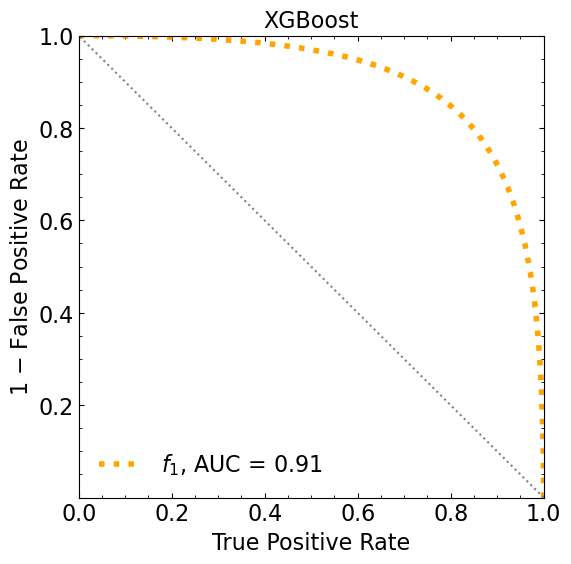

ML iteration  7
[0]	validation_0-logloss:0.64885	validation_1-logloss:0.64961


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.61188	validation_1-logloss:0.61339
[2]	validation_0-logloss:0.58088	validation_1-logloss:0.58295
[3]	validation_0-logloss:0.55450	validation_1-logloss:0.55706
[4]	validation_0-logloss:0.53189	validation_1-logloss:0.53498
[5]	validation_0-logloss:0.51246	validation_1-logloss:0.51611
[6]	validation_0-logloss:0.49568	validation_1-logloss:0.49986
[7]	validation_0-logloss:0.48110	validation_1-logloss:0.48573
[8]	validation_0-logloss:0.46842	validation_1-logloss:0.47351
[9]	validation_0-logloss:0.45729	validation_1-logloss:0.46277
[10]	validation_0-logloss:0.44759	validation_1-logloss:0.45347
[11]	validation_0-logloss:0.43908	validation_1-logloss:0.44534
[12]	validation_0-logloss:0.43161	validation_1-logloss:0.43825
[13]	validation_0-logloss:0.42504	validation_1-logloss:0.43203
[14]	validation_0-logloss:0.41924	validation_1-logloss:0.42656
[15]	validation_0-logloss:0.41409	validation_1-logloss:0.42180
[16]	validation_0-logloss:0.40953	validation_1-logloss:0.41753
[

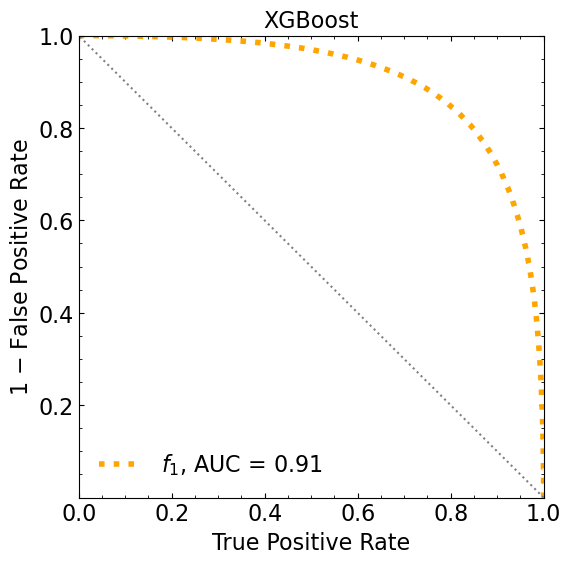

ML iteration  8
[0]	validation_0-logloss:0.64892	validation_1-logloss:0.64972
[1]	validation_0-logloss:0.61205	validation_1-logloss:0.61353


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58106	validation_1-logloss:0.58311
[3]	validation_0-logloss:0.55473	validation_1-logloss:0.55733
[4]	validation_0-logloss:0.53217	validation_1-logloss:0.53526
[5]	validation_0-logloss:0.51280	validation_1-logloss:0.51640
[6]	validation_0-logloss:0.49605	validation_1-logloss:0.50005
[7]	validation_0-logloss:0.48151	validation_1-logloss:0.48594
[8]	validation_0-logloss:0.46888	validation_1-logloss:0.47367
[9]	validation_0-logloss:0.45780	validation_1-logloss:0.46294
[10]	validation_0-logloss:0.44807	validation_1-logloss:0.45365
[11]	validation_0-logloss:0.43962	validation_1-logloss:0.44554
[12]	validation_0-logloss:0.43214	validation_1-logloss:0.43842
[13]	validation_0-logloss:0.42559	validation_1-logloss:0.43220
[14]	validation_0-logloss:0.41981	validation_1-logloss:0.42667
[15]	validation_0-logloss:0.41468	validation_1-logloss:0.42185
[16]	validation_0-logloss:0.41016	validation_1-logloss:0.41763
[17]	validation_0-logloss:0.40617	validation_1-logloss:0.41388


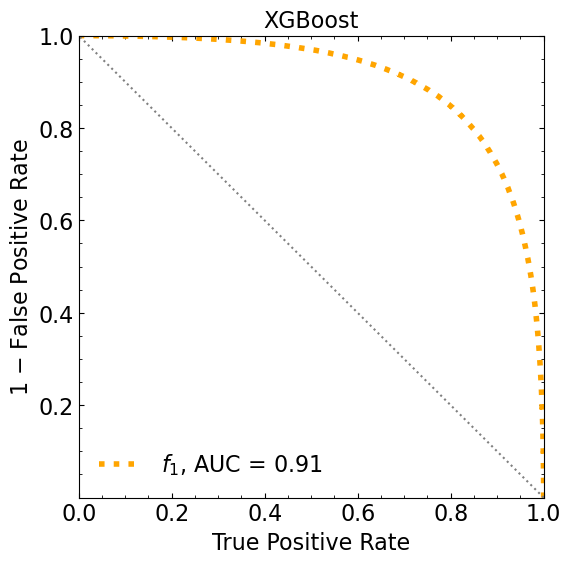

ML iteration  9
[0]	validation_0-logloss:0.64856	validation_1-logloss:0.64950
[1]	validation_0-logloss:0.61150	validation_1-logloss:0.61321


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58041	validation_1-logloss:0.58277
[3]	validation_0-logloss:0.55389	validation_1-logloss:0.55688
[4]	validation_0-logloss:0.53131	validation_1-logloss:0.53488
[5]	validation_0-logloss:0.51178	validation_1-logloss:0.51596
[6]	validation_0-logloss:0.49494	validation_1-logloss:0.49961
[7]	validation_0-logloss:0.48035	validation_1-logloss:0.48548
[8]	validation_0-logloss:0.46760	validation_1-logloss:0.47320
[9]	validation_0-logloss:0.45648	validation_1-logloss:0.46257
[10]	validation_0-logloss:0.44671	validation_1-logloss:0.45323
[11]	validation_0-logloss:0.43819	validation_1-logloss:0.44511
[12]	validation_0-logloss:0.43069	validation_1-logloss:0.43801
[13]	validation_0-logloss:0.42405	validation_1-logloss:0.43175
[14]	validation_0-logloss:0.41826	validation_1-logloss:0.42632
[15]	validation_0-logloss:0.41314	validation_1-logloss:0.42154
[16]	validation_0-logloss:0.40857	validation_1-logloss:0.41729
[17]	validation_0-logloss:0.40453	validation_1-logloss:0.41357


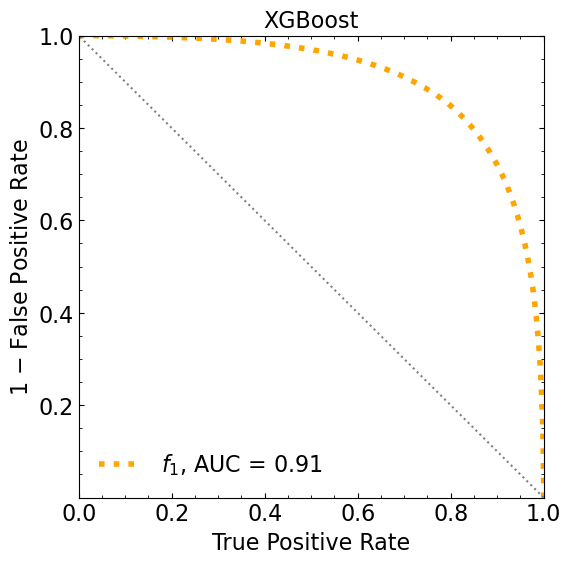

Classification score (1 ML):


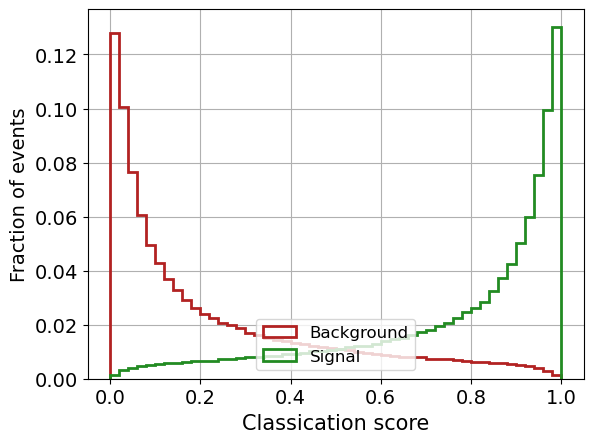

Classification score (10 ML):


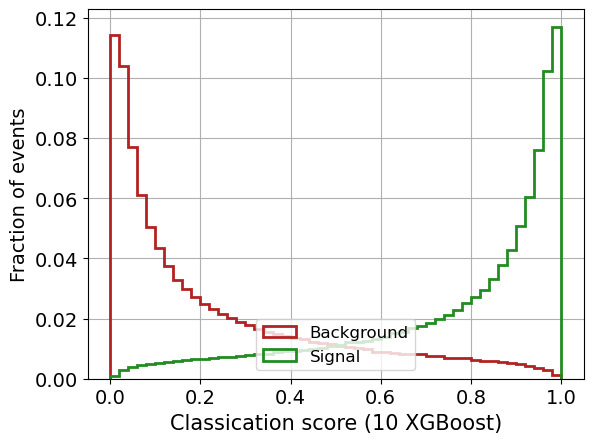

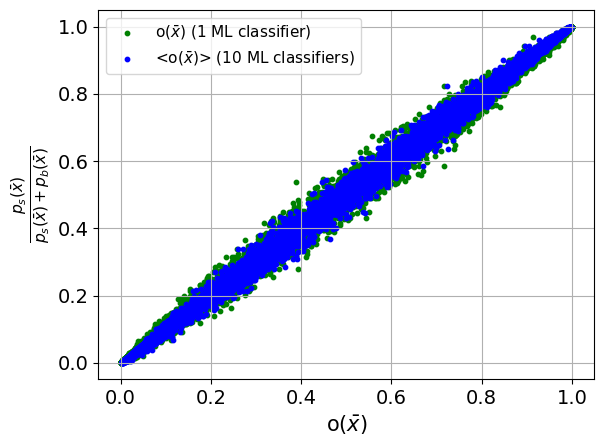


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  7.00749259693365
Z_XG 25 bins_1ML:  8.035486212877306
Z_XG 50 bins_1ML:  8.448753975050895
Z_XG 100 bins_1ML:  8.711911794028742

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  5.05248104604866
Z_XG 25 bins_eq_1ML:  6.122701659195182
Z_XG 50 bins_eq_1ML:  6.824331647120481
Z_XG 100 bins_eq_1ML:  7.404853238845546

 BL lineal bins, 10 ML
Z_XG 10 bins:  7.068466423233838
Z_XG 25 bins:  8.103598687830237
Z_XG 50 bins:  8.534830287104576
Z_XG 100 bins:  8.759383758962032

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  5.070584010898985
Z_XG 25 bins_eq:  6.154164161688546
Z_XG 50 bins_eq:  6.85944147652349
Z_XG 100 bins_eq:  7.449046911817511

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSSIANS):

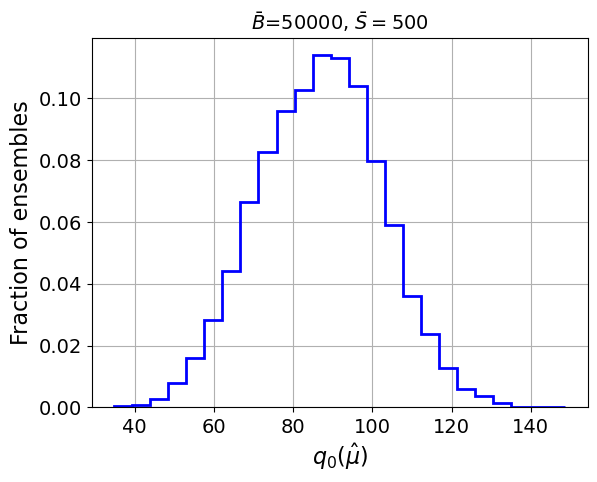

muhat mean:  0.027831288654567576
Z_gaussian:  9.332468770069786
Z_gaussian_mu0:  9.332884952180178

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf  1953.26013659
  1948.90941661  1938.40317564  1922.27129982  1897.84751002
  1859.3710019   1802.89761966  1720.0646917   1599.99295249
  1432.65126662  1210.45063958   919.89930387   552.94127533
   101.60770662  -453.0352881  -1127.96450196 -2046.7383818 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights


KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.003030951223220623


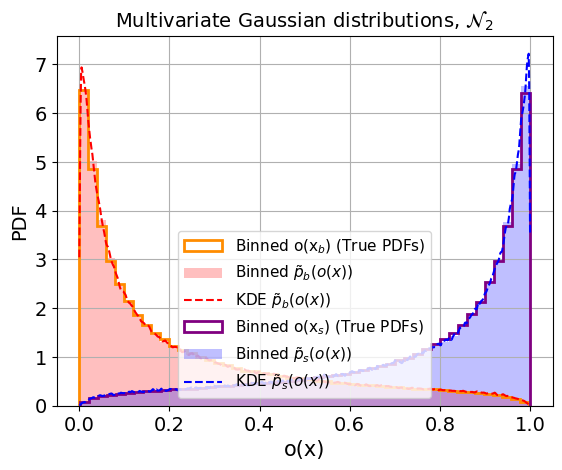

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf  1930.33788212  1939.31532874
  1940.10337268  1934.87066597  1921.39549896  1897.44125678
  1858.66977161  1799.45833239  1711.46599069  1587.57319199
  1420.75949459  1197.55961885   907.01864386   543.03105678
    95.05611747  -455.54056003 -1126.50681254 -2045.36477871]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf  1953.36059854
  1953.46104115  1947.00656535  1933.44367871  1909.68929682
  1869.93409642  1811.04295201  1723.62

KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.004386370005779536


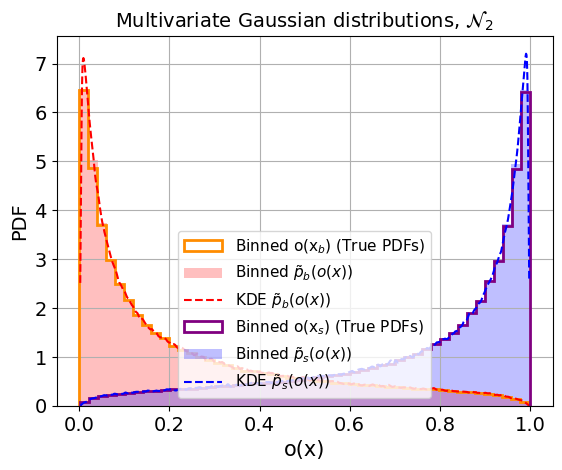

 Z MLL+KDE (1ML) 


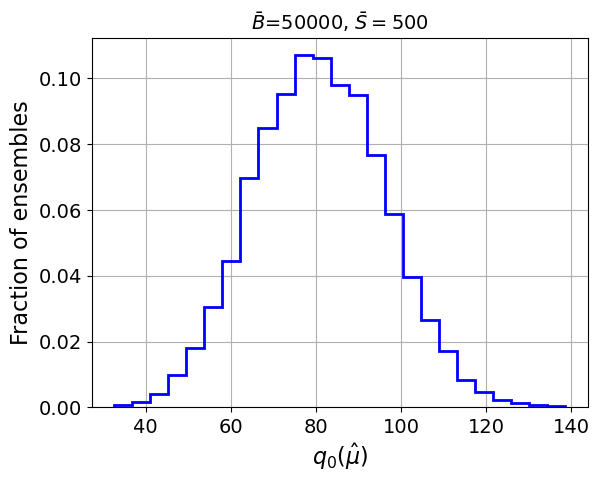

muhat mean_1ML:  0.032895670688431515
Z_KDE_1ML:  8.980607829529596
Z_KDE mu=0_1ML:  8.980640486478533

 Z MLL+KDE (10ML) 


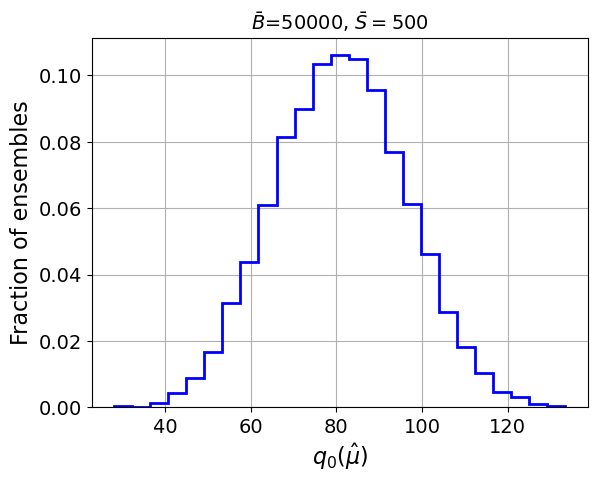

muhat mean:  0.030888167900233198
Z_KDE:  8.995454885223063
Z_KDE mu=0:  8.995744017933482

 ------------------------------------ 



In [33]:
dim=9

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6, signal_X_7, signal_X_8, signal_X_9 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6, background_X_7, background_X_8, background_X_9 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))
dim7 = np.concatenate((background_X_7,signal_X_7))
dim8 = np.concatenate((background_X_8,signal_X_8))
dim9 = np.concatenate((background_X_9,signal_X_9))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['dim7'] = dim7.reshape(-1)
df['dim8'] = dim8.reshape(-1)
df['dim9'] = dim9.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6','dim7','dim8','dim9']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')


X_gauss_train :  (1000000, 10)
y_gauss_train :  (1000000, 1)
X_gauss_val :  (1000000, 10)
y_gauss_val :  (1000000, 1)
X_gauss_test :  (1000000, 10)
y_gauss_test :  (1000000, 1)



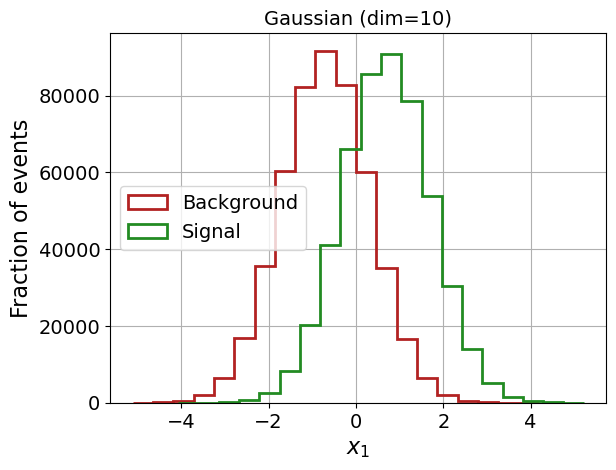

/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[0]	validation_0-logloss:0.64976	validation_1-logloss:0.64998
[1]	validation_0-logloss:0.61350	validation_1-logloss:0.61388
[2]	validation_0-logloss:0.58303	validation_1-logloss:0.58351
[3]	validation_0-logloss:0.55706	validation_1-logloss:0.55764
[4]	validation_0-logloss:0.53491	validation_1-logloss:0.53557
[5]	validation_0-logloss:0.51585	validation_1-logloss:0.51659
[6]	validation_0-logloss:0.49939	validation_1-logloss:0.50018
[7]	validation_0-logloss:0.48512	validation_1-logloss:0.48598
[8]	validation_0-logloss:0.47269	validation_1-logloss:0.47362
[9]	validation_0-logloss:0.46183	validation_1-logloss:0.46283
[10]	validation_0-logloss:0.45232	validation_1-logloss:0.45338
[11]	validation_0-logloss:0.44400	validation_1-logloss:0.44510
[12]	validation_0-logloss:0.43669	validation_1-logloss:0.43784
[13]	validation_0-logloss:0.43027	validation_1-logloss:0.43147
[14]	validation_0-logloss:0.42460	validation_1-logloss:0.42586
[15]	validation_0-logloss:0.41961	validation_1-logloss:0.42091
[1

[130]	validation_0-logloss:0.37868	validation_1-logloss:0.38258
[131]	validation_0-logloss:0.37866	validation_1-logloss:0.38258
[132]	validation_0-logloss:0.37863	validation_1-logloss:0.38258
[133]	validation_0-logloss:0.37862	validation_1-logloss:0.38258
[134]	validation_0-logloss:0.37860	validation_1-logloss:0.38258
[135]	validation_0-logloss:0.37859	validation_1-logloss:0.38258
[136]	validation_0-logloss:0.37858	validation_1-logloss:0.38258
[137]	validation_0-logloss:0.37857	validation_1-logloss:0.38258
[138]	validation_0-logloss:0.37855	validation_1-logloss:0.38258
[139]	validation_0-logloss:0.37853	validation_1-logloss:0.38258
[140]	validation_0-logloss:0.37852	validation_1-logloss:0.38259
[141]	validation_0-logloss:0.37850	validation_1-logloss:0.38258
[142]	validation_0-logloss:0.37848	validation_1-logloss:0.38258
[143]	validation_0-logloss:0.37847	validation_1-logloss:0.38258
[144]	validation_0-logloss:0.37845	validation_1-logloss:0.38258
[145]	validation_0-logloss:0.37843	valid

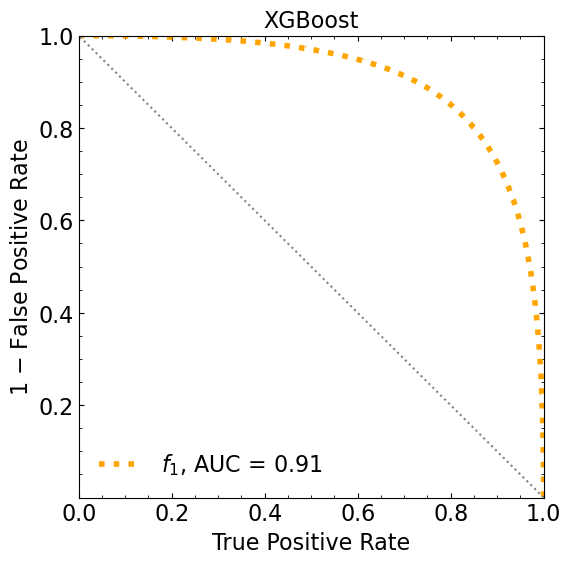

ML iteration 0
[0]	validation_0-logloss:0.64877	validation_1-logloss:0.64964
[1]	validation_0-logloss:0.61194	validation_1-logloss:0.61346


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58075	validation_1-logloss:0.58287
[3]	validation_0-logloss:0.55441	validation_1-logloss:0.55699
[4]	validation_0-logloss:0.53183	validation_1-logloss:0.53493
[5]	validation_0-logloss:0.51236	validation_1-logloss:0.51590
[6]	validation_0-logloss:0.49557	validation_1-logloss:0.49951
[7]	validation_0-logloss:0.48098	validation_1-logloss:0.48530
[8]	validation_0-logloss:0.46826	validation_1-logloss:0.47295
[9]	validation_0-logloss:0.45718	validation_1-logloss:0.46221
[10]	validation_0-logloss:0.44746	validation_1-logloss:0.45279
[11]	validation_0-logloss:0.43892	validation_1-logloss:0.44455
[12]	validation_0-logloss:0.43143	validation_1-logloss:0.43738
[13]	validation_0-logloss:0.42479	validation_1-logloss:0.43105
[14]	validation_0-logloss:0.41897	validation_1-logloss:0.42548
[15]	validation_0-logloss:0.41380	validation_1-logloss:0.42059
[16]	validation_0-logloss:0.40924	validation_1-logloss:0.41627
[17]	validation_0-logloss:0.40520	validation_1-logloss:0.41246


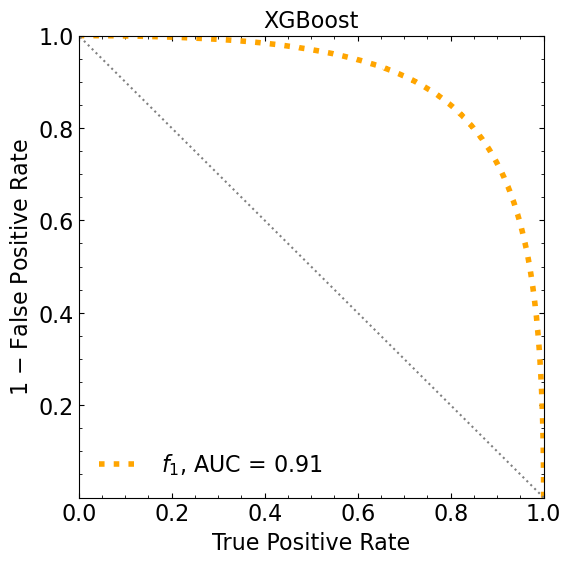

ML iteration  1
[0]	validation_0-logloss:0.64857	validation_1-logloss:0.64954
[1]	validation_0-logloss:0.61147	validation_1-logloss:0.61314


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58024	validation_1-logloss:0.58251
[3]	validation_0-logloss:0.55368	validation_1-logloss:0.55663
[4]	validation_0-logloss:0.53092	validation_1-logloss:0.53445
[5]	validation_0-logloss:0.51129	validation_1-logloss:0.51531
[6]	validation_0-logloss:0.49436	validation_1-logloss:0.49887
[7]	validation_0-logloss:0.47966	validation_1-logloss:0.48464
[8]	validation_0-logloss:0.46684	validation_1-logloss:0.47222
[9]	validation_0-logloss:0.45558	validation_1-logloss:0.46143
[10]	validation_0-logloss:0.44571	validation_1-logloss:0.45205
[11]	validation_0-logloss:0.43703	validation_1-logloss:0.44379
[12]	validation_0-logloss:0.42943	validation_1-logloss:0.43657
[13]	validation_0-logloss:0.42274	validation_1-logloss:0.43026
[14]	validation_0-logloss:0.41684	validation_1-logloss:0.42469
[15]	validation_0-logloss:0.41165	validation_1-logloss:0.41981
[16]	validation_0-logloss:0.40697	validation_1-logloss:0.41549
[17]	validation_0-logloss:0.40285	validation_1-logloss:0.41170


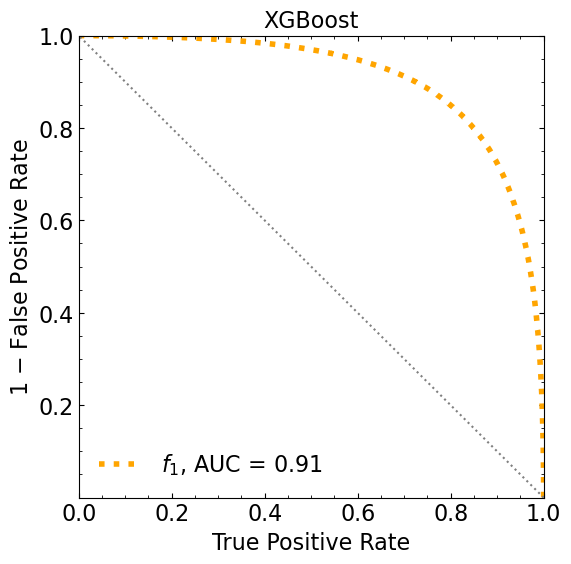

ML iteration  2
[0]	validation_0-logloss:0.64894	validation_1-logloss:0.64968


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.61208	validation_1-logloss:0.61351
[2]	validation_0-logloss:0.58112	validation_1-logloss:0.58304
[3]	validation_0-logloss:0.55481	validation_1-logloss:0.55710
[4]	validation_0-logloss:0.53229	validation_1-logloss:0.53506
[5]	validation_0-logloss:0.51286	validation_1-logloss:0.51605
[6]	validation_0-logloss:0.49606	validation_1-logloss:0.49960
[7]	validation_0-logloss:0.48141	validation_1-logloss:0.48537
[8]	validation_0-logloss:0.46863	validation_1-logloss:0.47294
[9]	validation_0-logloss:0.45750	validation_1-logloss:0.46218
[10]	validation_0-logloss:0.44777	validation_1-logloss:0.45280
[11]	validation_0-logloss:0.43923	validation_1-logloss:0.44455
[12]	validation_0-logloss:0.43172	validation_1-logloss:0.43731
[13]	validation_0-logloss:0.42505	validation_1-logloss:0.43095
[14]	validation_0-logloss:0.41918	validation_1-logloss:0.42538
[15]	validation_0-logloss:0.41404	validation_1-logloss:0.42050
[16]	validation_0-logloss:0.40944	validation_1-logloss:0.41613
[

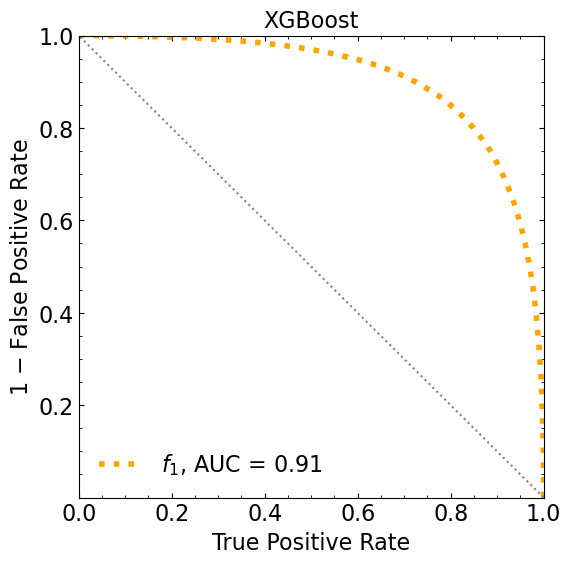

ML iteration  3
[0]	validation_0-logloss:0.64883	validation_1-logloss:0.64960


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.61217	validation_1-logloss:0.61349
[2]	validation_0-logloss:0.58113	validation_1-logloss:0.58305
[3]	validation_0-logloss:0.55477	validation_1-logloss:0.55705
[4]	validation_0-logloss:0.53223	validation_1-logloss:0.53488
[5]	validation_0-logloss:0.51284	validation_1-logloss:0.51589
[6]	validation_0-logloss:0.49599	validation_1-logloss:0.49945
[7]	validation_0-logloss:0.48140	validation_1-logloss:0.48524
[8]	validation_0-logloss:0.46868	validation_1-logloss:0.47292
[9]	validation_0-logloss:0.45754	validation_1-logloss:0.46207
[10]	validation_0-logloss:0.44779	validation_1-logloss:0.45266
[11]	validation_0-logloss:0.43919	validation_1-logloss:0.44439
[12]	validation_0-logloss:0.43165	validation_1-logloss:0.43715
[13]	validation_0-logloss:0.42501	validation_1-logloss:0.43082
[14]	validation_0-logloss:0.41915	validation_1-logloss:0.42526
[15]	validation_0-logloss:0.41399	validation_1-logloss:0.42038
[16]	validation_0-logloss:0.40943	validation_1-logloss:0.41606
[

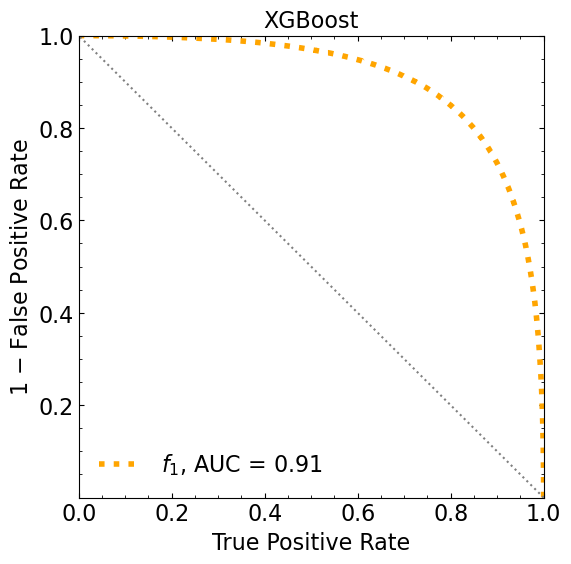

ML iteration  4
[0]	validation_0-logloss:0.64868	validation_1-logloss:0.64962
[1]	validation_0-logloss:0.61162	validation_1-logloss:0.61339


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58037	validation_1-logloss:0.58283
[3]	validation_0-logloss:0.55393	validation_1-logloss:0.55687
[4]	validation_0-logloss:0.53130	validation_1-logloss:0.53475
[5]	validation_0-logloss:0.51175	validation_1-logloss:0.51576
[6]	validation_0-logloss:0.49486	validation_1-logloss:0.49936
[7]	validation_0-logloss:0.48024	validation_1-logloss:0.48514
[8]	validation_0-logloss:0.46746	validation_1-logloss:0.47279
[9]	validation_0-logloss:0.45630	validation_1-logloss:0.46200
[10]	validation_0-logloss:0.44653	validation_1-logloss:0.45259
[11]	validation_0-logloss:0.43795	validation_1-logloss:0.44434
[12]	validation_0-logloss:0.43043	validation_1-logloss:0.43709
[13]	validation_0-logloss:0.42379	validation_1-logloss:0.43077
[14]	validation_0-logloss:0.41794	validation_1-logloss:0.42523
[15]	validation_0-logloss:0.41275	validation_1-logloss:0.42032
[16]	validation_0-logloss:0.40814	validation_1-logloss:0.41603
[17]	validation_0-logloss:0.40407	validation_1-logloss:0.41224


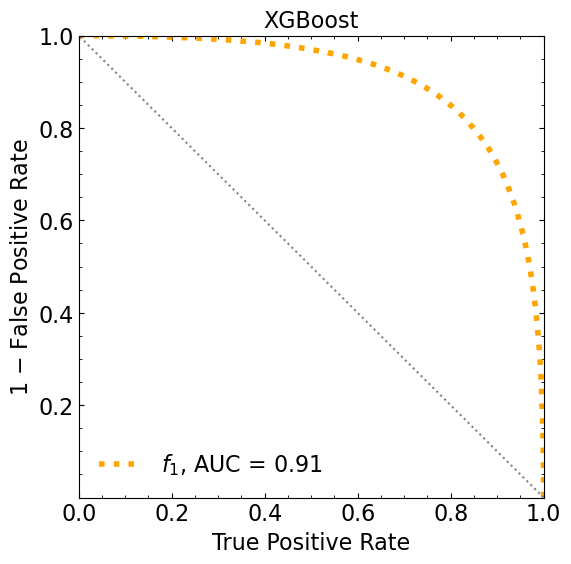

ML iteration  5
[0]	validation_0-logloss:0.64907	validation_1-logloss:0.64958
[1]	validation_0-logloss:0.61225	validation_1-logloss:0.61321


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58141	validation_1-logloss:0.58272
[3]	validation_0-logloss:0.55507	validation_1-logloss:0.55674
[4]	validation_0-logloss:0.53256	validation_1-logloss:0.53461
[5]	validation_0-logloss:0.51314	validation_1-logloss:0.51561
[6]	validation_0-logloss:0.49631	validation_1-logloss:0.49911
[7]	validation_0-logloss:0.48169	validation_1-logloss:0.48485
[8]	validation_0-logloss:0.46893	validation_1-logloss:0.47247
[9]	validation_0-logloss:0.45781	validation_1-logloss:0.46171
[10]	validation_0-logloss:0.44813	validation_1-logloss:0.45234
[11]	validation_0-logloss:0.43954	validation_1-logloss:0.44408
[12]	validation_0-logloss:0.43200	validation_1-logloss:0.43687
[13]	validation_0-logloss:0.42533	validation_1-logloss:0.43053
[14]	validation_0-logloss:0.41949	validation_1-logloss:0.42499
[15]	validation_0-logloss:0.41427	validation_1-logloss:0.42005
[16]	validation_0-logloss:0.40967	validation_1-logloss:0.41574
[17]	validation_0-logloss:0.40561	validation_1-logloss:0.41193


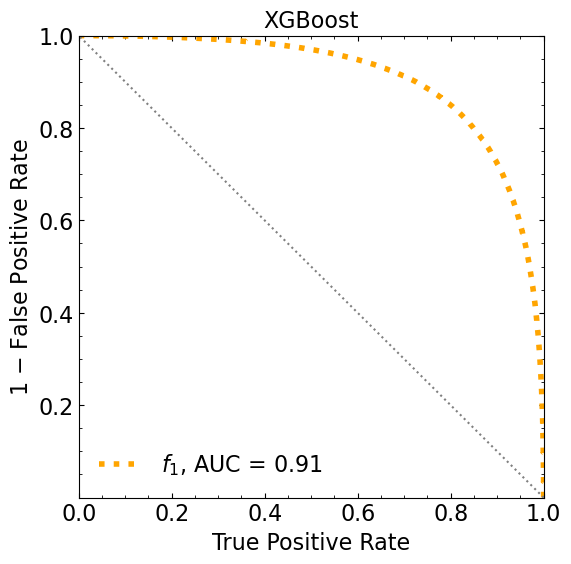

ML iteration  6
[0]	validation_0-logloss:0.64893	validation_1-logloss:0.64959


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[1]	validation_0-logloss:0.61206	validation_1-logloss:0.61334
[2]	validation_0-logloss:0.58089	validation_1-logloss:0.58278
[3]	validation_0-logloss:0.55446	validation_1-logloss:0.55681
[4]	validation_0-logloss:0.53179	validation_1-logloss:0.53466
[5]	validation_0-logloss:0.51233	validation_1-logloss:0.51566
[6]	validation_0-logloss:0.49549	validation_1-logloss:0.49922
[7]	validation_0-logloss:0.48089	validation_1-logloss:0.48499
[8]	validation_0-logloss:0.46818	validation_1-logloss:0.47263
[9]	validation_0-logloss:0.45709	validation_1-logloss:0.46189
[10]	validation_0-logloss:0.44735	validation_1-logloss:0.45248
[11]	validation_0-logloss:0.43879	validation_1-logloss:0.44430
[12]	validation_0-logloss:0.43130	validation_1-logloss:0.43707
[13]	validation_0-logloss:0.42468	validation_1-logloss:0.43076
[14]	validation_0-logloss:0.41887	validation_1-logloss:0.42522
[15]	validation_0-logloss:0.41373	validation_1-logloss:0.42036
[16]	validation_0-logloss:0.40915	validation_1-logloss:0.41603
[

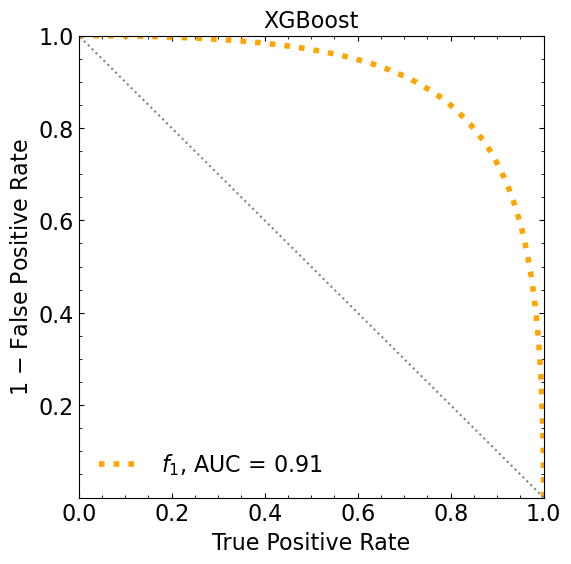

ML iteration  7
[0]	validation_0-logloss:0.64886	validation_1-logloss:0.64958
[1]	validation_0-logloss:0.61215	validation_1-logloss:0.61337


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58122	validation_1-logloss:0.58289
[3]	validation_0-logloss:0.55493	validation_1-logloss:0.55700
[4]	validation_0-logloss:0.53246	validation_1-logloss:0.53495
[5]	validation_0-logloss:0.51301	validation_1-logloss:0.51590
[6]	validation_0-logloss:0.49617	validation_1-logloss:0.49943
[7]	validation_0-logloss:0.48165	validation_1-logloss:0.48521
[8]	validation_0-logloss:0.46901	validation_1-logloss:0.47284
[9]	validation_0-logloss:0.45797	validation_1-logloss:0.46213
[10]	validation_0-logloss:0.44825	validation_1-logloss:0.45277
[11]	validation_0-logloss:0.43974	validation_1-logloss:0.44454
[12]	validation_0-logloss:0.43224	validation_1-logloss:0.43731
[13]	validation_0-logloss:0.42567	validation_1-logloss:0.43100
[14]	validation_0-logloss:0.41983	validation_1-logloss:0.42540
[15]	validation_0-logloss:0.41471	validation_1-logloss:0.42047
[16]	validation_0-logloss:0.41014	validation_1-logloss:0.41612
[17]	validation_0-logloss:0.40609	validation_1-logloss:0.41236


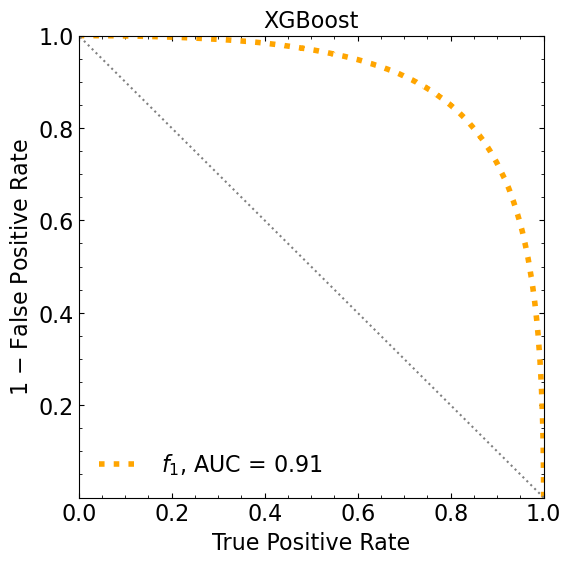

ML iteration  8
[0]	validation_0-logloss:0.64892	validation_1-logloss:0.64962
[1]	validation_0-logloss:0.61202	validation_1-logloss:0.61337


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58099	validation_1-logloss:0.58286
[3]	validation_0-logloss:0.55445	validation_1-logloss:0.55690
[4]	validation_0-logloss:0.53183	validation_1-logloss:0.53478
[5]	validation_0-logloss:0.51243	validation_1-logloss:0.51576
[6]	validation_0-logloss:0.49563	validation_1-logloss:0.49937
[7]	validation_0-logloss:0.48095	validation_1-logloss:0.48505
[8]	validation_0-logloss:0.46820	validation_1-logloss:0.47265
[9]	validation_0-logloss:0.45710	validation_1-logloss:0.46190
[10]	validation_0-logloss:0.44738	validation_1-logloss:0.45249
[11]	validation_0-logloss:0.43880	validation_1-logloss:0.44426
[12]	validation_0-logloss:0.43127	validation_1-logloss:0.43705
[13]	validation_0-logloss:0.42463	validation_1-logloss:0.43074
[14]	validation_0-logloss:0.41876	validation_1-logloss:0.42517
[15]	validation_0-logloss:0.41361	validation_1-logloss:0.42029
[16]	validation_0-logloss:0.40903	validation_1-logloss:0.41596
[17]	validation_0-logloss:0.40498	validation_1-logloss:0.41220


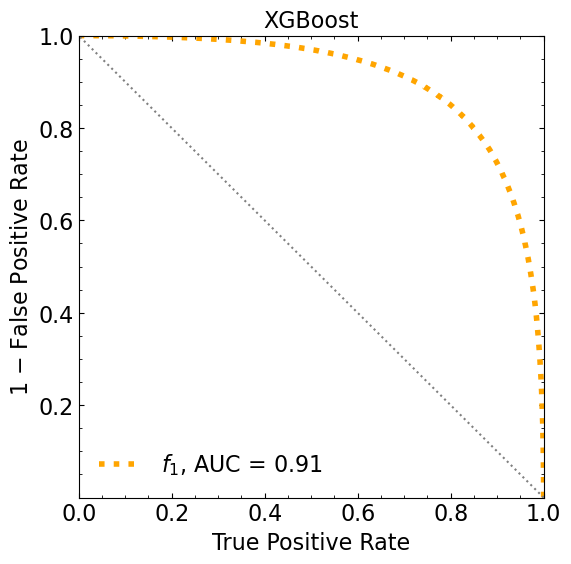

ML iteration  9
[0]	validation_0-logloss:0.64896	validation_1-logloss:0.64967
[1]	validation_0-logloss:0.61217	validation_1-logloss:0.61341


/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/xgboost/sklearn.py:835: UserWarning: `early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.
  warnings.warn(


[2]	validation_0-logloss:0.58127	validation_1-logloss:0.58302
[3]	validation_0-logloss:0.55495	validation_1-logloss:0.55712
[4]	validation_0-logloss:0.53244	validation_1-logloss:0.53508
[5]	validation_0-logloss:0.51301	validation_1-logloss:0.51601
[6]	validation_0-logloss:0.49619	validation_1-logloss:0.49959
[7]	validation_0-logloss:0.48164	validation_1-logloss:0.48537
[8]	validation_0-logloss:0.46894	validation_1-logloss:0.47302
[9]	validation_0-logloss:0.45791	validation_1-logloss:0.46228
[10]	validation_0-logloss:0.44821	validation_1-logloss:0.45288
[11]	validation_0-logloss:0.43970	validation_1-logloss:0.44463
[12]	validation_0-logloss:0.43225	validation_1-logloss:0.43742
[13]	validation_0-logloss:0.42567	validation_1-logloss:0.43113
[14]	validation_0-logloss:0.41987	validation_1-logloss:0.42559
[15]	validation_0-logloss:0.41474	validation_1-logloss:0.42074
[16]	validation_0-logloss:0.41022	validation_1-logloss:0.41644
[17]	validation_0-logloss:0.40624	validation_1-logloss:0.41265


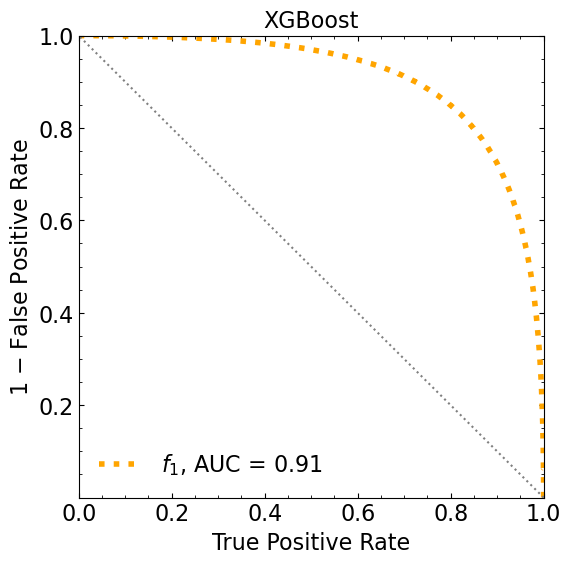

Classification score (1 ML):


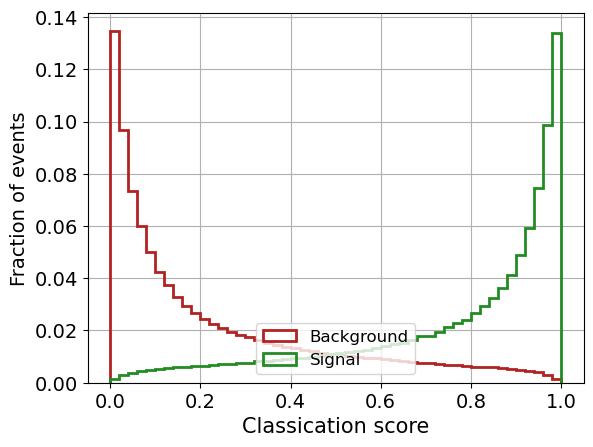

Classification score (10 ML):


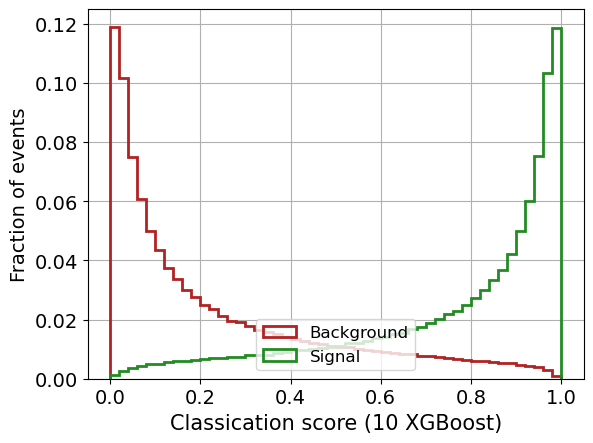

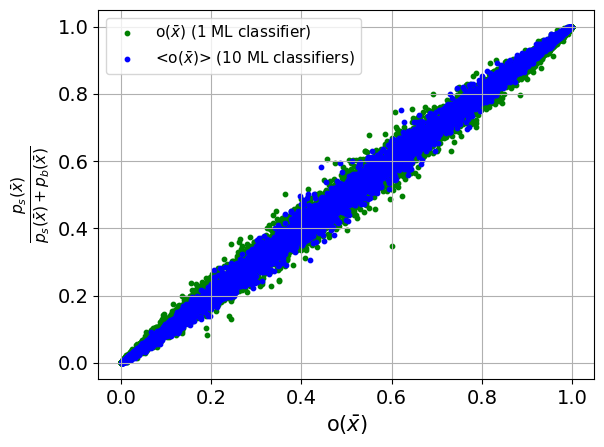


 ----------------------------------------- 

B_expected:  50000
S_expected:  500
S/$\sqrt{B}$:  2.23606797749979
 BINNED CLASSIFIER OUTPUT
  BL lineal bins, 1 ML
Z_XG 10 bins_1ML:  7.034491922016256
Z_XG 25 bins_1ML:  8.02458430231729
Z_XG 50 bins_1ML:  8.538091180134105
Z_XG 100 bins_1ML:  8.810749904453537

 BL non-lineal bins, 1 ML
Z_XG 10 bins_eq_1ML:  5.114874704920877
Z_XG 25 bins_eq_1ML:  6.1975549903937415
Z_XG 50 bins_eq_1ML:  6.9235356770287675
Z_XG 100 bins_eq_1ML:  7.522832494515497

 BL lineal bins, 10 ML
Z_XG 10 bins:  7.106459562777205
Z_XG 25 bins:  8.109500432503983
Z_XG 50 bins:  8.631014610896075
Z_XG 100 bins:  8.88016465407623

 BL non-lineal bins, 10 ML
Z_XG 10 bins_eq:  5.115129089588995
Z_XG 25 bins_eq:  6.200907796660388
Z_XG 50 bins_eq:  6.9352256070419855
Z_XG 100 bins_eq:  7.522986440530359

 ----------------------------------------- 


 If  20200  =  1101    then the proposed range has to be extended
n_ensembles (actual):  9863
TRUE PDF LIKELIHOOD (GAUSSIA

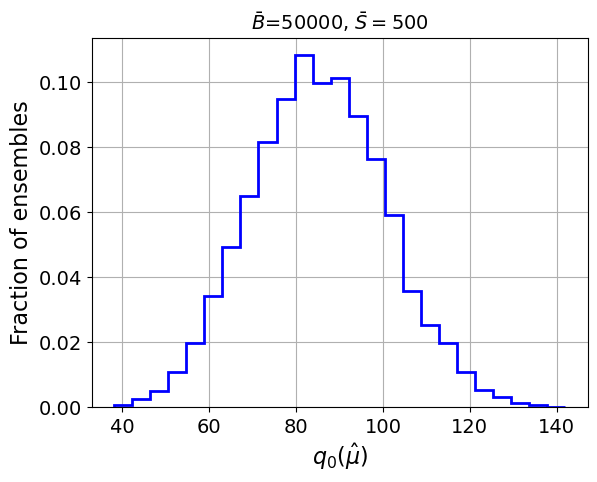

muhat mean:  0.034031227821149757
Z_gaussian:  9.21800964223669
Z_gaussian_mu0:  9.219299221814627

 ------------------------------------ 

 MLL + KDE (1ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf  1943.468127    1956.32440953  1963.40277727
  1963.76916469  1955.13440361  1938.16414874  1909.19305658
  1865.82644833  1801.42809668  1710.53216728  1582.40163589
  1410.88937328  1185.21190087   895.06808649   525.18496822
    68.02279729  -488.76766695 -1152.83360825 -2057.2920968 ]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights


KDE Kernel:  epanechnikov
Background bandwidth:  0.003030951223220623
Signal bandwidth:  0.004386370005779536


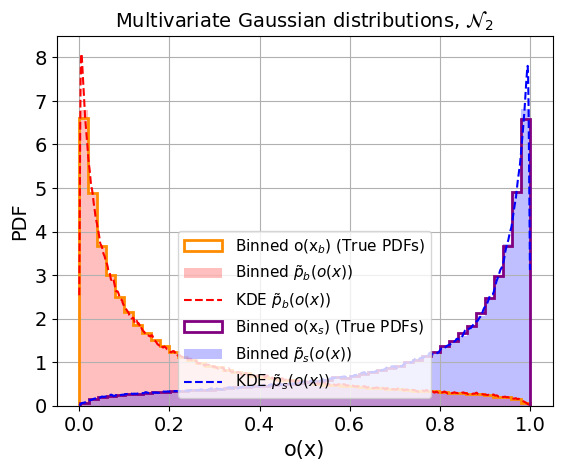

 MLL + KDE (10ML) 


/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:952: UserWarning: One or more of the test scores are non-finite: [          -inf           -inf           -inf           -inf
  1962.55963091  1952.11645308  1934.64631425  1905.99462862
  1859.85099776  1793.89191447  1700.62165523  1576.01310016
  1411.79627402  1191.94035054   907.75555593   550.77238507
   103.77882148  -445.4278622  -1112.29756876 -2039.14124701]
  warnings.warn(
/home/andres/anaconda3/lib/python3.9/site-packages/sklearn/model_selection/_search.py:961: RuntimeWarning: invalid value encountered in subtract
  (array - array_means[:, np.newaxis]) ** 2, axis=1, weights=weights


KDE Kernel:  epanechnikov
Background bandwidth:  0.004386370005779536
Signal bandwidth:  0.004386370005779536


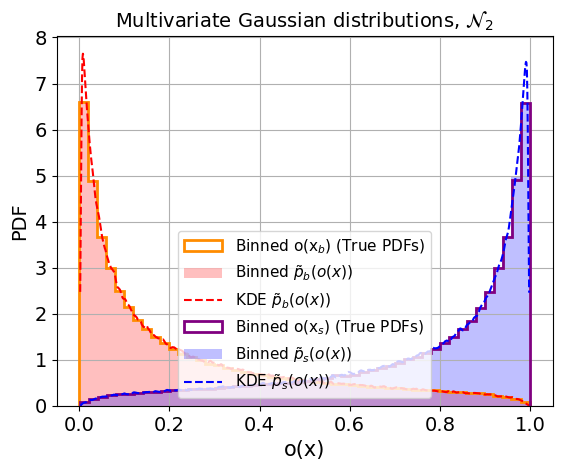

 Z MLL+KDE (1ML) 


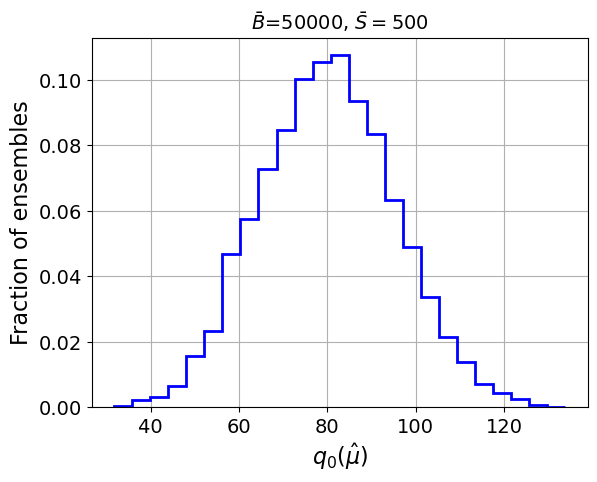

muhat mean_1ML:  0.038000608334178246
Z_KDE_1ML:  8.944238866302257
Z_KDE mu=0_1ML:  8.947021581159147

 Z MLL+KDE (10ML) 


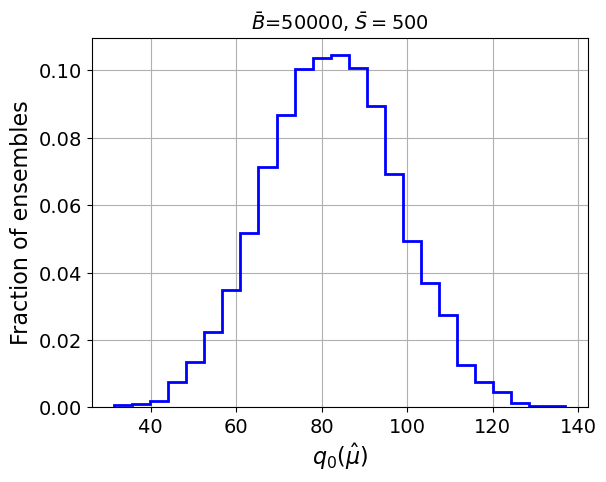

muhat mean:  0.03382338031025044
Z_KDE:  9.069281688945397
Z_KDE mu=0:  9.069478381097436

 ------------------------------------ 



In [34]:
dim=10

#######################
# generate the events #
#######################
    
mean_sig = epsilon*np.ones(dim)
mean_bkg = -1*mean_sig

#cov_sig = np.identity(dim)
cov_sig = np.identity(dim) + (0.5 * ( np.ones((dim,dim)) - np.identity(dim) ))
cov_bkg = cov_sig

signal_X_1, signal_X_2, signal_X_3, signal_X_4, signal_X_5, signal_X_6, signal_X_7, signal_X_8, signal_X_9, signal_X_10 = np.random.multivariate_normal(mean_sig, cov_sig, N).T
background_X_1, background_X_2, background_X_3, background_X_4, background_X_5, background_X_6, background_X_7, background_X_8, background_X_9, background_X_10 = np.random.multivariate_normal(mean_bkg, cov_bkg, N).T


dim1 = np.concatenate((background_X_1,signal_X_1))
dim2 = np.concatenate((background_X_2,signal_X_2))
dim3 = np.concatenate((background_X_3,signal_X_3))
dim4 = np.concatenate((background_X_4,signal_X_4))
dim5 = np.concatenate((background_X_5,signal_X_5))
dim6 = np.concatenate((background_X_6,signal_X_6))
dim7 = np.concatenate((background_X_7,signal_X_7))
dim8 = np.concatenate((background_X_8,signal_X_8))
dim9 = np.concatenate((background_X_9,signal_X_9))
dim10 = np.concatenate((background_X_10,signal_X_10))

# labels
background_Y = np.zeros(N)
signal_Y = np.ones(N)

# DATA in a single matrix (features + labels)
df = pd.DataFrame()
df['dim1'] = dim1.reshape(-1)
df['dim2'] = dim2.reshape(-1)
df['dim3'] = dim3.reshape(-1)
df['dim4'] = dim4.reshape(-1)
df['dim5'] = dim5.reshape(-1)
df['dim6'] = dim6.reshape(-1)
df['dim7'] = dim7.reshape(-1)
df['dim8'] = dim8.reshape(-1)
df['dim9'] = dim9.reshape(-1)
df['dim10'] = dim10.reshape(-1)
df['Y'] = np.concatenate((background_Y.astype('int'),signal_Y.astype('int')))

X_gauss = df[['dim1','dim2','dim3','dim4','dim5','dim6','dim7','dim8','dim9','dim10']].values 
Y_gauss = df[['Y']].values

# divide into train-val and test data samples
test_ratio = 1./3
val_ratio = 0.5

X_gauss_aux, X_gauss_test, Y_gauss_aux, Y_gauss_test = train_test_split(X_gauss,
                                                                Y_gauss,
                                                                test_size=test_ratio,
                                                                random_state=42,
                                                                #stratify = y_gauss,
                                                                shuffle=True)


X_gauss_train, X_gauss_val, Y_gauss_train, Y_gauss_val = train_test_split(X_gauss_aux,
                                                                  Y_gauss_aux,
                                                                  test_size=val_ratio,
                                                                  random_state=42,
                                                                  #stratify = y_gauss_aux,
                                                                  shuffle=True)

print('')
print('X_gauss_train : ', X_gauss_train.shape)
print('y_gauss_train : ', Y_gauss_train.shape)
print('X_gauss_val : ', X_gauss_val.shape)
print('y_gauss_val : ', Y_gauss_val.shape)
print('X_gauss_test : ', X_gauss_test.shape)
print('y_gauss_test : ', Y_gauss_test.shape)
print('')


# PLOT (only 1st feature) to visualize the data
X_gauss_test_SM = []
X_gauss_test_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] ==0:
        X_gauss_test_SM.append(X_gauss_test[i].tolist())
    else:
        X_gauss_test_NP.append(X_gauss_test[i].tolist())    


X_gauss_test_SM = np.array(X_gauss_test_SM)
X_gauss_test_NP = np.array(X_gauss_test_NP)


weights = np.ones_like(X_gauss_test_SM[:,0])/float(len(X_gauss_test_SM[:,0]))
plt.hist(X_gauss_test_SM[:,0], 20, histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(X_gauss_test_NP[:,0])/float(len(X_gauss_test_NP[:,0]))
plt.hist(X_gauss_test_NP[:,0], 20, histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$x_1$",fontsize=16)
plt.ylabel("Fraction of events",fontsize=16)
plt.grid()
plt.legend(fontsize=14)
plt.title(r"Gaussian (dim=%0.2d)" % dim,fontsize=14)
plt.show()  






################################
# the true pdfs (useful later) #
################################

sig_multi = multivariate_normal(mean_sig, cov_sig)
bkg_multi = multivariate_normal(mean_bkg, cov_bkg) 




#######################
# CLASSIFIER: XGBoost #
#######################

# only 1 ML
roc_auc_XG, y_pred_xg_1ML = XG(X_gauss_train, X_gauss_test, X_gauss_val, Y_gauss_train, Y_gauss_test, Y_gauss_val)

store_AUC.append(roc_auc_XG)


# Bagging

print('ML iteration 0')
roc_auc_XG, y_pred_xg_aux = XG(X_gauss_train[:100000], X_gauss_test, X_gauss_val, Y_gauss_train[:100000], Y_gauss_test, Y_gauss_val)
y_pred_xg_auxRE = np.reshape(y_pred_xg_aux, (1,len(y_pred_xg_aux)))

for it in range(1,iterations_ML):

    print('ML iteration ', it)
    roc_auc_XG, y_pred_xg_aux_it = XG(X_gauss_train[(100000*it):(100000*it)+100000], X_gauss_test, X_gauss_val, Y_gauss_train[(100000*it):(100000*it)+100000], Y_gauss_test, Y_gauss_val)
    
    y_pred_xg_auxRE_it = np.reshape(y_pred_xg_aux_it, (1,len(y_pred_xg_aux_it)))
    
    y_pred_xg_auxRE = np.concatenate([y_pred_xg_auxRE,y_pred_xg_auxRE_it])

# to smooth, mean of 10 predictions
y_pred_xg = np.mean(y_pred_xg_auxRE, axis=0)




########################
# CLASSIFICATION SCORE #
########################

# Outputs for validation data set

# 1 ML
pred_XG_SM_1ML = []
pred_XG_NP_1ML = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM_1ML.append(y_pred_xg_1ML[i])
    else:
        pred_XG_NP_1ML.append(y_pred_xg_1ML[i])
        
# Bagging  
pred_XG_SM = []
pred_XG_NP = []

for i in range(len(Y_gauss_test)):
    if Y_gauss_test[i] == 0:
        pred_XG_SM.append(y_pred_xg[i])
    else:
        pred_XG_NP.append(y_pred_xg[i])
        
        
print('Classification score (1 ML):')
        
weights = np.ones_like(pred_XG_SM_1ML)/float(len(pred_XG_SM_1ML))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM_1ML, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP_1ML)/float(len(pred_XG_NP_1ML))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP_1ML, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()


print('Classification score (10 ML):')
        
weights = np.ones_like(pred_XG_SM)/float(len(pred_XG_SM))
nSM, binsSM, patchesSM = plt.hist(pred_XG_SM, 50, weights=weights, range=[0,1], histtype='step', color='firebrick', linewidth=2, label='Background')

weights = np.ones_like(pred_XG_NP)/float(len(pred_XG_NP))
nNP, binsNP, patchesNP = plt.hist(pred_XG_NP, 50, weights=weights, range=[0,1], histtype='step', color='forestgreen', linewidth=2, label='Signal')

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("Classication score (10 XGBoost)",fontsize=15)
plt.ylabel("Fraction of events",fontsize=14)
plt.grid()
plt.legend(fontsize=12, loc="lower center")
plt.show()




ratio_ps_pb_true = sig_multi.pdf(X_gauss_test) / ( sig_multi.pdf(X_gauss_test) + bkg_multi.pdf(X_gauss_test) )
ratio_ps_pb_true_B = sig_multi.pdf(X_gauss_test_SM) / ( sig_multi.pdf(X_gauss_test_SM) + bkg_multi.pdf(X_gauss_test_SM) )
ratio_ps_pb_true_S = sig_multi.pdf(X_gauss_test_NP) / ( sig_multi.pdf(X_gauss_test_NP) + bkg_multi.pdf(X_gauss_test_NP) )

plt.scatter(y_pred_xg_1ML[:10000], ratio_ps_pb_true[:10000], color='green', label=r'o($\bar{x}$) (1 ML classifier)', s=10)
plt.scatter(y_pred_xg[:10000], ratio_ps_pb_true[:10000], color='blue', label=r'<o($\bar{x}$)> (10 ML classifiers)', s=10)

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel(r"o($\bar{x}$)",fontsize=15)
plt.ylabel(r"$\frac{p_s(\bar{x})}{p_s(\bar{x})+p_b(\bar{x})}$",fontsize=16)
plt.grid()
plt.legend(fontsize=11)
#plt.savefig('images/' + 'optimalclass-vs-ox.pdf', format="pdf", bbox_inches="tight")
plt.show()

print('\n ----------------------------------------- \n')






###########
# METHODS #
###########

print('B_expected: ', B_expected)
print('S_expected: ', S_expected)
print(r'S/$\sqrt{B}$: ', SsqrtB)



############################
# BINNED CLASSIFIER OUTPUT #
############################

print(' BINNED CLASSIFIER OUTPUT')

print('  BL lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins_1ML.append(Z_bins_XG_10bins_1ML)
print('Z_XG 10 bins_1ML: ', Z_bins_XG_10bins_1ML)

# 25 BINS
Z_bins_XG_25bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins_1ML.append(Z_bins_XG_25bins_1ML)
print('Z_XG 25 bins_1ML: ', Z_bins_XG_25bins_1ML)

# 50 BINS
Z_bins_XG_50bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins_1ML.append(Z_bins_XG_50bins_1ML)
print('Z_XG 50 bins_1ML: ', Z_bins_XG_50bins_1ML)

# 100 BINS
Z_bins_XG_100bins_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins_1ML.append(Z_bins_XG_100bins_1ML)
print('Z_XG 100 bins_1ML: ', Z_bins_XG_100bins_1ML)


print('\n BL non-lineal bins, 1 ML')

# 10 BINS
Z_bins_XG_10bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq_1ML.append(Z_bins_XG_10bins_eq_1ML)
print('Z_XG 10 bins_eq_1ML: ', Z_bins_XG_10bins_eq_1ML)

# 25 BINS
Z_bins_XG_25bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq_1ML.append(Z_bins_XG_25bins_eq_1ML)
print('Z_XG 25 bins_eq_1ML: ', Z_bins_XG_25bins_eq_1ML)

# 50 BINS
Z_bins_XG_50bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq_1ML.append(Z_bins_XG_50bins_eq_1ML)
print('Z_XG 50 bins_eq_1ML: ', Z_bins_XG_50bins_eq_1ML)

# 100 BINS
Z_bins_XG_100bins_eq_1ML = Z_BL_full(pred_XG_SM_1ML, pred_XG_NP_1ML, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq_1ML.append(Z_bins_XG_100bins_eq_1ML)
print('Z_XG 100 bins_eq_1ML: ', Z_bins_XG_100bins_eq_1ML)


print('\n BL lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=True)
store_Z_bins_XG_10bins.append(Z_bins_XG_10bins)
print('Z_XG 10 bins: ', Z_bins_XG_10bins)

# 25 BINS
Z_bins_XG_25bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=True)
store_Z_bins_XG_25bins.append(Z_bins_XG_25bins)
print('Z_XG 25 bins: ', Z_bins_XG_25bins)

# 50 BINS
Z_bins_XG_50bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=True)
store_Z_bins_XG_50bins.append(Z_bins_XG_50bins)
print('Z_XG 50 bins: ', Z_bins_XG_50bins)

# 100 BINS
Z_bins_XG_100bins = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=True)
store_Z_bins_XG_100bins.append(Z_bins_XG_100bins)
print('Z_XG 100 bins: ', Z_bins_XG_100bins)


print('\n BL non-lineal bins, 10 ML')

# 10 BINS
Z_bins_XG_10bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 10, [[0,1]], linear_bins=False)
store_Z_bins_XG_10bins_eq.append(Z_bins_XG_10bins_eq)
print('Z_XG 10 bins_eq: ', Z_bins_XG_10bins_eq)

# 25 BINS
Z_bins_XG_25bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 25, [[0,1]], linear_bins=False)
store_Z_bins_XG_25bins_eq.append(Z_bins_XG_25bins_eq)
print('Z_XG 25 bins_eq: ', Z_bins_XG_25bins_eq)

# 50 BINS
Z_bins_XG_50bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 50, [[0,1]], linear_bins=False)
store_Z_bins_XG_50bins_eq.append(Z_bins_XG_50bins_eq)
print('Z_XG 50 bins_eq: ', Z_bins_XG_50bins_eq)

# 100 BINS
Z_bins_XG_100bins_eq = Z_BL_full(pred_XG_SM, pred_XG_NP, B_expected, S_expected, 100, [[0,1]], linear_bins=False)
store_Z_bins_XG_100bins_eq.append(Z_bins_XG_100bins_eq)
print('Z_XG 100 bins_eq: ', Z_bins_XG_100bins_eq)


print('\n ----------------------------------------- \n')






###########################
# SET THE TOY EXPERIMENTS #
###########################

list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles = ensembler(B_expected, S_expected, n_ensembles)






###################################
# TRUE PDF LIKELIHOOD (GAUSSIANS) #
###################################

indices = [i for i in range(len(X_gauss_test_SM))]

prob_B_given_B = bkg_multi.pdf(X_gauss_test_SM)
prob_B_given_S = sig_multi.pdf(X_gauss_test_SM)



print('TRUE PDF LIKELIHOOD (GAUSSIANS):')

print('n_ensembles (initial): ', n_ensembles)

Z_gaussian, muhat_mean_gaussian, Z_gaussian_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)

# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()

store_muhat_mean_gaussian.append(muhat_mean_gaussian)
store_Z_gaussian.append(Z_gaussian)

store_Z_gaussian_mu0.append(Z_gaussian_mu0)

print('muhat mean: ', muhat_mean_gaussian)
print('Z_gaussian: ', Z_gaussian)
print('Z_gaussian_mu0: ', Z_gaussian_mu0)


print('\n ------------------------------------ \n')







#########
#  KDE  #
#########  

print(' MLL + KDE (1ML) ')

kde_bkg_1ML, kde_sig_1ML, B_bandwidth_1ML, S_bandwidth_1ML = KDE_finder(pred_XG_SM_1ML, pred_XG_NP_1ML)


# range (~between 0 and 1)
min_val_1ML = np.min([np.min(pred_XG_SM_1ML),np.min(pred_XG_NP_1ML)])
max_val_1ML = np.max([np.max(pred_XG_SM_1ML),np.max(pred_XG_NP_1ML)])

s_vals_1ML = np.linspace(min_val_1ML,max_val_1ML,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[s_vals_1ML, np.zeros(len(s_vals_1ML)) ]) )
dens_sig_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[s_vals_1ML, np.ones(len(s_vals_1ML)) ]) )



# Normalize to 1
# Area
factor_aux_SM_1ML = sum(dens_bkg_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))
factor_aux_NP_1ML = sum(dens_sig_1ML*(s_vals_1ML[1]-s_vals_1ML[0]))

# normalize
dens_bkg_1ML = dens_bkg_1ML / factor_aux_SM_1ML
dens_sig_1ML = dens_sig_1ML / factor_aux_NP_1ML





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM_1ML,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals_1ML,dens_bkg_1ML,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP_1ML,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals_1ML,dens_sig_1ML,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()





print(' MLL + KDE (10ML) ')

kde_bkg, kde_sig, B_bandwidth, S_bandwidth = KDE_finder(pred_XG_SM, pred_XG_NP)


# range (~between 0 and 1)
min_val = np.min([np.min(pred_XG_SM),np.min(pred_XG_NP)])
max_val = np.max([np.max(pred_XG_SM),np.max(pred_XG_NP)])

s_vals = np.linspace(min_val,max_val,1000)



# evaluate the densities for each value of s (~bins)
dens_bkg = np.exp(kde_bkg.score_samples(np.c_[s_vals, np.zeros(len(s_vals)) ]) )
dens_sig = np.exp(kde_sig.score_samples(np.c_[s_vals, np.ones(len(s_vals)) ]) )



# Normalize to 1
# Area
factor_aux_SM = sum(dens_bkg*(s_vals[1]-s_vals[0]))
factor_aux_NP = sum(dens_sig*(s_vals[1]-s_vals[0]))

# normalize
dens_bkg = dens_bkg / factor_aux_SM
dens_sig = dens_sig / factor_aux_NP





# plot to check the estimation

plt.figure()

plt.hist(ratio_ps_pb_true_B,density=True,bins=50,lw=2,histtype='step',color='darkorange',alpha=1,label=r'Binned o(x$_b$) (True PDFs)')
plt.hist(pred_XG_SM,density=True,bins=50,color='red',alpha=0.25,label=r'Binned $\tilde{p}_{b}(o(x))$');
plt.plot(s_vals,dens_bkg,color='red',label=r'KDE $\tilde{p}_{b}(o(x))$',linestyle='dashed');

plt.hist(ratio_ps_pb_true_S,density=True,bins=50,lw=2,histtype='step',color='purple',alpha=1,label=r'Binned o(x$_s$) (True PDFs)');
plt.hist(pred_XG_NP,density=True,bins=50,color='blue',alpha=0.25,label=r'Binned $\tilde{p}_{s}(o(x))$');
plt.plot(s_vals,dens_sig,color='blue',label=r'KDE $\tilde{p}_{s}(o(x))$',linestyle='dashed');

plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("o(x)",fontsize=15)
plt.ylabel("PDF",fontsize=14)
plt.grid()
plt.legend(loc="lower center", fontsize=11, handlelength=2.5)
plt.title(r'Multivariate Gaussian distributions, $\mathcal{N}_{2}$', fontsize=14)
#plt.savefig('images/' + '2gaussian-output.pdf', format="pdf", bbox_inches="tight")
plt.show()






#############
# MLL + KDE #
#############

print(' Z MLL+KDE (1ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM_1ML = np.exp(kde_bkg_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.zeros(len(pred_XG_SM_1ML)) ]) )
KDE_NP_pred_SM_1ML = np.exp(kde_sig_1ML.score_samples(np.c_[pred_XG_SM_1ML, np.ones(len(pred_XG_SM_1ML)) ]) )

# Normalize

KDE_SM_pred_SM_1ML = KDE_SM_pred_SM_1ML / factor_aux_SM_1ML
KDE_NP_pred_SM_1ML = KDE_NP_pred_SM_1ML / factor_aux_NP_1ML


indices_1ML = [i for i in range(len(KDE_NP_pred_SM_1ML))]

prob_B_given_B_1ML = KDE_SM_pred_SM_1ML
prob_B_given_S_1ML = KDE_NP_pred_SM_1ML

Z_KDE_1ML, muhat_mean_MLL_KDE_1ML, Z_KDE_mu0_1ML, muhat_selected_list_1ML, q_muhat_1ML, q_muhat_mu0_1ML = Z_MLL(B_expected, S_expected, prob_B_given_B_1ML, prob_B_given_S_1ML, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat_1ML)/float(len(q_muhat_1ML))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat_1ML, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE_1ML.append(muhat_mean_MLL_KDE_1ML)
store_Z_MLL_KDE_1ML.append(Z_KDE_1ML)

store_Z_MLL_KDE_mu0_1ML.append(Z_KDE_mu0_1ML)

print('muhat mean_1ML: ', muhat_mean_MLL_KDE_1ML)
print('Z_KDE_1ML: ', Z_KDE_1ML)
print('Z_KDE mu=0_1ML: ', Z_KDE_mu0_1ML)



print('\n Z MLL+KDE (10ML) ')
# FOR EXCLUSION:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND EVENTS

# FOR DISCOVERY:
# we need to evaluate the KDE densities with the classifier output of BACKGROUND and SIGNAL EVENTS

KDE_SM_pred_SM = np.exp(kde_bkg.score_samples(np.c_[pred_XG_SM, np.zeros(len(pred_XG_SM)) ]) )
KDE_NP_pred_SM = np.exp(kde_sig.score_samples(np.c_[pred_XG_SM, np.ones(len(pred_XG_SM)) ]) )

# Normalize

KDE_SM_pred_SM = KDE_SM_pred_SM / factor_aux_SM
KDE_NP_pred_SM = KDE_NP_pred_SM / factor_aux_NP


indices = [i for i in range(len(KDE_NP_pred_SM))]

prob_B_given_B = KDE_SM_pred_SM
prob_B_given_S = KDE_NP_pred_SM

Z_KDE, muhat_mean_MLL_KDE, Z_KDE_mu0, muhat_selected_list, q_muhat, q_muhat_mu0 = Z_MLL(B_expected, S_expected, prob_B_given_B, prob_B_given_S, list_events_per_ensembles, list_nums_ensembles, list_B_per_ensembles, list_S_per_ensembles)
    
    
# Histogram of q_muhats

weights = np.ones_like(q_muhat)/float(len(q_muhat))
nMIX, binsMIX, patchesMIX = plt.hist(q_muhat, 25, weights=weights, histtype='step', color='blue', linewidth=2)
#plt.xlim(0,1)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.xlabel("$q_0(\hat{\mu})$",fontsize=16)
plt.ylabel("Fraction of ensembles",fontsize=16)
plt.title(r"$\bar{B}$=%0.2i, $\bar{S}=$%0.2i" % (B_expected,S_expected),fontsize=14)
plt.grid()
#plt.legend(fontsize=14)
plt.show()


store_muhat_mean_MLL_KDE.append(muhat_mean_MLL_KDE)
store_Z_MLL_KDE.append(Z_KDE)

store_Z_MLL_KDE_mu0.append(Z_KDE_mu0)

print('muhat mean: ', muhat_mean_MLL_KDE)
print('Z_KDE: ', Z_KDE)
print('Z_KDE mu=0: ', Z_KDE_mu0)

print('\n ------------------------------------ \n')

In [35]:
print(store_AUC)

print(store_Z_bins_XG_10bins_1ML)
print(store_Z_bins_XG_25bins_1ML)
print(store_Z_bins_XG_50bins_1ML)
print(store_Z_bins_XG_100bins_1ML)

print(store_Z_bins_XG_10bins_eq_1ML)
print(store_Z_bins_XG_25bins_eq_1ML)
print(store_Z_bins_XG_50bins_eq_1ML)
print(store_Z_bins_XG_100bins_eq_1ML)

print(store_Z_bins_XG_10bins)
print(store_Z_bins_XG_25bins)
print(store_Z_bins_XG_50bins)
print(store_Z_bins_XG_100bins)

print(store_Z_bins_XG_10bins_eq)
print(store_Z_bins_XG_25bins_eq)
print(store_Z_bins_XG_50bins_eq)
print(store_Z_bins_XG_100bins_eq)

print(store_muhat_mean_gaussian)
print(store_Z_gaussian)
print(store_Z_gaussian_mu0)

print(store_muhat_mean_MLL_KDE)
print(store_Z_MLL_KDE)
print(store_Z_MLL_KDE_mu0)

print(store_muhat_mean_MLL_KDE_1ML)
print(store_Z_MLL_KDE_1ML)
print(store_Z_MLL_KDE_mu0_1ML)

[0.8385306686852648, 0.8732662228764819, 0.8868134564279, 0.8938052747379017, 0.8987618851702135, 0.9023271550076978, 0.9040373354160876, 0.9061631583672309, 0.9074804427052564, 0.9083788872776293]
[4.914428305158582, 5.853246697629005, 6.249923275592657, 6.483309027386618, 6.662099302715966, 6.773103746624184, 6.867687360920723, 6.90634701927205, 7.00749259693365, 7.034491922016256]
[5.24823738098374, 6.428058608219332, 7.028357293788718, 7.375792200660377, 7.55355096892089, 7.696507709928942, 7.86823622763364, 7.90580333739146, 8.035486212877306, 8.02458430231729]
[5.357597913962326, 6.697224222179377, 7.308031601210633, 7.746639179303208, 7.974515656228193, 8.114033062601717, 8.26981601759772, 8.430310849983073, 8.448753975050895, 8.538091180134105]
[5.371293762885221, 6.804668445824279, 7.420712928462088, 7.934154320798844, 8.143793585930203, 8.389740072395037, 8.458563397862104, 8.713964310746569, 8.711911794028742, 8.810749904453537]
[4.066040684545487, 4.550495683671151, 4.75171

In [84]:
store_AUC = [0.8385306686852648, 0.8732662228764819, 0.8868134564279, 0.8938052747379017, 0.8987618851702135, 0.9023271550076978, 0.9040373354160876, 0.9061631583672309, 0.9074804427052564, 0.9083788872776293]

store_Z_bins_XG_10bins_1ML = [4.914428305158582, 5.853246697629005, 6.249923275592657, 6.483309027386618, 6.662099302715966, 6.773103746624184, 6.867687360920723, 6.90634701927205, 7.00749259693365, 7.034491922016256]
store_Z_bins_XG_25bins_1ML = [5.24823738098374, 6.428058608219332, 7.028357293788718, 7.375792200660377, 7.55355096892089, 7.696507709928942, 7.86823622763364, 7.90580333739146, 8.035486212877306, 8.02458430231729]
store_Z_bins_XG_50bins_1ML = [5.357597913962326, 6.697224222179377, 7.308031601210633, 7.746639179303208, 7.974515656228193, 8.114033062601717, 8.26981601759772, 8.430310849983073, 8.448753975050895, 8.538091180134105]
store_Z_bins_XG_100bins_1ML = [5.371293762885221, 6.804668445824279, 7.420712928462088, 7.934154320798844, 8.143793585930203, 8.389740072395037, 8.458563397862104, 8.713964310746569, 8.711911794028742, 8.810749904453537]

store_Z_bins_XG_10bins_eq_1ML = [4.066040684545487, 4.550495683671151, 4.751711089106676, 4.872929790940069, 4.943525633968998, 5.003341595619298, 5.037398472408256, 5.051559863454214, 5.05248104604866, 5.114874704920877]
store_Z_bins_XG_25bins_eq_1ML = [4.513734739467205, 5.272785718988348, 5.5904498382821535, 5.794599481744052, 5.915473169897974, 6.009103458323454, 6.078595867425418, 6.09784215108679, 6.122701659195182, 6.1975549903937415]
store_Z_bins_XG_50bins_eq_1ML = [4.776421272629951, 5.697424812982663, 6.1036652028325395, 6.377926579191114, 6.533154860431133, 6.656101330947932, 6.772783869349841, 6.773630730838618, 6.824331647120481, 6.9235356770287675]
store_Z_bins_XG_100bins_eq_1ML = [4.99649228165184, 6.039107510205195, 6.539558086277514, 6.851893640400801, 7.04345916225164, 7.183234766432677, 7.336406342789142, 7.34363505267338, 7.404853238845546, 7.522832494515497]

store_Z_bins_XG_10bins = [4.935622794786928, 5.871298308093088, 6.278620138619649, 6.5376950717840305, 6.709297006234071, 6.828652929164154, 6.961206981876469, 6.98412842730722, 7.068466423233838, 7.106459562777205]
store_Z_bins_XG_25bins = [5.2532101527845585, 6.495471048920689, 7.076088010630205, 7.425756169745528, 7.629285693298025, 7.7963923505902075, 7.917047774437447, 7.991421237712003, 8.103598687830237, 8.109500432503983]
store_Z_bins_XG_50bins = [5.364948645701784, 6.722010118926525, 7.3837575428649185, 7.858192437973806, 8.084925384886448, 8.202236815169318, 8.32287170951484, 8.514973016228998, 8.534830287104576, 8.631014610896075]
store_Z_bins_XG_100bins = [5.3911780918688885, 6.792546360582067, 7.486597066245859, 7.9789217144846685, 8.209474959358708, 8.446104287940882, 8.557278051800182, 8.74751352424288, 8.759383758962032, 8.88016465407623]

store_Z_bins_XG_10bins_eq = [4.074841059679209, 4.552354208578955, 4.759520370806363, 4.874156573556178, 4.942769073560302, 5.018611950435621, 5.0414753593305806, 5.069924593883026, 5.070584010898985, 5.115129089588995]
store_Z_bins_XG_25bins_eq = [4.525236586734685, 5.263691562062334, 5.601704279818991, 5.800534497707283, 5.912566136407904, 6.0321834580453535, 6.083329547298109, 6.1285694447929595, 6.154164161688546, 6.200907796660388]
store_Z_bins_XG_50bins_eq = [4.788796262305323, 5.700224031220289, 6.114580953796853, 6.37936129748397, 6.532990349703435, 6.686577189153565, 6.7831030323622405, 6.815588395269349, 6.85944147652349, 6.9352256070419855]
store_Z_bins_XG_100bins_eq = [4.9974480502371375, 6.038477724351157, 6.553176851041445, 6.86478877354213, 7.054910671944802, 7.2274502303966415, 7.3474521270682045, 7.389806772513637, 7.449046911817511, 7.522986440530359]

store_muhat_mean_gaussian = [0.11623745310757376, 0.06529453513129879, 0.053016323633782836, 0.043622630031430604, 0.057401399168609965, 0.05906417925580453, 0.04763763560782724, 0.02950420764473284, 0.027831288654567576, 0.034031227821149757]
store_Z_gaussian = [5.424191589128489, 6.816010860942129, 7.7004787265938885, 8.164445573202427, 8.39088479663419, 8.68744278967418, 8.85018302523747, 9.000616457974868, 9.132468770069786, 9.21800964223669]
store_Z_gaussian_mu0 = [5.116951421067932, 6.814221099577306, 7.701193927339663, 8.166688698335594, 8.278197257123463, 8.367207179685511, 8.84057553676431, 9.00197593590104, 9.332884952180178, 9.219299221814627]

store_muhat_mean_MLL_KDE = [0.04158471053432018, 0.051738821859474815, 0.05209368346344925, 0.03698671803710839, 0.038984081922336, 0.03710838487275677, 0.038710331542127135, 0.039222346142147424, 0.030888167900233198, 0.03382338031025044]
store_Z_MLL_KDE = [5.307548461815864, 6.806105427021221, 7.6108857152186715, 8.104546077487856, 8.295294027552899, 8.545960101490621, 8.705820367760372, 8.934711845006143, 8.995454885223063, 9.069281688945397]
store_Z_MLL_KDE_mu0 = [5.307548461815864, 6.806729471523131, 7.612417915814399, 8.168851382874385, 8.295850916060717, 8.547240987777704, 8.706961205604728, 8.937894356957184, 8.995744017933482, 9.069478381097436]

store_muhat_mean_MLL_KDE_1ML = [0.04484943729088513, 0.19309033762546896, 0.05097333468518707, 0.04667950927709622, 0.04501165973841631, 0.036317550441042276, 0.04057588968873568, 0.03326067119537666, 0.032895670688431515, 0.038000608334178246]
store_Z_MLL_KDE_1ML = [5.383449033569733, 6.625691920247131, 7.540776850082608, 8.032174958042292, 8.342417859766183, 8.582201860219122, 8.667530497735612, 8.901197029028662, 8.980607829529596, 8.944238866302257]
store_Z_MLL_KDE_mu0_1ML = [5.383449033569733, 6.604542297647804, 7.541886958129575, 8.032812290131178, 8.345108450729795, 8.583218501023197, 8.668834858531746, 8.902132474320274, 8.980640486478533, 8.947021581159147]

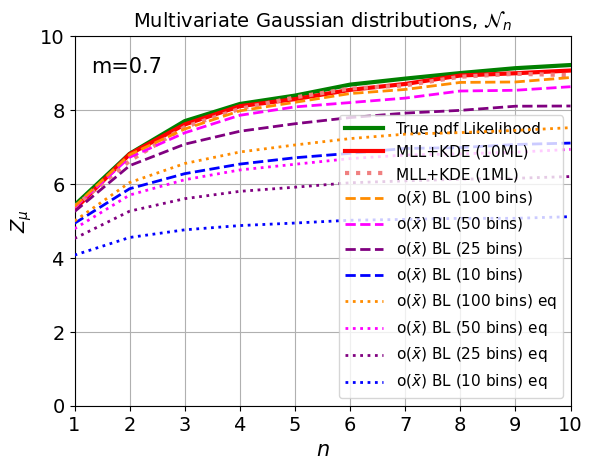

In [109]:
#########
# PLOTS #
#########

dim = [1,2,3,4,5,6,7,8,9,10]

plt.figure()
lw = 2

plt.plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
plt.plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
plt.plot(dim, store_Z_MLL_KDE_1ML, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
#plt.plot(dim, store_Z_MLL_KDE_mu0, ':', color='gray', lw=3, label=r'KDE (MLL) mu=0', zorder=5 )
plt.plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 bins)' ,zorder=10)
plt.plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 bins)' ,zorder=5)
plt.plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 bins)' ,zorder=5)
plt.plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 bins)' ,zorder=5)

plt.plot(dim, store_Z_bins_XG_100bins_eq, ':', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 bins) eq' ,zorder=10)
plt.plot(dim, store_Z_bins_XG_50bins_eq, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 bins) eq' ,zorder=5)
plt.plot(dim, store_Z_bins_XG_25bins_eq, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 bins) eq' ,zorder=5)
plt.plot(dim, store_Z_bins_XG_10bins_eq, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 bins) eq' ,zorder=5)


plt.xlim([1, 10])
plt.ylim([0., 10])
#plt.yscale('log')
plt.text(1.3, 9, 'm=0.7', fontsize = 15)
plt.xlabel('$n$', fontsize=15)
plt.ylabel('$Z_{\mu}$', fontsize=14)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
#plt.axhline(y=SsqrtB, color='black', linestyle=':')#, label=r'$S/\sqrt{B}$, WP=0')
plt.grid()
plt.title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
plt.legend(loc="lower right", fontsize=11, handlelength=2.5)
#plt.savefig('images/' + '2gaussian-Z-dims-m07.pdf', format="pdf", bbox_inches="tight")
plt.show()

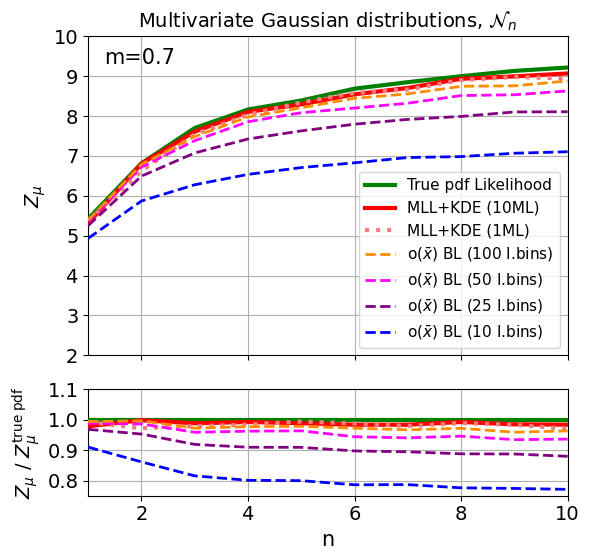

In [110]:
fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
axs[0].plot(dim, store_Z_MLL_KDE_1ML, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins)' ,zorder=10)
axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins)' ,zorder=5)
axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins)' ,zorder=5)
axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins)' ,zorder=5)
# axs[0].plot(dim, store_Z_bins_XG_100bins_eq, ':', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 bins) eq' ,zorder=10)
# axs[0].plot(dim, store_Z_bins_XG_50bins_eq, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 bins) eq' ,zorder=5)
# axs[0].plot(dim, store_Z_bins_XG_25bins_eq, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 bins) eq' ,zorder=5)
# axs[0].plot(dim, store_Z_bins_XG_10bins_eq, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 bins) eq' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
store_Z_MLL_KDE_1ML_norm = [ a/b for a, b in zip(store_Z_MLL_KDE_1ML,store_Z_gaussian)]
store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
# store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
# store_Z_bins_XG_50bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins_eq,store_Z_gaussian)]
# store_Z_bins_XG_25bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins_eq,store_Z_gaussian)]
# store_Z_bins_XG_10bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins_eq,store_Z_gaussian)]
dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 l.bins)' ,zorder=10)
axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 l.bins)' ,zorder=5)
axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 l.bins)' ,zorder=5)
axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 l.bins)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_100bins_eq_norm, ':', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 bins) eq' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_eq_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 bins) eq' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_eq_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 bins) eq' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_10bins_eq_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 bins) eq' ,zorder=5)




axs[0].text(1.3, 9.3, 'm=0.7', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([2, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.75,1.1])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.8,0.9,1,1.1])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=11)
plt.tight_layout()
plt.savefig('images/' + '2gaussian-Z-dims-m07-cov.pdf', format="pdf", bbox_inches="tight")
plt.show()

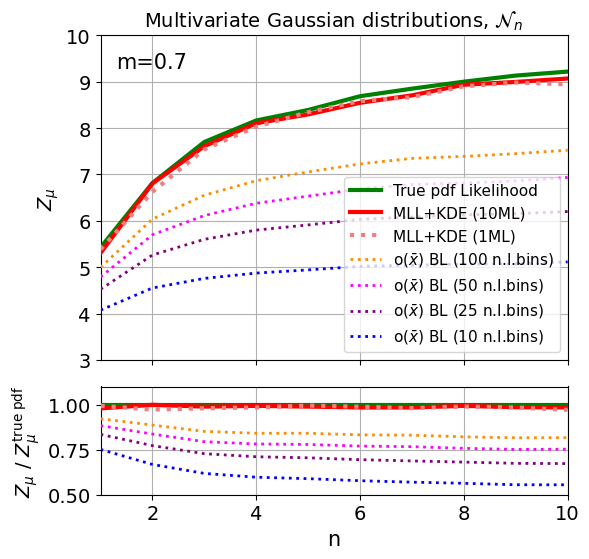

In [111]:
fig, axs = plt.subplots(2,1,figsize=(6,5.7), gridspec_kw={'height_ratios': [3, 1]})

lw = 2

axs[0].plot(dim, store_Z_gaussian, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[0].plot(dim, store_Z_MLL_KDE, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
axs[0].plot(dim, store_Z_MLL_KDE_1ML, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
# axs[0].plot(dim, store_Z_bins_XG_100bins, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 bins)' ,zorder=10)
# axs[0].plot(dim, store_Z_bins_XG_50bins, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 bins)' ,zorder=5)
# axs[0].plot(dim, store_Z_bins_XG_25bins, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 bins)' ,zorder=5)
# axs[0].plot(dim, store_Z_bins_XG_10bins, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 bins)' ,zorder=5)
axs[0].plot(dim, store_Z_bins_XG_100bins_eq, ':', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 n.l.bins)' ,zorder=10)
axs[0].plot(dim, store_Z_bins_XG_50bins_eq, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 n.l.bins)' ,zorder=5)
axs[0].plot(dim, store_Z_bins_XG_25bins_eq, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 n.l.bins)' ,zorder=5)
axs[0].plot(dim, store_Z_bins_XG_10bins_eq, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 n.l.bins)' ,zorder=5)


store_Z_gaussian_norm = [ a/b for a, b in zip(store_Z_gaussian,store_Z_gaussian)]
store_Z_MLL_KDE_norm = [ a/b for a, b in zip(store_Z_MLL_KDE,store_Z_gaussian)]
# store_Z_bins_XG_100bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins,store_Z_gaussian)]
# store_Z_bins_XG_50bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins,store_Z_gaussian)]
# store_Z_bins_XG_25bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins,store_Z_gaussian)]
# store_Z_bins_XG_10bins_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins,store_Z_gaussian)]
store_Z_bins_XG_100bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_100bins_eq,store_Z_gaussian)]
store_Z_bins_XG_50bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_50bins_eq,store_Z_gaussian)]
store_Z_bins_XG_25bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_25bins_eq,store_Z_gaussian)]
store_Z_bins_XG_10bins_eq_norm = [ a/b for a, b in zip(store_Z_bins_XG_10bins_eq,store_Z_gaussian)]
dim_norm = [ a/b for a, b in zip(dim,store_Z_gaussian)]


axs[1].plot(dim, store_Z_gaussian_norm, '-', color='green', lw=3, label=r'True pdf Likelihood' ,zorder=5)
axs[1].plot(dim, store_Z_MLL_KDE_norm, '-', color='red', lw=3, label=r'MLL+KDE (10ML)', zorder=5 )
axs[1].plot(dim, store_Z_MLL_KDE_1ML_norm, ':', color='lightcoral', lw=3, label=r'MLL+KDE (1ML)', zorder=5 )
# axs[1].plot(dim, store_Z_bins_XG_100bins_norm, '--', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 bins)' ,zorder=10)
# axs[1].plot(dim, store_Z_bins_XG_50bins_norm, '--', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 bins)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_25bins_norm, '--', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 bins)' ,zorder=5)
# axs[1].plot(dim, store_Z_bins_XG_10bins_norm, '--', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 bins)' ,zorder=5)
axs[1].plot(dim, store_Z_bins_XG_100bins_eq_norm, ':', color='darkorange', lw=2, label=r'o$(\bar{x})$ BL (100 bins) eq' ,zorder=10)
axs[1].plot(dim, store_Z_bins_XG_50bins_eq_norm, ':', color='magenta', lw=2, label=r'o$(\bar{x})$ BL (50 bins) eq' ,zorder=5)
axs[1].plot(dim, store_Z_bins_XG_25bins_eq_norm, ':', color='purple', lw=2, label=r'o$(\bar{x})$ BL (25 bins) eq' ,zorder=5)
axs[1].plot(dim, store_Z_bins_XG_10bins_eq_norm, ':', color='blue', lw=2, label=r'o$(\bar{x})$ BL (10 bins) eq' ,zorder=5)




axs[0].text(1.3, 9.3, 'm=0.7', fontsize = 15)


axs[0].set_xlim([1, 10])
axs[0].set_ylim([3, 10])
axs[1].set_xlim([1, 10])
axs[1].set_ylim([0.5,1.1])
axs[0].set_ylabel('$Z_{\mu}$', fontsize=14)
axs[1].set_xlabel('n', fontsize=15)
axs[1].set_ylabel(r'$Z_{\mu}$ / $Z_{\mu}^{\mathrm{true \; pdf}}$', fontsize=14)

axs[0].yaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_tick_params(labelsize=14)
axs[0].xaxis.set_ticklabels([])
axs[1].yaxis.set_ticks([0.5,0.75,1])
axs[1].xaxis.set_tick_params(labelsize=14)
axs[1].yaxis.set_tick_params(labelsize=14)

axs[0].grid()
axs[1].grid()

axs[0].set_title('Multivariate Gaussian distributions, $\mathcal{N}_{n}$', fontsize=14)
axs[0].legend(loc="lower right", fontsize=11)
plt.tight_layout()
#plt.savefig('images/' + '2gaussian-Z-dims-m07-cov.pdf', format="pdf", bbox_inches="tight")
plt.show()